# B-TabPFN for Concurrent Student-Support Screening at KNUST

## Final technical closeout analysis

This notebook reproduces the submitted analysis and completes the prespecified closeout checks. The predictive protocol remains version 6.13.0. Revision 6.14 adds reporting corrections and a separately labelled ten-seed sensitivity analysis; it does not change the primary target, predictors, partition, model-selection rules, operating threshold, final B-TabPFN model or FSII protocol.


## Persistent private storage

Google Drive stores the restricted computation checkpoints needed to continue the reproducible analysis across Colab sessions. Row-level predictions, context membership and individual explanations remain private and are excluded from the public evidence package. A saved checkpoint is accepted only after validation against the current data, partition, model, protocol, case, prediction and explanation schema.


In [1]:
from pathlib import Path
import sys

if "google.colab" in sys.modules:
    from google.colab import drive
    drive.mount("/content/drive")
    PERSISTENT_PRIVATE_ROOT = Path("/content/drive/MyDrive/KNUST_BTabPFN_private/v6_13")
else:
    PERSISTENT_PRIVATE_ROOT = Path("artifacts_v6_13/restricted/persistent_checkpoints")
PERSISTENT_PRIVATE_ROOT.mkdir(parents=True, exist_ok=True)
print("Restricted checkpoint storage:", PERSISTENT_PRIVATE_ROOT)


# A submission run requires the complete validated checkpoint set. This preserves
# the computational protocol and prevents an incomplete analysis from proceeding.
CHECKPOINT_REUSE_POLICY = "require_complete_for_submission_rerun"
EXPECTED_PRIMARY_FSII_PROTOCOL_PREFIX = "2700a1b0c9e783b1cbbf"
EXPECTED_THEORY_FSII_PROTOCOL_PREFIX = "ca756953ea5a57781799"
expected_checkpoint_directories = {
    "pilot": PERSISTENT_PRIVATE_ROOT / "fsii" / EXPECTED_PRIMARY_FSII_PROTOCOL_PREFIX / "pilot",
    "primary": PERSISTENT_PRIVATE_ROOT / "fsii" / EXPECTED_PRIMARY_FSII_PROTOCOL_PREFIX / "production",
    "theory": PERSISTENT_PRIVATE_ROOT / "fsii_theory" / EXPECTED_THEORY_FSII_PROTOCOL_PREFIX,
}
expected_checkpoint_counts = {"pilot": 6, "primary": 32, "theory": 32}
checkpoint_inventory = {
    name: len(list(directory.glob("*.parquet"))) if directory.exists() else 0
    for name, directory in expected_checkpoint_directories.items()
}
incomplete_checkpoint_groups = {
    name: {"found": checkpoint_inventory[name], "expected": expected_checkpoint_counts[name]}
    for name in expected_checkpoint_counts
    if checkpoint_inventory[name] != expected_checkpoint_counts[name]
}
if CHECKPOINT_REUSE_POLICY == "require_complete_for_submission_rerun" and incomplete_checkpoint_groups:
    raise RuntimeError(
        "The complete private FSII checkpoint set was not found. Restore the original "
        "KNUST_BTabPFN_private/v6_13 directory before running the submission notebook. "
        f"Inventory: {incomplete_checkpoint_groups}. No FSII computation has been started."
    )
print("Required checkpoint inventory located:", checkpoint_inventory)


Mounted at /content/drive
Restricted checkpoint storage: /content/drive/MyDrive/KNUST_BTabPFN_private/v6_13
Required checkpoint inventory located: {'pilot': 6, 'primary': 32, 'theory': 32}


## 0. Colab setup

Use a T4 GPU runtime with the stated Python 3.12 runtime version. Store the TabPFN credential in Colab Secrets as `TABPFN_TOKEN`; never paste it into this notebook. The analysis packages are intentionally pinned. Resolver messages concerning unused Colab base packages are retained in the environment log; the notebook separately verifies the exact imported research stack and executes a GPU TabPFN integration probe. Do not change package versions during the analysis.


In [2]:
# Required runtime: Runtime > Change runtime type > Runtime Version 2026.07 (Python 3.12.13) + T4 GPU.
import subprocess
import sys
from pathlib import Path

print("Python:", sys.version)
if sys.version_info[:2] != (3, 12):
    raise RuntimeError("Select Colab runtime 2026.07 with Python 3.12 before installing the locked environment.")

packages = [
    "setuptools<82", "requests==2.32.4", "jedi>=0.16", "tabpfn==2.2.1",
    "shapiq==1.4.1", "xgboost==2.0.3", "statsmodels==0.14.6",
    "scikit-learn==1.4.2", "pyarrow==17.0.0", "ucimlrepo==0.0.7",
]
command = [
    sys.executable, "-m", "pip", "install", "--only-binary=:all:",
    "--upgrade-strategy", "only-if-needed", *packages,
]
completed = subprocess.run(command, capture_output=True, text=True, check=False)
install_log = "COMMAND: " + " ".join(command) + "\n\nSTDOUT\n" + completed.stdout + "\nSTDERR\n" + completed.stderr
Path("v6_13_package_install.log").write_text(install_log, encoding="utf-8")
if completed.returncode != 0:
    print(install_log)
    raise RuntimeError(f"Locked package installation failed with exit code {completed.returncode}.")
print("Locked research packages installed. The complete installer log is retained for provenance.")
print("If Colab requests a restart, restart once and rerun from the first notebook cell so Drive and configuration state are restored.")


Python: 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]
Locked research packages installed. The complete installer log is retained for provenance.
If Colab requests a restart, restart once and rerun from the first notebook cell so Drive and configuration state are restored.


In [3]:
from __future__ import annotations

import copy
import gc
import hashlib
import json
import math
import os
import platform
import random
import re
import sys
import time
import unicodedata
import warnings
from collections import Counter
from contextlib import contextmanager
from dataclasses import dataclass
from datetime import datetime, timezone
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
import seaborn as sns
import sklearn
import statsmodels
import xgboost as xgb
from scipy.stats import fisher_exact, spearmanr, t as student_t, wilcoxon
from sklearn.base import clone
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.exceptions import ConvergenceWarning
from sklearn.inspection import permutation_importance
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, average_precision_score, brier_score_loss,
    confusion_matrix, f1_score, fbeta_score, precision_score,
    recall_score, roc_auc_score,
)
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.svm import SVC
from statsmodels.stats.contingency_tables import mcnemar
from statsmodels.stats.proportion import proportion_confint

import torch
from tabpfn import TabPFNClassifier

try:
    from tabpfn.constants import ModelVersion
except ImportError:
    ModelVersion = None

# Do not globally expose third-party deprecations. Every analysis component captures,
# classifies and counts warnings in warning_ledger.csv without flooding notebook output.
warnings.resetwarnings()
warnings.filterwarnings(
    "ignore",
    message=r"datetime\.datetime\.utcnow\(\) is deprecated.*",
    category=DeprecationWarning,
    module=r"jupyter_client\.session",
)
pd.set_option("display.max_columns", 30)
pd.set_option("display.width", 150)
pd.set_option("display.max_rows", 20)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
if DEVICE != "cuda":
    raise RuntimeError("Select a Colab GPU runtime before executing the research analysis.")

# Colab Secret -> environment. The token value is never printed or written.
TOKEN_SOURCE = "environment" if os.environ.get("TABPFN_TOKEN") else "absent"
try:
    from google.colab import errors as colab_errors, userdata
except ImportError:
    colab_errors = None
    userdata = None

if userdata is not None and not os.environ.get("TABPFN_TOKEN"):
    try:
        _secret_token = userdata.get("TABPFN_TOKEN")
    except colab_errors.SecretNotFoundError as exc:
        raise RuntimeError("Create a Colab Secret named TABPFN_TOKEN and grant this notebook access.") from exc
    if _secret_token:
        os.environ["TABPFN_TOKEN"] = _secret_token
        TOKEN_SOURCE = "colab_secret"

if userdata is not None and not os.environ.get("TABPFN_TOKEN"):
    raise RuntimeError("TABPFN_TOKEN was not found. Add it under Colab Secrets; never paste it into a cell.")

MODELLING_CODE_SHA256 = "c658251aa8a53f85d6241ee4b522a619d1509fa8cc207d9b8afcb86567b37751"
FSII_CODE_SHA256 = "9c14b7b63e9958b1bc02daa61167db331fd6642f71003ad045c33386cdb27de5"
CHECKPOINT_VALIDATION_CODE_SHA256 = "8889e202fd635a0b6b538e2abf05961629e30e41e37df2ff5530cee4e5914da2"

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

CONFIG = {
    "notebook_version": "6.13.0",
    "primary_target": "any_withdrawal_consideration",
    "target_population": "KNUST undergraduate students",
    "recruitment_frame": "Students reached through lecture-room outreach, hall and hostel visits, and student WhatsApp networks",
    "analytic_scope": "undergraduate_only",
    "test_partition_role": "held_out_secondary_evaluation",
    "test_size": 0.20,
    "split_seed": 42,
    "cv_splits": 10,
    "cv_seed": 42,
    "inner_cv_splits": 5,
    "permutation_repeats": 20,
    "permutation_share_threshold": 0.05,
    "feature_selection_cutoff_sensitivity": [0.025, 0.05, 0.10],
    "feature_selection_role": "secondary sensitivity only; primary analysis retains all prespecified predictors",
    "k_candidates": [1, 5, 10, 15, 20],
    "k_selection_rule": "smallest K within one standard error of the best mean development F2",
    "best_mean_k_reporting_rule": "highest mean development F2, then recall, then smaller K; reported as a sensitivity",
    "k_selection_metric": "F2_at_0.50",
    "primary_threshold": 0.50,
    "threshold_grid": [round(x, 2) for x in np.arange(0.01, 1.00, 0.01)],
    "threshold_selection_rule": "maximum development-OOF F2, then recall, then proximity to 0.50, then lower threshold",
    "threshold_boundary_policy": "report boundary status; 0.01-to-0.99 grid spans the full non-degenerate score range",
    "context_seed": 42,
    "stability_seeds": [1, 7, 21, 42, 99],
    "remediation_seeds": [1, 7, 21, 42, 99],
    "ablation_k_values": [1, 20],
    "minority_prevalence_grid": ["natural", 0.40, 0.50],
    "uci_seeds": [1, 7, 21, 42, 99],
    "sd_ddof": 1,
    "min_subgroup_positive": 5,
    "min_subgroup_negative": 5,
    "eod_review_threshold": 0.20,
    "public_min_cell": 5,
    "calibration_method": "isotonic fitted to fixed-K development OOF scores; secondary held-out diagnostic",
    "calibration_role": "secondary diagnostic; not automatically adopted for deployment",
    "max_feature_missing": 2,
    "run_stability": True,
    "run_fsii": True,
    "run_theory_attribution_sensitivity": True,
    "run_full_remediation_grid": True,
    "run_nested_feature_selection_sensitivity": True,
    "fsii_budget_ladder": [512, 1024],
    "fsii_convergence_quantiles": [0.20, 0.50, 0.80],
    "fsii_min_spearman": 0.90,
    "fsii_min_top5_overlap": 4,
    "fsii_min_interaction_spearman": 0.80,
    "fsii_min_top5_interaction_overlap": 3,
    "fsii_max_pilot_jobs": 6,
    "fsii_max_primary_jobs": 32,
    "fsii_max_theory_jobs": 32,
    "fsii_max_normalized_mae": 0.20,
    "fsii_max_reconstruction_error": 0.02,
    "fsii_prediction_target": "positive_class_probability_of_exact_final_model",
    "fsii_checkpoint_protocol_version": "3.0",
    "run_uci": True,
    "population_reference_required_for_q2_completion": True,
    "population_reference_collection_years": ["2025/2026", "2025-2026", "2026"],
    "checkpoint_contract_version": "3.0",
}

ARTIFACT_DIR = Path("artifacts_v6_14_closeout")
RESTRICTED_DIR = ARTIFACT_DIR / "restricted"
FIGURE_DIR = ARTIFACT_DIR / "figures"
FSII_JOB_DIR = RESTRICTED_DIR / "fsii_jobs"
THEORY_FSII_JOB_DIR = RESTRICTED_DIR / "theory_fsii_jobs"
CHECKPOINT_DIR = RESTRICTED_DIR / "checkpoints"
QC_DIR = ARTIFACT_DIR / "quality_control"
for directory in [ARTIFACT_DIR, RESTRICTED_DIR, FIGURE_DIR, FSII_JOB_DIR, THEORY_FSII_JOB_DIR, CHECKPOINT_DIR, QC_DIR]:
    directory.mkdir(parents=True, exist_ok=True)

def utc_now():
    return datetime.now(timezone.utc).isoformat()

def atomic_csv(frame, path, index=False):
    path = Path(path); path.parent.mkdir(parents=True, exist_ok=True)
    tmp = path.with_suffix(path.suffix + ".tmp")
    frame.to_csv(tmp, index=index); os.replace(tmp, path)

def atomic_parquet(frame, path):
    path = Path(path); path.parent.mkdir(parents=True, exist_ok=True)
    tmp = path.with_suffix(path.suffix + ".tmp")
    frame.to_parquet(tmp, index=False); os.replace(tmp, path)

def atomic_text(value, path):
    path = Path(path); path.parent.mkdir(parents=True, exist_ok=True)
    tmp = path.with_suffix(path.suffix + ".tmp")
    tmp.write_text(str(value), encoding="utf-8"); os.replace(tmp, path)

def atomic_json(payload, path):
    atomic_text(json.dumps(payload, indent=2, default=str), path)

def display_saved_figure(path, caption=None, width=900):
    from IPython.display import Image as NotebookImage, display as notebook_display
    path = Path(path)
    if not path.exists() or path.stat().st_size == 0:
        raise FileNotFoundError(f"Expected figure was not written correctly: {path}")
    if caption:
        print(caption)
    notebook_display(NotebookImage(filename=str(path), width=width))

RUN_EVENT_PATH = RESTRICTED_DIR / "run_events.csv"
WARNING_PATH = RESTRICTED_DIR / "warning_ledger.csv"
RUN_EVENTS = pd.read_csv(RUN_EVENT_PATH).to_dict("records") if RUN_EVENT_PATH.exists() else []
WARNING_EVENTS = pd.read_csv(WARNING_PATH).to_dict("records") if WARNING_PATH.exists() else []

def classify_warning(item):
    message = str(item.message)
    category_class = item.category
    category = category_class.__name__
    filename = str(item.filename).replace("\\", "/")
    if issubclass(category_class, ConvergenceWarning):
        severity = "critical_convergence_warning"
    elif issubclass(category_class, RuntimeWarning):
        severity = "critical_numerical_warning"
    elif issubclass(category_class, (DeprecationWarning, PendingDeprecationWarning, FutureWarning)):
        severity = "recorded_compatibility_notice"
    else:
        severity = "recorded_review_notice"
    return category, message, filename, int(item.lineno), severity

@contextmanager
def analysis_component(component, required=True):
    event = {
        "component": component, "required": bool(required), "status": "started",
        "started_utc": utc_now(), "ended_utc": None, "duration_seconds": None,
        "exception_type": None, "exception_message": None,
    }
    RUN_EVENTS.append(event)
    atomic_csv(pd.DataFrame(RUN_EVENTS), RUN_EVENT_PATH)
    start = time.perf_counter()
    captured = []
    caught_reference = []
    try:
        with warnings.catch_warnings(record=True) as caught:
            caught_reference = caught
            warnings.simplefilter("always")
            yield
    except BaseException as exc:
        event["status"] = "interrupted" if isinstance(exc, KeyboardInterrupt) else "failed"
        event["exception_type"] = type(exc).__name__
        event["exception_message"] = str(exc)[:1000]
        raise
    else:
        event["status"] = "completed"
    finally:
        captured = list(caught_reference)
        event["ended_utc"] = utc_now()
        event["duration_seconds"] = time.perf_counter() - start
        grouped = Counter(classify_warning(item) for item in captured)
        for (category, message, filename, lineno, severity), count in grouped.items():
            WARNING_EVENTS.append({
                "component": component, "category": category, "message": message,
                "filename": filename, "lineno": lineno, "severity": severity, "count": count,
            })
        atomic_csv(pd.DataFrame(RUN_EVENTS), RUN_EVENT_PATH)
        if WARNING_EVENTS:
            atomic_csv(pd.DataFrame(WARNING_EVENTS), WARNING_PATH)
        current_critical = sum(
            count for (_, _, _, _, severity), count in grouped.items()
            if severity.startswith("critical_")
        )
        if event["status"] == "completed" and required and current_critical:
            event["status"] = "failed"
            event["exception_type"] = "CriticalAnalysisWarningError"
            event["exception_message"] = (
                f"{current_critical} critical numerical or convergence warning(s) in {component}; "
                "inspect warning_ledger.csv before continuing"
            )
            atomic_csv(pd.DataFrame(RUN_EVENTS), RUN_EVENT_PATH)
            raise RuntimeError(event["exception_message"])

def show_table(frame, title, max_rows=12, columns=None):
    from IPython.display import display as notebook_display
    view = frame if columns is None else frame.loc[:, columns]
    print(f"{title} (showing {min(len(view), max_rows)} of {len(view)} rows)")
    notebook_display(view.head(max_rows))

BASE_CONFIG_HASH = hashlib.sha256(json.dumps(CONFIG, sort_keys=True, default=str).encode("utf-8")).hexdigest()
PROTOCOL_HASH = BASE_CONFIG_HASH
SUBMISSION_REVISION = "6.14.0-closeout"
CONFIG["base_config_hash"] = BASE_CONFIG_HASH
CONFIG["protocol_hash"] = PROTOCOL_HASH
atomic_json(CONFIG, ARTIFACT_DIR / "analysis_config.json")
atomic_json({"submission_revision": SUBMISSION_REVISION, "computational_protocol": CONFIG["notebook_version"], "protocol_changed": False, "closeout_scope": "reporting corrections plus separately labelled ten-seed sensitivity"}, ARTIFACT_DIR / "submission_release.json")
print(f"Environment initialized: Python {sys.version_info.major}.{sys.version_info.minor}, device={DEVICE}, token_source={TOKEN_SOURCE}, notebook={CONFIG['notebook_version']}")


Environment initialized: Python 3.12, device=cuda, token_source=colab_secret, notebook=6.13.0


In [4]:
with analysis_component("environment_verification"):
    # Environment manifest: exact packages used by the analysis, not unrelated Colab packages.
    import importlib.metadata as importlib_metadata
    import shapiq
    import tabpfn

    ENVIRONMENT = {
        "python": sys.version,
        "platform": platform.platform(),
        "numpy": np.__version__,
        "pandas": pd.__version__,
        "scipy": scipy.__version__,
        "scikit_learn": sklearn.__version__,
        "statsmodels": statsmodels.__version__,
        "xgboost": xgb.__version__,
        "torch": torch.__version__,
        "tabpfn": importlib_metadata.version("tabpfn"),
        "shapiq": importlib_metadata.version("shapiq"),
        "device": DEVICE,
    }
    EXPECTED_VERSIONS = {
        "scikit_learn": "1.4.2", "statsmodels": "0.14.6", "xgboost": "2.0.3",
        "tabpfn": "2.2.1", "shapiq": "1.4.1",
    }
    version_mismatches = {key: (ENVIRONMENT[key], expected) for key, expected in EXPECTED_VERSIONS.items()
                          if ENVIRONMENT[key] != expected}
    if version_mismatches:
        raise RuntimeError(f"Locked analysis-package mismatch: {version_mismatches}")
    atomic_json(ENVIRONMENT, ARTIFACT_DIR / "environment.json")
    install_log_path = Path("v6_13_package_install.log")
    if install_log_path.exists():
        atomic_text(install_log_path.read_text(encoding="utf-8"), ARTIFACT_DIR / "package_install.log")
    show_table(pd.DataFrame([ENVIRONMENT]), "Locked environment", max_rows=1)


Locked environment (showing 1 of 1 rows)


,python,platform,numpy,pandas,scipy,scikit_learn,statsmodels,xgboost,torch,tabpfn,shapiq,device
0,"3.12.13 (main, Mar 4 2026, 09:23:07) [GCC 11....",Linux-6.6.122+-x86_64-with-glibc2.35,2.0.2,2.2.2,1.16.3,1.4.2,0.14.6,2.0.3,2.11.0+cu128,2.2.1,1.4.1,cuda


In [5]:
with analysis_component("environment_integration_probe"):
    # A functional probe is stronger than accepting pip's resolver message at face value.
    # Conflicts from unused Colab packages are recorded separately from the imported stack.
    import importlib.metadata as importlib_metadata
    import subprocess

    pip_check = subprocess.run([sys.executable, "-m", "pip", "check"], capture_output=True, text=True)
    atomic_json({
        "returncode": pip_check.returncode,
        "stdout": pip_check.stdout,
        "stderr": pip_check.stderr,
        "interpretation": "Full Colab base-environment check; imported analysis packages are verified below.",
    }, ARTIFACT_DIR / "pip_check.json")

    analysis_distributions = ["tabpfn", "shapiq", "xgboost", "statsmodels", "scikit-learn", "pyarrow", "ucimlrepo"]
    resolved = {name: importlib_metadata.version(name) for name in analysis_distributions}
    atomic_json(resolved, ARTIFACT_DIR / "resolved_analysis_versions.json")

    # Tiny real TabPFN fit/predict probe on GPU. This is software verification, not research evidence.
    probe_X = np.array([[0., 0.], [0., 1.], [1., 0.], [1., 1.], [2., 0.], [2., 1.]])
    probe_y = np.array([0, 0, 0, 1, 1, 1])
    probe_model = make_tabpfn(SEED + 999999, ["probe_a", "probe_b"]) if "make_tabpfn" in globals() else TabPFNClassifier(device=DEVICE, random_state=SEED + 999999)
    probe_model.fit(probe_X, probe_y)
    probe_probability = probe_model.predict_proba(probe_X[:2])[:, 1]
    assert np.isfinite(probe_probability).all() and np.all((probe_probability >= 0) & (probe_probability <= 1))
    atomic_json({"status": "passed", "probabilities": probe_probability.tolist()}, ARTIFACT_DIR / "tabpfn_integration_probe.json")
    print("TabPFN GPU integration probe passed.")
    del probe_model
    if torch.cuda.is_available(): torch.cuda.empty_cache()


tabpfn-v2-classifier-finetuned-zk73skhh.(…):   0%|          | 0.00/29.0M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/37.0 [00:00<?, ?B/s]

TabPFN GPU integration probe passed.


In [6]:
with analysis_component("persistent_checkpoint_preflight"):
    if "google.colab" in sys.modules:
        try:
            from google.colab import drive
            drive.mount("/content/drive", force_remount=False)
        except Exception as exc:
            raise RuntimeError(
                "Private checkpoint storage could not be mounted. Reconnect Google Drive, "
                "rerun this cell, and do not start the expensive modelling cells until it passes."
            ) from exc
        checkpoint_root = PERSISTENT_PRIVATE_ROOT
        checkpoint_storage_mode = "private_google_drive"
    else:
        checkpoint_root = PERSISTENT_PRIVATE_ROOT
        checkpoint_storage_mode = "local_restricted_directory"

    checkpoint_root.mkdir(parents=True, exist_ok=True)
    checkpoint_probe = checkpoint_root / ".write_probe"
    atomic_text("ok", checkpoint_probe)
    checkpoint_probe.unlink()
    os.environ["BTABPFN_PRIVATE_CHECKPOINT_DIR"] = str(checkpoint_root)
    CHECKPOINT_DIR = checkpoint_root / "analysis_jobs" / PROTOCOL_HASH[:20]
    CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)
    checkpoint_preflight = {
        "status": "passed",
        "storage_mode": checkpoint_storage_mode,
        "private_checkpoint_directory": str(checkpoint_root),
        "resumable_analysis_checkpoint_directory": str(CHECKPOINT_DIR),
        "public_evidence_pack_inclusion": False,
    }
    atomic_json(checkpoint_preflight, ARTIFACT_DIR / "checkpoint_storage_preflight.json")
    show_table(pd.DataFrame([checkpoint_preflight]), "Private checkpoint storage", max_rows=1)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Private checkpoint storage (showing 1 of 1 rows)


,status,storage_mode,private_checkpoint_directory,resumable_analysis_checkpoint_directory,public_evidence_pack_inclusion
0,passed,private_google_drive,/content/drive/MyDrive/KNUST_BTabPFN_private/v...,/content/drive/MyDrive/KNUST_BTabPFN_private/v...,False


## 1. Data provenance and analytic cohort

Upload `knust_real_data.csv` when prompted. The raw response file is retained unchanged as `df_raw`, assigned stable row identifiers, and summarised using its recorded collection period and participant-flow criteria.


In [7]:
with analysis_component("raw_data_provenance"):
    def sha256_file(path):
        h = hashlib.sha256()
        with open(path, "rb") as f:
            for chunk in iter(lambda: f.read(1024 * 1024), b""):
                h.update(chunk)
        return h.hexdigest()

    DATA_PATH = Path("knust_real_data.csv")
    if not DATA_PATH.exists():
        try:
            from google.colab import files
            uploaded = files.upload()
            candidates = [Path(name) for name in uploaded if name.lower().endswith(".csv")]
            if len(candidates) != 1:
                raise ValueError("Upload exactly one KNUST CSV file.")
            DATA_PATH = candidates[0]
        except ImportError:
            raise FileNotFoundError("Place knust_real_data.csv beside the notebook.")

    df_raw = pd.read_csv(DATA_PATH)
    df_raw.insert(0, "row_id", np.arange(1, len(df_raw) + 1, dtype=int))
    RAW_SHA256 = sha256_file(DATA_PATH)
    protocol_identity = {
        "base_config_hash": BASE_CONFIG_HASH,
        "raw_data_sha256": RAW_SHA256,
        "modelling_code_sha256": MODELLING_CODE_SHA256,
        "fsii_code_sha256": FSII_CODE_SHA256,
        "checkpoint_contract_version": CONFIG["checkpoint_contract_version"],
    }
    PROTOCOL_HASH = hashlib.sha256(
        json.dumps(protocol_identity, sort_keys=True).encode("utf-8")
    ).hexdigest()
    CONFIG["protocol_hash"] = PROTOCOL_HASH
    atomic_json(CONFIG, ARTIFACT_DIR / "analysis_config.json")
    atomic_json(protocol_identity, ARTIFACT_DIR / "protocol_identity.json")

    assert len(df_raw) == 422, f"Expected the locked raw N=422; found {len(df_raw)}."
    assert len(df_raw.columns) == 19, "Expected row_id plus the 18-column Google Forms export."

    PROVENANCE = {
        "source_filename": DATA_PATH.name,
        "source_sha256": RAW_SHA256,
        "raw_rows": int(len(df_raw)),
        "raw_columns_without_row_id": int(len(df_raw.columns) - 1),
    }
    atomic_json(PROVENANCE, ARTIFACT_DIR / "provenance.json")
    print(json.dumps(PROVENANCE, indent=2))


{
  "source_filename": "knust_real_data.csv",
  "source_sha256": "923ba210fb834b9bf064d174ad4e0e8d07e576e78b48b8a78b3116037363e313",
  "raw_rows": 422,
  "raw_columns_without_row_id": 18
}


In [8]:
with analysis_component("duplicate_and_sampling_audit"):
    # Anonymous responses do not provide a reliable key for identifying repeat
    # participation. Matching response patterns are quantified but not treated as
    # confirmed duplicate participants.
    audit_columns = [column for column in df_raw.columns if column != "row_id"]
    response_columns = [column for column in audit_columns
                        if not str(column).strip().lower().startswith("timestamp")]
    duplicate_audit = {
        "reliable_respondent_identifier_available": False,
        "exact_duplicate_rows_including_timestamp": int(df_raw[audit_columns].duplicated(keep=False).sum()),
        "rows_sharing_a_response_pattern_excluding_timestamp": int(
            df_raw[response_columns].duplicated(keep=False).sum()),
        "analytic_treatment": "No response was excluded solely because another anonymous response had the same answer pattern.",
    }
    atomic_json(duplicate_audit, ARTIFACT_DIR / "duplicate_response_audit.json")

    sampling_disclosure = {
        "design": "voluntary non-probability convenience sample",
        "recruitment_channels": [
            "in-person recruitment before lectures",
            "visits to student halls and hostels",
            "peer-distributed WhatsApp invitations",
        ],
        "accessible_frame": "KNUST students reached through the recorded in-person and online channels",
        "invitation_denominator_status": "not tracked across all recruitment channels",
        "response_rate_status": "not estimable",
        "inference_boundary": "Results describe the surveyed cohort and are not institution-wide prevalence estimates.",
        "limitations": ["self-selection", "possible non-response bias", "single institution", "single survey cohort"],
    }
    atomic_json(sampling_disclosure, ARTIFACT_DIR / "sampling_disclosure.json")
show_table(pd.DataFrame([{k: v for k, v in duplicate_audit.items() if k != "analytic_treatment"}]), "Anonymous-response audit", max_rows=1)
print("Recruitment design:", sampling_disclosure["design"])
print("Inference boundary:", sampling_disclosure["inference_boundary"])


Anonymous-response audit (showing 1 of 1 rows)


,reliable_respondent_identifier_available,exact_duplicate_rows_including_timestamp,rows_sharing_a_response_pattern_excluding_timestamp
0,False,0,0


Recruitment design: voluntary non-probability convenience sample
Inference boundary: Results describe the surveyed cohort and are not institution-wide prevalence estimates.


In [9]:
with analysis_component("schema_mapping"):
    def canon(value):
        if pd.isna(value):
            return None
        s = unicodedata.normalize("NFKC", str(value)).strip().lower()
        for ch in ("—", "–", "−", "�"):
            s = s.replace(ch, "-")
        return " ".join(s.split())

    def locate(prefix):
        p = canon(prefix)
        matches = [c for c in df_raw.columns if c != "row_id" and canon(c).startswith(p)]
        if len(matches) != 1:
            raise ValueError(f"Expected one column starting {prefix!r}; found {matches}")
        return matches[0]

    def locate_question(number):
        import re
        pattern = re.compile(rf"^q{int(number)}\b")
        matches = [c for c in df_raw.columns if c != "row_id" and pattern.search(canon(c))]
        if len(matches) != 1:
            raise ValueError(f"Expected one Q{number} column; found {matches}")
        return matches[0]

    COLUMN_MAP = {
        locate("Timestamp"): "timestamp",
        locate_question(1): "Q1_Academic_Performance",
        locate_question(2): "Q2_Attendance",
        locate_question(3): "Q3_Assignments",
        locate_question(4): "Q4_Repeating",
        locate_question(5): "Q5_Withdrawal_Response",
        locate_question(6): "Q6_PHQ2_Interest",
        locate_question(7): "Q7_PHQ2_Depressed",
        locate_question(8): "Q8_GAD2_Nervous",
        locate_question(9): "Q9_GAD2_Worry",
        locate_question(10): "Q10_Financial_Difficulty",
        locate_question(11): "Q11_Internet_Access",
        locate_question(12): "Q12_Outside_Responsibilities",
        locate("Which faculty"): "Q13_Faculty_Collected",
        locate("If you selected Other Faculty"): "Q13_Faculty_Other_Text",
        locate_question(14): "Q14_Year",
        locate("What is your gender"): "Q15_Gender",
        locate_question(16): "Q16_Belonging",
    }

    df_named = df_raw.rename(columns=COLUMN_MAP).copy()
    df_named["timestamp"] = pd.to_datetime(df_named["timestamp"], errors="coerce")
    assert df_named["timestamp"].notna().all(), "Unparseable timestamp found."

    target_map = {
        canon("No"): 0,
        canon("I have thought about it briefly but not seriously"): 1,
        canon("Yes, I have seriously considered this"): 1,
    }
    serious_map = {
        canon("No"): 0,
        canon("I have thought about it briefly but not seriously"): 0,
        canon("Yes, I have seriously considered this"): 1,
    }
    df_named["any_withdrawal_consideration"] = df_named["Q5_Withdrawal_Response"].map(lambda x: target_map.get(canon(x)))
    df_named["serious_withdrawal_consideration"] = df_named["Q5_Withdrawal_Response"].map(lambda x: serious_map.get(canon(x)))

    raw_q5 = df_named["Q5_Withdrawal_Response"].value_counts(dropna=False)
    print("Raw Q5 responses:\n", raw_q5)
    print("\nPrimary binary target:\n", df_named["any_withdrawal_consideration"].value_counts(dropna=False).sort_index())
    assert raw_q5.sum() == 422
    assert df_named["any_withdrawal_consideration"].notna().all(), "Missing/unmapped Q5 response."
    assert df_named["any_withdrawal_consideration"].value_counts().to_dict() == {0: 263, 1: 159}


Raw Q5 responses:
 Q5_Withdrawal_Response
No                                                   263
I have thought about it briefly but not seriously    103
Yes, I have seriously considered this                 56
Name: count, dtype: int64

Primary binary target:
 any_withdrawal_consideration
0    263
1    159
Name: count, dtype: int64


In [10]:
# Fixed response-code schema. These are declared mappings, not learned encoders.
SCORE_MAPS_RAW = {
    "Q1_Academic_Performance": {
        "excellent": 4, "good": 3, "average": 2,
        "below average": 1, "struggling significantly": 0,
    },
    "Q2_Attendance": {
        "more than 80%": 3, "60-80%": 2, "40-60%": 1, "less than 40%": 0,
    },
    "Q3_Assignments": {"all 5": 3, "3 or 4": 2, "1 or 2": 1, "none": 0},
    "Q4_Repeating": {"yes": 1, "no": 0},
    "Q6_PHQ2_Interest": {
        "not at all": 0, "several days": 1,
        "more than half the days": 2, "nearly every day": 3,
    },
    "Q7_PHQ2_Depressed": {
        "not at all": 0, "several days": 1,
        "more than half the days": 2, "nearly every day": 3,
    },
    "Q8_GAD2_Nervous": {
        "not at all": 0, "several days": 1,
        "more than half the days": 2, "nearly every day": 3,
    },
    "Q9_GAD2_Worry": {
        "not at all": 0, "several days": 1,
        "more than half the days": 2, "nearly every day": 3,
    },
    "Q10_Financial_Difficulty": {
        "not at all": 0,
        "slightly - it has rarely affected my participation": 1,
        "moderately - it has sometimes limited my participation": 2,
        "severely - it has significantly limited my participation": 3,
    },
    "Q11_Internet_Access": {
        "very limited - a serious barrier to my studies": 0,
        "frequently unreliable - regular difficulties": 1,
        "mostly reliable - occasional difficulties": 2,
        "reliable access - rarely a problem": 3,
    },
    "Q12_Outside_Responsibilities": {
        "no - these do not significantly affect my study time": 0,
        "sometimes - these occasionally affect my study time": 1,
        "yes - these regularly take significant time from my studies": 2,
    },
    "Q14_Year": {
        "year 1": 1, "year 2": 2, "year 3": 3, "year 4": 4,
        "year 5 or above (undergraduate)": 5,
        "postgraduate (masters or phd)": 6,
    },
    "Q16_Belonging": {
        "strongly disagree - i rarely feel i belong here": 0,
        "disagree - i often feel i do not belong here": 1,
        "neutral": 2,
        "agree - i mostly feel i belong here": 3,
        "strongly agree - i feel i belong here": 4,
    },
}
SCORE_MAPS = {col: {canon(k): v for k, v in mapping.items()} for col, mapping in SCORE_MAPS_RAW.items()}

df_scored = df_named.copy()
unknown = {}
for col, mapping in SCORE_MAPS.items():
    normalized = df_named[col].map(canon)
    observed_unknown = sorted({x for x in normalized.dropna().unique() if x not in mapping})
    if observed_unknown:
        unknown[col] = observed_unknown
    df_scored[col] = normalized.map(mapping)
if unknown:
    raise ValueError(f"Unknown categories — update the declared codebook deliberately: {unknown}")

# The survey offered a mixed faculty/college list and a conditional free-text field.
# Map only "Other Faculty" free text; an unsolicited follow-up never overrides an explicit choice.
OFFICIAL_KNUST_COLLEGES = [
    "College of Agriculture and Natural Resources",
    "College of Art and Built Environment",
    "College of Engineering",
    "College of Health Sciences",
    "College of Humanities and Social Sciences",
    "College of Science",
]

def map_official_college(collected, other_text):
    selected = canon(collected)
    direct = {
        "college of engineering": "College of Engineering",
        "college of science": "College of Science",
        "college of health sciences": "College of Health Sciences",
        "college of arts and social sciences": "College of Humanities and Social Sciences",
        "school of business": "College of Humanities and Social Sciences",
    }
    if selected in direct:
        return direct[selected], "direct_or_current-college crosswalk"
    if selected != "other faculty":
        return "Unresolved Other", "unrecognised collected category"
    detail = canon(other_text) or ""
    if any(token in detail for token in ["agric", "renewable natural", "natural resources"]):
        return "College of Agriculture and Natural Resources", "conditional free-text crosswalk"
    if any(token in detail for token in ["built environment", "arts and built", "art and built", "built and arts", "educational studies", "faculty of art"]):
        return "College of Art and Built Environment", "conditional free-text crosswalk"
    if any(token in detail for token in ["humanit", "social", "law"]):
        return "College of Humanities and Social Sciences", "conditional free-text crosswalk"
    return "Unresolved Other", "insufficient conditional free text"

college_mapping = df_named.apply(
    lambda row: map_official_college(row["Q13_Faculty_Collected"], row["Q13_Faculty_Other_Text"]), axis=1
)
df_scored["Q13_Faculty"] = college_mapping.map(lambda value: value[0]).astype("string")
college_crosswalk_audit = pd.DataFrame({
    "collected_category": df_named["Q13_Faculty_Collected"].astype("string"),
    "conditional_text_present": df_named["Q13_Faculty_Other_Text"].astype("string").str.strip().fillna("").ne(""),
    "mapped_official_college": df_scored["Q13_Faculty"],
    "mapping_basis": college_mapping.map(lambda value: value[1]),
})
atomic_csv(
    college_crosswalk_audit.groupby(
        ["collected_category", "conditional_text_present", "mapped_official_college", "mapping_basis"],
        dropna=False,
    ).size().rename("n").reset_index(),
    ARTIFACT_DIR / "college_crosswalk_audit.csv",
)
if not set(df_scored["Q13_Faculty"].dropna().unique()).issubset(set(OFFICIAL_KNUST_COLLEGES + ["Unresolved Other"])):
    raise RuntimeError("Official-college crosswalk produced an undeclared category.")

# Study level is retained for cohort description but is not added as a predictor.
year_response = df_named["Q14_Year"].map(canon)
df_scored["study_level"] = np.where(year_response.str.startswith("postgraduate", na=False),
                                      "Postgraduate", "Undergraduate")

FEATURES_NUMERIC = [
    "Q1_Academic_Performance", "Q2_Attendance", "Q3_Assignments", "Q4_Repeating",
    "Q6_PHQ2_Interest", "Q7_PHQ2_Depressed", "Q8_GAD2_Nervous", "Q9_GAD2_Worry",
    "Q10_Financial_Difficulty", "Q11_Internet_Access", "Q12_Outside_Responsibilities",
    "Q14_Year", "Q16_Belonging",
]
FEATURES_NOMINAL = ["Q13_Faculty"]
FEATURES = FEATURES_NUMERIC + FEATURES_NOMINAL
assert len(FEATURES) == 14

feature_missing = df_scored[FEATURES].isna().sum(axis=1)
target_observed = df_scored["any_withdrawal_consideration"].notna()
missingness_eligible = feature_missing <= CONFIG["max_feature_missing"]
scope_eligible = df_scored["study_level"].eq("Undergraduate")
include = target_observed & missingness_eligible & scope_eligible

reason = np.select(
    [~target_observed, ~missingness_eligible, ~scope_eligible],
    ["missing_target", "too_many_missing_features", "outside_undergraduate_target_population"],
    default="included",
)
flow = pd.DataFrame({
    "row_id": df_scored["row_id"],
    "included": include,
    "study_level": df_scored["study_level"],
    "feature_missing_count": feature_missing,
    "reason": reason,
})
atomic_parquet(flow, RESTRICTED_DIR / "participant_flow_rows.parquet")

df_analysis = df_scored.loc[include].reset_index(drop=True)
collection_start = df_scored["timestamp"].min()
collection_end = df_scored["timestamp"].max()
raw_study_level_counts = df_scored["study_level"].value_counts().to_dict()
analytic_study_level_counts = df_analysis["study_level"].value_counts().to_dict()
cohort_summary = pd.DataFrame([
    {"cohort": "raw responses", "n": len(df_scored), "scope": "all recorded responses"},
    {"cohort": "primary analytic cohort", "n": len(df_analysis), "scope": "undergraduate target population"},
])
show_table(cohort_summary, "Cohort definition", max_rows=2)
print("Recorded collection period:", collection_start, "to", collection_end)
print("Raw study-level counts:", raw_study_level_counts)
print("Analytic target counts:", df_analysis["any_withdrawal_consideration"].value_counts().sort_index().to_dict())
assert len(df_analysis) == int(include.sum()) == 421
assert raw_study_level_counts == {"Undergraduate": 421, "Postgraduate": 1}
assert analytic_study_level_counts == {"Undergraduate": 421}


Cohort definition (showing 2 of 2 rows)


,cohort,n,scope
0,raw responses,422,all recorded responses
1,primary analytic cohort,421,undergraduate target population


Recorded collection period: 2026-03-24 10:49:55 to 2026-06-17 13:48:27
Raw study-level counts: {'Undergraduate': 421, 'Postgraduate': 1}
Analytic target counts: {0: 262, 1: 159}


## 2. Participant characteristics and measurement properties

This section reports the achieved sample composition, target prevalence, predictor distributions, scale reliability and disclosure-risk diagnostics directly from the analytic data.


In [11]:
with analysis_component("descriptive_measurement"):
    def cronbach_alpha(frame):
        x = frame.dropna().astype(float)
        k = x.shape[1]
        if k < 2 or len(x) < 2:
            return np.nan, len(x)
        item_var = x.var(axis=0, ddof=1).sum()
        total_var = x.sum(axis=1).var(ddof=1)
        return float(k / (k - 1) * (1 - item_var / total_var)), len(x)

    def two_item_reliability(frame):
        x = frame.dropna().astype(float)
        if len(x) < 3:
            return np.nan, np.nan, len(x)
        r = float(x.iloc[:, 0].corr(x.iloc[:, 1], method="pearson"))
        spearman_brown = np.nan if np.isclose(1 + r, 0) else 2 * r / (1 + r)
        return r, float(spearman_brown), len(x)

    target_counts = df_analysis["any_withdrawal_consideration"].value_counts().sort_index()
    demographics = {
        "Gender": df_analysis["Q15_Gender"].value_counts(dropna=False),
        "Faculty": df_analysis["Q13_Faculty"].value_counts(dropna=False),
        "Year": df_analysis["Q14_Year"].value_counts(dropna=False),
    }
    for name, table in demographics.items():
        print(f"\n{name}\n{table}")

    desc = df_analysis[FEATURES_NUMERIC].agg(["count", "mean", "std", "min", "max"]).T.reset_index(names="feature")
    atomic_csv(desc, ARTIFACT_DIR / "descriptive_feature_statistics.csv")

    outcome_sensitivity = pd.DataFrame([
        {"definition": "primary_any_consideration", "negative": int((df_analysis["any_withdrawal_consideration"] == 0).sum()), "positive": int((df_analysis["any_withdrawal_consideration"] == 1).sum())},
        {"definition": "sensitivity_serious_only", "negative": int((df_analysis["serious_withdrawal_consideration"] == 0).sum()), "positive": int((df_analysis["serious_withdrawal_consideration"] == 1).sum())},
    ])
    atomic_csv(outcome_sensitivity, ARTIFACT_DIR / "outcome_definition_counts.csv")

    scale_definitions = {
        "PHQ-2": ["Q6_PHQ2_Interest", "Q7_PHQ2_Depressed"],
        "GAD-2": ["Q8_GAD2_Nervous", "Q9_GAD2_Worry"],
        "Academic_Q1_Q3": ["Q1_Academic_Performance", "Q2_Attendance", "Q3_Assignments"],
    }
    reliability_rows = []
    for scale, cols in scale_definitions.items():
        alpha, complete_n = cronbach_alpha(df_analysis[cols])
        inter_item_r, spearman_brown, two_item_n = (np.nan, np.nan, complete_n)
        if len(cols) == 2:
            inter_item_r, spearman_brown, two_item_n = two_item_reliability(df_analysis[cols])
        interpretation = (
            "two-item screen; interpret with inter-item correlation and Spearman-Brown"
            if len(cols) == 2 else
            "low internal consistency prohibits treating Q1-Q3 as a reliable latent scale"
        )
        reliability_rows.append({
            "scale": scale,
            "items": len(cols),
            "complete_n": int(complete_n),
            "cronbach_alpha": alpha,
            "inter_item_pearson_r": inter_item_r,
            "spearman_brown": spearman_brown,
            "interpretation": interpretation,
        })
    reliability_df = pd.DataFrame(reliability_rows)
    atomic_csv(reliability_df, ARTIFACT_DIR / "reliability.csv")
    show_table(reliability_df, "Measurement reliability", max_rows=len(reliability_df))

    k_cells = (df_analysis.groupby(["Q13_Faculty", "Q14_Year", "Q15_Gender"], dropna=False)
               .size().rename("n").reset_index())
    k_audit = {
        "quasi_identifiers": ["faculty", "year", "gender"],
        "minimum_observed_cell": int(k_cells["n"].min()),
        "observed_cells_below_5": int((k_cells["n"] < 5).sum()),
        "observed_cells": int(len(k_cells)),
        "singleton_cells": int((k_cells["n"] == 1).sum()),
        "interpretation": "No k-anonymity guarantee is claimed; restricted access, aggregation and public-cell suppression are used.",
    }
    atomic_json(k_audit, ARTIFACT_DIR / "k_anonymity_audit.json")
    print(k_audit)



Gender
Q15_Gender
Male                 208
Female               201
Prefer not to say     12
Name: count, dtype: int64

Faculty
Q13_Faculty
College of Science                              151
College of Humanities and Social Sciences       139
College of Health Sciences                       53
College of Engineering                           48
College of Agriculture and Natural Resources     13
College of Art and Built Environment             10
Unresolved Other                                  7
Name: count, dtype: Int64

Year
Q14_Year
4    120
1    116
2    105
3     74
5      6
Name: count, dtype: int64
Measurement reliability (showing 3 of 3 rows)


,scale,items,complete_n,cronbach_alpha,inter_item_pearson_r,spearman_brown,interpretation
0,PHQ-2,2,421,0.618780,0.447995,0.618780,two-item screen; interpret with inter-item cor...
1,GAD-2,2,421,0.809904,0.680631,0.809971,two-item screen; interpret with inter-item cor...
2,Academic_Q1_Q3,3,408,0.495476,NaN,NaN,low internal consistency prohibits treating Q1...


{'quasi_identifiers': ['faculty', 'year', 'gender'], 'minimum_observed_cell': 1, 'observed_cells_below_5': 31, 'observed_cells': 56, 'singleton_cells': 14, 'interpretation': 'No k-anonymity guarantee is claimed; restricted access, aggregation and public-cell suppression are used.'}


## 2.1 Instrument, recruitment, participant flow and missingness

The survey instrument, recruitment channels, analytic-sample flow and missingness pattern are documented before model development. Harman's single-factor analysis is reported as a limited common-method diagnostic and is not interpreted as evidence that common-method bias is absent. A sample-to-population comparison is calculated only when a contemporaneous, scope-matched and source-labelled institutional reference file is supplied.


In [12]:
with analysis_component("instrument_inventory"):
    construct_metadata = {
        "Q1_Academic_Performance": ("Academic engagement and integration", "overall academic-performance category", "ordinal 0-4; higher indicates stronger performance"),
        "Q2_Attendance": ("Academic engagement and integration", "class-attendance category", "ordinal 0-3; higher indicates greater attendance"),
        "Q3_Assignments": ("Academic engagement and integration", "on-time submission of the last five assignments", "ordinal 0-3: none=0, 1-2=1, 3-4=2, all 5=3"),
        "Q4_Repeating": ("Academic progression", "course repetition", "binary: no=0, yes=1"),
        "Q5_Withdrawal_Response": ("Concurrent withdrawal consideration", "primary self-reported outcome", "No=0; brief or serious consideration=1"),
        "Q6_PHQ2_Interest": ("Psychological distress", "PHQ-2 anhedonia item", "ordinal 0-3; higher indicates more frequent symptoms"),
        "Q7_PHQ2_Depressed": ("Psychological distress", "PHQ-2 depressed-mood item", "ordinal 0-3; higher indicates more frequent symptoms"),
        "Q8_GAD2_Nervous": ("Psychological distress", "GAD-2 nervousness item", "ordinal 0-3; higher indicates more frequent symptoms"),
        "Q9_GAD2_Worry": ("Psychological distress", "GAD-2 uncontrollable-worry item", "ordinal 0-3; higher indicates more frequent symptoms"),
        "Q10_Financial_Difficulty": ("Structural and contextual barriers", "financial constraint on participation", "ordinal 0-3; higher indicates greater difficulty"),
        "Q11_Internet_Access": ("Structural and contextual barriers", "reliable academic internet access", "ordinal 0-3; higher indicates more reliable access"),
        "Q12_Outside_Responsibilities": ("Structural and contextual barriers", "competing non-study responsibilities", "ordinal 0-2; higher indicates greater burden"),
        "Q13_Faculty": ("Institutional and programme context", "official KNUST college", "nominal; fold-local encoding after documented crosswalk"),
        "Q14_Year": ("Institutional and programme context", "undergraduate year of study", "ordinal 1-5 in the analytic cohort"),
        "Q15_Gender": ("Demographic fairness stratifier", "self-reported gender", "nominal; evaluation only, excluded from predictors"),
        "Q16_Belonging": ("Social and institutional integration", "sense of belonging at KNUST", "ordinal 0-4; higher indicates stronger belonging"),
    }
    question_rows = []
    for source_col, standard_col in COLUMN_MAP.items():
        if standard_col == "Q13_Faculty_Other_Text":
            continue
        if standard_col == "Q13_Faculty_Collected":
            standard_col = "Q13_Faculty"
        if not standard_col.startswith("Q"):
            continue
        construct, measure, coding = construct_metadata[standard_col]
        question_rows.append({
            "standard_name": standard_col,
            "construct_domain": construct,
            "measured_indicator": measure,
            "exact_source_wording": source_col,
            "response_coding": coding,
            "role": "target" if standard_col == "Q5_Withdrawal_Response" else
                    ("fairness_only" if standard_col == "Q15_Gender" else "predictor"),
            "analytic_metric_or_use": "binary outcome prevalence and classification metrics" if standard_col == "Q5_Withdrawal_Response" else
                                      ("subgroup recall, Wilson interval and equal-opportunity difference" if standard_col == "Q15_Gender" else "model input and descriptive/attribution summaries"),
            "interpretation_scope": "associational screening; no causal or diagnostic claim",
        })
    instrument_inventory = pd.DataFrame(question_rows).sort_values("standard_name")
    assert len(instrument_inventory) == 16
    assert (instrument_inventory["role"] == "predictor").sum() == 14
    atomic_csv(instrument_inventory, ARTIFACT_DIR / "instrument_inventory.csv")
    atomic_csv(instrument_inventory, ARTIFACT_DIR / "construct_feature_metric_map.csv")

    target_source = instrument_inventory.loc[instrument_inventory["role"].eq("target"), "exact_source_wording"].iloc[0]
    target_response_scale = ["No", "I have thought about it briefly but not seriously", "Yes, I have seriously considered this"]
    target_definition = {
        "outcome_construct": "concurrent self-reported withdrawal consideration",
        "exact_item_wording": target_source,
        "response_scale": target_response_scale,
        "response_counts_raw": {response: int((df_named["Q5_Withdrawal_Response"] == response).sum()) for response in target_response_scale},
        "positive_rule": "brief consideration OR serious consideration",
        "negative_rule": "No",
        "not_claimed": ["observed dropout", "future withdrawal", "clinical diagnosis"],
    }
    instrument_structure = {
        "numbered_items": 16, "predictor_items": 14, "primary_outcome_item": "Q5",
        "fairness_only_item": "Q15 gender",
        "conditional_follow_up_field": "Other Faculty free-text specification",
        "conditional_follow_up_is_numbered_item": False,
    }
    atomic_json(target_definition, ARTIFACT_DIR / "target_definition.json")
    atomic_json(instrument_structure, ARTIFACT_DIR / "instrument_structure.json")
    show_table(instrument_inventory[["standard_name", "construct_domain", "measured_indicator", "role", "response_coding"]], "Construct, feature and measurement map", max_rows=16)
    print(json.dumps(target_definition, indent=2))


Construct, feature and measurement map (showing 16 of 16 rows)


,standard_name,construct_domain,measured_indicator,role,response_coding
9,Q10_Financial_Difficulty,Structural and contextual barriers,financial constraint on participation,predictor,ordinal 0-3; higher indicates greater difficulty
10,Q11_Internet_Access,Structural and contextual barriers,reliable academic internet access,predictor,ordinal 0-3; higher indicates more reliable ac...
11,Q12_Outside_Responsibilities,Structural and contextual barriers,competing non-study responsibilities,predictor,ordinal 0-2; higher indicates greater burden
12,Q13_Faculty,Institutional and programme context,official KNUST college,predictor,nominal; fold-local encoding after documented ...
13,Q14_Year,Institutional and programme context,undergraduate year of study,predictor,ordinal 1-5 in the analytic cohort
14,Q15_Gender,Demographic fairness stratifier,self-reported gender,fairness_only,"nominal; evaluation only, excluded from predic..."
15,Q16_Belonging,Social and institutional integration,sense of belonging at KNUST,predictor,ordinal 0-4; higher indicates stronger belonging
0,Q1_Academic_Performance,Academic engagement and integration,overall academic-performance category,predictor,ordinal 0-4; higher indicates stronger perform...
1,Q2_Attendance,Academic engagement and integration,class-attendance category,predictor,ordinal 0-3; higher indicates greater attendance
2,Q3_Assignments,Academic engagement and integration,on-time submission of the last five assignments,predictor,"ordinal 0-3: none=0, 1-2=1, 3-4=2, all 5=3"


{
  "outcome_construct": "concurrent self-reported withdrawal consideration",
  "exact_item_wording": "Q5  In the past three months, have you seriously considered withdrawing from KNUST or taking a break of one semester or more from your studies?",
  "response_scale": [
    "No",
    "I have thought about it briefly but not seriously",
    "Yes, I have seriously considered this"
  ],
  "response_counts_raw": {
    "No": 263,
    "I have thought about it briefly but not seriously": 103,
    "Yes, I have seriously considered this": 56
  },
  "positive_rule": "brief consideration OR serious consideration",
  "negative_rule": "No",
  "not_claimed": [
    "observed dropout",
    "future withdrawal",
    "clinical diagnosis"
  ]
}


In [13]:
with analysis_component("missingness_attrition"):
    # Attrition cascade and missingness before any imputation.
    feature_missing_matrix = df_scored[FEATURES].isna()
    analytic_feature_missing_matrix = df_scored.loc[scope_eligible, FEATURES].isna()
    missingness_denominator_n = int(scope_eligible.sum())
    if missingness_denominator_n != len(df_analysis) or missingness_denominator_n != 421:
        raise RuntimeError("Predictor missingness must be reported on the 421-student analytic cohort.")
    missingness_by_feature = pd.DataFrame({
        "feature": FEATURES,
        "missing_n": [int(analytic_feature_missing_matrix[c].sum()) for c in FEATURES],
        "missing_percent": [100 * float(analytic_feature_missing_matrix[c].mean()) for c in FEATURES],
        "denominator_n": missingness_denominator_n,
        "denominator_scope": "analytic undergraduate cohort",
    })
    atomic_csv(missingness_by_feature, ARTIFACT_DIR / "missingness_by_feature.csv")

    row_missing = feature_missing_matrix.sum(axis=1)
    outside_scope = int((~scope_eligible).sum())
    excessive_missing = int((scope_eligible & (row_missing > CONFIG["max_feature_missing"])).sum())
    missing_target_n = int((scope_eligible & ~target_observed).sum())
    participant_flow_summary = pd.DataFrame([
        {"stage": "responses_received", "n": len(df_raw), "removed_at_stage": 0,
         "note": "Anonymous design provides no reliable respondent identifier; no response was removed as a presumed duplicate."},
        {"stage": "undergraduate_target_population", "n": int(scope_eligible.sum()), "removed_at_stage": outside_scope,
         "note": "One postgraduate response is retained in the raw audit and excluded from the undergraduate primary analysis."},
        {"stage": "target_observed", "n": int((scope_eligible & target_observed).sum()), "removed_at_stage": missing_target_n,
         "note": "Primary outcome must be observed."},
        {"stage": "missingness_eligible", "n": len(df_analysis), "removed_at_stage": excessive_missing,
         "note": "At most two missing predictors; retained missing values are imputed within training folds."},
        {"stage": "final_analytic_cohort", "n": len(df_analysis), "removed_at_stage": 0,
         "note": "All eligible undergraduate responses retained."},
    ])
    show_table(missingness_by_feature, "Predictor missingness", max_rows=len(missingness_by_feature))
    show_table(participant_flow_summary, "Participant flow", max_rows=len(participant_flow_summary))


Predictor missingness (showing 14 of 14 rows)


,feature,missing_n,missing_percent,denominator_n,denominator_scope
0,Q1_Academic_Performance,0,0.000000,421,analytic undergraduate cohort
1,Q2_Attendance,0,0.000000,421,analytic undergraduate cohort
2,Q3_Assignments,13,3.087886,421,analytic undergraduate cohort
3,Q4_Repeating,0,0.000000,421,analytic undergraduate cohort
4,Q6_PHQ2_Interest,0,0.000000,421,analytic undergraduate cohort
5,Q7_PHQ2_Depressed,0,0.000000,421,analytic undergraduate cohort
6,Q8_GAD2_Nervous,0,0.000000,421,analytic undergraduate cohort
7,Q9_GAD2_Worry,0,0.000000,421,analytic undergraduate cohort
8,Q10_Financial_Difficulty,0,0.000000,421,analytic undergraduate cohort
9,Q11_Internet_Access,0,0.000000,421,analytic undergraduate cohort


Participant flow (showing 5 of 5 rows)


,stage,n,removed_at_stage,note
0,responses_received,422,0,Anonymous design provides no reliable responde...
1,undergraduate_target_population,421,1,One postgraduate response is retained in the r...
2,target_observed,421,0,Primary outcome must be observed.
3,missingness_eligible,421,0,At most two missing predictors; retained missi...
4,final_analytic_cohort,421,0,All eligible undergraduate responses retained.


In [14]:
with analysis_component("missingness_attrition_outputs"):
    atomic_csv(participant_flow_summary, ARTIFACT_DIR / "participant_flow_summary.csv")

    association_rows = []
    target_cohort = df_scored.loc[scope_eligible].copy()
    target = target_cohort["any_withdrawal_consideration"].astype(int)
    for feature in FEATURES:
        missing = target_cohort[feature].isna().astype(int)
        table = pd.crosstab(missing, target).reindex(index=[0, 1], columns=[0, 1], fill_value=0)
        if table.loc[1].sum() == 0:
            odds_ratio, p_value, method = np.nan, np.nan, "no_missing_values"
        elif table.loc[0].sum() == 0:
            odds_ratio, p_value, method = np.nan, np.nan, "no_complete_values"
        else:
            odds_ratio, p_value = fisher_exact(table.to_numpy(), alternative="two-sided")
            method = "two_sided_fisher_exact"
        association_rows.append({
            "feature": feature,
            "cohort": "undergraduate_target_cohort",
            "complete_n": int(table.loc[0].sum()),
            "missing_n": int(table.loc[1].sum()),
            "target_positive_when_complete": int(table.loc[0, 1]),
            "target_positive_when_missing": int(table.loc[1, 1]),
            "odds_ratio": odds_ratio,
            "p_value": p_value,
            "method": method,
        })
    missingness_target_tests = pd.DataFrame(association_rows)
    atomic_csv(missingness_target_tests, ARTIFACT_DIR / "missingness_target_tests.csv")
    show_table(missingness_target_tests, "Missingness-target association diagnostics", max_rows=len(missingness_target_tests))


Missingness-target association diagnostics (showing 14 of 14 rows)


,feature,cohort,complete_n,missing_n,target_positive_when_complete,target_positive_when_missing,odds_ratio,p_value,method
0,Q1_Academic_Performance,undergraduate_target_cohort,421,0,159,0,NaN,NaN,no_missing_values
1,Q2_Attendance,undergraduate_target_cohort,421,0,159,0,NaN,NaN,no_missing_values
2,Q3_Assignments,undergraduate_target_cohort,408,13,152,7,1.964912,0.25274,two_sided_fisher_exact
3,Q4_Repeating,undergraduate_target_cohort,421,0,159,0,NaN,NaN,no_missing_values
4,Q6_PHQ2_Interest,undergraduate_target_cohort,421,0,159,0,NaN,NaN,no_missing_values
5,Q7_PHQ2_Depressed,undergraduate_target_cohort,421,0,159,0,NaN,NaN,no_missing_values
6,Q8_GAD2_Nervous,undergraduate_target_cohort,421,0,159,0,NaN,NaN,no_missing_values
7,Q9_GAD2_Worry,undergraduate_target_cohort,421,0,159,0,NaN,NaN,no_missing_values
8,Q10_Financial_Difficulty,undergraduate_target_cohort,421,0,159,0,NaN,NaN,no_missing_values
9,Q11_Internet_Access,undergraduate_target_cohort,421,0,159,0,NaN,NaN,no_missing_values


In [15]:
with analysis_component("common_method_diagnostic"):
    # Harman diagnostics are limited descriptive checks and cannot clear common-method bias.
    def harman_first_component(frame, label):
        matrix = frame.copy()
        for column in matrix.columns:
            if matrix[column].dtype == "object" or str(matrix[column].dtype).startswith("string"):
                values = matrix[column].astype("string").fillna("Missing")
                categories = {value: index for index, value in enumerate(sorted(values.unique()))}
                matrix[column] = values.map(categories).astype(float)
            else:
                matrix[column] = pd.to_numeric(matrix[column], errors="coerce")
                matrix[column] = matrix[column].fillna(matrix[column].median())
        standardized = StandardScaler().fit_transform(matrix.astype(float))
        pca = PCA().fit(standardized)
        return {
            "diagnostic": label,
            "n": len(standardized),
            "input_columns": matrix.shape[1],
            "first_component_variance_percent": 100 * float(pca.explained_variance_ratio_[0]),
            "interpretation_note": "A Harman result does not establish absence of common-method variance",
        }

    predictor_frame = df_analysis[FEATURES].copy()
    target_inclusive_frame = predictor_frame.copy()
    target_inclusive_frame["concurrent_withdrawal_target"] = df_analysis["any_withdrawal_consideration"].astype(int)
    content_columns = [c for c in FEATURES if c not in ["Q13_Faculty", "Q14_Year"]]
    content_target_frame = df_analysis[content_columns].copy()
    content_target_frame["concurrent_withdrawal_target"] = df_analysis["any_withdrawal_consideration"].astype(int)

    common_method_diagnostic = pd.DataFrame([
        harman_first_component(predictor_frame, "all_14_predictors"),
        harman_first_component(target_inclusive_frame, "all_14_predictors_plus_self_report_target"),
        harman_first_component(content_target_frame, "12_content_items_plus_self_report_target"),
    ])
    atomic_csv(common_method_diagnostic, ARTIFACT_DIR / "common_method_diagnostic.csv")
show_table(common_method_diagnostic, "Common-method diagnostic", max_rows=len(common_method_diagnostic))


Common-method diagnostic (showing 3 of 3 rows)


,diagnostic,n,input_columns,first_component_variance_percent,interpretation_note
0,all_14_predictors,421,14,22.352905,A Harman result does not establish absence of ...
1,all_14_predictors_plus_self_report_target,421,15,22.450053,A Harman result does not establish absence of ...
2,12_content_items_plus_self_report_target,421,13,25.860048,A Harman result does not establish absence of ...


### 2.6 Institutional composition context

The achieved undergraduate survey sample is compared descriptively with official KNUST 2025/2026 registered undergraduate counts by gender and college. The comparison informs the limits of generalisability; it is not used for weighting, model development, threshold selection or institution-wide prevalence estimation.


In [16]:
with analysis_component("population_comparison"):
    # Achieved analytic sample. The comparison is descriptive and does not alter the
    # modelling sample, predictors, target, partition, weights or decision thresholds.
    sample_rows = []
    for dimension, column in {"gender": "Q15_Gender", "official_college": "Q13_Faculty"}.items():
        counts = df_analysis[column].astype("string").fillna("Missing").value_counts(dropna=False)
        for group, count in counts.items():
            sample_rows.append({"dimension": dimension, "group": str(group), "sample_n": int(count)})
    sample_composition = pd.DataFrame(sample_rows)
    sample_composition["sample_dimension_total"] = sample_composition.groupby("dimension")["sample_n"].transform("sum")
    sample_composition["sample_percent"] = 100 * sample_composition["sample_n"] / sample_composition["sample_dimension_total"]
    sample_composition["inference_scope"] = "achieved voluntary undergraduate sample; descriptive only"
    atomic_csv(sample_composition, ARTIFACT_DIR / "sample_composition.csv")
    atomic_csv(sample_composition, ARTIFACT_DIR / "sample_demographics.csv")

    # Official 2025/2026 aggregate undergraduate counts supplied by the KNUST Quality
    # Assurance and Planning Office (QAPO) on its completed data-request form.
    qapo_college = pd.DataFrame([
        {"college": "College of Agriculture and Natural Resources", "female": 2109, "male": 3963},
        {"college": "College of Art and Built Environment", "female": 2748, "male": 4665},
        {"college": "College of Engineering", "female": 2572, "male": 7333},
        {"college": "College of Health Sciences", "female": 6270, "male": 3986},
        {"college": "College of Humanities and Social Sciences", "female": 9781, "male": 9041},
        {"college": "College of Science", "female": 5040, "male": 6219},
        {"college": "IDL", "female": 2664, "male": 3877},
    ])
    qapo_college["total"] = qapo_college["female"] + qapo_college["male"]
    qapo_college["source"] = "KNUST Quality Assurance and Planning Office (QAPO)"
    qapo_college["academic_year"] = "2025/2026"
    qapo_college["population_scope"] = "registered undergraduate students"

    qapo_female = int(qapo_college["female"].sum())
    qapo_male = int(qapo_college["male"].sum())
    qapo_total = int(qapo_college["total"].sum())
    if (qapo_female, qapo_male, qapo_total) != (31184, 39084, 70268):
        raise RuntimeError("QAPO college-by-gender counts do not reconcile with the official aggregate totals.")
    if not (qapo_college["total"] == qapo_college["female"] + qapo_college["male"]).all():
        raise RuntimeError("A QAPO college total does not equal its female and male components.")

    # The handwritten HSS total on the source form was 18,882, whereas its supplied
    # components are 9,781 + 9,041 = 18,822. The component-derived value is used because
    # it reconciles exactly with the official gender totals and the overall total.
    qapo_source_metadata = {
        "source": "KNUST Quality Assurance and Planning Office (QAPO)",
        "source_document": "QAPO-completed Undergraduate Enrollment Data Request Form",
        "request_date": "2026-09-03",
        "academic_year": "2025/2026",
        "population_scope": "registered undergraduate students",
        "official_overall_total": 70268,
        "official_female_total": 31184,
        "official_male_total": 39084,
        "arithmetic_reconciliation": {
            "college": "College of Humanities and Social Sciences",
            "source_form_written_total": 18882,
            "component_derived_total_used": 18822,
            "female_component": 9781,
            "male_component": 9041,
            "reason": "The component-derived total reconciles with the official gender totals and overall total.",
        },
        "analysis_role": "descriptive institutional composition benchmark; not a sampling weight or model input",
    }
    atomic_csv(qapo_college, ARTIFACT_DIR / "qapo_undergraduate_enrolment_2025_2026.csv")
    atomic_json(qapo_source_metadata, ARTIFACT_DIR / "qapo_population_source_metadata.json")

    # Gender comparison. Twelve respondents who selected 'Prefer not to say' remain in
    # every primary analysis but are outside this binary institutional comparison.
    sample_gender = (
        sample_composition[
            sample_composition["dimension"].eq("gender")
            & sample_composition["group"].isin(["Female", "Male"])
        ][["group", "sample_n"]]
        .rename(columns={"group": "gender"})
    )
    gender_reference = pd.DataFrame({
        "gender": ["Female", "Male"],
        "population_n": [qapo_female, qapo_male],
    })
    population_gender_comparison = gender_reference.merge(sample_gender, on="gender", how="left", validate="one_to_one")
    population_gender_comparison["sample_n"] = population_gender_comparison["sample_n"].fillna(0).astype(int)
    population_gender_comparison["sample_comparable_denominator"] = int(population_gender_comparison["sample_n"].sum())
    population_gender_comparison["population_denominator"] = qapo_total
    population_gender_comparison["sample_percent"] = 100 * population_gender_comparison["sample_n"] / population_gender_comparison["sample_comparable_denominator"]
    population_gender_comparison["population_percent"] = 100 * population_gender_comparison["population_n"] / qapo_total
    population_gender_comparison["percentage_point_difference"] = population_gender_comparison["sample_percent"] - population_gender_comparison["population_percent"]
    population_gender_comparison["source"] = qapo_source_metadata["source"]
    population_gender_comparison["academic_year"] = "2025/2026"
    population_gender_comparison["interpretation"] = "descriptive composition difference; no representativeness inference"
    if int(population_gender_comparison["sample_comparable_denominator"].iloc[0]) != 409:
        raise RuntimeError("The comparable Female/Male survey denominator must be 409.")
    atomic_csv(population_gender_comparison, ARTIFACT_DIR / "population_gender_comparison.csv")

    # College comparison. IDL is retained as a distinct official population category.
    # The seven unresolved survey entries are not reassigned to IDL or any college.
    sample_college = sample_composition[sample_composition["dimension"].eq("official_college")][["group", "sample_n"]]
    matched_sample_college = sample_college[~sample_college["group"].eq("Unresolved Other")].rename(columns={"group": "college"})
    college_reference = qapo_college[["college", "total"]].rename(columns={"total": "population_n"})
    population_college_comparison = college_reference.merge(matched_sample_college, on="college", how="left", validate="one_to_one")
    population_college_comparison["sample_n"] = population_college_comparison["sample_n"].fillna(0).astype(int)
    population_college_comparison["sample_denominator"] = int(len(df_analysis))
    population_college_comparison["population_denominator"] = qapo_total
    population_college_comparison["sample_percent"] = 100 * population_college_comparison["sample_n"] / len(df_analysis)
    population_college_comparison["population_percent"] = 100 * population_college_comparison["population_n"] / qapo_total
    population_college_comparison["percentage_point_difference"] = population_college_comparison["sample_percent"] - population_college_comparison["population_percent"]
    population_college_comparison["source"] = qapo_source_metadata["source"]
    population_college_comparison["academic_year"] = "2025/2026"
    population_college_comparison["interpretation"] = "descriptive composition difference; no representativeness inference"
    if int(population_college_comparison["population_n"].sum()) != qapo_total:
        raise RuntimeError("The college comparison does not cover the full QAPO undergraduate population.")
    if int(population_college_comparison["sample_n"].sum()) != 414:
        raise RuntimeError("The college comparison must preserve 414 mapped and 7 unresolved survey records.")
    atomic_csv(population_college_comparison, ARTIFACT_DIR / "population_college_comparison.csv")

    population_unmatched = sample_college[sample_college["group"].eq("Unresolved Other")].copy()
    population_unmatched["status"] = "retained in analysis; not assigned to an official college or IDL"
    population_unmatched["comparison_denominator"] = len(df_analysis)
    atomic_csv(population_unmatched, ARTIFACT_DIR / "population_comparison_unmatched_categories.csv")

    # A combined long-form file is retained for reproducible downstream reporting.
    population_comparison = pd.concat([
        population_gender_comparison.rename(columns={"gender": "group"}).assign(dimension="gender"),
        population_college_comparison.rename(columns={"college": "group"}).assign(dimension="official_college"),
    ], ignore_index=True, sort=False)
    atomic_csv(population_comparison, ARTIFACT_DIR / "population_comparison.csv")

    population_context = {
        "status": "completed_with_qapo_2025_2026_undergraduate_reference",
        "reference_year": "2025/2026",
        "source": qapo_source_metadata["source"],
        "population_total": qapo_total,
        "gender_sample_denominator": 409,
        "gender_not_comparable_n": 12,
        "college_sample_denominator": 421,
        "college_mapped_n": 414,
        "college_unresolved_n": 7,
        "q2_institutional_comparison_complete": True,
        "interpretation": "Descriptive composition comparison. Voluntary non-probability recruitment does not establish institution-wide representativeness.",
        "model_effect": "none",
    }
    atomic_json(population_context, ARTIFACT_DIR / "population_context.json")

    show_table(
        population_gender_comparison[["gender", "sample_n", "sample_percent", "population_n", "population_percent", "percentage_point_difference"]],
        "Survey and QAPO undergraduate gender composition",
        max_rows=2,
    )
    show_table(
        population_college_comparison[["college", "sample_n", "sample_percent", "population_n", "population_percent", "percentage_point_difference"]],
        "Survey and QAPO undergraduate college composition",
        max_rows=7,
    )
    print("Seven survey college entries remain unresolved and are reported separately; twelve non-binary-comparable gender responses remain in the analytic cohort.")


Survey and QAPO undergraduate gender composition (showing 2 of 2 rows)


,gender,sample_n,sample_percent,population_n,population_percent,percentage_point_difference
0,Female,201,49.144254,31184,44.378665,4.76559
1,Male,208,50.855746,39084,55.621335,-4.76559


Survey and QAPO undergraduate college composition (showing 7 of 7 rows)


,college,sample_n,sample_percent,population_n,population_percent,percentage_point_difference
0,College of Agriculture and Natural Resources,13,3.087886,6072,8.641202,-5.553316
1,College of Art and Built Environment,10,2.375297,7413,10.549610,-8.174313
2,College of Engineering,48,11.401425,9905,14.096032,-2.694607
3,College of Health Sciences,53,12.589074,10256,14.595548,-2.006475
4,College of Humanities and Social Sciences,139,33.016627,18822,26.786019,6.230608
5,College of Science,151,35.866983,11259,16.022941,19.844043
6,IDL,0,0.000000,6541,9.308647,-9.308647


Seven survey college entries remain unresolved and are reported separately; twelve non-binary-comparable gender responses remain in the analytic cohort.


## 3. Held-out test partition and fold-local preprocessing

The split is created from row IDs before the learned median imputer and nominal encoder are fitted. All development choices use the training partition only.


In [17]:
with analysis_component("heldout_partition"):
    TARGET = "any_withdrawal_consideration"
    all_pos = np.arange(len(df_analysis))
    y_all = df_analysis[TARGET].astype(int).to_numpy()

    train_pos, test_pos = train_test_split(
        all_pos,
        test_size=CONFIG["test_size"],
        random_state=CONFIG["split_seed"],
        stratify=y_all,
    )

    X_all_df = df_analysis[FEATURES].copy()
    X_train_df, X_test_df = X_all_df.iloc[train_pos].copy(), X_all_df.iloc[test_pos].copy()
    y_train, y_test = y_all[train_pos], y_all[test_pos]
    row_train = df_analysis.iloc[train_pos]["row_id"].to_numpy()
    row_test = df_analysis.iloc[test_pos]["row_id"].to_numpy()

    def sha256_array(values):
        array = np.ascontiguousarray(np.asarray(values))
        return hashlib.sha256(array.tobytes()).hexdigest()

    split_df = pd.DataFrame({
        "row_id": df_analysis["row_id"],
        "partition": np.where(np.isin(all_pos, train_pos), "development", "held_out_test"),
        "target": y_all,
    })
    atomic_parquet(split_df, RESTRICTED_DIR / "split_assignments.parquet")

    fingerprint_payload = {
        "protocol_hash": PROTOCOL_HASH,
        "raw_data_sha256": RAW_SHA256,
        "modelling_code_sha256": MODELLING_CODE_SHA256,
        "analytic_row_ids_sha256": sha256_array(df_analysis["row_id"].to_numpy()),
        "analytic_target_sha256": sha256_array(y_all),
        "development_row_ids_sha256": sha256_array(row_train),
        "development_target_sha256": sha256_array(y_train),
        "heldout_row_ids_sha256": sha256_array(row_test),
        "heldout_target_sha256": sha256_array(y_test),
        "feature_schema": FEATURES,
        "split_seed": CONFIG["split_seed"],
    }
    MODELLING_FINGERPRINT = hashlib.sha256(
        json.dumps(fingerprint_payload, sort_keys=True).encode("utf-8")
    ).hexdigest()
    fingerprint_payload["modelling_fingerprint"] = MODELLING_FINGERPRINT
    atomic_json(fingerprint_payload, ARTIFACT_DIR / "modelling_fingerprint.json")

    checkpoint_root = Path(os.environ.get("BTABPFN_PRIVATE_CHECKPOINT_DIR", str(PERSISTENT_PRIVATE_ROOT)))
    CHECKPOINT_DIR = checkpoint_root / "analysis_jobs" / MODELLING_FINGERPRINT[:20]
    CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)

    print("Train:", len(y_train), dict(zip(*np.unique(y_train, return_counts=True))))
    print("Test :", len(y_test), dict(zip(*np.unique(y_test, return_counts=True))))
    print("Modelling fingerprint:", MODELLING_FINGERPRINT)
    assert (len(y_train), int((y_train == 0).sum()), int((y_train == 1).sum())) == (336, 209, 127)
    assert (len(y_test), int((y_test == 0).sum()), int((y_test == 1).sum())) == (85, 53, 32)
    assert set(row_train).isdisjoint(set(row_test))


Train: 336 {np.int64(0): np.int64(209), np.int64(1): np.int64(127)}
Test : 85 {np.int64(0): np.int64(53), np.int64(1): np.int64(32)}
Modelling fingerprint: a8466486d0bfbeeb78bf2191e1df4047d77b528755f5497db77404e3d542a1e0


In [18]:
def selected_numeric_features(feature_names=None):
    names = FEATURES if feature_names is None else list(feature_names)
    return [c for c in names if c in FEATURES_NUMERIC]

def selected_nominal_features(feature_names=None):
    names = FEATURES if feature_names is None else list(feature_names)
    return [c for c in names if c in FEATURES_NOMINAL]

def make_classic_preprocessor(feature_names=None):
    numeric = selected_numeric_features(feature_names)
    nominal = selected_nominal_features(feature_names)
    transformers = []
    if numeric:
        transformers.append(("numeric", Pipeline([("imputer", SimpleImputer(strategy="median"))]), numeric))
    if nominal:
        transformers.append(("faculty", Pipeline([
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False, dtype=np.float64)),
        ]), nominal))
    return ColumnTransformer(transformers, remainder="drop", verbose_feature_names_out=False)

def make_tabpfn_preprocessor(feature_names=None):
    # Native TabPFN categorical handling preserves Faculty as one nominal feature.
    numeric = selected_numeric_features(feature_names)
    nominal = selected_nominal_features(feature_names)
    transformers = []
    if numeric:
        transformers.append(("numeric", Pipeline([("imputer", SimpleImputer(strategy="median"))]), numeric))
    if nominal:
        transformers.append(("faculty", Pipeline([
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("ordinal", OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1, dtype=np.float64)),
        ]), nominal))
    return ColumnTransformer(transformers, remainder="drop", verbose_feature_names_out=False)

def tabpfn_categorical_indices(feature_names=None):
    numeric = selected_numeric_features(feature_names)
    nominal = selected_nominal_features(feature_names)
    return list(range(len(numeric), len(numeric) + len(nominal)))

def make_tabpfn(seed, feature_names=None):
    if ModelVersion is not None and hasattr(TabPFNClassifier, "create_default_for_version"):
        model = TabPFNClassifier.create_default_for_version(ModelVersion.V2, device=DEVICE, random_state=seed)
    else:
        model = TabPFNClassifier(device=DEVICE, random_state=seed)
    model.categorical_features_indices = tabpfn_categorical_indices(feature_names)
    return model
print("Preprocessing and TabPFN model helpers loaded.")


Preprocessing and TabPFN model helpers loaded.


In [19]:
def baseline_candidate_specs():
    # Exactly five predeclared configurations per classical baseline.
    return {
        "Logistic Regression": [{"C": c} for c in [0.01, 0.1, 1.0, 10.0, 100.0]],
        "Random Forest": [
            {"max_depth": None, "min_samples_leaf": 1},
            {"max_depth": None, "min_samples_leaf": 3},
            {"max_depth": 5, "min_samples_leaf": 1},
            {"max_depth": 5, "min_samples_leaf": 3},
            {"max_depth": 10, "min_samples_leaf": 2},
        ],
        "Gaussian Naive Bayes": [{"var_smoothing": v} for v in [1e-11, 1e-10, 1e-9, 1e-8, 1e-7]],
        "KNN": [
            {"n_neighbors": 3, "weights": "uniform"},
            {"n_neighbors": 5, "weights": "uniform"},
            {"n_neighbors": 7, "weights": "uniform"},
            {"n_neighbors": 5, "weights": "distance"},
            {"n_neighbors": 9, "weights": "distance"},
        ],
        "XGBoost": [
            {"max_depth": 3, "learning_rate": 0.05, "n_estimators": 300},
            {"max_depth": 4, "learning_rate": 0.05, "n_estimators": 300},
            {"max_depth": 6, "learning_rate": 0.05, "n_estimators": 300},
            {"max_depth": 3, "learning_rate": 0.10, "n_estimators": 200},
            {"max_depth": 5, "learning_rate": 0.10, "n_estimators": 200},
        ],
    }

def instantiate_baseline(name, params, seed, y_fit):
    neg, pos = int((np.asarray(y_fit) == 0).sum()), int((np.asarray(y_fit) == 1).sum())
    spw = neg / pos
    if name == "Logistic Regression":
        return LogisticRegression(class_weight="balanced", max_iter=5000, solver="liblinear", random_state=seed, **params)
    if name == "Random Forest":
        return RandomForestClassifier(n_estimators=500, class_weight="balanced", random_state=seed, n_jobs=1, **params)
    if name == "Gaussian Naive Bayes":
        return GaussianNB(**params)  # No class-weight API; reported truthfully.
    if name == "KNN":
        return Pipeline([("scale", StandardScaler()), ("model", KNeighborsClassifier(**params))])  # No class-weight API.
    if name == "XGBoost":
        return xgb.XGBClassifier(
            subsample=0.8, colsample_bytree=0.8, reg_lambda=2, reg_alpha=1,
            scale_pos_weight=spw, eval_metric="logloss", random_state=seed, **params)
    raise KeyError(name)
print("Classical-model candidate specifications loaded.")


Classical-model candidate specifications loaded.


In [20]:
def expected_calibration_error(y_true, prob, bins=10):
    y_true, prob = np.asarray(y_true), np.asarray(prob)
    edges = np.linspace(0, 1, bins + 1)
    ids = np.clip(np.digitize(prob, edges[1:-1], right=True), 0, bins - 1)
    ece = 0.0
    for bin_id in range(bins):
        mask = ids == bin_id
        if mask.any():
            ece += mask.mean() * abs(y_true[mask].mean() - prob[mask].mean())
    return float(ece)

def metric_record(y_true, prob, threshold=0.50):
    y_true = np.asarray(y_true, dtype=int)
    prob = np.asarray(prob, dtype=float)
    pred = (prob >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, pred, labels=[0, 1]).ravel()
    one_class = np.unique(y_true).size < 2
    specificity = np.nan if (tn + fp) == 0 else tn / (tn + fp)
    npv = np.nan if (tn + fn) == 0 else tn / (tn + fn)
    referral_n = int(tp + fp)
    return {
        "n": int(len(y_true)), "positive": int(y_true.sum()), "negative": int((y_true == 0).sum()),
        "tn": int(tn), "fp": int(fp), "fn": int(fn), "tp": int(tp), "threshold": float(threshold),
        "accuracy": accuracy_score(y_true, pred),
        "precision": precision_score(y_true, pred, zero_division=0),
        "recall": recall_score(y_true, pred, zero_division=0),
        "specificity": specificity,
        "balanced_accuracy": np.nanmean([recall_score(y_true, pred, zero_division=0), specificity]),
        "npv": npv,
        "referral_n": referral_n,
        "referral_rate": referral_n / len(y_true),
        "reviews_per_detected_positive": np.nan if tp == 0 else referral_n / tp,
        "f1": f1_score(y_true, pred, zero_division=0),
        "f2": fbeta_score(y_true, pred, beta=2, zero_division=0),
        "auc_roc": np.nan if one_class else roc_auc_score(y_true, prob),
        "average_precision": np.nan if one_class else average_precision_score(y_true, prob),
        "brier": brier_score_loss(y_true, prob),
        "ece_10": expected_calibration_error(y_true, prob, bins=10),
    }
print("Evaluation metric functions loaded.")


Evaluation metric functions loaded.


In [21]:
class ContextEnsemble:
    """Deterministic TabPFN context ensemble with explicit sampling semantics."""
    def __init__(self, model_factory, n_iter=20, random_state=42, minority_prevalence=0.50,
                 fixed_context_n=None):
        self.model_factory = model_factory
        self.n_iter = int(n_iter)
        self.random_state = int(random_state)
        self.minority_prevalence = minority_prevalence
        self.fixed_context_n = None if fixed_context_n is None else int(fixed_context_n)

    def fit(self, X, y):
        X, y = np.asarray(X), np.asarray(y, dtype=int)
        pos, neg = np.flatnonzero(y == 1), np.flatnonzero(y == 0)
        if len(pos) == 0 or len(neg) == 0:
            raise ValueError("Both classes are required.")
        minority, majority = (pos, neg) if len(pos) <= len(neg) else (neg, pos)
        natural = len(minority) / len(y)
        desired = natural if self.minority_prevalence is None else float(self.minority_prevalence)
        if not 0 < desired <= 0.5:
            raise ValueError("minority_prevalence must be in (0, 0.5].")

        if self.fixed_context_n is None:
            if abs(desired - natural) < 1e-12:
                minority_n, majority_n = len(minority), len(majority)
            else:
                minority_n = len(minority)
                majority_n = int(round(minority_n * (1 - desired) / desired))
        else:
            minority_n = int(round(self.fixed_context_n * desired))
            majority_n = self.fixed_context_n - minority_n
        if minority_n < 1 or majority_n < 1 or minority_n > len(minority) or majority_n > len(majority):
            raise ValueError(
                f"Requested context is infeasible: minority={minority_n}/{len(minority)}, "
                f"majority={majority_n}/{len(majority)}"
            )

        rng = np.random.RandomState(self.random_state)
        self.X_context_, self.y_context_, self.context_indices_ = X, y, []
        for _ in range(self.n_iter):
            sampled_minority = minority.copy() if minority_n == len(minority) else rng.choice(minority, size=minority_n, replace=False)
            sampled_majority = majority.copy() if majority_n == len(majority) else rng.choice(majority, size=majority_n, replace=False)
            idx = np.concatenate([sampled_minority, sampled_majority]); rng.shuffle(idx)
            if len(np.unique(idx)) != len(idx):
                raise RuntimeError("Context sampling unexpectedly used replacement.")
            self.context_indices_.append(idx.copy())
        self.context_n_ = minority_n + majority_n
        self.context_minority_n_ = minority_n
        self.context_majority_n_ = majority_n
        self.realized_minority_prevalence_ = minority_n / self.context_n_
        return self

    def iter_fitted_members(self, k=None):
        if not getattr(self, "context_indices_", None):
            raise RuntimeError("Fit the context constructor first.")
        k = len(self.context_indices_) if k is None else int(k)
        if k < 1 or k > len(self.context_indices_):
            raise ValueError("Invalid K")
        for member, idx in enumerate(self.context_indices_[:k]):
            model = self.model_factory(self.random_state + member)
            model.fit(self.X_context_[idx], self.y_context_[idx])
            yield member, idx, model

    def member_probabilities(self, X, k=None):
        out = []
        for _, _, model in self.iter_fitted_members(k):
            out.append(model.predict_proba(X)[:, 1])
            del model
            if torch.cuda.is_available(): torch.cuda.empty_cache()
        return np.vstack(out)

    def predict_proba_at_k(self, X, k=None):
        k = self.n_iter if k is None else int(k)
        p1 = self.member_probabilities(X, k=k).mean(axis=0)
        return np.column_stack([1 - p1, p1])


BalancedContextSampler = ContextEnsemble
print("Model and evaluation functions loaded.")


Model and evaluation functions loaded.


## 3.1 Training-partition permutation-importance diagnostic

Permutation importance is recomputed across folds of the development partition only. The held-out test partition is never used. Importance is expressed as each feature's share of total positive permutation loss. The 5% value is a diagnostic flag, not a data-driven deletion rule: all 14 theory- and instrument-prespecified predictors remain in the primary model. The diagnostic therefore describes model sensitivity to each prespecified predictor without changing the primary feature set.


In [22]:
with analysis_component("permutation_diagnostic"):
    FEATURES_ALL = list(FEATURES)
    permutation_cv = StratifiedKFold(n_splits=CONFIG["cv_splits"], shuffle=True, random_state=CONFIG["cv_seed"])
    permutation_rows = []

    for fold, (tr, va) in enumerate(permutation_cv.split(X_train_df[FEATURES_ALL], y_train), start=1):
        audit_pipeline = Pipeline([
            ("preprocess", make_classic_preprocessor(FEATURES_ALL)),
            ("model", RandomForestClassifier(n_estimators=500, class_weight="balanced",
                                             random_state=CONFIG["cv_seed"] + fold, n_jobs=1)),
        ])
        audit_pipeline.fit(X_train_df.iloc[tr][FEATURES_ALL], y_train[tr])
        result = permutation_importance(
            audit_pipeline, X_train_df.iloc[va][FEATURES_ALL], y_train[va],
            scoring=lambda estimator, X, y: fbeta_score(y, estimator.predict(X), beta=2, zero_division=0),
            n_repeats=CONFIG["permutation_repeats"], random_state=CONFIG["cv_seed"] + fold, n_jobs=1,
        )
        positive_total = np.clip(result.importances_mean, 0, None).sum()
        for feature, mean_value, sd_value in zip(FEATURES_ALL, result.importances_mean, result.importances_std):
            positive_share = 0.0 if positive_total <= 0 else max(float(mean_value), 0.0) / positive_total
            permutation_rows.append({"fold": fold, "feature": feature, "importance_mean": float(mean_value),
                                     "importance_sd_repeats": float(sd_value), "positive_importance_share": positive_share,
                                     "train_n": len(tr), "validation_n": len(va)})

    permutation_importance_foldwise = pd.DataFrame(permutation_rows)
    atomic_csv(permutation_importance_foldwise, ARTIFACT_DIR / "permutation_importance_foldwise.csv")
    feature_retention = (permutation_importance_foldwise.groupby("feature")
                         .agg(mean_importance=("importance_mean", "mean"),
                              mean_positive_share=("positive_importance_share", "mean"),
                              retention_folds=("positive_importance_share", lambda x: int((x >= CONFIG["permutation_share_threshold"]).sum())))
                         .reset_index())
    feature_retention["threshold"] = CONFIG["permutation_share_threshold"]
    feature_retention["diagnostic_above_5pct_share"] = feature_retention["mean_positive_share"] >= CONFIG["permutation_share_threshold"]
    feature_retention["retained"] = True
    feature_retention["retention_basis"] = "all 14 predictors prespecified; permutation importance is diagnostic only"
    feature_retention = feature_retention.sort_values("mean_positive_share", ascending=False)
    atomic_csv(feature_retention, ARTIFACT_DIR / "feature_retention_decision.csv")

    FEATURES = list(FEATURES_ALL)
    assert len(FEATURES) == 14, "The primary specification must retain all 14 prespecified predictors."
    X_train_df = df_analysis.iloc[train_pos][FEATURES].copy()
    X_test_df = df_analysis.iloc[test_pos][FEATURES].copy()
    CONFIG["all_candidate_features"] = FEATURES_ALL
    CONFIG["retained_features_training_only"] = FEATURES
    atomic_json(CONFIG, ARTIFACT_DIR / "analysis_config.json")

    partition_counts = {
        "raw_n": int(len(df_raw)), "analytic_n": int(len(df_analysis)),
        "full_target": {str(k): int(v) for k, v in df_analysis[TARGET].value_counts().sort_index().items()},
        "train": {str(k): int(v) for k, v in zip(*np.unique(y_train, return_counts=True))},
        "test": {str(k): int(v) for k, v in zip(*np.unique(y_test, return_counts=True))},
        "retained_feature_count": len(FEATURES),
    }
    atomic_json(partition_counts, ARTIFACT_DIR / "target_and_partition_counts.json")
    print(json.dumps(partition_counts, indent=2))


{
  "raw_n": 422,
  "analytic_n": 421,
  "full_target": {
    "0": 262,
    "1": 159
  },
  "train": {
    "0": 209,
    "1": 127
  },
  "test": {
    "0": 53,
    "1": 32
  },
  "retained_feature_count": 14
}


In [23]:
def select_baseline_configuration(name, X_dev, y_dev, seed, outer_fold_label):
    inner = StratifiedKFold(n_splits=CONFIG["inner_cv_splits"], shuffle=True, random_state=seed)
    rows = []
    specs = baseline_candidate_specs()[name]
    for candidate_id, params in enumerate(specs, start=1):
        scores = []
        for inner_fold, (tr, va) in enumerate(inner.split(X_dev, y_dev), start=1):
            prep = make_classic_preprocessor(FEATURES)
            Xtr = prep.fit_transform(X_dev.iloc[tr][FEATURES])
            Xva = prep.transform(X_dev.iloc[va][FEATURES])
            model = instantiate_baseline(name, params, seed + inner_fold, y_dev[tr])
            model.fit(Xtr, y_dev[tr])
            prob = model.predict_proba(Xva)[:, 1]
            score = fbeta_score(y_dev[va], prob >= CONFIG["primary_threshold"], beta=2, zero_division=0)
            scores.append(score)
            rows.append({"outer_fold": outer_fold_label, "model": name, "candidate_id": candidate_id,
                         "parameters_json": json.dumps(params, sort_keys=True), "inner_fold": inner_fold,
                         "f2": float(score), "inner_train_n": len(tr), "inner_validation_n": len(va)})
    summary = (pd.DataFrame(rows).groupby(["candidate_id", "parameters_json"], as_index=False)
               .agg(mean_inner_f2=("f2", "mean"), sd_inner_f2=("f2", lambda x: x.std(ddof=1))))
    best = summary.sort_values(["mean_inner_f2", "candidate_id"], ascending=[False, True]).iloc[0]
    selected_params = specs[int(best["candidate_id"]) - 1]
    return selected_params, rows, best.to_dict()
print("Nested baseline-selection function loaded.")


Nested baseline-selection function loaded.


## 4. Nested development evaluation and context-ensemble size

All models use the same saved folds, and preprocessing is refitted inside each fold. The maximum set of 20 B-TabPFN members is fitted once per fold and cumulative predictions are evaluated for K = 1, 5, 10, 15 and 20.

The primary rule selects the smallest K whose mean development F2 is within one standard error of the best mean F2. This prespecified parsimony rule avoids treating a negligible mean difference as evidence for a larger ensemble. The best-mean-F2 candidate and the complete grid remain visible as sensitivity evidence; neither held-out outcomes nor computational cost determine K.


In [24]:
with analysis_component("nested_model_evaluation"):
    OOF_B_NAME = "B-TabPFN nested K"
    cv = StratifiedKFold(n_splits=CONFIG["cv_splits"], shuffle=True, random_state=CONFIG["cv_seed"])
    fold_assignments = np.full(len(y_train), -1, dtype=int)
    oof_prob = {name: np.full(len(y_train), np.nan) for name in baseline_candidate_specs()}
    oof_prob["Standard TabPFN v2"] = np.full(len(y_train), np.nan)
    oof_prob[OOF_B_NAME] = np.full(len(y_train), np.nan)
    for k in CONFIG["k_candidates"]:
        oof_prob[f"B-TabPFN K={k} sensitivity"] = np.full(len(y_train), np.nan)

    fold_metric_rows, context_audit_rows = [], []
    baseline_tuning_rows, baseline_selected_rows = [], []
    inner_k_rows, nested_k_selection_rows = [], []
    max_k = max(CONFIG["k_candidates"])
    expected_nested_models = set(oof_prob)

    for fold, (tr, va) in enumerate(cv.split(X_train_df, y_train), start=1):
        print(f"Outer fold {fold}/{CONFIG['cv_splits']}")
        fold_assignments[va] = fold
        Xtr_df, Xva_df = X_train_df.iloc[tr].copy(), X_train_df.iloc[va].copy()
        ytr, yva = y_train[tr], y_train[va]
        fold_checkpoint_path = CHECKPOINT_DIR / f"nested_outer_fold_{fold}.json"
        if fold_checkpoint_path.exists():
            checkpoint = json.loads(fold_checkpoint_path.read_text(encoding="utf-8"))
            checkpoint_models = set(checkpoint.get("predictions", {}))
            checkpoint_probabilities = [
                np.asarray(values, dtype=float)
                for values in checkpoint.get("predictions", {}).values()
            ]
            checkpoint_positions = checkpoint.get("validation_positions", [])
            valid_checkpoint = (checkpoint.get("protocol_hash") == PROTOCOL_HASH and
                                checkpoint_positions == va.astype(int).tolist() and
                                checkpoint_models == expected_nested_models and
                                all(len(values) == len(va) for values in checkpoint["predictions"].values()) and
                                checkpoint.get("raw_data_sha256") == RAW_SHA256 and
                                checkpoint.get("modelling_fingerprint") == MODELLING_FINGERPRINT and
                                checkpoint.get("validation_target_sha256") == sha256_array(yva) and
                                checkpoint.get("training_target_sha256") == sha256_array(ytr) and
                                checkpoint.get("feature_schema") == FEATURES and
                                all(np.isfinite(values).all() and ((values >= 0) & (values <= 1)).all()
                                    for values in checkpoint_probabilities))
            if valid_checkpoint:
                fold_assignments[va] = fold
                for model_name, values in checkpoint["predictions"].items():
                    oof_prob[model_name][va] = np.asarray(values, dtype=float)
                fold_metric_rows.extend(checkpoint["fold_metrics"])
                context_audit_rows.extend(checkpoint["context_audit"])
                baseline_tuning_rows.extend(checkpoint["baseline_tuning"])
                baseline_selected_rows.extend(checkpoint["baseline_selected"])
                inner_k_rows.extend(checkpoint["inner_k_metrics"])
                nested_k_selection_rows.extend(checkpoint["nested_k_selection"])
                print(f"Resumed verified outer-fold checkpoint: {fold_checkpoint_path.name}")
                continue

        # K is selected inside the outer training fold only.
        inner_cv = StratifiedKFold(n_splits=CONFIG["inner_cv_splits"], shuffle=True,
                                   random_state=CONFIG["cv_seed"] + 1000 * fold)
        fold_inner_rows = []
        for inner_fold, (itr, iva) in enumerate(inner_cv.split(Xtr_df, ytr), start=1):
            inner_prep = make_tabpfn_preprocessor(FEATURES)
            Xi_tr = inner_prep.fit_transform(Xtr_df.iloc[itr])
            Xi_va = inner_prep.transform(Xtr_df.iloc[iva])
            yi_tr, yi_va = ytr[itr], ytr[iva]
            inner_model = ContextEnsemble(lambda s: make_tabpfn(s, FEATURES), n_iter=max_k,
                                          random_state=CONFIG["context_seed"] + 10000 * fold + inner_fold,
                                          minority_prevalence=0.50)
            inner_model.fit(Xi_tr, yi_tr)
            inner_member_p = inner_model.member_probabilities(Xi_va)
            for k in CONFIG["k_candidates"]:
                row = {"outer_fold": fold, "inner_fold": inner_fold, "K": k,
                       **metric_record(yi_va, inner_member_p[:k].mean(axis=0), CONFIG["primary_threshold"])}
                fold_inner_rows.append(row); inner_k_rows.append(row)
            del inner_model, inner_member_p
            if torch.cuda.is_available(): torch.cuda.empty_cache()
        inner_summary = (pd.DataFrame(fold_inner_rows).groupby("K", as_index=False)
                         .agg(f2_mean=("f2", "mean"), f2_sd=("f2", lambda x: x.std(ddof=1)),
                              recall_mean=("recall", "mean"), average_precision_mean=("average_precision", "mean"),
                              inner_folds=("f2", "size")))
        best_inner = inner_summary.sort_values(["f2_mean", "recall_mean", "K"],
                                               ascending=[False, False, True]).iloc[0]
        inner_cutoff = float(best_inner["f2_mean"] - best_inner["f2_sd"] / np.sqrt(best_inner["inner_folds"]))
        inner_summary["within_one_se_of_best_f2"] = inner_summary["f2_mean"] >= inner_cutoff
        best_mean_outer_k = int(best_inner["K"])
        parsimonious_outer_k = int(inner_summary.loc[inner_summary["within_one_se_of_best_f2"], "K"].min())
        selected_outer_k = parsimonious_outer_k
        nested_k_selection_rows.append({
            "outer_fold": fold,
            "selected_k": selected_outer_k,
            "secondary_parsimonious_k": parsimonious_outer_k,
            "best_mean_f2_k": best_mean_outer_k,
            "best_mean_f2": float(best_inner["f2_mean"]),
            "one_se_f2_cutoff": inner_cutoff,
            "selection_rule": CONFIG["k_selection_rule"],
            "best_mean_k_reporting_rule": CONFIG["best_mean_k_reporting_rule"],
            "selection_scope": "inner_cv_within_outer_training_only",
        })

        classic_prep = make_classic_preprocessor(FEATURES)
        Xtr_classic = classic_prep.fit_transform(Xtr_df)
        Xva_classic = classic_prep.transform(Xva_df)
        for name in baseline_candidate_specs():
            selected_params, grid_rows, best = select_baseline_configuration(
                name, Xtr_df, ytr, seed=SEED + 100 * fold, outer_fold_label=fold)
            baseline_tuning_rows.extend(grid_rows)
            baseline_selected_rows.append({"outer_fold": fold, "model": name,
                                           "selected_parameters_json": json.dumps(selected_params, sort_keys=True), **best})
            model = instantiate_baseline(name, selected_params, SEED + fold, ytr)
            model.fit(Xtr_classic, ytr)
            p = model.predict_proba(Xva_classic)[:, 1]
            oof_prob[name][va] = p
            fold_metric_rows.append({"fold": fold, "model": name,
                                     **metric_record(yva, p, CONFIG["primary_threshold"])})

        tab_prep = make_tabpfn_preprocessor(FEATURES)
        Xtr_tab = tab_prep.fit_transform(Xtr_df)
        Xva_tab = tab_prep.transform(Xva_df)
        standard = make_tabpfn(SEED + fold, FEATURES)
        standard.fit(Xtr_tab, ytr)
        p_std = standard.predict_proba(Xva_tab)[:, 1]
        oof_prob["Standard TabPFN v2"][va] = p_std
        fold_metric_rows.append({"fold": fold, "model": "Standard TabPFN v2",
                                 **metric_record(yva, p_std, CONFIG["primary_threshold"])})

        bmodel = ContextEnsemble(lambda s: make_tabpfn(s, FEATURES), n_iter=max_k,
                                 random_state=CONFIG["context_seed"] + fold, minority_prevalence=0.50)
        bmodel.fit(Xtr_tab, ytr)
        member_p = bmodel.member_probabilities(Xva_tab)
        for member, idx in enumerate(bmodel.context_indices_, start=1):
            context_audit_rows.append({"stage": "outer_evaluation", "fold": fold, "member": member,
                                       "context_n": len(idx), "context_positive": int(ytr[idx].sum()),
                                       "context_negative": int((ytr[idx] == 0).sum()),
                                       "minority_prevalence": bmodel.realized_minority_prevalence_})
        nested_probability = member_p[:selected_outer_k].mean(axis=0)
        oof_prob[OOF_B_NAME][va] = nested_probability
        fold_metric_rows.append({"fold": fold, "model": OOF_B_NAME, "selected_k": selected_outer_k,
                                 **metric_record(yva, nested_probability, CONFIG["primary_threshold"])})
        for k in CONFIG["k_candidates"]:
            probability = member_p[:k].mean(axis=0)
            name = f"B-TabPFN K={k} sensitivity"
            oof_prob[name][va] = probability
            fold_metric_rows.append({"fold": fold, "model": name,
                                     **metric_record(yva, probability, CONFIG["primary_threshold"])})
        checkpoint_payload = {
            "protocol_hash": PROTOCOL_HASH,
            "modelling_fingerprint": MODELLING_FINGERPRINT,
            "raw_data_sha256": RAW_SHA256,
            "feature_schema": FEATURES,
            "training_target_sha256": sha256_array(ytr),
            "validation_target_sha256": sha256_array(yva),
            "outer_fold": fold,
            "validation_positions": va.astype(int).tolist(),
            "predictions": {name: np.asarray(values[va], dtype=float).tolist() for name, values in oof_prob.items()},
            "fold_metrics": [row for row in fold_metric_rows if int(row["fold"]) == fold],
            "context_audit": [row for row in context_audit_rows if int(row["fold"]) == fold],
            "baseline_tuning": [row for row in baseline_tuning_rows if int(row["outer_fold"]) == fold],
            "baseline_selected": [row for row in baseline_selected_rows if int(row["outer_fold"]) == fold],
            "inner_k_metrics": [row for row in inner_k_rows if int(row["outer_fold"]) == fold],
            "nested_k_selection": [row for row in nested_k_selection_rows if int(row["outer_fold"]) == fold],
        }
        atomic_json(checkpoint_payload, fold_checkpoint_path)
        del standard, bmodel, member_p
        if torch.cuda.is_available(): torch.cuda.empty_cache()

    assert (fold_assignments > 0).all()
    for name, values in oof_prob.items():
        assert np.isfinite(values).all(), f"Incomplete OOF probabilities for {name}"

    fold_metrics = pd.DataFrame(fold_metric_rows)
    atomic_csv(fold_metrics, ARTIFACT_DIR / "development_fold_metrics.csv")
    atomic_csv(pd.DataFrame(inner_k_rows), ARTIFACT_DIR / "nested_k_inner_metrics.csv")
    atomic_csv(pd.DataFrame(nested_k_selection_rows), ARTIFACT_DIR / "nested_k_selections.csv")
    atomic_parquet(pd.DataFrame(context_audit_rows), RESTRICTED_DIR / "context_membership_audit.parquet")
    atomic_csv(pd.DataFrame(baseline_tuning_rows), ARTIFACT_DIR / "baseline_tuning_full_grid.csv")
    baseline_selection_audit = pd.DataFrame(baseline_selected_rows)
    atomic_csv(baseline_selection_audit, ARTIFACT_DIR / "baseline_selected_configurations.csv")
    baseline_selection_summary = (
        baseline_selection_audit.groupby(["model", "candidate_id", "selected_parameters_json"], as_index=False)
        .agg(selected_outer_folds=("outer_fold", "nunique"), mean_inner_f2=("mean_inner_f2", "mean"))
        .sort_values(["model", "selected_outer_folds", "mean_inner_f2"], ascending=[True, False, False])
    )
    atomic_csv(baseline_selection_summary, ARTIFACT_DIR / "baseline_selection_summary.csv")
    show_table(
        baseline_selection_summary,
        "Development-only baseline selection frequency",
        max_rows=min(15, len(baseline_selection_summary)),
    )
    atomic_parquet(pd.DataFrame({"row_id": row_train, "fold": fold_assignments, "target": y_train}),
                   RESTRICTED_DIR / "development_fold_assignments.parquet")
    comparison_metrics = ["accuracy", "precision", "recall", "f1", "f2", "average_precision", "auc_roc", "brier", "ece_10"]
    development_rows = fold_metrics[
        fold_metrics["model"].isin(list(baseline_candidate_specs()) + ["Standard TabPFN v2", OOF_B_NAME])
    ]
    nested_development_summary = development_rows.groupby("model")[comparison_metrics].agg(["mean", "std"])
    nested_development_summary.columns = [f"{metric}_{stat}" for metric, stat in nested_development_summary.columns]
    nested_development_summary = nested_development_summary.reset_index()
    atomic_csv(nested_development_summary, ARTIFACT_DIR / "nested_development_summary.csv")
    show_table(
        nested_development_summary[["model"] + [f"{metric}_mean" for metric in comparison_metrics]],
        "Nested development performance (outer-fold means)",
        max_rows=len(nested_development_summary),
    )


Outer fold 1/10
Resumed verified outer-fold checkpoint: nested_outer_fold_1.json
Outer fold 2/10
Resumed verified outer-fold checkpoint: nested_outer_fold_2.json
Outer fold 3/10
Resumed verified outer-fold checkpoint: nested_outer_fold_3.json
Outer fold 4/10
Resumed verified outer-fold checkpoint: nested_outer_fold_4.json
Outer fold 5/10
Resumed verified outer-fold checkpoint: nested_outer_fold_5.json
Outer fold 6/10
Resumed verified outer-fold checkpoint: nested_outer_fold_6.json
Outer fold 7/10
Resumed verified outer-fold checkpoint: nested_outer_fold_7.json
Outer fold 8/10
Resumed verified outer-fold checkpoint: nested_outer_fold_8.json
Outer fold 9/10
Resumed verified outer-fold checkpoint: nested_outer_fold_9.json
Outer fold 10/10
Resumed verified outer-fold checkpoint: nested_outer_fold_10.json
Development-only baseline selection frequency (showing 15 of 16 rows)


,model,candidate_id,selected_parameters_json,selected_outer_folds,mean_inner_f2
2,Gaussian Naive Bayes,5,"{""var_smoothing"": 1e-07}",7,0.756863
0,Gaussian Naive Bayes,1,"{""var_smoothing"": 1e-11}",2,0.757598
1,Gaussian Naive Bayes,2,"{""var_smoothing"": 1e-10}",1,0.758481
3,KNN,1,"{""n_neighbors"": 3, ""weights"": ""uniform""}",9,0.503106
4,KNN,4,"{""n_neighbors"": 5, ""weights"": ""distance""}",1,0.530811
5,Logistic Regression,1,"{""C"": 0.01}",4,0.637103
6,Logistic Regression,2,"{""C"": 0.1}",2,0.643961
7,Logistic Regression,3,"{""C"": 1.0}",2,0.634712
8,Logistic Regression,4,"{""C"": 10.0}",2,0.629801
11,Random Forest,4,"{""max_depth"": 5, ""min_samples_leaf"": 3}",8,0.598969


Nested development performance (outer-fold means) (showing 7 of 7 rows)


,model,accuracy_mean,precision_mean,recall_mean,f1_mean,f2_mean,average_precision_mean,auc_roc_mean,brier_mean,ece_10_mean
0,B-TabPFN nested K,0.697059,0.586139,0.679487,0.626724,0.656640,0.670657,0.745549,0.200581,0.183386
1,Gaussian Naive Bayes,0.431194,0.397380,0.967949,0.563049,0.751405,0.697768,0.749274,0.535196,0.547642
2,KNN,0.699554,0.646133,0.474359,0.537743,0.496451,0.584484,0.706114,0.219865,0.143377
3,Logistic Regression,0.705704,0.618100,0.639744,0.619856,0.629501,0.649912,0.728260,0.207023,0.195270
4,Random Forest,0.706061,0.613063,0.640385,0.621605,0.631621,0.660942,0.732088,0.201439,0.167297
5,Standard TabPFN v2,0.702852,0.635328,0.491026,0.547934,0.511281,0.670620,0.746050,0.191549,0.175369
6,XGBoost,0.697148,0.597566,0.623718,0.607229,0.616340,0.651958,0.713437,0.215369,0.199100


In [25]:
with analysis_component("k_selection_inference"):
    # Final K for the held-out test partition is selected from development CV only.
    k_rows = fold_metrics[fold_metrics["model"].str.match(r"B-TabPFN K=\d+ sensitivity")].copy()
    k_rows["K"] = k_rows["model"].str.extract(r"K=(\d+)").astype(int)
    k_summary = (k_rows.groupby("K")
                 .agg(recall_mean=("recall", "mean"), recall_sd=("recall", lambda x: x.std(ddof=CONFIG["sd_ddof"])),
                      f2_mean=("f2", "mean"), f2_sd=("f2", lambda x: x.std(ddof=CONFIG["sd_ddof"])),
                      accuracy_mean=("accuracy", "mean"), precision_mean=("precision", "mean"),
                      f1_mean=("f1", "mean"),
                      average_precision_mean=("average_precision", "mean"), auc_roc_mean=("auc_roc", "mean"),
                      brier_mean=("brier", "mean"), ece_mean=("ece_10", "mean"),
                      outer_folds=("f2", "size"))
                 .reset_index())
    best_k_row = k_summary.sort_values(["f2_mean", "recall_mean", "K"],
                                      ascending=[False, False, True]).iloc[0]
    final_k_cutoff = float(best_k_row["f2_mean"] - best_k_row["f2_sd"] / np.sqrt(best_k_row["outer_folds"]))
    k_summary["within_one_se_of_best_f2"] = k_summary["f2_mean"] >= final_k_cutoff
    BEST_MEAN_F2_K = int(best_k_row["K"])
    PARSIMONIOUS_K = int(k_summary.loc[k_summary["within_one_se_of_best_f2"], "K"].min())
    SELECTED_K = PARSIMONIOUS_K
    k_summary["primary_selected"] = k_summary["K"].eq(SELECTED_K)
    k_summary["best_mean_f2_sensitivity_selected"] = k_summary["K"].eq(BEST_MEAN_F2_K)
    k_summary["primary_selection_rule"] = CONFIG["k_selection_rule"]
    k_summary["best_mean_k_reporting_rule"] = CONFIG["best_mean_k_reporting_rule"]
    k_summary = k_summary.sort_values("K").reset_index(drop=True)
    FINAL_B_NAME = f"B-TabPFN K={SELECTED_K}"
    CONFIG["selected_k"] = int(SELECTED_K)
    CONFIG["selected_k_development_cv_for_heldout_test"] = int(SELECTED_K)

    std_oof = oof_prob["Standard TabPFN v2"]
    b_oof = oof_prob[OOF_B_NAME]

    k1_gain = metric_record(y_train, oof_prob["B-TabPFN K=1 sensitivity"])["recall"] - metric_record(y_train, std_oof)["recall"]
    selected_sensitivity = oof_prob[f"B-TabPFN K={SELECTED_K} sensitivity"]
    OOF_FINAL_B_NAME = f"B-TabPFN K={SELECTED_K} fixed-K development OOF"
    b_oof_fixed_k = selected_sensitivity.copy()
    ksel_gain = metric_record(y_train, selected_sensitivity)["recall"] - metric_record(y_train, std_oof)["recall"]
    k1_gain_share = np.nan if ksel_gain == 0 else 100 * k1_gain / ksel_gain
    CONFIG["k1_recall_gain_share_percent_vs_selected_k_sensitivity"] = float(k1_gain_share)
    atomic_csv(k_summary, ARTIFACT_DIR / "k_ablation.csv")
    atomic_json(CONFIG, ARTIFACT_DIR / "analysis_config.json")

    # This paired fold summary is descriptive because outer folds share training observations.
    # Nadeau-Bengio corrected uncertainty is computed later as the primary inference.
    recall_wide = fold_metrics.pivot(index="fold", columns="model", values="recall")
    std_fold_recall = recall_wide["Standard TabPFN v2"].to_numpy()
    b_fold_recall = recall_wide[OOF_B_NAME].to_numpy()
    recall_diff = b_fold_recall - std_fold_recall
    if np.all(recall_diff == 0):
        wilcox_method, wilcox_stat, wilcox_p = "all_differences_zero", 0.0, 1.0
    else:
        wilcox_method = "exact" if np.all(recall_diff != 0) else "auto_due_to_zero_differences"
        wilcox_result = wilcoxon(b_fold_recall, std_fold_recall, alternative="two-sided",
                                 method="exact" if wilcox_method == "exact" else "auto")
        wilcox_stat, wilcox_p = float(wilcox_result.statistic), float(wilcox_result.pvalue)
    nonzero = recall_diff != 0
    ranks = scipy.stats.rankdata(np.abs(recall_diff[nonzero])) if nonzero.any() else np.array([])
    w_plus = float(ranks[recall_diff[nonzero] > 0].sum()) if nonzero.any() else 0.0
    w_minus = float(ranks[recall_diff[nonzero] < 0].sum()) if nonzero.any() else 0.0
    rank_biserial = np.nan if (w_plus + w_minus) == 0 else (w_plus - w_minus) / (w_plus + w_minus)
    knust_wilcoxon = pd.DataFrame([{
        "comparison": f"{OOF_B_NAME} vs Standard TabPFN v2", "metric": "outer_fold_recall",
        "n_pairs": len(recall_diff), "alternative": "two-sided", "method": wilcox_method,
        "statistic": wilcox_stat, "p_value": wilcox_p, "rank_biserial": rank_biserial,
        "mean_paired_difference": float(recall_diff.mean()),
        "selection_note": "K selected within each outer training fold",
        "inference_role": "descriptive paired-fold evidence; folds are dependent",
    }])
    atomic_csv(knust_wilcoxon, ARTIFACT_DIR / "knust_wilcoxon_folds.csv")
    show_table(k_summary, "Development K sensitivity")
    show_table(knust_wilcoxon, "Descriptive nested outer-fold paired comparison")
    print(f"Primary development-selected K for the held-out test partition: {SELECTED_K} ({CONFIG['k_selection_rule']})")
    print(f"Best-mean-F2 sensitivity K: {BEST_MEAN_F2_K} ({CONFIG['best_mean_k_reporting_rule']})")
    print(f"K=1 share of the descriptive selected-K recall gain: {k1_gain_share:.1f}%")


Development K sensitivity (showing 5 of 5 rows)


,K,recall_mean,recall_sd,f2_mean,f2_sd,accuracy_mean,precision_mean,f1_mean,average_precision_mean,auc_roc_mean,brier_mean,ece_mean,outer_folds,within_one_se_of_best_f2,primary_selected,best_mean_f2_sensitivity_selected,primary_selection_rule,best_mean_k_reporting_rule
0,1,0.687821,0.160015,0.660859,0.146000,0.691087,0.577895,0.625717,0.672628,0.746969,0.201017,0.183815,10,True,True,False,smallest K within one standard error of the be...,"highest mean development F2, then recall, then..."
1,5,0.671154,0.151636,0.651363,0.135263,0.699911,0.592883,0.625955,0.670613,0.747705,0.200362,0.175594,10,True,False,False,smallest K within one standard error of the be...,"highest mean development F2, then recall, then..."
2,10,0.678846,0.163023,0.658300,0.142823,0.705971,0.598726,0.632209,0.676347,0.748736,0.200865,0.188770,10,True,False,False,smallest K within one standard error of the be...,"highest mean development F2, then recall, then..."
3,15,0.687179,0.159694,0.665256,0.139267,0.708913,0.602700,0.637622,0.674686,0.748828,0.200965,0.195221,10,True,False,True,smallest K within one standard error of the be...,"highest mean development F2, then recall, then..."
4,20,0.679487,0.148531,0.659321,0.131817,0.705882,0.600653,0.633590,0.671856,0.746654,0.201025,0.197010,10,True,False,False,smallest K within one standard error of the be...,"highest mean development F2, then recall, then..."


Descriptive nested outer-fold paired comparison (showing 1 of 1 rows)


,comparison,metric,n_pairs,alternative,method,statistic,p_value,rank_biserial,mean_paired_difference,selection_note,inference_role
0,B-TabPFN nested K vs Standard TabPFN v2,outer_fold_recall,10,two-sided,exact,0.0,0.001953,1.0,0.188462,K selected within each outer training fold,descriptive paired-fold evidence; folds are de...


Primary development-selected K for the held-out test partition: 1 (smallest K within one standard error of the best mean development F2)
Best-mean-F2 sensitivity K: 15 (highest mean development F2, then recall, then smaller K; reported as a sensitivity)
K=1 share of the descriptive selected-K recall gain: 100.0%


In [26]:
with analysis_component("oof_evidence"):
    # Canonical nested OOF predictions and primary model summary.
    chosen_models = list(baseline_candidate_specs()) + ["Standard TabPFN v2", OOF_B_NAME]
    oof_frames = []
    for name in chosen_models:
        probabilities = oof_prob[name]
        oof_frames.append(pd.DataFrame({
            "row_id": row_train, "partition": "nested_development_oof", "fold": fold_assignments,
            "target": y_train, "model": name, "probability": probabilities,
            "threshold": CONFIG["primary_threshold"],
            "prediction": (probabilities >= CONFIG["primary_threshold"]).astype(int),
        }))
    oof_predictions = pd.concat(oof_frames, ignore_index=True)
    atomic_parquet(oof_predictions, RESTRICTED_DIR / "oof_predictions.parquet")

    oof_summary = pd.DataFrame([
        {"partition": "nested_development_oof", "model": name,
         **metric_record(y_train, oof_prob[name], CONFIG["primary_threshold"])}
        for name in chosen_models
    ]).sort_values("f2", ascending=False)
    atomic_csv(oof_summary, ARTIFACT_DIR / "oof_summary.csv")

    summary_rows = []
    for model_name, group in fold_metrics[fold_metrics["model"].isin(chosen_models)].groupby("model"):
        for metric_name in ["recall", "precision", "f1", "f2", "average_precision", "auc_roc", "brier", "ece_10"]:
            summary_rows.append({"model": model_name, "metric": metric_name, "mean": group[metric_name].mean(),
                                 "sd": group[metric_name].std(ddof=CONFIG["sd_ddof"]), "n_folds": len(group)})
    fold_model_summary = pd.DataFrame(summary_rows)
    atomic_csv(fold_model_summary, ARTIFACT_DIR / "development_model_summary_mean_sd.csv")
    show_table(oof_summary, "Primary nested OOF summary")


Primary nested OOF summary (showing 7 of 7 rows)


,partition,model,n,positive,negative,tn,fp,fn,tp,threshold,accuracy,precision,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10
2,nested_development_oof,Gaussian Naive Bayes,336,127,209,22,187,4,123,0.5,0.431548,0.396774,0.968504,0.105263,0.536884,0.846154,310,0.922619,2.520325,0.562929,0.751834,0.709490,0.598139,0.534848,0.547234
6,nested_development_oof,B-TabPFN nested K,336,127,209,148,61,41,86,0.5,0.696429,0.585034,0.677165,0.708134,0.692650,0.783069,147,0.437500,1.709302,0.627737,0.656489,0.752270,0.644207,0.200854,0.094253
0,nested_development_oof,Logistic Regression,336,127,209,156,53,46,81,0.5,0.705357,0.604478,0.637795,0.746411,0.692103,0.772277,134,0.398810,1.654321,0.620690,0.630841,0.734243,0.615788,0.207201,0.094241
1,nested_development_oof,Random Forest,336,127,209,156,53,46,81,0.5,0.705357,0.604478,0.637795,0.746411,0.692103,0.772277,134,0.398810,1.654321,0.620690,0.630841,0.740082,0.642044,0.201664,0.098321
4,nested_development_oof,XGBoost,336,127,209,155,54,48,79,0.5,0.696429,0.593985,0.622047,0.741627,0.681837,0.763547,133,0.395833,1.683544,0.607692,0.616225,0.710621,0.624368,0.215773,0.122770
5,nested_development_oof,Standard TabPFN v2,336,127,209,174,35,65,62,0.5,0.702381,0.639175,0.488189,0.832536,0.660362,0.728033,97,0.288690,1.564516,0.553571,0.512397,0.752534,0.639406,0.191894,0.054717
3,nested_development_oof,KNN,336,127,209,175,34,67,60,0.5,0.699405,0.638298,0.472441,0.837321,0.654881,0.723140,94,0.279762,1.566667,0.542986,0.498339,0.706288,0.566428,0.220043,0.114229


## 4.1 Training-only feature-set sensitivity

The primary analysis retains all 14 theory- and instrument-prespecified predictors. A secondary sensitivity analysis applies the 5% positive permutation-importance-share rule within inner training folds only, ensuring that neither outer validation observations nor held-out test observations influence feature selection.


In [27]:
with analysis_component("nested_feature_selection_sensitivity"):
    if not CONFIG["run_nested_feature_selection_sensitivity"]:
        raise RuntimeError("Training-only feature-selection sensitivity is required.")

    feature_selection_rows = []
    selected_feature_oof_rows = []
    sensitivity_fold_rows = []
    outer_splits = list(StratifiedKFold(n_splits=CONFIG["cv_splits"], shuffle=True,
                                        random_state=CONFIG["cv_seed"]).split(X_train_df, y_train))
    nested_k_lookup = pd.DataFrame(nested_k_selection_rows).set_index("outer_fold")["selected_k"].astype(int).to_dict()

    def training_only_importance_selection(X_dev, y_dev, seed, outer_label):
        inner = StratifiedKFold(n_splits=CONFIG["inner_cv_splits"], shuffle=True, random_state=seed)
        local_rows = []
        for inner_fold, (itr, iva) in enumerate(inner.split(X_dev, y_dev), start=1):
            audit = Pipeline([
                ("preprocess", make_classic_preprocessor(FEATURES_ALL)),
                ("model", RandomForestClassifier(n_estimators=500, class_weight="balanced",
                                                 random_state=seed + inner_fold, n_jobs=1)),
            ])
            audit.fit(X_dev.iloc[itr][FEATURES_ALL], y_dev[itr])
            result = permutation_importance(
                audit, X_dev.iloc[iva][FEATURES_ALL], y_dev[iva],
                scoring=lambda estimator, X, y: fbeta_score(y, estimator.predict(X), beta=2, zero_division=0),
                n_repeats=CONFIG["permutation_repeats"], random_state=seed + inner_fold, n_jobs=1,
            )
            positive = np.clip(result.importances_mean, 0, None)
            denominator = positive.sum()
            shares = np.zeros_like(positive) if denominator <= 0 else positive / denominator
            for feature, raw_value, share in zip(FEATURES_ALL, result.importances_mean, shares):
                local_rows.append({"outer_fold": outer_label, "inner_fold": inner_fold, "feature": feature,
                                   "importance": float(raw_value), "positive_importance_share": float(share)})
        local = pd.DataFrame(local_rows)
        summary = local.groupby("feature", as_index=False)["positive_importance_share"].mean()
        chosen = summary.loc[summary["positive_importance_share"] >= CONFIG["permutation_share_threshold"], "feature"].tolist()
        fallback_used = False
        if not chosen:
            chosen = [summary.sort_values(["positive_importance_share", "feature"], ascending=[False, True]).iloc[0]["feature"]]
            fallback_used = True
        local["selected_feature_set_json"] = json.dumps(sorted(chosen))
        local["fallback_top_feature_used"] = fallback_used
        return chosen, local

    for fold, (tr, va) in enumerate(outer_splits, start=1):
        Xtr_df, Xva_df = X_train_df.iloc[tr], X_train_df.iloc[va]
        ytr, yva = y_train[tr], y_train[va]
        selected, evidence = training_only_importance_selection(
            Xtr_df, ytr, CONFIG["cv_seed"] + 50000 * fold, fold)
        feature_selection_rows.extend(evidence.to_dict("records"))
        prep = make_tabpfn_preprocessor(selected)
        Xtr, Xva = prep.fit_transform(Xtr_df[selected]), prep.transform(Xva_df[selected])
        selected_standard = make_tabpfn(SEED + 60000 + fold, selected)
        selected_standard.fit(Xtr, ytr)
        p_standard = selected_standard.predict_proba(Xva)[:, 1]
        selected_k = nested_k_lookup[fold]
        selected_b = ContextEnsemble(lambda s: make_tabpfn(s, selected), n_iter=selected_k,
                                     random_state=CONFIG["context_seed"] + 60000 + fold,
                                     minority_prevalence=0.50)
        selected_b.fit(Xtr, ytr)
        p_b = selected_b.predict_proba_at_k(Xva, selected_k)[:, 1]
        for model_name, probability in [("Standard TabPFN training-selected features", p_standard),
                                        ("B-TabPFN training-selected features", p_b)]:
            sensitivity_fold_rows.append({"fold": fold, "model": model_name,
                                          "selected_features_json": json.dumps(sorted(selected)),
                                          "selected_feature_count": len(selected),
                                          **metric_record(yva, probability, CONFIG["primary_threshold"])})
            for local_position, truth, score in zip(va, yva, probability):
                selected_feature_oof_rows.append({"development_position": int(local_position), "fold": fold,
                                                  "target": int(truth), "model": model_name,
                                                  "model_score": float(score)})
        del selected_standard, selected_b
        if torch.cuda.is_available(): torch.cuda.empty_cache()
        atomic_csv(pd.DataFrame(feature_selection_rows), ARTIFACT_DIR / "nested_feature_selection_evidence.csv")
        atomic_csv(pd.DataFrame(sensitivity_fold_rows), ARTIFACT_DIR / "nested_feature_selection_metrics.csv")
        atomic_parquet(pd.DataFrame(selected_feature_oof_rows), RESTRICTED_DIR / "nested_feature_selection_oof.parquet")

    feature_selection_evidence = pd.DataFrame(feature_selection_rows)
    feature_selection_metrics = pd.DataFrame(sensitivity_fold_rows)
    selection_frequency = (feature_selection_evidence.drop_duplicates(["outer_fold", "feature", "selected_feature_set_json"])
                           .assign(selected=lambda d: d.apply(lambda r: r["feature"] in json.loads(r["selected_feature_set_json"]), axis=1))
                           .groupby("feature", as_index=False)["selected"].agg(selected_folds="sum"))
    selection_frequency["total_outer_folds"] = CONFIG["cv_splits"]
    atomic_csv(selection_frequency, ARTIFACT_DIR / "nested_feature_selection_frequency.csv")

    feature_cutoff_rows = []
    for cutoff in CONFIG["feature_selection_cutoff_sensitivity"]:
        for outer_fold, part in feature_selection_evidence.groupby("outer_fold"):
            fold_share = part.groupby("feature", as_index=False)["positive_importance_share"].mean()
            selected_at_cutoff = sorted(
                fold_share.loc[fold_share["positive_importance_share"] >= cutoff, "feature"].tolist()
            )
            fallback_used = False
            if not selected_at_cutoff:
                selected_at_cutoff = [
                    fold_share.sort_values(
                        ["positive_importance_share", "feature"], ascending=[False, True]
                    ).iloc[0]["feature"]
                ]
                fallback_used = True
            feature_cutoff_rows.append({
                "outer_fold": outer_fold,
                "positive_importance_share_cutoff": cutoff,
                "is_declared_secondary_cutoff": bool(np.isclose(cutoff, CONFIG["permutation_share_threshold"])),
                "selected_feature_count": len(selected_at_cutoff),
                "selected_features_json": json.dumps(selected_at_cutoff),
                "fallback_top_feature_used": fallback_used,
                "analysis_role": CONFIG["feature_selection_role"],
            })
    feature_selection_rule_sensitivity = pd.DataFrame(feature_cutoff_rows)
    atomic_csv(feature_selection_rule_sensitivity, ARTIFACT_DIR / "feature_selection_rule_sensitivity.csv")

    # One development-only selected set for the held-out sensitivity model.
    DEVELOPMENT_SELECTED_FEATURES, development_feature_evidence = training_only_importance_selection(
        X_train_df.reset_index(drop=True), y_train, CONFIG["cv_seed"] + 909090, "full_development")
    atomic_csv(development_feature_evidence, ARTIFACT_DIR / "heldout_feature_selection_development_evidence.csv")
    atomic_json({"features": DEVELOPMENT_SELECTED_FEATURES, "selection_data": "development_only",
                 "role": "secondary sensitivity; primary model retains all 14"},
                ARTIFACT_DIR / "heldout_feature_selection_decision.json")
    show_table(selection_frequency.sort_values("selected_folds", ascending=False), "Nested feature-selection frequency")
    show_table(
        feature_selection_rule_sensitivity,
        "Feature-set stability across declared importance-share cutoffs",
        max_rows=len(feature_selection_rule_sensitivity),
    )
    print("Feature selection is a secondary sensitivity only; the primary models retain all prespecified predictors.")


Nested feature-selection frequency (showing 12 of 14 rows)


,feature,selected_folds,total_outer_folds
11,Q7_PHQ2_Depressed,10,10
13,Q9_GAD2_Worry,10,10
10,Q6_PHQ2_Interest,9,10
9,Q4_Repeating,8,10
5,Q16_Belonging,6,10
3,Q13_Faculty,5,10
7,Q2_Attendance,5,10
12,Q8_GAD2_Nervous,5,10
8,Q3_Assignments,4,10
0,Q10_Financial_Difficulty,4,10


Feature-set stability across declared importance-share cutoffs (showing 30 of 30 rows)


,outer_fold,positive_importance_share_cutoff,is_declared_secondary_cutoff,selected_feature_count,selected_features_json,fallback_top_feature_used,analysis_role
0,1,0.025,False,13,"[""Q10_Financial_Difficulty"", ""Q11_Internet_Acc...",False,secondary sensitivity only; primary analysis r...
1,2,0.025,False,12,"[""Q10_Financial_Difficulty"", ""Q11_Internet_Acc...",False,secondary sensitivity only; primary analysis r...
2,3,0.025,False,12,"[""Q10_Financial_Difficulty"", ""Q11_Internet_Acc...",False,secondary sensitivity only; primary analysis r...
3,4,0.025,False,10,"[""Q11_Internet_Access"", ""Q13_Faculty"", ""Q1_Aca...",False,secondary sensitivity only; primary analysis r...
4,5,0.025,False,9,"[""Q10_Financial_Difficulty"", ""Q11_Internet_Acc...",False,secondary sensitivity only; primary analysis r...
...,...,...,...,...,...,...,...
25,6,0.100,False,3,"[""Q4_Repeating"", ""Q7_PHQ2_Depressed"", ""Q9_GAD2...",False,secondary sensitivity only; primary analysis r...
26,7,0.100,False,3,"[""Q4_Repeating"", ""Q6_PHQ2_Interest"", ""Q7_PHQ2_...",False,secondary sensitivity only; primary analysis r...
27,8,0.100,False,2,"[""Q7_PHQ2_Depressed"", ""Q8_GAD2_Nervous""]",False,secondary sensitivity only; primary analysis r...
28,9,0.100,False,2,"[""Q7_PHQ2_Depressed"", ""Q9_GAD2_Worry""]",False,secondary sensitivity only; primary analysis r...


Feature selection is a secondary sensitivity only; the primary models retain all prespecified predictors.


## 5. Decision-threshold analysis

The primary comparison uses the prespecified threshold of 0.50. The OOF-optimal threshold is reported separately as an operational sensitivity result and is not selected on the held-out test.


Prespecified and development-selected operating points (showing 4 of 4 rows)


,model,n,positive,negative,tn,fp,fn,tp,threshold,accuracy,precision,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10
11,Standard TabPFN v2,336,127,209,28,181,3,124,0.12,0.452381,0.406557,0.976378,0.133971,0.555175,0.903226,305,0.907738,2.459677,0.574074,0.762608,0.752534,0.639406,0.191894,0.054717
49,Standard TabPFN v2,336,127,209,174,35,65,62,0.50,0.702381,0.639175,0.488189,0.832536,0.660362,0.728033,97,0.288690,1.564516,0.553571,0.512397,0.752534,0.639406,0.191894,0.054717
124,B-TabPFN K=1 fixed-K development OOF,336,127,209,68,141,9,118,0.26,0.553571,0.455598,0.929134,0.325359,0.627246,0.883117,259,0.770833,2.194915,0.611399,0.769231,0.751385,0.642632,0.201287,0.095981
148,B-TabPFN K=1 fixed-K development OOF,336,127,209,145,64,40,87,0.50,0.690476,0.576159,0.685039,0.693780,0.689410,0.783784,151,0.449405,1.735632,0.625899,0.660091,0.751385,0.642632,0.201287,0.095981


Threshold decision evidence (showing 2 of 2 rows)


,model,selected_threshold,selection_data,selection_rule,grid_minimum,grid_maximum,selected_at_lower_boundary,selected_at_upper_boundary,analysis_role,n,positive,negative,tn,fp,fn,...,accuracy,precision,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10
0,Standard TabPFN v2,0.12,nested development out-of-fold predictions only,"maximum development-OOF F2, then recall, then ...",0.01,0.99,False,False,secondary matched-threshold comparator,336,127,209,28,181,3,...,0.452381,0.406557,0.976378,0.133971,0.555175,0.903226,305,0.907738,2.459677,0.574074,0.762608,0.752534,0.639406,0.191894,0.054717
1,B-TabPFN K=1 fixed-K development OOF,0.26,nested development out-of-fold predictions only,"maximum development-OOF F2, then recall, then ...",0.01,0.99,False,False,secondary operating-point sensitivity,336,127,209,68,141,9,...,0.553571,0.455598,0.929134,0.325359,0.627246,0.883117,259,0.770833,2.194915,0.611399,0.769231,0.751385,0.642632,0.201287,0.095981


Standard TabPFN training-only selected threshold: 0.12
B-TabPFN secondary training-only selected threshold: 0.26
Development-only threshold sensitivity


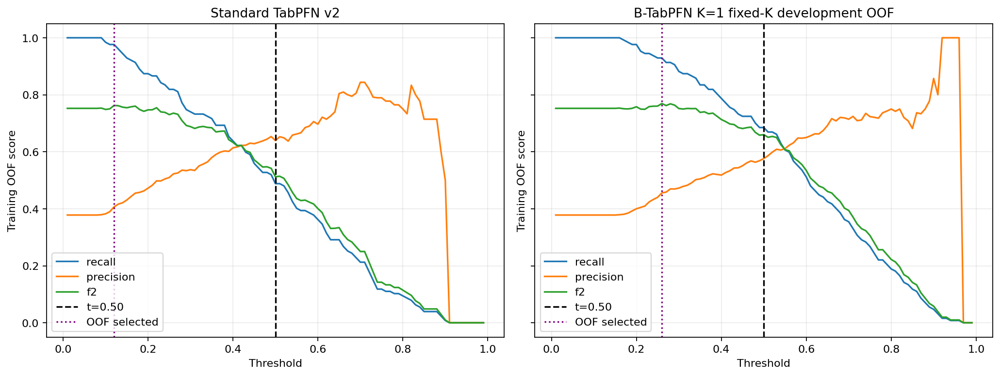

In [28]:
with analysis_component("threshold_analysis"):
    threshold_rows = []
    for model_name, probabilities in {"Standard TabPFN v2": std_oof, OOF_FINAL_B_NAME: b_oof_fixed_k}.items():
        for threshold in CONFIG["threshold_grid"]:
            threshold_rows.append({"model": model_name, **metric_record(y_train, probabilities, threshold)})
    threshold_df = pd.DataFrame(threshold_rows)
    atomic_csv(threshold_df, ARTIFACT_DIR / "threshold_sensitivity_oof.csv")

    def select_threshold(model_name):
        grid = threshold_df[threshold_df["model"].eq(model_name)].copy()
        if grid.empty:
            available = sorted(threshold_df["model"].astype(str).unique().tolist())
            raise RuntimeError(
                f"No threshold-grid rows for {model_name!r}; available model labels: {available}"
            )
        # Predeclared: maximum F2, then maximum recall, then threshold closest to 0.50, then lower threshold.
        grid["distance_from_050"] = (grid["threshold"] - 0.50).abs()
        row = grid.sort_values(["f2", "recall", "distance_from_050", "threshold"],
                               ascending=[False, False, True, True]).iloc[0]
        return float(row["threshold"])

    STANDARD_OOF_THRESHOLD = select_threshold("Standard TabPFN v2")
    BTABPFN_OOF_THRESHOLD = select_threshold(OOF_FINAL_B_NAME)
    OOF_OPERATING_THRESHOLD = BTABPFN_OOF_THRESHOLD  # backward-compatible manifest name
    CONFIG["standard_oof_selected_threshold"] = STANDARD_OOF_THRESHOLD
    CONFIG["btabpfn_oof_selected_threshold_secondary"] = BTABPFN_OOF_THRESHOLD
    threshold_min, threshold_max = min(CONFIG["threshold_grid"]), max(CONFIG["threshold_grid"])
    threshold_decision_evidence = pd.DataFrame([
        {
            "model": model_name,
            "selected_threshold": chosen,
            "selection_data": "nested development out-of-fold predictions only",
            "selection_rule": CONFIG["threshold_selection_rule"],
            "grid_minimum": threshold_min,
            "grid_maximum": threshold_max,
            "selected_at_lower_boundary": bool(np.isclose(chosen, threshold_min)),
            "selected_at_upper_boundary": bool(np.isclose(chosen, threshold_max)),
            "analysis_role": role,
            **metric_record(y_train, probabilities, chosen),
        }
        for model_name, probabilities, chosen, role in [
            ("Standard TabPFN v2", std_oof, STANDARD_OOF_THRESHOLD, "secondary matched-threshold comparator"),
            (OOF_FINAL_B_NAME, b_oof_fixed_k, BTABPFN_OOF_THRESHOLD, "secondary operating-point sensitivity"),
        ]
    ])
    atomic_csv(threshold_decision_evidence, ARTIFACT_DIR / "threshold_selection_evidence.csv")
    atomic_json({"selection_partition": "training_oof", "selection_metric": "F2",
                 "standard_tabpfn": STANDARD_OOF_THRESHOLD,
                 "btabpfn_secondary": BTABPFN_OOF_THRESHOLD,
                 "primary_btabpfn_threshold": CONFIG["primary_threshold"]},
                ARTIFACT_DIR / "selected_thresholds.json")
    atomic_json(CONFIG, ARTIFACT_DIR / "analysis_config.json")

    threshold_display = threshold_df[
        threshold_df.apply(
            lambda row: np.isclose(row["threshold"], 0.50)
            or (row["model"] == "Standard TabPFN v2" and np.isclose(row["threshold"], STANDARD_OOF_THRESHOLD))
            or (row["model"] == OOF_FINAL_B_NAME and np.isclose(row["threshold"], BTABPFN_OOF_THRESHOLD)),
            axis=1,
        )
    ]
    show_table(threshold_display, "Prespecified and development-selected operating points", max_rows=10)
    show_table(threshold_decision_evidence, "Threshold decision evidence", max_rows=4)
    print("Standard TabPFN training-only selected threshold:", STANDARD_OOF_THRESHOLD)
    print("B-TabPFN secondary training-only selected threshold:", BTABPFN_OOF_THRESHOLD)

    fig, axes = plt.subplots(1, 2, figsize=(13, 5), sharey=True)
    for ax, model_name, chosen in [
        (axes[0], "Standard TabPFN v2", STANDARD_OOF_THRESHOLD),
        (axes[1], OOF_FINAL_B_NAME, BTABPFN_OOF_THRESHOLD),
    ]:
        grid = threshold_df[threshold_df["model"].eq(model_name)]
        for metric in ["recall", "precision", "f2"]: ax.plot(grid["threshold"], grid[metric], label=metric)
        ax.axvline(0.50, color="black", linestyle="--", label="t=0.50")
        ax.axvline(chosen, color="purple", linestyle=":", label="OOF selected")
        ax.set(title=model_name, xlabel="Threshold", ylabel="Training OOF score"); ax.grid(alpha=.25); ax.legend()
    threshold_figure_path = FIGURE_DIR / "qc_threshold_sensitivity.png"
    plt.tight_layout(); plt.savefig(threshold_figure_path, dpi=160, bbox_inches="tight"); plt.close(fig)
    display_saved_figure(threshold_figure_path, "Development-only threshold sensitivity")


## 6. Held-out test evaluation

This section fits preprocessing on the full training partition, then transforms the holdout once. It creates the paired prediction source for all held-out-test tables, confusion matrices and McNemar tests.


In [29]:
with analysis_component("heldout_test_evaluation"):
    # Freeze final preprocessing and tune classical baselines on the development partition only.
    final_classic_preprocessor = make_classic_preprocessor(FEATURES)
    X_train_classic = final_classic_preprocessor.fit_transform(X_train_df)
    X_test_classic = final_classic_preprocessor.transform(X_test_df)

    final_preprocessor = make_tabpfn_preprocessor(FEATURES)
    X_train_t = final_preprocessor.fit_transform(X_train_df)
    X_test_t = final_preprocessor.transform(X_test_df)
    transformed_feature_names = list(final_preprocessor.get_feature_names_out())
    assert len(transformed_feature_names) == len(FEATURES), "TabPFN/FSII must remain at the original feature level."

    heldout_prob, final_baselines, final_selected_rows, final_tuning_rows = {}, {}, [], []
    for name in baseline_candidate_specs():
        params, rows, best = select_baseline_configuration(name, X_train_df, y_train, SEED + 9000, "final_training")
        final_tuning_rows.extend(rows)
        final_selected_rows.append({"outer_fold": "final_training", "model": name,
                                    "selected_parameters_json": json.dumps(params, sort_keys=True), **best})
        model = instantiate_baseline(name, params, SEED, y_train)
        model.fit(X_train_classic, y_train)
        heldout_prob[name] = model.predict_proba(X_test_classic)[:, 1]
        final_baselines[name] = model
    atomic_csv(pd.DataFrame(final_tuning_rows), ARTIFACT_DIR / "baseline_final_tuning_full_grid.csv")
    final_baseline_selection_audit = pd.DataFrame(final_selected_rows)
    atomic_csv(final_baseline_selection_audit, ARTIFACT_DIR / "baseline_final_selected_configurations.csv")
    show_table(
        final_baseline_selection_audit[[
            "outer_fold", "model", "candidate_id", "selected_parameters_json", "mean_inner_f2", "sd_inner_f2"
        ]],
        "Final baseline configurations selected from development data",
        max_rows=len(final_baseline_selection_audit),
    )

    final_standard = make_tabpfn(SEED, FEATURES)
    final_standard.fit(X_train_t, y_train)
    heldout_prob["Standard TabPFN v2"] = final_standard.predict_proba(X_test_t)[:, 1]

    final_btabpfn = ContextEnsemble(lambda s: make_tabpfn(s, FEATURES), n_iter=max(max(CONFIG["k_candidates"]), max(CONFIG["ablation_k_values"])),
                                    random_state=CONFIG["context_seed"], minority_prevalence=0.50)
    final_btabpfn.fit(X_train_t, y_train)
    heldout_prob[FINAL_B_NAME] = final_btabpfn.predict_proba_at_k(X_test_t, SELECTED_K)[:, 1]

    model_specs = {name: {k: str(v) for k, v in model.get_params(deep=True).items()} for name, model in final_baselines.items()}
    model_specs["Standard TabPFN v2"] = {**{k: str(v) for k, v in final_standard.get_params(deep=True).items()},
                                         "categorical_features": str(tabpfn_categorical_indices(FEATURES))}
    model_specs[FINAL_B_NAME] = {
        "operation": "M_modify", "sampling": "majority undersampling without replacement",
        "minority_prevalence": 0.50, "n_iter": SELECTED_K,
        "context_seed": CONFIG["context_seed"], "base_model": "TabPFN v2",
    }
    atomic_json(model_specs, ARTIFACT_DIR / "model_specifications.json")

    heldout_frames = []
    for name, probabilities in heldout_prob.items():
        heldout_frames.append(pd.DataFrame({
            "row_id": row_test, "partition": "held_out_test", "target": y_test,
            "model": name, "probability": probabilities, "threshold": CONFIG["primary_threshold"],
            "prediction": (probabilities >= CONFIG["primary_threshold"]).astype(int),
        }))
    heldout_predictions = pd.concat(heldout_frames, ignore_index=True)
    atomic_parquet(heldout_predictions, RESTRICTED_DIR / "heldout_test_predictions.parquet")

    heldout_summary = pd.DataFrame([
        {"partition": "held_out_test", "model": name, **metric_record(y_test, probabilities, CONFIG["primary_threshold"])}
        for name, probabilities in heldout_prob.items()
    ]).sort_values("f2", ascending=False)
    atomic_csv(heldout_summary, ARTIFACT_DIR / "heldout_test_summary.csv")

    # Primary paired comparison: the training-OOF threshold is applied once to the held-out test partition.
    b_name = FINAL_B_NAME
    table4_model_comparison = pd.DataFrame([
        {"partition": "held_out_test", "comparison_role": "standard_fixed_050", "model": "Standard TabPFN v2",
         **metric_record(y_test, heldout_prob["Standard TabPFN v2"], 0.50)},
        {"partition": "held_out_test", "comparison_role": "standard_training_selected_threshold", "model": "Standard TabPFN v2",
         **metric_record(y_test, heldout_prob["Standard TabPFN v2"], STANDARD_OOF_THRESHOLD)},
        {"partition": "held_out_test", "comparison_role": "btabpfn_fixed_050", "model": b_name,
         **metric_record(y_test, heldout_prob[b_name], 0.50)},
        {"partition": "held_out_test", "comparison_role": "btabpfn_training_selected_threshold", "model": b_name,
         **metric_record(y_test, heldout_prob[b_name], BTABPFN_OOF_THRESHOLD)},
    ])
    atomic_csv(table4_model_comparison, ARTIFACT_DIR / "heldout_test_model_comparison.csv")
    show_table(table4_model_comparison, "Secondary held-out-test comparison")


Final baseline configurations selected from development data (showing 5 of 5 rows)


,outer_fold,model,candidate_id,selected_parameters_json,mean_inner_f2,sd_inner_f2
0,final_training,Logistic Regression,4,"{""C"": 10.0}",0.662528,0.125511
1,final_training,Random Forest,3,"{""max_depth"": 5, ""min_samples_leaf"": 1}",0.615610,0.135002
2,final_training,Gaussian Naive Bayes,5,"{""var_smoothing"": 1e-07}",0.757612,0.025705
3,final_training,KNN,1,"{""n_neighbors"": 3, ""weights"": ""uniform""}",0.493678,0.098407
4,final_training,XGBoost,1,"{""learning_rate"": 0.05, ""max_depth"": 3, ""n_est...",0.618320,0.141274


Secondary held-out-test comparison (showing 4 of 4 rows)


,partition,comparison_role,model,n,positive,negative,tn,fp,fn,tp,threshold,accuracy,precision,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10
0,held_out_test,standard_fixed_050,Standard TabPFN v2,85,32,53,43,10,13,19,0.50,0.729412,0.655172,0.59375,0.811321,0.702535,0.767857,29,0.341176,1.526316,0.622951,0.605096,0.745873,0.653647,0.191029,0.097500
1,held_out_test,standard_training_selected_threshold,Standard TabPFN v2,85,32,53,8,45,1,31,0.12,0.458824,0.407895,0.96875,0.150943,0.559847,0.888889,76,0.894118,2.451613,0.574074,0.759804,0.745873,0.653647,0.191029,0.097500
2,held_out_test,btabpfn_fixed_050,B-TabPFN K=1,85,32,53,38,15,9,23,0.50,0.717647,0.605263,0.71875,0.716981,0.717866,0.808511,38,0.447059,1.652174,0.657143,0.692771,0.742630,0.617938,0.211086,0.126648
3,held_out_test,btabpfn_training_selected_threshold,B-TabPFN K=1,85,32,53,16,37,3,29,0.26,0.529412,0.439394,0.90625,0.301887,0.604068,0.842105,66,0.776471,2.275862,0.591837,0.747423,0.742630,0.617938,0.211086,0.126648


In [30]:
with analysis_component("heldout_feature_selection_sensitivity"):
    selected_feature_preprocessor = make_tabpfn_preprocessor(DEVELOPMENT_SELECTED_FEATURES)
    Xtr_selected = selected_feature_preprocessor.fit_transform(X_train_df[DEVELOPMENT_SELECTED_FEATURES])
    Xte_selected = selected_feature_preprocessor.transform(X_test_df[DEVELOPMENT_SELECTED_FEATURES])
    selected_feature_standard = make_tabpfn(SEED + 606060, DEVELOPMENT_SELECTED_FEATURES)
    selected_feature_standard.fit(Xtr_selected, y_train)
    selected_feature_standard_score = selected_feature_standard.predict_proba(Xte_selected)[:, 1]
    selected_feature_b = ContextEnsemble(lambda s: make_tabpfn(s, DEVELOPMENT_SELECTED_FEATURES),
                                         n_iter=SELECTED_K, random_state=CONFIG["context_seed"] + 606060,
                                         minority_prevalence=0.50)
    selected_feature_b.fit(Xtr_selected, y_train)
    selected_feature_b_score = selected_feature_b.predict_proba_at_k(Xte_selected, SELECTED_K)[:, 1]
    heldout_feature_selection_sensitivity = pd.DataFrame([
        {"partition": "held_out_test", "role": "secondary_training_only_feature_selection_sensitivity",
         "model": "Standard TabPFN training-selected features",
         "selected_features_json": json.dumps(DEVELOPMENT_SELECTED_FEATURES),
         **metric_record(y_test, selected_feature_standard_score, CONFIG["primary_threshold"])},
        {"partition": "held_out_test", "role": "secondary_training_only_feature_selection_sensitivity",
         "model": f"B-TabPFN K={SELECTED_K} training-selected features",
         "selected_features_json": json.dumps(DEVELOPMENT_SELECTED_FEATURES),
         **metric_record(y_test, selected_feature_b_score, CONFIG["primary_threshold"])},
    ])
    atomic_csv(heldout_feature_selection_sensitivity, ARTIFACT_DIR / "heldout_feature_selection_sensitivity.csv")
    atomic_parquet(pd.DataFrame({"row_id": np.tile(row_test, 2), "target": np.tile(y_test, 2),
                                 "model": np.repeat(heldout_feature_selection_sensitivity["model"].to_numpy(), len(y_test)),
                                 "model_score": np.concatenate([selected_feature_standard_score, selected_feature_b_score])}),
                   RESTRICTED_DIR / "heldout_feature_selection_scores.parquet")

with analysis_component("computational_latency"):
    def synchronize_gpu():
        if torch.cuda.is_available(): torch.cuda.synchronize()

    timing_rows = []
    cost_rows = []
    timing_repeats = 30

    # Standard: setup and warm scoring are measured separately.
    start = time.perf_counter()
    latency_standard = make_tabpfn(SEED + 707070, FEATURES)
    latency_standard.fit(X_train_t, y_train); synchronize_gpu()
    cost_rows.append({"model": "Standard TabPFN v2", "operation": "cold_fit_setup",
                      "seconds": time.perf_counter() - start, "K": 1})
    latency_standard.predict_proba(X_test_t[:1]); synchronize_gpu()
    for repeat in range(1, timing_repeats + 1):
        started = time.perf_counter(); latency_standard.predict_proba(X_test_t[:1]); synchronize_gpu()
        timing_rows.append({"model": "Standard TabPFN v2", "repeat": repeat, "batch_n": 1,
                            "milliseconds_per_assessment": 1000 * (time.perf_counter() - started),
                            "measurement": "warm_prediction_no_fit"})
    started = time.perf_counter(); latency_standard.predict_proba(X_test_t); synchronize_gpu()
    cost_rows.append({"model": "Standard TabPFN v2", "operation": "warm_batch_prediction",
                      "seconds": time.perf_counter() - started, "batch_n": len(X_test_t), "K": 1})
    del latency_standard

    # B-TabPFN: fit time is excluded from warm latency. Member prediction times are
    # summed because the implemented serving path evaluates members sequentially.
    timed_k_values = list(dict.fromkeys([1, int(SELECTED_K)]))
    for k_value in timed_k_values:
        k_label = f"Balanced context K={k_value}"
        per_repeat_single = np.zeros(timing_repeats, dtype=float)
        batch_seconds = 0.0
        setup_seconds = 0.0
        for member_number, context in enumerate(final_btabpfn.context_indices_[:k_value]):
            started = time.perf_counter()
            member_model = make_tabpfn(CONFIG["context_seed"] + member_number, FEATURES)
            member_model.fit(X_train_t[context], y_train[context]); synchronize_gpu()
            setup_seconds += time.perf_counter() - started
            member_model.predict_proba(X_test_t[:1]); synchronize_gpu()
            for repeat in range(timing_repeats):
                started = time.perf_counter(); member_model.predict_proba(X_test_t[:1]); synchronize_gpu()
                per_repeat_single[repeat] += time.perf_counter() - started
            started = time.perf_counter(); member_model.predict_proba(X_test_t); synchronize_gpu()
            batch_seconds += time.perf_counter() - started
            del member_model
            if torch.cuda.is_available(): torch.cuda.empty_cache()
        for repeat, seconds in enumerate(per_repeat_single, start=1):
            timing_rows.append({"model": k_label, "repeat": repeat, "batch_n": 1,
                                "milliseconds_per_assessment": 1000 * seconds,
                                "measurement": "warm_sequential_member_prediction_no_fit"})
        cost_rows.extend([
            {"model": k_label, "operation": "cold_fit_setup", "seconds": setup_seconds, "batch_n": np.nan, "K": k_value},
            {"model": k_label, "operation": "warm_batch_prediction", "seconds": batch_seconds,
             "batch_n": len(X_test_t), "K": k_value},
        ])
    inference_latency = pd.DataFrame(timing_rows)
    computational_cost = pd.DataFrame(cost_rows)
    atomic_csv(inference_latency, ARTIFACT_DIR / "inference_latency.csv")
    atomic_csv(computational_cost, ARTIFACT_DIR / "computational_cost.csv")
warm_balanced_cost = computational_cost[
    computational_cost["operation"].eq("warm_batch_prediction")
    & computational_cost["model"].str.startswith("Balanced context K=")
].copy()
warm_balanced_cost["K"] = warm_balanced_cost["model"].str.extract(r"K=(\d+)").astype(int)
if warm_balanced_cost["K"].duplicated().any():
    duplicate_k = sorted(warm_balanced_cost.loc[warm_balanced_cost["K"].duplicated(keep=False), "K"].unique().tolist())
    raise RuntimeError(f"Computational timing produced duplicate warm-batch rows for K={duplicate_k}")
k_decision_evidence = k_summary.merge(
    warm_balanced_cost[["K", "seconds", "batch_n"]].rename(
        columns={"seconds": "observed_warm_batch_seconds", "batch_n": "observed_batch_n"}
    ),
    on="K", how="left", validate="one_to_one",
)
k1_reference = k_decision_evidence.loc[k_decision_evidence["K"].eq(1)].iloc[0]
k_decision_evidence["recall_difference_vs_k1"] = k_decision_evidence["recall_mean"] - k1_reference["recall_mean"]
k_decision_evidence["f2_difference_vs_k1"] = k_decision_evidence["f2_mean"] - k1_reference["f2_mean"]
k_decision_evidence["decision_role"] = np.select(
    [k_decision_evidence["primary_selected"] & k_decision_evidence["best_mean_f2_sensitivity_selected"],
     k_decision_evidence["primary_selected"],
     k_decision_evidence["best_mean_f2_sensitivity_selected"]],
    ["primary_and_best_mean", "primary_one_se_model", "best_mean_f2_sensitivity"],
    default="candidate",
)
atomic_csv(k_decision_evidence, ARTIFACT_DIR / "k_evidence_and_decision.csv")
show_table(heldout_feature_selection_sensitivity, "Held-out feature-selection sensitivity", max_rows=12)
show_table(computational_cost, "Computational cost", max_rows=12)
show_table(k_decision_evidence, "K evidence and decision audit", max_rows=len(k_decision_evidence))


Held-out feature-selection sensitivity (showing 2 of 2 rows)


,partition,role,model,selected_features_json,n,positive,negative,tn,fp,fn,tp,threshold,accuracy,precision,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10
0,held_out_test,secondary_training_only_feature_selection_sens...,Standard TabPFN training-selected features,"[""Q4_Repeating"", ""Q6_PHQ2_Interest"", ""Q7_PHQ2_...",85,32,53,42,11,13,19,0.5,0.717647,0.633333,0.59375,0.792453,0.693101,0.763636,30,0.352941,1.578947,0.612903,0.601266,0.737323,0.620982,0.196509,0.099609
1,held_out_test,secondary_training_only_feature_selection_sens...,B-TabPFN K=1 training-selected features,"[""Q4_Repeating"", ""Q6_PHQ2_Interest"", ""Q7_PHQ2_...",85,32,53,38,15,10,22,0.5,0.705882,0.594595,0.68750,0.716981,0.702241,0.791667,37,0.435294,1.681818,0.637681,0.666667,0.731427,0.624044,0.215108,0.142868


Computational cost (showing 4 of 4 rows)


,model,operation,seconds,K,batch_n
0,Standard TabPFN v2,cold_fit_setup,0.162224,1,NaN
1,Standard TabPFN v2,warm_batch_prediction,0.336887,1,85.0
2,Balanced context K=1,cold_fit_setup,0.156921,1,NaN
3,Balanced context K=1,warm_batch_prediction,0.460869,1,85.0


K evidence and decision audit (showing 5 of 5 rows)


,K,recall_mean,recall_sd,f2_mean,f2_sd,accuracy_mean,precision_mean,f1_mean,average_precision_mean,auc_roc_mean,brier_mean,ece_mean,outer_folds,within_one_se_of_best_f2,primary_selected,best_mean_f2_sensitivity_selected,primary_selection_rule,best_mean_k_reporting_rule,observed_warm_batch_seconds,observed_batch_n,recall_difference_vs_k1,f2_difference_vs_k1,decision_role
0,1,0.687821,0.160015,0.660859,0.146000,0.691087,0.577895,0.625717,0.672628,0.746969,0.201017,0.183815,10,True,True,False,smallest K within one standard error of the be...,"highest mean development F2, then recall, then...",0.460869,85.0,0.000000,0.000000,primary_one_se_model
1,5,0.671154,0.151636,0.651363,0.135263,0.699911,0.592883,0.625955,0.670613,0.747705,0.200362,0.175594,10,True,False,False,smallest K within one standard error of the be...,"highest mean development F2, then recall, then...",NaN,NaN,-0.016667,-0.009496,candidate
2,10,0.678846,0.163023,0.658300,0.142823,0.705971,0.598726,0.632209,0.676347,0.748736,0.200865,0.188770,10,True,False,False,smallest K within one standard error of the be...,"highest mean development F2, then recall, then...",NaN,NaN,-0.008974,-0.002559,candidate
3,15,0.687179,0.159694,0.665256,0.139267,0.708913,0.602700,0.637622,0.674686,0.748828,0.200965,0.195221,10,True,False,True,smallest K within one standard error of the be...,"highest mean development F2, then recall, then...",NaN,NaN,-0.000641,0.004398,best_mean_f2_sensitivity
4,20,0.679487,0.148531,0.659321,0.131817,0.705882,0.600653,0.633590,0.671856,0.746654,0.201025,0.197010,10,True,False,False,smallest K within one standard error of the be...,"highest mean development F2, then recall, then...",NaN,NaN,-0.008333,-0.001538,candidate


## 6.1 Complete-case sensitivity

The complete-case analysis evaluates whether conclusions depend materially on fold-local imputation. It uses the same model definitions and reporting metrics as the primary analysis while restricting evaluation to observations with complete predictor data.


In [31]:
with analysis_component("complete_case_sensitivity"):
    complete_mask = ~df_analysis[FEATURES].isna().any(axis=1).to_numpy()
    train_complete = complete_mask[train_pos]
    test_complete = complete_mask[test_pos]
    complete_rows = []
    if train_complete.sum() >= 50 and y_train[train_complete].sum() >= 10 and y_test[test_complete].sum() >= 5:
        Xtr_df = X_train_df.loc[train_complete, FEATURES]
        Xte_df = X_test_df.loc[test_complete, FEATURES]
        ytr, yte = y_train[train_complete], y_test[test_complete]
        prep = make_tabpfn_preprocessor(FEATURES)
        Xtr, Xte = prep.fit_transform(Xtr_df), prep.transform(Xte_df)
        std_cc = make_tabpfn(SEED, FEATURES); std_cc.fit(Xtr, ytr)
        p_std = std_cc.predict_proba(Xte)[:, 1]
        b_cc = ContextEnsemble(lambda s: make_tabpfn(s, FEATURES), n_iter=SELECTED_K,
                               random_state=CONFIG["context_seed"], minority_prevalence=0.50)
        b_cc.fit(Xtr, ytr); p_b = b_cc.predict_proba_at_k(Xte, SELECTED_K)[:, 1]
        for name, probabilities in [("Standard TabPFN v2", p_std), (f"B-TabPFN K={SELECTED_K}", p_b)]:
            complete_rows.append({"partition": "held_out_test_complete_cases", "train_complete_n": int(train_complete.sum()),
                                  "test_complete_n": int(test_complete.sum()), "model": name,
                                  **metric_record(yte, probabilities, CONFIG["primary_threshold"])})
    else:
        complete_rows.append({"partition": "held_out_test_complete_cases", "train_complete_n": int(train_complete.sum()),
                              "test_complete_n": int(test_complete.sum()), "model": "not_run_insufficient_events"})
    complete_case_sensitivity = pd.DataFrame(complete_rows)
    atomic_csv(complete_case_sensitivity, ARTIFACT_DIR / "complete_case_sensitivity.csv")
show_table(complete_case_sensitivity, "Complete-case sensitivity", max_rows=10)


Complete-case sensitivity (showing 2 of 2 rows)


,partition,train_complete_n,test_complete_n,model,n,positive,negative,tn,fp,fn,tp,threshold,accuracy,precision,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10
0,held_out_test_complete_cases,326,82,Standard TabPFN v2,82,31,51,42,9,13,18,0.5,0.731707,0.666667,0.580645,0.823529,0.702087,0.763636,27,0.329268,1.500000,0.620690,0.596026,0.754586,0.677435,0.188339,0.100440
1,held_out_test_complete_cases,326,82,B-TabPFN K=1,82,31,51,37,14,8,23,0.5,0.731707,0.621622,0.741935,0.725490,0.733713,0.822222,37,0.451220,1.608696,0.676471,0.714286,0.740670,0.646727,0.207314,0.131343


Calibration summary by evaluation partition (showing 4 of 4 rows)


,partition,model,n,brier,ece_10,calibration_intercept,calibration_slope,ece_note
0,training_oof,Standard TabPFN v2,336,0.191894,0.054717,0.000774,0.915383,ten-bin ECE is descriptive and unstable in the...
1,training_oof,B-TabPFN K=1 fixed-K development OOF,336,0.201287,0.095981,-0.485449,0.964193,ten-bin ECE is descriptive and unstable in the...
2,held_out_test,Standard TabPFN v2,85,0.191029,0.097500,-0.151042,0.818201,ten-bin ECE is descriptive and unstable in the...
3,held_out_test,B-TabPFN K=1,85,0.211086,0.126648,-0.609163,0.756149,ten-bin ECE is descriptive and unstable in the...


Figure: calibration by evaluation partition


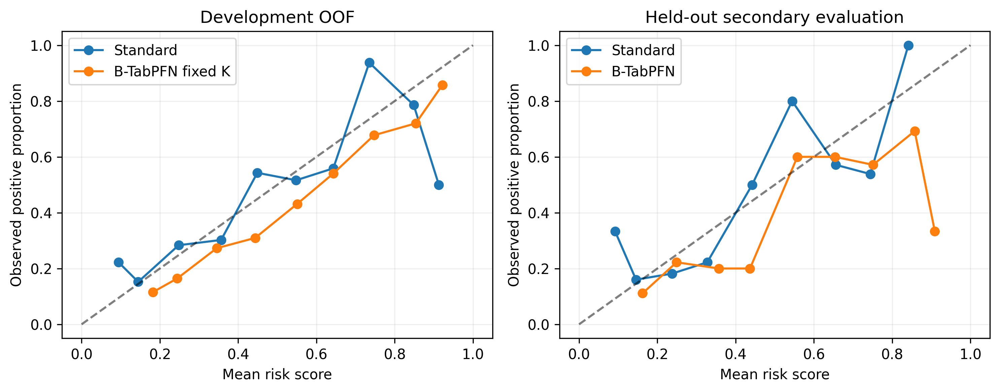

Quality-control figure: held-out confusion matrices


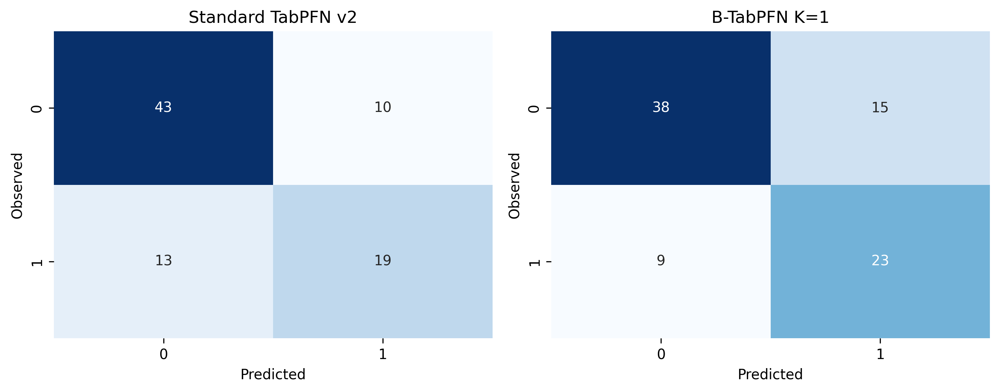

In [32]:
with analysis_component("calibration_diagnosis"):
    def calibration_intercept_slope(y_true, probabilities):
        clipped = np.clip(np.asarray(probabilities, dtype=float), 1e-6, 1 - 1e-6)
        logit_score = np.log(clipped / (1 - clipped)).reshape(-1, 1)
        if np.unique(y_true).size < 2:
            return np.nan, np.nan
        model = LogisticRegression(C=1e6, solver="lbfgs", max_iter=5000)
        model.fit(logit_score, y_true)
        return float(model.intercept_[0]), float(model.coef_[0, 0])

    calibration_rows = []
    for partition, truth, probs_map in [
        ("training_oof", y_train, {"Standard TabPFN v2": std_oof, OOF_FINAL_B_NAME: b_oof_fixed_k}),
        ("held_out_test", y_test, {"Standard TabPFN v2": heldout_prob["Standard TabPFN v2"], FINAL_B_NAME: heldout_prob[FINAL_B_NAME]}),
    ]:
        for model, probabilities in probs_map.items():
            intercept, slope = calibration_intercept_slope(truth, probabilities)
            calibration_rows.append({
                "partition": partition,
                "model": model,
                "n": len(truth),
                "brier": brier_score_loss(truth, probabilities),
                "ece_10": expected_calibration_error(truth, probabilities, 10),
                "calibration_intercept": intercept,
                "calibration_slope": slope,
                "ece_note": "ten-bin ECE is descriptive and unstable in the 85-student holdout",
            })
    calibration_df = pd.DataFrame(calibration_rows)
    atomic_csv(calibration_df, ARTIFACT_DIR / "calibration_by_partition.csv")

    def calibration_points(y_true, probabilities, bins=10):
        edges = np.linspace(0, 1, bins + 1)
        ids = np.clip(np.digitize(probabilities, edges[1:-1], right=True), 0, bins - 1)
        rows = []
        for bin_number in range(bins):
            mask = ids == bin_number
            if mask.any():
                rows.append({"bin": bin_number, "mean_predicted": probabilities[mask].mean(), "observed_rate": y_true[mask].mean(), "n": int(mask.sum())})
        return pd.DataFrame(rows)

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    plot_sources = [
        ("Development OOF", y_train, {"Standard": std_oof, "B-TabPFN fixed K": b_oof_fixed_k}),
        ("Held-out secondary evaluation", y_test, {"Standard": heldout_prob["Standard TabPFN v2"], "B-TabPFN": heldout_prob[FINAL_B_NAME]}),
    ]
    for ax, (partition, truth, probs_map) in zip(axes, plot_sources):
        for label, probabilities in probs_map.items():
            points = calibration_points(truth, probabilities)
            ax.plot(points["mean_predicted"], points["observed_rate"], marker="o", label=label)
        ax.plot([0, 1], [0, 1], "k--", alpha=.5)
        ax.set(title=partition, xlabel="Mean risk score", ylabel="Observed positive proportion")
        ax.legend()
        ax.grid(alpha=.2)
    plt.tight_layout()
    plt.savefig(FIGURE_DIR / "fig_calibration_by_partition.png", dpi=300, bbox_inches="tight")
    plt.close(fig)

    models_cm = ["Standard TabPFN v2", FINAL_B_NAME]
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    for ax, name in zip(axes, models_cm):
        pred = (heldout_prob[name] >= CONFIG["primary_threshold"]).astype(int)
        matrix = confusion_matrix(y_test, pred)
        assert matrix.sum() == len(y_test)
        sns.heatmap(matrix, annot=True, fmt="d", cmap="Blues", cbar=False, ax=ax)
        ax.set(title=name, xlabel="Predicted", ylabel="Observed")
    plt.tight_layout()
    plt.savefig(FIGURE_DIR / "qc_heldout_test_confusion_matrices.png", dpi=300, bbox_inches="tight")
    plt.close(fig)

show_table(calibration_df, "Calibration summary by evaluation partition", max_rows=len(calibration_df))
display_saved_figure(FIGURE_DIR / "fig_calibration_by_partition.png", "Figure: calibration by evaluation partition")
display_saved_figure(FIGURE_DIR / "qc_heldout_test_confusion_matrices.png", "Quality-control figure: held-out confusion matrices")


## 6.2 Calibration diagnosis, recalibration and operational trade-off

Isotonic calibration is examined as a secondary diagnostic. Partitioned development estimates are labelled as dependent because the underlying outer-fold models have overlapping training sets. The final calibrator is fitted once to fixed-K development OOF scores and evaluated on the held-out partition; held-out labels are never used for fitting or threshold selection.


Calibration and recalibration summary (showing 4 of 4 rows)


,partition,variant,n,positive,negative,tn,fp,fn,tp,threshold,accuracy,precision,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10,analysis_role
0,development_oof_reuse_diagnostic,B-TabPFN uncalibrated,336,127,209,145,64,40,87,0.5,0.690476,0.576159,0.685039,0.693780,0.689410,0.783784,151,0.449405,1.735632,0.625899,0.660091,0.751385,0.642632,0.201287,0.095981,secondary diagnostic; not automatically adopte...
1,development_oof_reuse_diagnostic,B-TabPFN isotonic diagnostic,336,127,209,172,37,60,67,0.5,0.711310,0.644231,0.527559,0.822967,0.675263,0.741379,104,0.309524,1.552239,0.580087,0.547386,0.719662,0.577492,0.199699,0.078165,secondary diagnostic; not automatically adopte...
2,held_out_test,B-TabPFN uncalibrated,85,32,53,38,15,9,23,0.5,0.717647,0.605263,0.718750,0.716981,0.717866,0.808511,38,0.447059,1.652174,0.657143,0.692771,0.742630,0.617938,0.211086,0.126648,secondary diagnostic; not automatically adopte...
3,held_out_test,B-TabPFN isotonic from training OOF,85,32,53,40,13,11,21,0.5,0.717647,0.617647,0.656250,0.754717,0.705483,0.784314,34,0.400000,1.619048,0.636364,0.648148,0.735849,0.589434,0.197930,0.089852,secondary diagnostic; not automatically adopte...


Held-out operating-point comparison (showing 4 of 4 rows)


,model,operating_point,selection_data,n,positive,negative,tn,fp,fn,tp,threshold,accuracy,precision,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10
0,Standard TabPFN v2,fixed_0.50,prespecified,85,32,53,43,10,13,19,0.50,0.729412,0.655172,0.59375,0.811321,0.702535,0.767857,29,0.341176,1.526316,0.622951,0.605096,0.745873,0.653647,0.191029,0.097500
1,Standard TabPFN v2,development_selected,development OOF only,85,32,53,8,45,1,31,0.12,0.458824,0.407895,0.96875,0.150943,0.559847,0.888889,76,0.894118,2.451613,0.574074,0.759804,0.745873,0.653647,0.191029,0.097500
2,B-TabPFN K=1,fixed_0.50,prespecified,85,32,53,38,15,9,23,0.50,0.717647,0.605263,0.71875,0.716981,0.717866,0.808511,38,0.447059,1.652174,0.657143,0.692771,0.742630,0.617938,0.211086,0.126648
3,B-TabPFN K=1,development_selected,development OOF only,85,32,53,16,37,3,29,0.26,0.529412,0.439394,0.90625,0.301887,0.604068,0.842105,66,0.776471,2.275862,0.591837,0.747423,0.742630,0.617938,0.211086,0.126648


Counsellor workload scenarios (showing 12 of 12 rows)


,model,operating_point,threshold,students_referred,positive_target_students_detected,positive_target_students_missed,non_positive_students_referred,reviews_per_detected_positive,minutes_per_review_scenario,staff_hours_scenario,capacity_status
0,Standard TabPFN v2,fixed_0.50,0.50,29,19,13,10,1.526316,15,7.25,scenario; actual KNUST counsellor capacity not...
1,Standard TabPFN v2,fixed_0.50,0.50,29,19,13,10,1.526316,30,14.50,scenario; actual KNUST counsellor capacity not...
2,Standard TabPFN v2,fixed_0.50,0.50,29,19,13,10,1.526316,60,29.00,scenario; actual KNUST counsellor capacity not...
3,Standard TabPFN v2,development_selected,0.12,76,31,1,45,2.451613,15,19.00,scenario; actual KNUST counsellor capacity not...
4,Standard TabPFN v2,development_selected,0.12,76,31,1,45,2.451613,30,38.00,scenario; actual KNUST counsellor capacity not...
5,Standard TabPFN v2,development_selected,0.12,76,31,1,45,2.451613,60,76.00,scenario; actual KNUST counsellor capacity not...
6,B-TabPFN K=1,fixed_0.50,0.50,38,23,9,15,1.652174,15,9.50,scenario; actual KNUST counsellor capacity not...
7,B-TabPFN K=1,fixed_0.50,0.50,38,23,9,15,1.652174,30,19.00,scenario; actual KNUST counsellor capacity not...
8,B-TabPFN K=1,fixed_0.50,0.50,38,23,9,15,1.652174,60,38.00,scenario; actual KNUST counsellor capacity not...
9,B-TabPFN K=1,development_selected,0.26,66,29,3,37,2.275862,15,16.50,scenario; actual KNUST counsellor capacity not...


Calibration decision status: diagnostic_only_overlapping_base_model_training_sets
Calibration remains secondary and is not automatically adopted for deployment.
Figure: calibration score distributions before and after training-derived recalibration


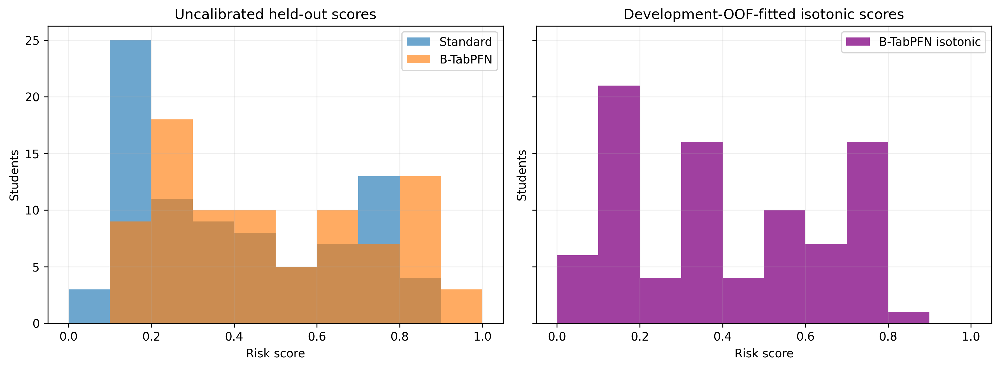

In [33]:
with analysis_component("recalibration_operational"):
    from sklearn.isotonic import IsotonicRegression

    partitioned_calibration_diagnostic_oof = np.full(len(y_train), np.nan)
    for fold in sorted(np.unique(fold_assignments)):
        fit_mask, validation_mask = fold_assignments != fold, fold_assignments == fold
        calibrator = IsotonicRegression(out_of_bounds="clip", y_min=0.0, y_max=1.0)
        calibrator.fit(b_oof_fixed_k[fit_mask], y_train[fit_mask])
        partitioned_calibration_diagnostic_oof[validation_mask] = calibrator.transform(b_oof_fixed_k[validation_mask])
    assert np.isfinite(partitioned_calibration_diagnostic_oof).all()

    final_calibrator = IsotonicRegression(out_of_bounds="clip", y_min=0.0, y_max=1.0)
    final_calibrator.fit(b_oof_fixed_k, y_train)
    b_holdout_calibrated = final_calibrator.transform(heldout_prob[FINAL_B_NAME])

    recalibration_rows = []
    for partition, truth, variants in [
        ("development_oof_reuse_diagnostic", y_train, {"B-TabPFN uncalibrated": b_oof_fixed_k, "B-TabPFN isotonic diagnostic": partitioned_calibration_diagnostic_oof}),
        ("held_out_test", y_test, {"B-TabPFN uncalibrated": heldout_prob[FINAL_B_NAME], "B-TabPFN isotonic from training OOF": b_holdout_calibrated}),
    ]:
        for variant, probabilities in variants.items():
            recalibration_rows.append({"partition": partition, "variant": variant, **metric_record(truth, probabilities, 0.50)})
    recalibration_comparison = pd.DataFrame(recalibration_rows)
    recalibration_comparison["analysis_role"] = CONFIG["calibration_role"]
    atomic_csv(recalibration_comparison, ARTIFACT_DIR / "recalibration_comparison.csv")
    atomic_parquet(pd.DataFrame({"row_id": row_test, "target": y_test, "uncalibrated_score": heldout_prob[FINAL_B_NAME], "isotonic_score": b_holdout_calibrated}), RESTRICTED_DIR / "recalibrated_test_scores.parquet")

    CALIBRATION_DEVELOPMENT_STATUS = "diagnostic_only_overlapping_base_model_training_sets"
    CALIBRATED_OOF_THRESHOLD = 0.50
    calibrated_threshold_grid = pd.DataFrame([
        {**metric_record(y_train, partitioned_calibration_diagnostic_oof, threshold), "threshold": threshold}
        for threshold in CONFIG["threshold_grid"]
    ])
    calibrated_threshold_grid["selected"] = False
    calibrated_threshold_grid["analysis_role"] = "diagnostic only; not used for threshold selection"
    atomic_csv(calibrated_threshold_grid, ARTIFACT_DIR / "calibrated_threshold_sensitivity_oof.csv")
    atomic_json({
        "threshold": CALIBRATED_OOF_THRESHOLD,
        "selection_data": "none; fixed neutral threshold",
        "selection_metric": None,
        "selection_rule": "fixed 0.50 for secondary isotonic evaluation",
        "development_calibration_status": CALIBRATION_DEVELOPMENT_STATUS,
        "analysis_role": "secondary held-out diagnostic",
        "automatic_deployment_adoption": False,
    }, ARTIFACT_DIR / "calibrated_operating_threshold.json")

    recalibration_operating_points = pd.DataFrame([
        {"partition": "held_out_test", "variant": "B-TabPFN isotonic at 0.50", **metric_record(y_test, b_holdout_calibrated, .50)},
        {"partition": "held_out_test", "variant": "B-TabPFN isotonic at fixed 0.50 (no calibrated-threshold tuning)", **metric_record(y_test, b_holdout_calibrated, CALIBRATED_OOF_THRESHOLD)},
    ])
    atomic_csv(recalibration_operating_points, ARTIFACT_DIR / "recalibration_operating_points.csv")

    operating_point_comparison = pd.DataFrame([
        {"model": "Standard TabPFN v2", "operating_point": "fixed_0.50", "selection_data": "prespecified", **metric_record(y_test, heldout_prob["Standard TabPFN v2"], .50)},
        {"model": "Standard TabPFN v2", "operating_point": "development_selected", "selection_data": "development OOF only", **metric_record(y_test, heldout_prob["Standard TabPFN v2"], STANDARD_OOF_THRESHOLD)},
        {"model": FINAL_B_NAME, "operating_point": "fixed_0.50", "selection_data": "prespecified", **metric_record(y_test, heldout_prob[FINAL_B_NAME], .50)},
        {"model": FINAL_B_NAME, "operating_point": "development_selected", "selection_data": "development OOF only", **metric_record(y_test, heldout_prob[FINAL_B_NAME], BTABPFN_OOF_THRESHOLD)},
    ])
    atomic_csv(operating_point_comparison, ARTIFACT_DIR / "operating_point_comparison.csv")

    workload_rows = []
    for _, record in operating_point_comparison.iterrows():
        for minutes in [15, 30, 60]:
            workload_rows.append({
                "model": record["model"],
                "operating_point": record["operating_point"],
                "threshold": record["threshold"],
                "students_referred": int(record["referral_n"]),
                "positive_target_students_detected": int(record["tp"]),
                "positive_target_students_missed": int(record["fn"]),
                "non_positive_students_referred": int(record["fp"]),
                "reviews_per_detected_positive": record["reviews_per_detected_positive"],
                "minutes_per_review_scenario": minutes,
                "staff_hours_scenario": record["referral_n"] * minutes / 60,
                "capacity_status": "scenario; actual KNUST counsellor capacity not measured",
            })
    operational_tradeoff = pd.DataFrame(workload_rows)
    atomic_csv(operational_tradeoff, ARTIFACT_DIR / "operational_tradeoff.csv")

    fig, axes = plt.subplots(1, 2, figsize=(12, 4.5), sharex=True, sharey=True)
    axes[0].hist(heldout_prob["Standard TabPFN v2"], bins=np.linspace(0, 1, 11), alpha=.65, label="Standard")
    axes[0].hist(heldout_prob[FINAL_B_NAME], bins=np.linspace(0, 1, 11), alpha=.65, label="B-TabPFN")
    axes[0].set_title("Uncalibrated held-out scores")
    axes[1].hist(b_holdout_calibrated, bins=np.linspace(0, 1, 11), alpha=.75, color="purple", label="B-TabPFN isotonic")
    axes[1].set_title("Development-OOF-fitted isotonic scores")
    for ax in axes:
        ax.set(xlabel="Risk score", ylabel="Students")
        ax.legend()
        ax.grid(alpha=.2)
    plt.tight_layout()
    plt.savefig(FIGURE_DIR / "fig_calibration_score_shift.png", dpi=300, bbox_inches="tight")
    plt.close(fig)

    show_table(recalibration_comparison, "Calibration and recalibration summary", max_rows=len(recalibration_comparison))
    show_table(operating_point_comparison, "Held-out operating-point comparison", max_rows=4)
    show_table(operational_tradeoff, "Counsellor workload scenarios", max_rows=12)
    print("Calibration decision status:", CALIBRATION_DEVELOPMENT_STATUS)
    print("Calibration remains secondary and is not automatically adopted for deployment.")
    display_saved_figure(FIGURE_DIR / "fig_calibration_score_shift.png", "Figure: calibration score distributions before and after training-derived recalibration")


In [34]:
with analysis_component("paired_test"):
    # Exact McNemar from the saved paired predictions.
    std_pred = (heldout_prob["Standard TabPFN v2"] >= CONFIG["primary_threshold"]).astype(int)
    b_name = f"B-TabPFN K={SELECTED_K}"
    b_pred = (heldout_prob[b_name] >= CONFIG["primary_threshold"]).astype(int)
    std_correct, b_correct = std_pred == y_test, b_pred == y_test

    b_wins = int((~std_correct & b_correct).sum())
    std_wins = int((std_correct & ~b_correct).sum())
    both_correct = int((std_correct & b_correct).sum())
    both_wrong = int((~std_correct & ~b_correct).sum())
    agreement_table = np.array([[both_correct, std_wins], [b_wins, both_wrong]])
    assert agreement_table.sum() == len(y_test)
    assert both_correct + std_wins == int(std_correct.sum())
    assert both_correct + b_wins == int(b_correct.sum())

    mc = mcnemar(agreement_table, exact=True)
    discordant_or = np.inf if std_wins == 0 and b_wins > 0 else (np.nan if std_wins == 0 else b_wins / std_wins)
    mcnemar_df = pd.DataFrame([{
        "partition": "held_out_test", "model_a": "Standard TabPFN v2", "model_b": b_name,
        "both_correct": both_correct, "standard_only_correct": std_wins,
        "btabpfn_only_correct": b_wins, "both_wrong": both_wrong,
        "method": "exact two-sided binomial McNemar", "statistic": float(mc.statistic),
        "p_value": float(mc.pvalue), "discordant_odds_btab_over_standard": discordant_or,
    }])
    atomic_csv(mcnemar_df, ARTIFACT_DIR / "mcnemar_heldout_test_exact.csv")
show_table(mcnemar_df, "Exact paired held-out comparison", max_rows=1)


Exact paired held-out comparison (showing 1 of 1 rows)


,partition,model_a,model_b,both_correct,standard_only_correct,btabpfn_only_correct,both_wrong,method,statistic,p_value,discordant_odds_btab_over_standard
0,held_out_test,Standard TabPFN v2,B-TabPFN K=1,57,5,4,19,exact two-sided binomial McNemar,4.0,1.0,0.8


In [35]:
with analysis_component("threshold_tuned_paired_test"):
    # B-TabPFN at its prespecified 0.50 operating point is compared with
    # Standard TabPFN at a threshold selected exclusively from development OOF predictions.
    standard_tuned_prediction = (heldout_prob["Standard TabPFN v2"] >= STANDARD_OOF_THRESHOLD).astype(int)
    b_fixed_prediction = (heldout_prob[FINAL_B_NAME] >= CONFIG["primary_threshold"]).astype(int)
    standard_tuned_correct = standard_tuned_prediction == y_test
    b_fixed_correct = b_fixed_prediction == y_test
    standard_only = int((standard_tuned_correct & ~b_fixed_correct).sum())
    b_only = int((~standard_tuned_correct & b_fixed_correct).sum())
    both_correct_tuned = int((standard_tuned_correct & b_fixed_correct).sum())
    both_wrong_tuned = int((~standard_tuned_correct & ~b_fixed_correct).sum())
    tuned_table = [[both_correct_tuned, standard_only], [b_only, both_wrong_tuned]]
    assert np.asarray(tuned_table).sum() == len(y_test)
    tuned_result = mcnemar(tuned_table, exact=True)
    threshold_tuned_mcnemar = pd.DataFrame([{
        "partition": "held_out_test", "model_a": FINAL_B_NAME,
        "model_a_threshold": CONFIG["primary_threshold"],
        "model_b": "Standard TabPFN v2", "model_b_threshold": STANDARD_OOF_THRESHOLD,
        "both_correct": both_correct_tuned, "btabpfn_only_correct": b_only,
        "standard_tuned_only_correct": standard_only, "both_wrong": both_wrong_tuned,
        "method": "exact two-sided McNemar", "p_value": float(tuned_result.pvalue),
        "threshold_selection": "Standard threshold selected from development OOF F2 only",
    }])
    atomic_csv(threshold_tuned_mcnemar, ARTIFACT_DIR / "mcnemar_b050_vs_standard_oof_threshold.csv")
show_table(threshold_tuned_mcnemar, "Threshold-aware paired held-out comparison", max_rows=1)


Threshold-aware paired held-out comparison (showing 1 of 1 rows)


,partition,model_a,model_a_threshold,model_b,model_b_threshold,both_correct,btabpfn_only_correct,standard_tuned_only_correct,both_wrong,method,p_value,threshold_selection
0,held_out_test,B-TabPFN K=1,0.5,Standard TabPFN v2,0.12,31,30,8,16,exact two-sided McNemar,0.000472,Standard threshold selected from development O...


## 7. Secondary split-seed sensitivity

This varies context/model randomness on the fixed development/test partition after K was chosen from training OOF. It is descriptive stability evidence, not five independent replications.


In [36]:
with analysis_component("stability_inference"):
    # Five split-seed sensitivity runs. These overlap in observations and are descriptive, not five independent samples.
    stability_rows = []
    if CONFIG["run_stability"]:
        for seed in CONFIG["stability_seeds"]:
            tr, te = train_test_split(np.arange(len(df_analysis)), test_size=CONFIG["test_size"],
                                      stratify=y_all, random_state=seed)
            Xtr_df, Xte_df = df_analysis.iloc[tr][FEATURES], df_analysis.iloc[te][FEATURES]
            ytr, yte = y_all[tr], y_all[te]
            prep = make_tabpfn_preprocessor(FEATURES)
            Xtr, Xte = prep.fit_transform(Xtr_df), prep.transform(Xte_df)
            standard = make_tabpfn(seed, FEATURES); standard.fit(Xtr, ytr)
            p_std = standard.predict_proba(Xte)[:, 1]
            balanced = ContextEnsemble(lambda s: make_tabpfn(s, FEATURES), n_iter=SELECTED_K,
                                       random_state=seed, minority_prevalence=0.50)
            balanced.fit(Xtr, ytr); p_b = balanced.predict_proba_at_k(Xte, SELECTED_K)[:, 1]
            for name, probabilities in [("Standard TabPFN v2", p_std), (f"B-TabPFN K={SELECTED_K}", p_b)]:
                stability_rows.append({"seed": seed, "partition": "secondary_random_split_sensitivity",
                                       "overlap_note": "splits overlap; descriptive sensitivity, not independent replication",
                                       "model": name, **metric_record(yte, probabilities, CONFIG["primary_threshold"])})
    stability_df = pd.DataFrame(stability_rows)
    atomic_csv(stability_df, ARTIFACT_DIR / "split_seed_metrics.csv")

    def mean_sd_t_ci(values, confidence=.95):
        x = np.asarray(values, dtype=float); n = len(x); mean = x.mean(); sd = x.std(ddof=CONFIG["sd_ddof"])
        margin = student_t.ppf((1 + confidence) / 2, df=n - 1) * sd / np.sqrt(n) if n > 1 else np.nan
        return pd.Series({"mean": mean, "sd": sd, "ci_low": mean - margin, "ci_high": mean + margin, "n": n})

    effect_rows = []
    # Nadeau-Bengio corrected inference on paired outer-fold recall differences.
    fold_delta = recall_diff.astype(float)
    k_folds = len(fold_delta); sample_variance = fold_delta.var(ddof=1)
    correction = (1 / k_folds) + (1 / (k_folds - 1))
    corrected_se = math.sqrt(correction * sample_variance)
    corrected_t = np.nan if corrected_se == 0 else fold_delta.mean() / corrected_se
    corrected_p = 0.0 if np.isinf(corrected_t) else (1.0 if np.isnan(corrected_t) else 2 * student_t.sf(abs(corrected_t), df=k_folds - 1))
    margin = student_t.ppf(0.975, df=k_folds - 1) * corrected_se
    effect_rows.append({"analysis": "primary_nadeau_bengio_corrected_10fold", "n_pairs": k_folds,
                        "mean_delta_recall": fold_delta.mean(), "sd_delta": fold_delta.std(ddof=1),
                        "standardized_mean_fold_difference_descriptive": (np.nan if fold_delta.std(ddof=1) == 0 else fold_delta.mean() / fold_delta.std(ddof=1)), "standard_error": corrected_se,
                        "ci_low": fold_delta.mean() - margin, "ci_high": fold_delta.mean() + margin,
                        "test_statistic": corrected_t, "p_value_two_sided": corrected_p,
                        "scope_note": "Nadeau–Bengio corrected uncertainty is primary; the standardized fold difference is descriptive because folds are dependent"})

    if not stability_df.empty:
        wide = stability_df.pivot(index="seed", columns="model", values="recall")
        split_delta = wide[FINAL_B_NAME] - wide["Standard TabPFN v2"]
        stats_row = mean_sd_t_ci(split_delta)
        dz = np.nan if stats_row["sd"] == 0 else stats_row["mean"] / stats_row["sd"]
        effect_rows.append({"analysis": "secondary_five_overlapping_split_seeds_descriptive", "n_pairs": len(split_delta),
                            "mean_delta_recall": stats_row["mean"], "sd_delta": stats_row["sd"],
                            "standardized_mean_fold_difference_descriptive": dz, "standard_error": stats_row["sd"] / np.sqrt(len(split_delta)),
                            "ci_low": stats_row["ci_low"], "ci_high": stats_row["ci_high"],
                            "test_statistic": np.nan, "p_value_two_sided": np.nan,
                            "scope_note": "overlapping random splits; descriptive only, not independent replication"})
    effect_size_and_ci = pd.DataFrame(effect_rows)
    atomic_csv(effect_size_and_ci, ARTIFACT_DIR / "effect_size_and_ci.csv")

    show_table(effect_size_and_ci, "Primary corrected effect and descriptive stability")


Primary corrected effect and descriptive stability (showing 2 of 2 rows)


,analysis,n_pairs,mean_delta_recall,sd_delta,standardized_mean_fold_difference_descriptive,standard_error,ci_low,ci_high,test_statistic,p_value_two_sided,scope_note
0,primary_nadeau_bengio_corrected_10fold,10,0.188462,0.090312,2.086792,0.041495,0.094593,0.282330,4.541755,0.001402,Nadeau–Bengio corrected uncertainty is primary...
1,secondary_five_overlapping_split_seeds_descrip...,5,0.187500,0.049411,3.794733,0.022097,0.126149,0.248851,NaN,NaN,"overlapping random splits; descriptive only, n..."


## 7.1 Context composition, context size and repeated-averaging analysis

The unified design separates three properties of B-TabPFN: minority prevalence within the context, total context size, and averaging across repeated contexts. All conditions use identical development folds and random-seed schedules. Minority-prevalence sweeps are reported directly as prevalence values rather than ambiguous class-ratio labels.


In [37]:
with analysis_component("mechanism_ablation"):
    if not CONFIG["run_full_remediation_grid"]:
        raise RuntimeError("The complete mechanism grid is required.")

    mechanism_job_dir = CHECKPOINT_DIR / "mechanism_jobs"
    mechanism_job_dir.mkdir(parents=True, exist_ok=True)

    def safe_job_name(value):
        return re.sub(r"[^A-Za-z0-9_.-]+", "_", str(value))

    def run_mechanism_job(analysis, design, fold, seed, k, requested_prevalence,
                          fixed_context_n, Xtr, ytr, Xva, yva, validation_positions):
        prevalence = None if requested_prevalence == "natural" else float(requested_prevalence)
        key_payload = {
            "protocol_hash": PROTOCOL_HASH, "analysis": analysis, "design": design,
            "fold": int(fold), "seed": int(seed), "K": int(k),
            "requested_prevalence": requested_prevalence,
            "fixed_context_n": None if fixed_context_n is None else int(fixed_context_n),
        }
        key_hash = hashlib.sha256(json.dumps(key_payload, sort_keys=True).encode("utf-8")).hexdigest()[:16]
        path = mechanism_job_dir / f"{safe_job_name(analysis)}__{safe_job_name(design)}__f{fold}__s{seed}__k{k}__{key_hash}.parquet"
        required_columns = {
            "protocol_hash", "analysis", "design", "fold", "seed", "K",
            "requested_minority_prevalence", "validation_position", "target", "model_score",
        }
        if path.exists():
            try:
                existing = pd.read_parquet(path)
            except (OSError, ValueError):
                existing = pd.DataFrame()
            expected_positions = np.asarray(validation_positions, dtype=int)
            expected_targets = np.asarray(yva, dtype=int)
            valid = bool(
                required_columns.issubset(existing.columns)
                and len(existing) == len(expected_targets)
                and existing["validation_position"].is_unique
                and np.array_equal(existing["validation_position"].to_numpy(dtype=int), expected_positions)
                and np.array_equal(existing["target"].to_numpy(dtype=int), expected_targets)
                and existing["protocol_hash"].eq(PROTOCOL_HASH).all()
                and existing["analysis"].eq(analysis).all()
                and existing["design"].eq(design).all()
                and existing["fold"].eq(int(fold)).all()
                and existing["seed"].eq(int(seed)).all()
                and existing["K"].eq(int(k)).all()
                and np.isfinite(existing["model_score"].to_numpy(dtype=float)).all()
                and existing["model_score"].between(0, 1).all()
            )
            if valid:
                return existing
        ensemble = ContextEnsemble(lambda s: make_tabpfn(s, FEATURES), n_iter=k,
                                   random_state=seed + 1000 * fold,
                                   minority_prevalence=prevalence,
                                   fixed_context_n=fixed_context_n)
        ensemble.fit(Xtr, ytr)
        probability = ensemble.predict_proba_at_k(Xva, k)[:, 1]
        frame = pd.DataFrame({
            "protocol_hash": PROTOCOL_HASH, "analysis": analysis, "design": design,
            "fold": fold, "seed": seed, "K": k,
            "requested_minority_prevalence": requested_prevalence,
            "realized_minority_prevalence": ensemble.realized_minority_prevalence_,
            "context_n": ensemble.context_n_, "context_minority_n": ensemble.context_minority_n_,
            "context_majority_n": ensemble.context_majority_n_, "sampling_replacement": False,
            "validation_position": validation_positions.astype(int), "target": yva.astype(int),
            "model_score": probability.astype(float),
        })
        atomic_parquet(frame, path)
        return frame

    mechanism_frames = []
    remediation_cv = StratifiedKFold(n_splits=CONFIG["cv_splits"], shuffle=True, random_state=CONFIG["cv_seed"])
    for fold, (tr, va) in enumerate(remediation_cv.split(X_train_df, y_train), start=1):
        prep = make_tabpfn_preprocessor(FEATURES)
        Xtr, Xva = prep.fit_transform(X_train_df.iloc[tr]), prep.transform(X_train_df.iloc[va])
        ytr, yva = y_train[tr], y_train[va]
        minority_n = int(min((ytr == 0).sum(), (ytr == 1).sum()))
        balanced_context_n = 2 * minority_n
        natural_prevalence = minority_n / len(ytr)
        for seed in CONFIG["remediation_seeds"]:
            # Requested two-factor experiment plus a size-matched natural control.
            context_designs = [
                ("full_natural", "natural", None),
                ("size_matched_natural", natural_prevalence, balanced_context_n),
                ("balanced_50", 0.50, balanced_context_n),
            ]
            for design, prevalence, fixed_n in context_designs:
                for k in CONFIG["ablation_k_values"]:
                    mechanism_frames.append(run_mechanism_job(
                        "context_size_balance_by_k", design, fold, seed, k, prevalence,
                        fixed_n, Xtr, ytr, Xva, yva, va))

            # Operational mechanism: retain all minority cases; context N changes.
            for prevalence in CONFIG["minority_prevalence_grid"]:
                mechanism_frames.append(run_mechanism_job(
                    "operational_prevalence_sweep", f"all_minority_{prevalence}", fold, seed, 1,
                    prevalence, None, Xtr, ytr, Xva, yva, va))

            # Isolated prevalence effect: fixed N across all prevalence conditions.
            for prevalence in [natural_prevalence] + [value for value in CONFIG["minority_prevalence_grid"] if value != "natural"]:
                label = "natural" if abs(float(prevalence) - natural_prevalence) < 1e-12 else prevalence
                mechanism_frames.append(run_mechanism_job(
                    "fixed_size_prevalence_sweep", f"fixed_n_{balanced_context_n}_{label}", fold, seed, 1,
                    prevalence, balanced_context_n, Xtr, ytr, Xva, yva, va))

    remediation_predictions = pd.concat(mechanism_frames, ignore_index=True)
    # The protocol uses the categorical level "natural" alongside numeric target
    # prevalences. Store this design factor under one explicit Parquet string schema.
    remediation_predictions["requested_minority_prevalence"] = (
        remediation_predictions["requested_minority_prevalence"].astype("string")
    )
    atomic_parquet(remediation_predictions, RESTRICTED_DIR / "mechanism_predictions_long.parquet")
    metric_rows = []
    group_columns = ["analysis", "design", "fold", "seed", "K", "requested_minority_prevalence",
                     "realized_minority_prevalence", "context_n", "context_minority_n", "context_majority_n"]
    for keys, group in remediation_predictions.groupby(group_columns, dropna=False):
        ordered = group.sort_values("validation_position")
        row = dict(zip(group_columns, keys))
        row.update(metric_record(ordered["target"], ordered["model_score"], CONFIG["primary_threshold"]))
        metric_rows.append(row)
    remediation_metrics = pd.DataFrame(metric_rows)

    two_factor_ablation = remediation_metrics[remediation_metrics["analysis"].eq("context_size_balance_by_k")].copy()
    two_factor_ablation["balance"] = two_factor_ablation["design"]
    atomic_csv(two_factor_ablation, ARTIFACT_DIR / "two_factor_ablation.csv")
    two_factor_summary = (two_factor_ablation.groupby(["design", "balance", "K"], as_index=False)
                          .agg(context_n_mean=("context_n", "mean"), context_n_min=("context_n", "min"),
                               context_n_max=("context_n", "max"),
                               recall_mean=("recall", "mean"), recall_sd=("recall", lambda x: x.std(ddof=1)),
                               f2_mean=("f2", "mean"), f2_sd=("f2", lambda x: x.std(ddof=1)),
                               accuracy_mean=("accuracy", "mean"), precision_mean=("precision", "mean"),
                               f1_mean=("f1", "mean"), average_precision_mean=("average_precision", "mean"),
                               auc_roc_mean=("auc_roc", "mean"),
                               brier_mean=("brier", "mean"), ece_mean=("ece_10", "mean"),
                               evaluations=("recall", "size")))
    atomic_csv(two_factor_summary, ARTIFACT_DIR / "two_factor_ablation_summary.csv")

    balance_ratio_sensitivity = remediation_metrics[remediation_metrics["analysis"].eq("operational_prevalence_sweep")].copy()
    balance_ratio_sensitivity["prevalence_condition"] = balance_ratio_sensitivity["design"].str.replace("all_minority_", "", regex=False)
    atomic_csv(balance_ratio_sensitivity, ARTIFACT_DIR / "balance_ratio_sensitivity.csv")
    ratio_summary = (balance_ratio_sensitivity.groupby("prevalence_condition", as_index=False)
                     .agg(context_n_mean=("context_n", "mean"), context_n_min=("context_n", "min"),
                          context_n_max=("context_n", "max"),
                          realized_prevalence_mean=("realized_minority_prevalence", "mean"),
                          recall_mean=("recall", "mean"), recall_sd=("recall", lambda x: x.std(ddof=1)),
                          f2_mean=("f2", "mean"), brier_mean=("brier", "mean"),
                          accuracy_mean=("accuracy", "mean"), precision_mean=("precision", "mean"),
                          f1_mean=("f1", "mean"), average_precision_mean=("average_precision", "mean"),
                          auc_roc_mean=("auc_roc", "mean"),
                          ece_mean=("ece_10", "mean"), evaluations=("recall", "size")))
    atomic_csv(ratio_summary, ARTIFACT_DIR / "balance_ratio_sensitivity_summary.csv")

    fixed_size_ratio = remediation_metrics[remediation_metrics["analysis"].eq("fixed_size_prevalence_sweep")].copy()
    fixed_size_ratio["prevalence_condition"] = np.select(
        [fixed_size_ratio["design"].str.endswith("_natural"),
         fixed_size_ratio["requested_minority_prevalence"].astype(str).eq("0.4"),
         fixed_size_ratio["requested_minority_prevalence"].astype(str).eq("0.5")],
        ["natural", "0.40", "0.50"],
        default="other",
    )
    atomic_csv(fixed_size_ratio, ARTIFACT_DIR / "balance_ratio_fixed_size.csv")
    fixed_size_ratio_summary = (fixed_size_ratio.groupby("prevalence_condition", as_index=False)
                                .agg(context_n_mean=("context_n", "mean"), context_n_min=("context_n", "min"),
                                     context_n_max=("context_n", "max"),
                                     realized_prevalence_mean=("realized_minority_prevalence", "mean"),
                                     recall_mean=("recall", "mean"),
                                     recall_sd=("recall", lambda x: x.std(ddof=1)),
                                     f2_mean=("f2", "mean"), brier_mean=("brier", "mean"),
                                     accuracy_mean=("accuracy", "mean"), precision_mean=("precision", "mean"),
                                     f1_mean=("f1", "mean"), average_precision_mean=("average_precision", "mean"),
                                     auc_roc_mean=("auc_roc", "mean"),
                                     ece_mean=("ece_10", "mean"), evaluations=("recall", "size")))
    atomic_csv(fixed_size_ratio_summary, ARTIFACT_DIR / "balance_ratio_fixed_size_summary.csv")
    show_table(two_factor_summary, "Context size, balance and K ablation")
    show_table(ratio_summary, "Operational all-minority prevalence sweep")
    show_table(fixed_size_ratio_summary, "Fixed-size prevalence sweep")


Context size, balance and K ablation (showing 6 of 6 rows)


,design,balance,K,context_n_mean,context_n_min,context_n_max,recall_mean,recall_sd,f2_mean,f2_sd,accuracy_mean,precision_mean,f1_mean,average_precision_mean,auc_roc_mean,brier_mean,ece_mean,evaluations
0,balanced_50,balanced_50,1,228.6,228,230,0.693333,0.159032,0.667626,0.141192,0.701979,0.594300,0.635298,0.676286,0.748806,0.202593,0.190521,50
1,balanced_50,balanced_50,20,228.6,228,230,0.689231,0.155280,0.665577,0.137713,0.704296,0.595507,0.635208,0.676196,0.749464,0.200411,0.195205,50
2,full_natural,full_natural,1,302.4,302,303,0.501923,0.132092,0.523250,0.125955,0.710535,0.653664,0.561701,0.670226,0.745748,0.191674,0.169748,50
3,full_natural,full_natural,20,302.4,302,303,0.504872,0.131636,0.526524,0.125313,0.713529,0.657123,0.565383,0.671080,0.746166,0.191305,0.172664,50
4,size_matched_natural,size_matched_natural,1,228.6,228,230,0.480769,0.145555,0.503676,0.139727,0.705829,0.651179,0.545824,0.672117,0.745504,0.194419,0.176160,50
5,size_matched_natural,size_matched_natural,20,228.6,228,230,0.494359,0.137726,0.516420,0.132936,0.708788,0.650863,0.556100,0.672787,0.747076,0.191357,0.174132,50


Operational all-minority prevalence sweep (showing 3 of 3 rows)


,prevalence_condition,context_n_mean,context_n_min,context_n_max,realized_prevalence_mean,recall_mean,recall_sd,f2_mean,brier_mean,accuracy_mean,precision_mean,f1_mean,average_precision_mean,auc_roc_mean,ece_mean,evaluations
0,0.4,285.6,285,287,0.400209,0.540128,0.140929,0.555487,0.191590,0.713066,0.647406,0.583089,0.673621,0.747324,0.163019,50
1,0.5,228.6,228,230,0.500000,0.693333,0.159032,0.667626,0.202593,0.701979,0.594300,0.635298,0.676286,0.748806,0.190521,50
2,natural,302.4,302,303,0.377975,0.501923,0.132092,0.523250,0.191674,0.710535,0.653664,0.561701,0.670226,0.745748,0.169748,50


Fixed-size prevalence sweep (showing 3 of 3 rows)


,prevalence_condition,context_n_mean,context_n_min,context_n_max,realized_prevalence_mean,recall_mean,recall_sd,f2_mean,brier_mean,accuracy_mean,precision_mean,f1_mean,average_precision_mean,auc_roc_mean,ece_mean,evaluations
0,0.40,228.6,228,230,0.399386,0.515769,0.153498,0.531520,0.194343,0.703476,0.632092,0.560567,0.669857,0.745355,0.183285,50
1,0.50,228.6,228,230,0.500000,0.693333,0.159032,0.667626,0.202593,0.701979,0.594300,0.635298,0.676286,0.748806,0.190521,50
2,natural,228.6,228,230,0.377513,0.480769,0.145555,0.503676,0.194419,0.705829,0.651179,0.545824,0.672117,0.745504,0.176160,50


In [38]:
with analysis_component("false_negative_profile"):
    b_probability = heldout_prob[FINAL_B_NAME]
    b_prediction = (b_probability >= CONFIG["primary_threshold"]).astype(int)
    fn_mask = (y_test == 1) & (b_prediction == 0)
    tp_mask = (y_test == 1) & (b_prediction == 1)
    fn_count, tp_count = int(fn_mask.sum()), int(tp_mask.sum())

    def hedges_g(a, b):
        a = np.asarray(a, dtype=float)
        b = np.asarray(b, dtype=float)
        a, b = a[np.isfinite(a)], b[np.isfinite(b)]
        if len(a) < 2 or len(b) < 2:
            return np.nan
        pooled_variance = ((len(a) - 1) * a.var(ddof=1) + (len(b) - 1) * b.var(ddof=1)) / (len(a) + len(b) - 2)
        if pooled_variance <= 0:
            return np.nan
        d = (a.mean() - b.mean()) / np.sqrt(pooled_variance)
        correction = 1 - 3 / (4 * (len(a) + len(b)) - 9)
        return float(correction * d)

    profile_rows = []
    numeric_family_size = len(FEATURES_NUMERIC)
    simultaneous_tail = 0.05 / (2 * numeric_family_size)
    rng = np.random.default_rng(CONFIG["cv_seed"] + 2100)
    for feature in FEATURES_NUMERIC:
        missed = pd.to_numeric(X_test_df.loc[fn_mask, feature], errors="coerce").dropna().to_numpy()
        detected = pd.to_numeric(X_test_df.loc[tp_mask, feature], errors="coerce").dropna().to_numpy()
        observed_g = hedges_g(missed, detected)
        bootstrap_g = []
        if len(missed) >= 2 and len(detected) >= 2:
            for _ in range(2000):
                value = hedges_g(rng.choice(missed, len(missed), replace=True), rng.choice(detected, len(detected), replace=True))
                if np.isfinite(value):
                    bootstrap_g.append(value)
        low, high = (np.quantile(bootstrap_g, [.025, .975]) if bootstrap_g else [np.nan, np.nan])
        simultaneous_low, simultaneous_high = (
            np.quantile(bootstrap_g, [simultaneous_tail, 1 - simultaneous_tail])
            if bootstrap_g else [np.nan, np.nan]
        )
        profile_rows.append({
            "feature": feature,
            "false_negative_n_observed": len(missed),
            "true_positive_n_observed": len(detected),
            "false_negative_mean": np.nan if len(missed) == 0 else missed.mean(),
            "true_positive_mean": np.nan if len(detected) == 0 else detected.mean(),
            "hedges_g_fn_minus_tp": observed_g,
            "hedges_g_bootstrap_ci_low": low,
            "hedges_g_bootstrap_ci_high": high,
            "hedges_g_familywise_ci_low": simultaneous_low,
            "hedges_g_familywise_ci_high": simultaneous_high,
            "familywise_method": f"Bonferroni bootstrap interval across {numeric_family_size} numeric contrasts",
            "analysis_role": "exploratory aggregate failure-profile evidence",
        })
    false_negative_profile = pd.DataFrame(profile_rows)
    atomic_csv(false_negative_profile, ARTIFACT_DIR / "false_negative_profile.csv")
    false_negative_profile_summary = false_negative_profile.rename(
        columns={
            "feature": "variable",
            "hedges_g_fn_minus_tp": "standardized_mean_difference_fn_minus_tp",
        }
    ).copy()
    false_negative_profile_summary.insert(0, "profile_type", "numeric_feature")
    false_negative_profile_summary["group"] = pd.NA
    atomic_csv(false_negative_profile_summary, ARTIFACT_DIR / "false_negative_profile_summary.csv")

    error_metadata = df_analysis.iloc[test_pos].reset_index(drop=True)
    categorical_rows = []
    for feature in ["Q13_Faculty", "Q14_Year", "Q15_Gender"]:
        missed_counts = error_metadata.loc[fn_mask, feature].astype("string").fillna("Missing").value_counts()
        detected_counts = error_metadata.loc[tp_mask, feature].astype("string").fillna("Missing").value_counts()
        for group in sorted(set(missed_counts.index) | set(detected_counts.index)):
            categorical_rows.append({
                "feature": feature,
                "group": str(group),
                "false_negative_n": int(missed_counts.get(group, 0)),
                "true_positive_n": int(detected_counts.get(group, 0)),
                "public_status": "suppress group-specific interpretation when either count is below five",
            })
    false_negative_categorical = pd.DataFrame(categorical_rows)
    atomic_parquet(false_negative_categorical, RESTRICTED_DIR / "false_negative_categorical_counts.parquet")

    categorical_test_rows = []
    for feature, feature_rows in false_negative_categorical.groupby("feature"):
        for _, category in feature_rows.iterrows():
            fn_group = int(category["false_negative_n"])
            tp_group = int(category["true_positive_n"])
            table = np.array([
                [fn_group, fn_count - fn_group],
                [tp_group, tp_count - tp_group],
            ], dtype=int)
            odds_ratio, p_value = fisher_exact(table, alternative="two-sided")
            categorical_test_rows.append({
                "feature": feature,
                "group": category["group"],
                "false_negative_group_n": fn_group,
                "false_negative_other_n": int(fn_count - fn_group),
                "true_positive_group_n": tp_group,
                "true_positive_other_n": int(tp_count - tp_group),
                "odds_ratio": odds_ratio,
                "fisher_exact_p_value": p_value,
            })
    false_negative_categorical_tests = pd.DataFrame(categorical_test_rows)
    if not false_negative_categorical_tests.empty:
        ordered = false_negative_categorical_tests["fisher_exact_p_value"].sort_values().index.tolist()
        adjusted = pd.Series(index=false_negative_categorical_tests.index, dtype=float)
        running_maximum = 0.0
        number_of_tests = len(ordered)
        for rank, index in enumerate(ordered):
            candidate = min(1.0, (number_of_tests - rank) * float(false_negative_categorical_tests.loc[index, "fisher_exact_p_value"]))
            running_maximum = max(running_maximum, candidate)
            adjusted.loc[index] = running_maximum
        false_negative_categorical_tests["holm_adjusted_p_value"] = adjusted
        false_negative_categorical_tests["holm_significant_0_05"] = adjusted < .05
    atomic_parquet(false_negative_categorical_tests, RESTRICTED_DIR / "false_negative_categorical_exact_tests.parquet")

    missingness_table = pd.crosstab(
        X_test_df[FEATURES].isna().any(axis=1).astype(int),
        pd.Series(np.select([fn_mask, tp_mask], ["false_negative", "true_positive"], default="other"), index=X_test_df.index),
    )
    atomic_csv(missingness_table.reset_index(), ARTIFACT_DIR / "false_negative_missingness_summary.csv")
    stable_numeric = false_negative_profile[
        (false_negative_profile["hedges_g_familywise_ci_low"] > 0)
        | (false_negative_profile["hedges_g_familywise_ci_high"] < 0)
    ]
    significant_categorical = (
        false_negative_categorical_tests["holm_significant_0_05"].fillna(False)
        if "holm_significant_0_05" in false_negative_categorical_tests
        else pd.Series(dtype=bool)
    )
    if len(stable_numeric) or bool(significant_categorical.any()):
        remediation_status = "aggregate_difference_detected_targeted_review_required_before_model_reengineering"
        remediation_interpretation = (
            "At least one aggregate contrast remained after uncertainty or multiplicity control. "
            "Review the corresponding measurement and workflow issue before changing the model."
        )
    else:
        remediation_status = "current_evidence_does_not_justify_model_reengineering"
        remediation_interpretation = (
            "No aggregate false-negative profile difference survived the declared uncertainty checks. "
            "Retain threshold and human-review safeguards and report the small false-negative sample as a boundary condition."
        )
    remediation_decision = {
        "false_negative_n": fn_count,
        "true_positive_n": tp_count,
        "decision_rule": "re-engineer only when an aggregate profile difference is stable, actionable and not explained solely by sparse subgroup counts",
        "stable_numeric_contrasts": int(len(stable_numeric)),
        "holm_significant_categorical_contrasts": int(significant_categorical.sum()) if len(significant_categorical) else 0,
        "decision_status": remediation_status,
        "interpretation": remediation_interpretation,
        "privacy": "no row-level mental-health profile is exported publicly",
    }
    atomic_json(remediation_decision, ARTIFACT_DIR / "false_negative_remediation_decision.json")
    atomic_parquet(pd.DataFrame({"row_id": row_test, "target": y_test, "score": b_probability, "prediction": b_prediction, "false_negative": fn_mask}), RESTRICTED_DIR / "false_negative_rows.parquet")
    show_table(false_negative_profile.sort_values("hedges_g_fn_minus_tp", key=lambda values: values.abs(), ascending=False), "Aggregate false-negative profile", max_rows=len(false_negative_profile))
    show_table(pd.DataFrame([remediation_decision]), "False-negative remediation decision", max_rows=1)
    print("Held-out secondary-evaluation false negatives:", fn_count)


Aggregate false-negative profile (showing 13 of 13 rows)


,feature,false_negative_n_observed,true_positive_n_observed,false_negative_mean,true_positive_mean,hedges_g_fn_minus_tp,hedges_g_bootstrap_ci_low,hedges_g_bootstrap_ci_high,hedges_g_familywise_ci_low,hedges_g_familywise_ci_high,familywise_method,analysis_role
5,Q7_PHQ2_Depressed,9,23,0.111111,1.782609,-1.868924,-2.701154,-1.348950,-3.380244,-1.086000,Bonferroni bootstrap interval across 13 numeri...,exploratory aggregate failure-profile evidence
7,Q9_GAD2_Worry,9,23,0.222222,1.739130,-1.727090,-2.393152,-1.254480,-2.797499,-1.080952,Bonferroni bootstrap interval across 13 numeri...,exploratory aggregate failure-profile evidence
4,Q6_PHQ2_Interest,9,23,0.444444,1.608696,-1.140608,-1.814040,-0.627984,-2.269448,-0.380708,Bonferroni bootstrap interval across 13 numeri...,exploratory aggregate failure-profile evidence
12,Q16_Belonging,9,23,3.222222,2.347826,1.024309,0.102085,2.339181,-0.227803,3.037234,Bonferroni bootstrap interval across 13 numeri...,exploratory aggregate failure-profile evidence
1,Q2_Attendance,9,23,2.666667,1.826087,0.972336,0.286601,1.883298,-0.044789,2.418349,Bonferroni bootstrap interval across 13 numeri...,exploratory aggregate failure-profile evidence
6,Q8_GAD2_Nervous,9,23,0.666667,1.695652,-0.881203,-1.789135,-0.168200,-2.316765,0.121744,Bonferroni bootstrap interval across 13 numeri...,exploratory aggregate failure-profile evidence
8,Q10_Financial_Difficulty,9,23,0.666667,1.521739,-0.743154,-1.605174,-0.033401,-2.027218,0.340902,Bonferroni bootstrap interval across 13 numeri...,exploratory aggregate failure-profile evidence
11,Q14_Year,9,23,1.888889,2.695652,-0.683129,-1.584511,0.078508,-2.099571,0.408133,Bonferroni bootstrap interval across 13 numeri...,exploratory aggregate failure-profile evidence
0,Q1_Academic_Performance,9,23,2.888889,2.478261,0.616954,-0.090135,1.476026,-0.350020,1.922970,Bonferroni bootstrap interval across 13 numeri...,exploratory aggregate failure-profile evidence
2,Q3_Assignments,9,22,2.888889,2.590909,0.447301,-0.064397,0.921195,-0.482136,1.088611,Bonferroni bootstrap interval across 13 numeri...,exploratory aggregate failure-profile evidence


False-negative remediation decision (showing 1 of 1 rows)


,false_negative_n,true_positive_n,decision_rule,stable_numeric_contrasts,holm_significant_categorical_contrasts,decision_status,interpretation,privacy
0,9,23,re-engineer only when an aggregate profile dif...,3,0,aggregate_difference_detected_targeted_review_...,At least one aggregate contrast remained after...,no row-level mental-health profile is exported...


Held-out secondary-evaluation false negatives: 9


## 7.2 Development-based performance-mechanism diagnostics

Development out-of-fold predictions are used to quantify threshold, calibration, context-composition, context-size, repeated-averaging and missingness-related explanations for observed performance. Held-out error profiles are reported as secondary descriptive evidence and do not determine model configuration.


In [39]:
with analysis_component("performance_mechanism_diagnostic"):
    std_oof_record = metric_record(y_train, std_oof, CONFIG["primary_threshold"])
    b_oof_record = metric_record(y_train, b_oof_fixed_k, CONFIG["primary_threshold"])
    std_tuned_oof_record = metric_record(y_train, std_oof, STANDARD_OOF_THRESHOLD)
    b_calibrated_oof_record = metric_record(y_train, partitioned_calibration_diagnostic_oof, 0.50)

    # Fold sizes differ by one or two rows, so aggregate the underlying evaluation
    # records before indexing by design and K; the summary table retains context_n
    # for transparent reporting and is therefore not unique on these two keys.
    _two = two_factor_ablation.groupby(["design", "K"], observed=True)["recall"].mean()
    balancing_supported = np.nan
    size_reduction_supported = np.nan
    repeated_averaging_supported = np.nan
    if ("balanced_50", 1) in _two.index and ("size_matched_natural", 1) in _two.index:
        balancing_supported = float(_two.loc[("balanced_50", 1)] -
                                    _two.loc[("size_matched_natural", 1)])
    if ("size_matched_natural", 1) in _two.index and ("full_natural", 1) in _two.index:
        size_reduction_supported = float(_two.loc[("size_matched_natural", 1)] -
                                         _two.loc[("full_natural", 1)])
    if ("balanced_50", max(CONFIG["ablation_k_values"])) in _two.index and ("balanced_50", 1) in _two.index:
        repeated_averaging_supported = float(
            _two.loc[("balanced_50", max(CONFIG["ablation_k_values"]))] -
            _two.loc[("balanced_50", 1)])

    root_cause_audit = pd.DataFrame([
        {"candidate_cause": "standard_threshold_too_high", "development_evidence":
         std_tuned_oof_record["recall"] - std_oof_record["recall"],
         "interpretation_rule": "positive values show recoverable coverage from a training-selected threshold",
         "heldout_used_for_model_selection": False},
        {"candidate_cause": "uncalibrated_balanced_score", "development_evidence":
         b_calibrated_oof_record["brier"] - b_oof_record["brier"],
         "interpretation_rule": "negative values show descriptive Brier improvement after partitioned development recalibration; overlapping base-model training sets limit inference",
         "heldout_used_for_model_selection": False},
        {"candidate_cause": "class_prevalence_balance", "development_evidence": balancing_supported,
         "interpretation_rule": "balanced minus size-matched-natural recall isolates prevalence composition",
         "heldout_used_for_model_selection": False},
        {"candidate_cause": "context_size_reduction", "development_evidence": size_reduction_supported,
         "interpretation_rule": "size-matched-natural minus full-natural recall isolates context-size reduction",
         "heldout_used_for_model_selection": False},
        {"candidate_cause": "repeated_context_averaging", "development_evidence": repeated_averaging_supported,
         "interpretation_rule": "balanced Kmax minus balanced K1 recall isolates repeated averaging",
         "heldout_used_for_model_selection": False},
        {"candidate_cause": "missingness_dependence", "development_evidence":
         int(missingness_target_tests["p_value"].lt(0.05).fillna(False).sum()),
         "interpretation_rule": "count of prespecified distress-item missingness tests below 0.05; descriptive, no multiplicity claim",
         "heldout_used_for_model_selection": False},
    ])
    root_cause_audit["interpretation_scope"] = "development-based diagnostic; held-out evidence is descriptive"
    atomic_csv(root_cause_audit, ARTIFACT_DIR / "performance_mechanism_diagnostic.csv")
    show_table(root_cause_audit, "Development-based performance-mechanism diagnostics")


Development-based performance-mechanism diagnostics (showing 6 of 6 rows)


,candidate_cause,development_evidence,interpretation_rule,heldout_used_for_model_selection,interpretation_scope
0,standard_threshold_too_high,0.488189,positive values show recoverable coverage from...,False,development-based diagnostic; held-out evidenc...
1,uncalibrated_balanced_score,-0.001588,negative values show descriptive Brier improve...,False,development-based diagnostic; held-out evidenc...
2,class_prevalence_balance,0.212564,balanced minus size-matched-natural recall iso...,False,development-based diagnostic; held-out evidenc...
3,context_size_reduction,-0.021154,size-matched-natural minus full-natural recall...,False,development-based diagnostic; held-out evidenc...
4,repeated_context_averaging,-0.004103,balanced Kmax minus balanced K1 recall isolate...,False,development-based diagnostic; held-out evidenc...
5,missingness_dependence,0.000000,count of prespecified distress-item missingnes...,False,development-based diagnostic; held-out evidenc...


## 8. Subgroup/fairness analysis

Subgroup metrics are descriptive. One-class AUCs are NA, and groups below the predeclared event threshold are marked insufficient for interpretation.


In [40]:
with analysis_component("fairness_analysis"):
    grouping = {"Q15_Gender": "gender", "Q14_Year": "year", "Q13_Faculty": "official_college"}

    def subgroup_rows(metadata, truth, probability, partition, model_name):
        rows = []
        for source_column, public_name in grouping.items():
            values = metadata[source_column].astype("string").fillna("Missing")
            for group in sorted(values.unique()):
                mask = values.eq(group).to_numpy()
                record = metric_record(truth[mask], probability[mask], CONFIG["primary_threshold"])
                positive_eligible = record["positive"] >= CONFIG["min_subgroup_positive"]
                auc_eligible = positive_eligible and record["negative"] >= CONFIG["min_subgroup_negative"]
                if positive_eligible:
                    low, high = proportion_confint(record["tp"], record["positive"], alpha=.05, method="wilson")
                else:
                    low, high = np.nan, np.nan
                if not auc_eligible:
                    record["auc_roc"], record["average_precision"] = np.nan, np.nan
                rows.append({
                    "partition": partition,
                    "group_variable": source_column,
                    "grouping_dimension": public_name,
                    "group": str(group),
                    "model": model_name,
                    "recall_eod_eligible": positive_eligible,
                    "auc_eligible": auc_eligible,
                    "recall_ci_low_wilson": low,
                    "recall_ci_high_wilson": high,
                    **record,
                })
        return rows

    train_meta = df_analysis.iloc[train_pos].reset_index(drop=True)
    test_meta = df_analysis.iloc[test_pos].reset_index(drop=True)
    full_rows = []
    for partition, metadata, truth, probabilities in [
        ("nested_development_oof", train_meta, y_train, {"Standard TabPFN v2": std_oof, OOF_B_NAME: b_oof}),
        ("held_out_test", test_meta, y_test, {"Standard TabPFN v2": heldout_prob["Standard TabPFN v2"], FINAL_B_NAME: heldout_prob[FINAL_B_NAME]}),
    ]:
        for model_name, probability in probabilities.items():
            full_rows.extend(subgroup_rows(metadata, truth, probability, partition, model_name))
    fairness_full = pd.DataFrame(full_rows)
    atomic_parquet(fairness_full, RESTRICTED_DIR / "fairness_subgroups_full.parquet")

    public_fairness = fairness_full.copy()
    public_sparse = (
        (public_fairness["n"] < CONFIG["public_min_cell"])
        | (public_fairness["positive"] < CONFIG["public_min_cell"])
        | (public_fairness["negative"] < CONFIG["public_min_cell"])
    )
    public_columns = ["n", "positive", "negative", "tn", "fp", "fn", "tp", "accuracy", "precision", "recall", "specificity", "balanced_accuracy", "npv", "f1", "f2", "auc_roc", "average_precision", "brier", "ece_10", "recall_ci_low_wilson", "recall_ci_high_wilson"]
    public_fairness.loc[public_sparse, public_columns] = np.nan
    public_fairness["suppression_note"] = np.where(public_sparse, "suppressed: public cell or event count below five", "not_suppressed")
    public_fairness["interpretation_status"] = np.where(
        public_sparse,
        "not_interpretable_publicly",
        np.where(
            public_fairness["recall_eod_eligible"],
            "interpretable_under_predeclared_event_rule",
            "descriptive_count_only",
        ),
    )
    fairness_df = public_fairness
    atomic_csv(public_fairness, ARTIFACT_DIR / "fairness_subgroups.csv")

    partition_sources = {
        "held_out_test": (test_meta, y_test, {"Standard TabPFN v2": heldout_prob["Standard TabPFN v2"], FINAL_B_NAME: heldout_prob[FINAL_B_NAME]}),
        "nested_development_oof": (train_meta, y_train, {"Standard TabPFN v2": std_oof, OOF_B_NAME: b_oof}),
    }

    def bootstrap_eod(metadata, truth, probability, column, eligible_groups, seed):
        values = metadata[column].astype("string").fillna("Missing").to_numpy()
        truth = np.asarray(truth, dtype=int)
        probability = np.asarray(probability, dtype=float)
        observed_recalls = []
        positive_indices = {}
        for group in eligible_groups:
            indices = np.flatnonzero((values == group) & (truth == 1))
            positive_indices[group] = indices
            observed_recalls.append(float((probability[indices] >= CONFIG["primary_threshold"]).mean()))
        observed = max(observed_recalls) - min(observed_recalls)
        rng = np.random.default_rng(seed)
        boot = []
        for _ in range(2000):
            recalls = []
            for group, indices in positive_indices.items():
                sampled = rng.choice(indices, len(indices), replace=True)
                recalls.append(float((probability[sampled] >= CONFIG["primary_threshold"]).mean()))
            boot.append(max(recalls) - min(recalls))
        return observed, float(np.quantile(boot, .025)), float(np.quantile(boot, .975)), len(boot)

    eod_rows = []
    for (partition, group_variable, model_name), group_frame in fairness_full.groupby(["partition", "group_variable", "model"]):
        eligible = group_frame[group_frame["recall_eod_eligible"]]
        if len(eligible) >= 2:
            metadata, truth, probability_map = partition_sources[partition]
            eod, low, high, boot_n = bootstrap_eod(metadata, truth, probability_map[model_name], group_variable, eligible["group"].tolist(), CONFIG["cv_seed"] + len(eod_rows))
            high_group = eligible.loc[eligible["recall"].idxmax(), "group"]
            low_group = eligible.loc[eligible["recall"].idxmin(), "group"]
            trigger = CONFIG["eod_review_threshold"]
            if low > trigger:
                verdict = "review_trigger_exceeded"
            elif high < trigger:
                verdict = "review_trigger_not_exceeded_fairness_not_proven"
            else:
                verdict = "inconclusive_relative_to_review_trigger"
        else:
            eod, low, high, boot_n = np.nan, np.nan, np.nan, 0
            high_group, low_group = None, None
            verdict = "not_estimable_fewer_than_two_positive_eligible_groups"
        eod_rows.append({
            "partition": partition,
            "group_variable": group_variable,
            "model": model_name,
            "eligible_groups": len(eligible),
            "equal_opportunity_difference": eod,
            "eod_bootstrap_ci_low": low,
            "eod_bootstrap_ci_high": high,
            "valid_bootstrap_samples": boot_n,
            "highest_recall_group": high_group,
            "lowest_recall_group": low_group,
            "operational_review_trigger": CONFIG["eod_review_threshold"],
            "verdict": verdict,
            "threshold_note": "0.20 is an operational review trigger, not a universal legal or mathematical definition of fairness",
        })
    fairness_equal_opportunity = pd.DataFrame(eod_rows)
    atomic_csv(fairness_equal_opportunity, ARTIFACT_DIR / "fairness_equal_opportunity.csv")

    primary_fairness = fairness_equal_opportunity[
        fairness_equal_opportunity["partition"].eq("nested_development_oof")
        & fairness_equal_opportunity["model"].eq(OOF_B_NAME)
    ]
    rq3_verdict = {
        "primary_partition": "nested development OOF",
        "operational_review_trigger": CONFIG["eod_review_threshold"],
        "dimension_verdicts": dict(zip(primary_fairness["group_variable"], primary_fairness["verdict"])),
        "overall_answer": (
            "Fairness is not established. Any review-trigger exceedance requires subgroup investigation; "
            "intervals crossing the trigger are inconclusive, and sparse held-out cells prevent broad claims."
        ),
    }
    atomic_json(rq3_verdict, ARTIFACT_DIR / "rq3_fairness_verdict.json")
    show_table(public_fairness, "Public subgroup performance table", max_rows=16)
    show_table(fairness_equal_opportunity, "Equal-opportunity difference estimates", max_rows=len(fairness_equal_opportunity))
    print("RQ3 verdict:", rq3_verdict["overall_answer"])


Public subgroup performance table (showing 16 of 58 rows)


,partition,group_variable,grouping_dimension,group,model,recall_eod_eligible,auc_eligible,recall_ci_low_wilson,recall_ci_high_wilson,n,positive,negative,tn,fp,fn,...,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10,suppression_note,interpretation_status
0,nested_development_oof,Q15_Gender,gender,Female,Standard TabPFN v2,True,True,0.199993,0.465569,153.0,44.0,109.0,91.0,18.0,30.0,...,0.318182,0.834862,0.576522,0.752066,32,0.209150,2.285714,0.368421,0.336538,0.648874,0.425025,0.204245,0.097415,not_suppressed,interpretable_under_predeclared_event_rule
1,nested_development_oof,Q15_Gender,gender,Male,Standard TabPFN v2,True,True,0.453620,0.668568,174.0,78.0,96.0,80.0,16.0,34.0,...,0.564103,0.833333,0.698718,0.701754,60,0.344828,1.363636,0.637681,0.591398,0.805823,0.759504,0.182228,0.054686,not_suppressed,interpretable_under_predeclared_event_rule
2,nested_development_oof,Q15_Gender,gender,Prefer not to say,Standard TabPFN v2,True,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,5,0.555556,1.250000,NaN,NaN,NaN,NaN,NaN,NaN,suppressed: public cell or event count below five,not_interpretable_publicly
3,nested_development_oof,Q14_Year,year,1,Standard TabPFN v2,True,True,0.215325,0.557708,89.0,27.0,62.0,53.0,9.0,17.0,...,0.370370,0.854839,0.612605,0.757143,19,0.213483,1.900000,0.434783,0.393701,0.715352,0.513459,0.187322,0.116741,not_suppressed,interpretable_under_predeclared_event_rule
4,nested_development_oof,Q14_Year,year,2,Standard TabPFN v2,True,True,0.408073,0.727644,86.0,33.0,53.0,46.0,7.0,14.0,...,0.575758,0.867925,0.721841,0.766667,26,0.302326,1.368421,0.644068,0.601266,0.779302,0.735444,0.181998,0.092168,not_suppressed,interpretable_under_predeclared_event_rule
5,nested_development_oof,Q14_Year,year,3,Standard TabPFN v2,True,True,0.440025,0.773120,60.0,29.0,31.0,24.0,7.0,11.0,...,0.620690,0.774194,0.697442,0.685714,25,0.416667,1.388889,0.666667,0.638298,0.788654,0.731265,0.192055,0.116829,not_suppressed,interpretable_under_predeclared_event_rule
6,nested_development_oof,Q14_Year,year,4,Standard TabPFN v2,True,True,0.255981,0.552821,96.0,38.0,58.0,47.0,11.0,23.0,...,0.394737,0.810345,0.602541,0.671429,26,0.270833,1.733333,0.468750,0.421348,0.721869,0.616287,0.207738,0.093634,not_suppressed,interpretable_under_predeclared_event_rule
7,nested_development_oof,Q14_Year,year,5,Standard TabPFN v2,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1,0.200000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,suppressed: public cell or event count below five,not_interpretable_publicly
8,nested_development_oof,Q13_Faculty,official_college,College of Agriculture and Natural Resources,Standard TabPFN v2,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1,0.100000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,suppressed: public cell or event count below five,not_interpretable_publicly
9,nested_development_oof,Q13_Faculty,official_college,College of Art and Built Environment,Standard TabPFN v2,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,5,0.555556,5.000000,NaN,NaN,NaN,NaN,NaN,NaN,suppressed: public cell or event count below five,not_interpretable_publicly


Equal-opportunity difference estimates (showing 12 of 12 rows)


,partition,group_variable,model,eligible_groups,equal_opportunity_difference,eod_bootstrap_ci_low,eod_bootstrap_ci_high,valid_bootstrap_samples,highest_recall_group,lowest_recall_group,operational_review_trigger,verdict,threshold_note
0,held_out_test,Q13_Faculty,B-TabPFN K=1,3,0.388889,0.097222,0.763889,2000,College of Health Sciences,College of Humanities and Social Sciences,0.2,inconclusive_relative_to_review_trigger,"0.20 is an operational review trigger, not a u..."
1,held_out_test,Q13_Faculty,Standard TabPFN v2,3,0.325000,0.075000,0.775000,2000,College of Science,College of Humanities and Social Sciences,0.2,inconclusive_relative_to_review_trigger,"0.20 is an operational review trigger, not a u..."
2,held_out_test,Q14_Year,B-TabPFN K=1,4,0.444444,0.222222,0.888889,2000,4,1,0.2,review_trigger_exceeded,"0.20 is an operational review trigger, not a u..."
3,held_out_test,Q14_Year,Standard TabPFN v2,4,0.430556,0.208333,0.875000,2000,2,1,0.2,review_trigger_exceeded,"0.20 is an operational review trigger, not a u..."
4,held_out_test,Q15_Gender,B-TabPFN K=1,2,0.183333,0.000000,0.466667,2000,Male,Female,0.2,inconclusive_relative_to_review_trigger,"0.20 is an operational review trigger, not a u..."
5,held_out_test,Q15_Gender,Standard TabPFN v2,2,0.016667,0.000000,0.400000,2000,Female,Male,0.2,inconclusive_relative_to_review_trigger,"0.20 is an operational review trigger, not a u..."
6,nested_development_oof,Q13_Faculty,B-TabPFN nested K,4,0.366667,0.155556,0.652381,2000,College of Engineering,College of Health Sciences,0.2,inconclusive_relative_to_review_trigger,"0.20 is an operational review trigger, not a u..."
7,nested_development_oof,Q13_Faculty,Standard TabPFN v2,4,0.447619,0.176190,0.733333,2000,College of Engineering,College of Health Sciences,0.2,inconclusive_relative_to_review_trigger,"0.20 is an operational review trigger, not a u..."
8,nested_development_oof,Q14_Year,B-TabPFN nested K,4,0.153358,0.069378,0.418010,2000,3,4,0.2,inconclusive_relative_to_review_trigger,"0.20 is an operational review trigger, not a u..."
9,nested_development_oof,Q14_Year,Standard TabPFN v2,4,0.250319,0.123750,0.536398,2000,3,1,0.2,inconclusive_relative_to_review_trigger,"0.20 is an operational review trigger, not a u..."


RQ3 verdict: Fairness is not established. Any review-trigger exceedance requires subgroup investigation; intervals crossing the trigger are inconclusive, and sparse held-out cells prevent broad claims.


In [41]:
with analysis_component("traceability_source"):
    # Objective traceability and administrator-facing translation source.
    traceability = pd.DataFrame([
        {"objective": "RQ1a classifier comparison", "method_step": "nested equal-budget classical grids plus Standard TabPFN",
         "result_artifact": "oof_summary.csv; heldout_test_summary.csv", "answer_status": "generated_from_analysis"},
        {"objective": "RQ1b minority recall recovery", "method_step": "balanced context at fixed t=0.50 plus threshold-tuned Standard comparator",
         "result_artifact": "heldout_test_model_comparison.csv; two_factor_ablation.csv", "answer_status": "generated_from_analysis"},
        {"objective": "RQ2 explainability/interactions", "method_step": "aggregate FSII over all positive-target held-out students",
         "result_artifact": "fsii_population_summary.csv", "answer_status": "generated_after_population_fsii_completion"},
        {"objective": "RQ3 demographic fairness", "method_step": "subgroup counts, Wilson recall intervals and EOD",
         "result_artifact": "fairness_subgroups.csv; fairness_equal_opportunity.csv", "answer_status": "generated_with_sparse_group_limits"},
        {"objective": "External robustness", "method_step": "separate UCI training/testing protocol",
         "result_artifact": "uci_protocol.json; uci_summary.csv", "answer_status": "algorithmic_robustness_with_distinct_outcome_construct"},
    ])
show_table(traceability, "Research-question traceability", max_rows=len(traceability))


Research-question traceability (showing 5 of 5 rows)


,objective,method_step,result_artifact,answer_status
0,RQ1a classifier comparison,nested equal-budget classical grids plus Stand...,oof_summary.csv; heldout_test_summary.csv,generated_from_analysis
1,RQ1b minority recall recovery,balanced context at fixed t=0.50 plus threshol...,heldout_test_model_comparison.csv; two_factor_...,generated_from_analysis
2,RQ2 explainability/interactions,aggregate FSII over all positive-target held-o...,fsii_population_summary.csv,generated_after_population_fsii_completion
3,RQ3 demographic fairness,"subgroup counts, Wilson recall intervals and EOD",fairness_subgroups.csv; fairness_equal_opportu...,generated_with_sparse_group_limits
4,External robustness,separate UCI training/testing protocol,uci_protocol.json; uci_summary.csv,algorithmic_robustness_with_distinct_outcome_c...


In [42]:
with analysis_component("traceability_translation"):
    atomic_csv(traceability, ARTIFACT_DIR / "objective_traceability_matrix.csv")

    std_fixed = table4_model_comparison[table4_model_comparison["comparison_role"].eq("standard_fixed_050")].iloc[0]
    b_fixed = table4_model_comparison[table4_model_comparison["comparison_role"].eq("btabpfn_fixed_050")].iloc[0]
    interdisciplinary_translation = pd.DataFrame([
        {"metric": "Recall", "reported_value": b_fixed["recall"],
         "construct": "coverage of concurrent withdrawal-consideration cases",
         "behavioural_meaning": f"{int(b_fixed['tp'])} of {int(b_fixed['positive'])} positive-target students were flagged",
         "stakeholder_consequence": f"{int(b_fixed['fn'])} positive-target students were missed and would require another safety route"},
        {"metric": "AUC-ROC", "reported_value": b_fixed["auc_roc"],
         "construct": "triage ranking discrimination",
         "behavioural_meaning": "chance that a randomly chosen positive-target student receives a higher score than a negative-target student",
         "stakeholder_consequence": "supports queue ordering; it is not percent correctly classified"},
        {"metric": "F2", "reported_value": b_fixed["f2"],
         "construct": "recall-weighted outreach trade-off", "behavioural_meaning": "summary score weighting missed positive cases more heavily than extra referrals",
         "stakeholder_consequence": "supports model comparison but is not itself a student or workload count"},
        {"metric": "ECE", "reported_value": b_fixed["ece_10"],
         "construct": "score calibration", "behavioural_meaning": "gap between score bands and observed target frequency",
         "stakeholder_consequence": "if high, display as a risk score/rank rather than a literal withdrawal probability"},
        {"metric": "False-positive workload", "reported_value": int(b_fixed["fp"] - std_fixed["fp"]),
         "construct": "additional outreach demand", "behavioural_meaning": "extra students referred beyond the Standard model",
         "stakeholder_consequence": "convert to staff-hours only with measured capacity; scenarios are labelled as scenarios"},
    ])
    atomic_csv(interdisciplinary_translation, ARTIFACT_DIR / "interdisciplinary_translation.csv")
show_table(interdisciplinary_translation, "Administrator-facing metric interpretation", max_rows=len(interdisciplinary_translation))


Administrator-facing metric interpretation (showing 5 of 5 rows)


,metric,reported_value,construct,behavioural_meaning,stakeholder_consequence
0,Recall,0.718750,coverage of concurrent withdrawal-consideratio...,23 of 32 positive-target students were flagged,9 positive-target students were missed and wou...
1,AUC-ROC,0.742630,triage ranking discrimination,chance that a randomly chosen positive-target ...,supports queue ordering; it is not percent cor...
2,F2,0.692771,recall-weighted outreach trade-off,summary score weighting missed positive cases ...,supports model comparison but is not itself a ...
3,ECE,0.126648,score calibration,gap between score bands and observed target fr...,"if high, display as a risk score/rank rather t..."
4,False-positive workload,5.000000,additional outreach demand,extra students referred beyond the Standard model,convert to staff-hours only with measured capa...


## 9. Internet-access subgroup and perturbation sensitivity

The subgroup table describes performance among observed access groups. The perturbation table changes only the encoded internet-access response while holding other inputs fixed; it is model sensitivity, not a causal effect.


In [43]:
with analysis_component("internet_sensitivity"):
    internet_observed = X_test_df["Q11_Internet_Access"].to_numpy(dtype=float)
    internet_groups = {"poor_q11_0_1": internet_observed <= 1, "reliable_q11_2_3": internet_observed >= 2}
    internet_rows = []
    for group, mask in internet_groups.items():
        for model_name in ["Standard TabPFN v2", b_name]:
            internet_rows.append({"analysis": "observed_subgroup", "group": group, "model": model_name,
                                  **metric_record(y_test[mask], heldout_prob[model_name][mask], CONFIG["primary_threshold"])})
    internet_df = pd.DataFrame(internet_rows)
    atomic_csv(internet_df, ARTIFACT_DIR / "internet_access_observed_subgroups.csv")

    X_poor_df = X_test_df.copy(); X_poor_df["Q11_Internet_Access"] = 0
    X_reliable_df = X_test_df.copy(); X_reliable_df["Q11_Internet_Access"] = 3
    X_poor_t = final_preprocessor.transform(X_poor_df)
    X_reliable_t = final_preprocessor.transform(X_reliable_df)

    perturb_rows = []
    for model_name, model in [("Standard TabPFN v2", final_standard), (b_name, final_btabpfn)]:
        if model_name == "Standard TabPFN v2":
            p_poor = model.predict_proba(X_poor_t)[:, 1]; p_reliable = model.predict_proba(X_reliable_t)[:, 1]
        else:
            combined = np.vstack([X_poor_t, X_reliable_t])
            combined_p = model.predict_proba_at_k(combined, SELECTED_K)[:, 1]
            p_poor, p_reliable = combined_p[:len(X_poor_t)], combined_p[len(X_poor_t):]
        delta = p_poor - p_reliable
        for rid, d, pp, pr in zip(row_test, delta, p_poor, p_reliable):
            perturb_rows.append({"row_id": rid, "model": model_name, "score_q11_0": pp, "score_q11_3": pr, "delta_poor_minus_reliable": d})
    perturb_df = pd.DataFrame(perturb_rows)
    atomic_parquet(perturb_df, RESTRICTED_DIR / "internet_access_perturbation.parquet")
    internet_perturbation_summary = (perturb_df.groupby("model")["delta_poor_minus_reliable"]
                                     .agg(["count", "mean", "std", "median"]).reset_index())
    atomic_csv(internet_perturbation_summary, ARTIFACT_DIR / "internet_access_perturbation_summary.csv")


    show_table(internet_df, "Internet-access observed subgroups")
    show_table(internet_perturbation_summary, "Internet-access perturbation summary")


Internet-access observed subgroups (showing 4 of 4 rows)


,analysis,group,model,n,positive,negative,tn,fp,fn,tp,threshold,accuracy,precision,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10
0,observed_subgroup,poor_q11_0_1,Standard TabPFN v2,32,8,24,21,3,3,5,0.5,0.812500,0.625000,0.625000,0.875000,0.750000,0.875000,8,0.250000,1.600000,0.625000,0.625000,0.671875,0.664176,0.168235,0.172955
1,observed_subgroup,poor_q11_0_1,B-TabPFN K=1,32,8,24,17,7,3,5,0.5,0.687500,0.416667,0.625000,0.708333,0.666667,0.850000,12,0.375000,2.400000,0.500000,0.568182,0.661458,0.660417,0.223621,0.281105
2,observed_subgroup,reliable_q11_2_3,Standard TabPFN v2,53,24,29,22,7,10,14,0.5,0.679245,0.666667,0.583333,0.758621,0.670977,0.687500,21,0.396226,1.500000,0.622222,0.598291,0.758621,0.696228,0.204791,0.152189
3,observed_subgroup,reliable_q11_2_3,B-TabPFN K=1,53,24,29,21,8,6,18,0.5,0.735849,0.692308,0.750000,0.724138,0.737069,0.777778,26,0.490566,1.444444,0.720000,0.737705,0.760057,0.655530,0.203517,0.169414


Internet-access perturbation summary (showing 2 of 2 rows)


,model,count,mean,std,median
0,B-TabPFN K=1,85,0.009987,0.006601,0.008576
1,Standard TabPFN v2,85,0.016958,0.007661,0.016504


## 10. UCI algorithmic robustness benchmark

The UCI experiment is trained and evaluated separately on a different outcome construct. It evaluates algorithmic robustness only and is not an external Ghanaian validation or a source of KNUST model training data.


In [44]:
with analysis_component("uci_robustness"):
    if CONFIG["run_uci"]:
        from ucimlrepo import fetch_ucirepo

        uci = fetch_ucirepo(id=697)
        X_uci_raw = uci.data.features.copy()
        y_uci_raw = pd.Series(np.asarray(uci.data.targets).reshape(-1))
        variable_metadata = uci.variables.copy()
        feature_metadata = variable_metadata[variable_metadata["role"].astype(str).str.lower().eq("feature")].copy()
        metadata_type = feature_metadata.set_index("name")["type"].astype(str).to_dict()
        categorical_types = {"categorical", "binary", "ordinal"}
        uci_categorical = [column for column in X_uci_raw.columns if metadata_type.get(column, "").lower() in categorical_types]
        uci_numeric = [column for column in X_uci_raw.columns if column not in uci_categorical]

        target_labels = y_uci_raw.astype("string").str.strip()
        label_lookup = {label.lower(): label for label in target_labels.dropna().unique()}
        if "dropout" not in label_lookup:
            raise RuntimeError("UCI dataset 697 must expose the documented 'Dropout' target class.")
        dropout_label = label_lookup["dropout"]
        target_mapping = {str(label): int(str(label).strip().lower() == "dropout") for label in sorted(target_labels.dropna().unique())}
        y_uci = target_labels.map(target_mapping).astype(int).to_numpy()
        if np.unique(y_uci).size != 2:
            raise RuntimeError("The declared UCI target binarisation did not produce two classes.")

        def uci_classic_preprocessor():
            transformers = []
            if uci_numeric:
                transformers.append(("numeric", Pipeline([("imputer", SimpleImputer(strategy="median")), ("scale", StandardScaler())]), uci_numeric))
            if uci_categorical:
                transformers.append(("categorical", Pipeline([("imputer", SimpleImputer(strategy="most_frequent")), ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False))]), uci_categorical))
            return ColumnTransformer(transformers, remainder="drop", verbose_feature_names_out=False)

        def uci_tabpfn_preprocessor():
            transformers = []
            if uci_numeric:
                transformers.append(("numeric", SimpleImputer(strategy="median"), uci_numeric))
            if uci_categorical:
                transformers.append(("categorical", Pipeline([("imputer", SimpleImputer(strategy="most_frequent")), ("ordinal", OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1))]), uci_categorical))
            return ColumnTransformer(transformers, remainder="drop", verbose_feature_names_out=False)

        uci_content_frame = X_uci_raw.copy()
        uci_content_frame["__target__"] = y_uci
        uci_content_sha256 = hashlib.sha256(
            pd.util.hash_pandas_object(uci_content_frame, index=True).to_numpy(dtype="uint64").tobytes()
        ).hexdigest()
        uci_protocol_base = {
            "dataset_id": 697,
            "source_url": "https://archive.ics.uci.edu/dataset/697/predict+students+dropout+and+academic+success",
            "retrieved_utc": utc_now(),
            "content_sha256": uci_content_sha256,
            "dataset_name": getattr(uci.metadata, "name", "UCI dataset 697"),
            "raw_shape": list(X_uci_raw.shape),
            "feature_names": list(map(str, X_uci_raw.columns)),
            "categorical_features": uci_categorical,
            "numeric_features": uci_numeric,
            "target_mapping": target_mapping,
            "positive_rule": f"target label equals {dropout_label!r}",
            "seeds": CONFIG["uci_seeds"],
            "test_size": CONFIG["test_size"],
            "role": "separate algorithmic robustness benchmark; not KNUST transport validation",
            "modelling_fingerprint": MODELLING_FINGERPRINT,
        }
        uci_protocol_identity = {key: value for key, value in uci_protocol_base.items() if key != "retrieved_utc"}
        UCI_PROTOCOL_HASH = hashlib.sha256(json.dumps(uci_protocol_identity, sort_keys=True, default=str).encode("utf-8")).hexdigest()
        uci_protocol_base["uci_protocol_hash"] = UCI_PROTOCOL_HASH
        atomic_json(uci_protocol_base, ARTIFACT_DIR / "uci_protocol.json")
        atomic_csv(feature_metadata, ARTIFACT_DIR / "uci_variable_metadata.csv")

        uci_job_dir = CHECKPOINT_DIR / "uci_seed_jobs" / UCI_PROTOCOL_HASH[:16]
        uci_job_dir.mkdir(parents=True, exist_ok=True)
        uci_seed_rows = []
        for seed in CONFIG["uci_seeds"]:
            train_index, test_index = train_test_split(np.arange(len(y_uci)), test_size=CONFIG["test_size"], random_state=seed, stratify=y_uci)
            split_hash = hashlib.sha256(np.ascontiguousarray(np.concatenate([train_index, test_index])).tobytes()).hexdigest()
            path = uci_job_dir / f"uci_seed_{seed}.parquet"
            if path.exists():
                cached = pd.read_parquet(path)
                expected_models = {"Logistic Regression", "XGBoost", "Standard TabPFN v2", FINAL_B_NAME}
                required_metrics = {"recall", "precision", "f1", "f2", "average_precision", "auc_roc", "brier", "ece_10"}
                valid = bool(
                    len(cached) == 4
                    and cached["model"].is_unique
                    and set(cached["model"]) == expected_models
                    and required_metrics.issubset(cached.columns)
                    and cached["uci_protocol_hash"].eq(UCI_PROTOCOL_HASH).all()
                    and cached["split_hash"].eq(split_hash).all()
                    and cached["seed"].eq(seed).all()
                    and np.isfinite(cached[list(required_metrics)].to_numpy(dtype=float)).all()
                )
                if valid:
                    uci_seed_rows.extend(cached.to_dict("records"))
                    continue

            X_train_raw, X_test_raw = X_uci_raw.iloc[train_index], X_uci_raw.iloc[test_index]
            y_train_uci, y_test_uci = y_uci[train_index], y_uci[test_index]
            classic_preprocessor = uci_classic_preprocessor()
            X_train_classic = classic_preprocessor.fit_transform(X_train_raw)
            X_test_classic = classic_preprocessor.transform(X_test_raw)
            tab_preprocessor = uci_tabpfn_preprocessor()
            X_train_tab = tab_preprocessor.fit_transform(X_train_raw)
            X_test_tab = tab_preprocessor.transform(X_test_raw)
            tab_categorical_indices = list(range(len(uci_numeric), len(uci_numeric) + len(uci_categorical)))

            negative, positive = int((y_train_uci == 0).sum()), int((y_train_uci == 1).sum())
            standard = make_tabpfn(seed, [])
            standard.categorical_features_indices = tab_categorical_indices
            standard.fit(X_train_tab, y_train_uci)
            def make_uci_tabpfn(model_seed):
                model = make_tabpfn(model_seed, [])
                model.categorical_features_indices = tab_categorical_indices
                return model

            balanced = ContextEnsemble(make_uci_tabpfn, n_iter=SELECTED_K, random_state=seed, minority_prevalence=.50)
            balanced.fit(X_train_tab, y_train_uci)

            models_and_probabilities = {
                "Logistic Regression": LogisticRegression(class_weight="balanced", max_iter=5000, random_state=seed).fit(X_train_classic, y_train_uci).predict_proba(X_test_classic)[:, 1],
                "XGBoost": xgb.XGBClassifier(n_estimators=200, learning_rate=.05, max_depth=8, subsample=.8, colsample_bytree=.8, reg_lambda=2, reg_alpha=2, scale_pos_weight=negative / positive, eval_metric="logloss", random_state=seed).fit(X_train_classic, y_train_uci).predict_proba(X_test_classic)[:, 1],
                "Standard TabPFN v2": standard.predict_proba(X_test_tab)[:, 1],
                FINAL_B_NAME: balanced.predict_proba_at_k(X_test_tab, SELECTED_K)[:, 1],
            }
            seed_rows = []
            for model_name, probabilities in models_and_probabilities.items():
                seed_rows.append({
                    "uci_protocol_hash": UCI_PROTOCOL_HASH,
                    "split_hash": split_hash,
                    "seed": seed,
                    "model": model_name,
                    **metric_record(y_test_uci, probabilities, CONFIG["primary_threshold"]),
                })
            seed_frame = pd.DataFrame(seed_rows)
            atomic_parquet(seed_frame, path)
            uci_seed_rows.extend(seed_rows)

        uci_seed_metrics = pd.DataFrame(uci_seed_rows)
        atomic_csv(uci_seed_metrics, ARTIFACT_DIR / "uci_seed_metrics.csv")
        metric_columns = ["recall", "precision", "specificity", "balanced_accuracy", "f1", "f2", "average_precision", "auc_roc", "brier", "ece_10"]
        uci_summary = uci_seed_metrics.groupby("model")[metric_columns].agg(["mean", "std"])
        uci_summary.columns = [f"{metric}_{stat}" for metric, stat in uci_summary.columns]
        uci_summary = uci_summary.reset_index()
        atomic_csv(uci_summary, ARTIFACT_DIR / "uci_summary.csv")

        descriptive_comparisons = []
        recall_wide = uci_seed_metrics.pivot(index="seed", columns="model", values="recall")
        for comparator in ["Standard TabPFN v2", "Logistic Regression", "XGBoost"]:
            differences = recall_wide[FINAL_B_NAME].to_numpy() - recall_wide[comparator].to_numpy()
            descriptive_comparisons.append({
                "comparison": f"B-TabPFN vs {comparator}",
                "overlapping_split_pairs": len(differences),
                "mean_recall_difference": float(differences.mean()),
                "median_recall_difference": float(np.median(differences)),
                "minimum_recall_difference": float(differences.min()),
                "maximum_recall_difference": float(differences.max()),
                "splits_favouring_btabpfn": int((differences > 0).sum()),
                "splits_tied": int((differences == 0).sum()),
                "inference_role": "descriptive sensitivity; overlapping random splits are not independent replicates",
            })
        atomic_csv(pd.DataFrame(descriptive_comparisons), ARTIFACT_DIR / "uci_descriptive_comparisons.csv")
        show_table(uci_summary, "UCI algorithmic robustness", max_rows=len(uci_summary))
    else:
        raise RuntimeError("The UCI robustness stage is required by the declared protocol.")


UCI algorithmic robustness (showing 4 of 4 rows)


,model,recall_mean,recall_std,precision_mean,precision_std,specificity_mean,specificity_std,balanced_accuracy_mean,balanced_accuracy_std,f1_mean,f1_std,f2_mean,f2_std,average_precision_mean,average_precision_std,auc_roc_mean,auc_roc_std,brier_mean,brier_std,ece_10_mean,ece_10_std
0,B-TabPFN K=1,0.826761,0.021905,0.758924,0.031411,0.874875,0.023922,0.850818,0.008071,0.790770,0.012754,0.811809,0.013179,0.883054,0.020167,0.921318,0.009213,0.103249,0.007430,0.072554,0.010175
1,Logistic Regression,0.797183,0.027115,0.759766,0.023279,0.880532,0.015538,0.838858,0.014268,0.777710,0.018376,0.789200,0.022312,0.865488,0.021500,0.911659,0.011920,0.108413,0.007222,0.077787,0.011397
2,Standard TabPFN v2,0.745070,0.018058,0.856784,0.027283,0.940765,0.013446,0.842918,0.009561,0.796730,0.014142,0.764850,0.015041,0.888852,0.016729,0.923135,0.009570,0.091818,0.006673,0.030145,0.005474
3,XGBoost,0.778873,0.025318,0.810582,0.019787,0.913810,0.010999,0.846342,0.013255,0.794177,0.017178,0.784872,0.021448,0.884803,0.014732,0.922429,0.007922,0.096081,0.005887,0.036804,0.007425


## 11. FSII explanation protocol

FSII quantifies first- and second-order attribution patterns for every observed-positive held-out case. Values are expressed on the positive-class probability scale and are descriptive model attributions, not causal effects. The protocol verifies exact reconstruction, evaluates 512 against a 1024 reference budget, and stores resumable row-level checkpoints only in private storage.


In [45]:
with analysis_component("fsii_protocol_setup"):
    import importlib.metadata as importlib_metadata
    import resource
    import shapiq

    if not CONFIG["run_fsii"]:
        raise RuntimeError("Population FSII is required by the declared analysis protocol.")
    if not hasattr(shapiq, "TabPFNExplainer"):
        raise RuntimeError("Pinned SHAP-IQ lacks TabPFNExplainer.")

    def interaction_key_count(n_features):
        return n_features + math.comb(n_features, 2)

    class ExactProbabilityContextModel:
        """Probability-only wrapper for the exact final balanced-context prediction function."""

        def __init__(self, reference_X, reference_y, contexts, seeds, feature_names):
            self.reference_X = np.asarray(reference_X, dtype=float)
            self.reference_y = np.asarray(reference_y, dtype=int)
            self.contexts = [np.asarray(context, dtype=int) for context in contexts]
            self.seeds = [int(seed) for seed in seeds]
            self.feature_names = list(feature_names)
            self.models_ = []
            self.current_feature_names_ = []
            if len(self.contexts) != len(self.seeds):
                raise ValueError("Each balanced context requires one deterministic model seed.")

        def _column_indices(self, X):
            X = np.asarray(X, dtype=float)
            if X.shape[0] != self.reference_X.shape[0]:
                raise ValueError("FSII contextualisation must use the locked development rows.")
            available = list(range(self.reference_X.shape[1]))
            indices = []
            for column in range(X.shape[1]):
                matches = [
                    candidate for candidate in available
                    if np.allclose(X[:, column], self.reference_X[:, candidate], equal_nan=True)
                ]
                if len(matches) != 1:
                    raise RuntimeError(
                        "Could not map a coalition column uniquely to the locked feature schema."
                    )
                chosen = matches[0]
                indices.append(chosen)
                available.remove(chosen)
            return indices

        def fit(self, X, y):
            X = np.asarray(X, dtype=float)
            y = np.asarray(y, dtype=int)
            if not np.array_equal(y, self.reference_y):
                raise ValueError("FSII wrapper received labels outside the locked development context.")
            column_indices = self._column_indices(X)
            self.current_feature_names_ = [self.feature_names[index] for index in column_indices]
            self.models_ = []
            for context, seed in zip(self.contexts, self.seeds):
                model = make_tabpfn(seed, self.current_feature_names_)
                model.fit(X[context], y[context])
                self.models_.append(model)
            return self

        def predict_proba(self, X):
            if not self.models_:
                raise RuntimeError("ExactProbabilityContextModel must be contextualised before prediction.")
            member_probabilities = np.stack(
                [model.predict_proba(np.asarray(X, dtype=float)) for model in self.models_], axis=0
            )
            return member_probabilities.mean(axis=0)

    selected_contexts = final_btabpfn.context_indices_[:SELECTED_K]
    selected_seeds = [CONFIG["context_seed"] + member for member in range(SELECTED_K)]
    final_probability_model = ExactProbabilityContextModel(
        X_train_t, y_train, selected_contexts, selected_seeds, transformed_feature_names
    )
    final_probability_model.fit(X_train_t, y_train)
    wrapper_probability = final_probability_model.predict_proba(X_test_t)[:, 1]
    maximum_wrapper_difference = float(np.max(np.abs(wrapper_probability - heldout_prob[FINAL_B_NAME])))
    if maximum_wrapper_difference > 1e-7:
        raise RuntimeError(
            f"Probability wrapper does not reproduce the final model: max difference={maximum_wrapper_difference}"
        )

    FSII_EXPLANATION_SEED_BASE = SEED + 800000
    FSII_PILOT_SEED_BASE = SEED + 700000
    def fsii_pilot_random_state(development_local):
        return int(FSII_PILOT_SEED_BASE + int(development_local))

    def fsii_random_state(student_local):
        return int(FSII_EXPLANATION_SEED_BASE + int(student_local))

    context_identity = hashlib.sha256(
        b"".join(np.ascontiguousarray(context).tobytes() for context in selected_contexts)
    ).hexdigest()
    fsii_protocol_payload = {
        "protocol_version": CONFIG["fsii_checkpoint_protocol_version"],
        "analysis_protocol_hash": PROTOCOL_HASH,
        "modelling_fingerprint": MODELLING_FINGERPRINT,
        "fsii_code_sha256": FSII_CODE_SHA256,
        "raw_data_sha256": RAW_SHA256,
        "development_row_ids_sha256": sha256_array(row_train),
        "heldout_row_ids_sha256": sha256_array(row_test),
        "selected_k": int(SELECTED_K),
        "context_identity_sha256": context_identity,
        "transformed_features": list(map(str, transformed_feature_names)),
        "tabpfn_version": importlib_metadata.version("tabpfn"),
        "shapiq_version": importlib_metadata.version("shapiq"),
        "prediction_target": CONFIG["fsii_prediction_target"],
        "max_order": 2,
        "class_index": 1,
        "approximation_random_state_rule": "development pilot: 700042 + development-local index; held-out production: 800042 + heldout-local index; identical across pilot budgets",
        "wrapper_reproduction_max_abs_difference": maximum_wrapper_difference,
    }
    FSII_PROTOCOL_ID = hashlib.sha256(
        json.dumps(fsii_protocol_payload, sort_keys=True).encode("utf-8")
    ).hexdigest()
    fsii_protocol_payload["fsii_protocol_id"] = FSII_PROTOCOL_ID
    atomic_json(fsii_protocol_payload, ARTIFACT_DIR / "fsii_checkpoint_protocol.json")

    PERSISTENT_FSII_DIR = PERSISTENT_PRIVATE_ROOT / "fsii" / FSII_PROTOCOL_ID[:20]
    PILOT_FSII_DIR = PERSISTENT_FSII_DIR / "pilot"
    PRODUCTION_FSII_DIR = PERSISTENT_FSII_DIR / "production"
    INVALID_FSII_DIR = PERSISTENT_FSII_DIR / "invalidated"
    for directory in [PILOT_FSII_DIR, PRODUCTION_FSII_DIR, INVALID_FSII_DIR]:
        directory.mkdir(parents=True, exist_ok=True)

    def memory_snapshot():
        snapshot = {"process_max_rss_mb": float(resource.getrusage(resource.RUSAGE_SELF).ru_maxrss) / 1024}
        if torch.cuda.is_available():
            snapshot.update({
                "cuda_allocated_mb": torch.cuda.memory_allocated() / 1024**2,
                "cuda_reserved_mb": torch.cuda.memory_reserved() / 1024**2,
                "cuda_max_allocated_mb": torch.cuda.max_memory_allocated() / 1024**2,
            })
        return snapshot

    def make_fsii_explainer(probability_model, background_X, background_y, reference_X):
        if hasattr(probability_model, "predict_logits"):
            raise RuntimeError("The probability wrapper must not expose predict_logits.")
        return shapiq.TabPFNExplainer(
            model=probability_model,
            data=background_X,
            labels=background_y,
            x_test=reference_X,
            class_index=1,
            index="FSII",
            max_order=2,
            approximator="auto",
            verbose=False,
        )

    def extract_fsii_frame(values, explainer, x, row_id, student_local, model_name, feature_names, budget, protocol_id):
        empty_index = values.interaction_lookup.get(())
        baseline = getattr(values, "baseline_value", np.nan)
        baseline = float(np.asarray(baseline).reshape(-1)[0]) if np.asarray(baseline).size else np.nan
        empty_value = float(values.values[empty_index]) if empty_index is not None else baseline
        if not np.isfinite(empty_value):
            raise RuntimeError("FSII baseline value is non-finite.")
        rows = []
        contribution_total = 0.0
        for interaction, value_index in values.interaction_lookup.items():
            if len(interaction) not in (1, 2):
                continue
            indices = sorted(int(index) for index in interaction)
            contribution = float(values.values[value_index])
            contribution_total += contribution
            rows.append({
                "protocol_hash": PROTOCOL_HASH,
                "fsii_protocol_id": protocol_id,
                "row_id": int(row_id),
                "student_local_index": int(student_local),
                "model": model_name,
                "order": len(indices),
                "feature_i": feature_names[indices[0]],
                "feature_j": "" if len(indices) == 1 else feature_names[indices[1]],
                "value": contribution,
                "budget": int(budget),
            })
        reconstructed = empty_value + contribution_total
        target_output = float(np.asarray(explainer.predict(np.asarray(x).reshape(1, -1))).reshape(-1)[0])
        reconstruction_error = abs(reconstructed - target_output)
        for row in rows:
            row.update({
                "empty_value": empty_value,
                "target_model_output": target_output,
                "reconstructed_output": reconstructed,
                "reconstruction_error": reconstruction_error,
                "explanation_scale": "positive_class_probability",
                "target_definition": CONFIG["fsii_prediction_target"],
            })
        return pd.DataFrame(rows)

    def fsii_job_diagnostics(frame, n_features, student_local, model_name, budget, protocol_id):
        required = {
            "protocol_hash", "fsii_protocol_id", "row_id", "student_local_index", "model",
            "order", "feature_i", "feature_j", "value", "budget", "empty_value",
            "target_model_output", "reconstructed_output", "reconstruction_error",
            "explanation_scale", "target_definition",
        }
        missing = sorted(required - set(frame.columns))
        if missing or frame.empty:
            return {"missing_columns": missing, "valid": False}
        diagnostics = {
            "missing_columns": [],
            "expected_interaction_rows": interaction_key_count(n_features),
            "observed_interaction_rows": int(len(frame)),
            "duplicate_interaction_keys": int(frame[["order", "feature_i", "feature_j"]].duplicated().sum()),
            "metadata_match": bool(
                frame["protocol_hash"].eq(PROTOCOL_HASH).all()
                and frame["fsii_protocol_id"].eq(protocol_id).all()
                and frame["student_local_index"].eq(student_local).all()
                and frame["model"].eq(model_name).all()
                and frame["budget"].eq(budget).all()
                and frame["explanation_scale"].eq("positive_class_probability").all()
            ),
            "finite_values": bool(np.isfinite(frame["value"]).all()),
            "probability_range": bool(frame["target_model_output"].between(0, 1).all()),
            "maximum_reconstruction_error": float(frame["reconstruction_error"].abs().max()),
        }
        diagnostics["valid"] = bool(
            diagnostics["observed_interaction_rows"] == diagnostics["expected_interaction_rows"]
            and diagnostics["duplicate_interaction_keys"] == 0
            and diagnostics["metadata_match"]
            and diagnostics["finite_values"]
            and diagnostics["probability_range"]
            and diagnostics["maximum_reconstruction_error"] <= CONFIG["fsii_max_reconstruction_error"]
        )
        return diagnostics

    def validate_fsii_job(frame, n_features, student_local, model_name, budget, protocol_id):
        return fsii_job_diagnostics(frame, n_features, student_local, model_name, budget, protocol_id)["valid"]

    def quarantine_invalid_checkpoint(path):
        destination = INVALID_FSII_DIR / f"{path.stem}__{int(time.time())}{path.suffix}"
        os.replace(path, destination)
        return destination

    def explain_to_checkpoint(explainer, x, row_id, student_local, model_name, feature_names, budget, job_path, random_state, protocol_id):
        job_path = Path(job_path)
        if job_path.exists():
            try:
                existing = pd.read_parquet(job_path)
            except (OSError, ValueError):
                quarantine_invalid_checkpoint(job_path)
            else:
                if validate_fsii_job(existing, len(feature_names), student_local, model_name, budget, protocol_id):
                    return existing, 0.0, "resumed"
                quarantine_invalid_checkpoint(job_path)
        started = time.perf_counter()
        values = explainer.explain(x, budget=budget, random_state=random_state)
        frame = extract_fsii_frame(values, explainer, x, row_id, student_local, model_name, feature_names, budget, protocol_id)
        diagnostics = fsii_job_diagnostics(frame, len(feature_names), student_local, model_name, budget, protocol_id)
        if not diagnostics["valid"]:
            raise RuntimeError(f"Invalid FSII job: {json.dumps(diagnostics, sort_keys=True)}")
        atomic_parquet(frame, job_path)
        return frame, time.perf_counter() - started, "computed"

    at_risk_local = np.flatnonzero(y_test == 1)
    if len(at_risk_local) != 32:
        raise RuntimeError(f"Expected 32 observed-positive held-out students; found {len(at_risk_local)}.")
    development_positive_local = np.flatnonzero(y_train == 1)
    development_positive_scores = b_oof_fixed_k[development_positive_local]
    pilot_students = []
    pilot_design_rows = []
    for quantile in CONFIG["fsii_convergence_quantiles"]:
        target_score = float(np.quantile(development_positive_scores, quantile))
        candidate_order = sorted(
            range(len(development_positive_local)),
            key=lambda position: (
                abs(float(development_positive_scores[position]) - target_score),
                int(development_positive_local[position]),
            ),
        )
        selected = next(
            int(development_positive_local[position])
            for position in candidate_order
            if int(development_positive_local[position]) not in pilot_students
        )
        pilot_students.append(selected)
        pilot_design_rows.append({
            "score_quantile": quantile,
            "target_quantile_score": target_score,
            "selected_development_oof_score": float(b_oof_fixed_k[selected]),
            "development_local_index": selected,
            "row_id": int(row_train[selected]),
            "selection_partition": "development OOF only",
            "selection_purpose": "approximation convergence only; no predictive decision",
        })
    if len(pilot_students) != 3:
        raise RuntimeError("The convergence pilot requires three distinct development score-region students.")
    pilot_private = pd.DataFrame(pilot_design_rows)
    atomic_parquet(pilot_private, RESTRICTED_DIR / "fsii_pilot_design_restricted.parquet")
    pilot_public = pilot_private.drop(columns=["development_local_index", "row_id"])
    atomic_csv(pilot_public, ARTIFACT_DIR / "fsii_pilot_design.csv")
    atomic_json({
        "primary_jobs": 32,
        "pilot_jobs": len(pilot_students) * len(CONFIG["fsii_budget_ladder"]),
        "selected_k": int(SELECTED_K),
        "prediction_scale": "positive-class probability",
        "protocol_id": FSII_PROTOCOL_ID,
        "estimated_runtime_note": "pilot and primary population stage are independently resumable",
    }, ARTIFACT_DIR / "fsii_execution_plan.json")
    show_table(pilot_public, "FSII convergence-pilot design", max_rows=len(pilot_public))
    print("FSII exact-model probability wrapper verified; maximum absolute difference:", maximum_wrapper_difference)


FSII convergence-pilot design (showing 3 of 3 rows)


,score_quantile,target_quantile_score,selected_development_oof_score,selection_partition,selection_purpose
0,0.2,0.394365,0.393555,development OOF only,approximation convergence only; no predictive ...
1,0.5,0.607570,0.607570,development OOF only,approximation convergence only; no predictive ...
2,0.8,0.793750,0.795898,development OOF only,approximation convergence only; no predictive ...


FSII exact-model probability wrapper verified; maximum absolute difference: 0.0


In [46]:
with analysis_component("fsii_pilot_checkpoint_validation"):
    CHECKPOINT_PREDICTION_STRICT_TOLERANCE = 1e-6
    CHECKPOINT_PREDICTION_ACCELERATOR_TOLERANCE = 1e-3
    FSII_CHECKPOINT_VALIDATION_ROWS = []

    def verify_saved_fsii_checkpoint(
        path,
        analysis_name,
        expected_x,
        expected_row_id,
        expected_student_local,
        expected_model_name,
        expected_feature_names,
        expected_budget,
        expected_protocol_id,
        expected_probability,
        expected_random_state,
        raise_on_invalid=True,
    ):
        path = Path(path)
        if not path.exists():
            raise FileNotFoundError(
                f"Required {analysis_name} checkpoint is missing: {path.name}. "
                "The submission rerun will not start replacement FSII computation automatically."
            )
        frame = pd.read_parquet(path)
        diagnostics = fsii_job_diagnostics(
            frame,
            len(expected_feature_names),
            int(expected_student_local),
            expected_model_name,
            int(expected_budget),
            expected_protocol_id,
        )
        stored_row_ids = pd.to_numeric(frame["row_id"], errors="coerce")
        row_identity_match = bool(
            stored_row_ids.notna().all()
            and stored_row_ids.eq(int(expected_row_id)).all()
        )
        target_definition_match = bool(
            frame["target_definition"].eq(CONFIG["fsii_prediction_target"]).all()
        )
        stored_probabilities = pd.to_numeric(
            frame["target_model_output"], errors="coerce"
        )
        prediction_difference = float(
            np.max(np.abs(stored_probabilities.to_numpy(dtype=float) - float(expected_probability)))
        )
        strict_current_prediction_match = bool(
            np.isfinite(prediction_difference)
            and prediction_difference <= CHECKPOINT_PREDICTION_STRICT_TOLERANCE
        )
        current_prediction_match = bool(
            np.isfinite(prediction_difference)
            and prediction_difference <= CHECKPOINT_PREDICTION_ACCELERATOR_TOLERANCE
        )
        prediction_match_level = (
            "strict" if strict_current_prediction_match else
            ("bounded_cross_session_accelerator_tolerance" if current_prediction_match else "rejected")
        )
        valid = bool(
            diagnostics.get("valid", False)
            and row_identity_match
            and target_definition_match
            and current_prediction_match
        )
        validation_row = {
            "analysis": analysis_name,
            "checkpoint_path": str(path),
            "checkpoint_sha256": sha256_file(path),
            "protocol_hash": PROTOCOL_HASH,
            "fsii_protocol_id": expected_protocol_id,
            "student_local_index": int(expected_student_local),
            "row_id": int(expected_row_id),
            "expected_random_state": int(expected_random_state),
            "budget": int(expected_budget),
            "expected_interaction_rows": int(diagnostics.get("expected_interaction_rows", -1)),
            "observed_interaction_rows": int(diagnostics.get("observed_interaction_rows", -1)),
            "maximum_reconstruction_error": float(diagnostics.get("maximum_reconstruction_error", np.nan)),
            "current_prediction_absolute_difference": prediction_difference,
            "row_identity_match": row_identity_match,
            "target_definition_match": target_definition_match,
            "strict_prediction_tolerance": CHECKPOINT_PREDICTION_STRICT_TOLERANCE,
            "maximum_accelerator_prediction_tolerance": CHECKPOINT_PREDICTION_ACCELERATOR_TOLERANCE,
            "strict_current_prediction_match": strict_current_prediction_match,
            "current_prediction_match": current_prediction_match,
            "prediction_match_level": prediction_match_level,
            "validation_status": "validated" if valid else "rejected",
        }
        FSII_CHECKPOINT_VALIDATION_ROWS.append(validation_row)
        if not valid and raise_on_invalid:
            raise RuntimeError(
                "A saved FSII checkpoint failed current-model validation: "
                f"{json.dumps(validation_row, default=str, sort_keys=True)}"
            )
        return validation_row

    for student_local in pilot_students:
        expected_probability = float(
            final_probability_model.predict_proba(
                X_train_t[[int(student_local)]]
            )[0, 1]
        )
        for budget in CONFIG["fsii_budget_ladder"]:
            verify_saved_fsii_checkpoint(
                PILOT_FSII_DIR / f"development_{int(student_local):03d}__pilot_model__b{int(budget)}.parquet",
                "development_convergence_pilot",
                X_train_t[int(student_local)],
                row_train[int(student_local)],
                int(student_local),
                f"{FINAL_B_NAME} development pilot",
                transformed_feature_names,
                int(budget),
                FSII_PROTOCOL_ID,
                expected_probability,
                fsii_pilot_random_state(student_local),
            )

    if len(FSII_CHECKPOINT_VALIDATION_ROWS) != CONFIG["fsii_max_pilot_jobs"]:
        raise RuntimeError("The validated convergence-pilot checkpoint count is incomplete.")
    atomic_csv(
        pd.DataFrame(FSII_CHECKPOINT_VALIDATION_ROWS),
        RESTRICTED_DIR / "fsii_checkpoint_validation_manifest.csv",
    )
    print("Validated FSII convergence-pilot checkpoints:", len(FSII_CHECKPOINT_VALIDATION_ROWS))


Validated FSII convergence-pilot checkpoints: 6


### 11.1 Prediction-scale preflight and approximation convergence

Every pilot job must pass schema, finiteness, protocol, probability-range and reconstruction checks. Three observed-positive development cases are selected from low, middle and high fixed-K out-of-fold score regions. The same approximation seed is used for each case's 512- and 1024-budget jobs so that the comparison isolates budget. The held-out explanation population is not used to select the approximation budget. Production uses 512 only when the aggregate signed and absolute main-effect and interaction summaries pass all declared criteria; otherwise the declared fallback is 1024.


In [47]:
with analysis_component("fsii_convergence_pilot"):
    pilot_model = ExactProbabilityContextModel(X_train_t, y_train, selected_contexts, selected_seeds, transformed_feature_names)
    pilot_explainer = make_fsii_explainer(pilot_model, X_train_t, y_train, X_train_t)
    pilot_frames, pilot_ledger_rows = [], []
    total_jobs = len(pilot_students) * len(CONFIG["fsii_budget_ladder"])
    if total_jobs != CONFIG["fsii_max_pilot_jobs"]:
        raise RuntimeError(f"FSII pilot job count {total_jobs} does not equal the declared cap {CONFIG['fsii_max_pilot_jobs']}.")
    completed_jobs = 0
    for student_local in pilot_students:
        for budget in CONFIG["fsii_budget_ladder"]:
            before = memory_snapshot()
            path = PILOT_FSII_DIR / f"development_{student_local:03d}__pilot_model__b{budget}.parquet"
            frame, seconds, status = explain_to_checkpoint(
                pilot_explainer,
                X_train_t[student_local],
                row_train[student_local],
                student_local,
                f"{FINAL_B_NAME} development pilot",
                transformed_feature_names,
                budget,
                path,
                fsii_pilot_random_state(student_local),
                FSII_PROTOCOL_ID,
            )
            pilot_frames.append(frame)
            completed_jobs += 1
            gc.collect()
            if torch.cuda.is_available():
                torch.cuda.empty_cache()
            after = memory_snapshot()
            pilot_ledger_rows.append({
                "development_local_index": student_local,
                "budget": budget,
                "random_state": fsii_pilot_random_state(student_local),
                "selection_partition": "development OOF only",
                "status": status,
                "duration_seconds": seconds,
                "completed_jobs": completed_jobs,
                "total_jobs": total_jobs,
                **{f"before_{key}": value for key, value in before.items()},
                **{f"after_{key}": value for key, value in after.items()},
            })
            atomic_csv(pd.DataFrame(pilot_ledger_rows), RESTRICTED_DIR / "fsii_pilot_job_ledger.csv")
            print(f"FSII pilot {completed_jobs}/{total_jobs}: student={student_local}, budget={budget}, status={status}, seconds={seconds:.1f}")

    fsii_pilot = pd.concat(pilot_frames, ignore_index=True)
    atomic_parquet(fsii_pilot, RESTRICTED_DIR / "fsii_budget_pilot_long.parquet")

    # Per-student contrasts remain restricted diagnostics. They do not force the production budget.
    individual_rows = []
    for student_local, group in fsii_pilot.groupby("student_local_index"):
        low = group[group["budget"].eq(512)]
        high = group[group["budget"].eq(1024)]
        merged = low.merge(high, on=["order", "feature_i", "feature_j"], suffixes=("_512", "_1024"), validate="one_to_one")
        if len(merged) != interaction_key_count(len(transformed_feature_names)):
            raise RuntimeError("The FSII convergence comparison is missing interaction keys.")
        for order, part in merged.groupby("order"):
            low_values = part["value_512"].to_numpy(dtype=float)
            high_values = part["value_1024"].to_numpy(dtype=float)
            if np.unique(low_values).size < 2 or np.unique(high_values).size < 2:
                rho = 1.0 if np.allclose(low_values, high_values) else -1.0
            else:
                rho = float(spearmanr(low_values, high_values).statistic)
                if not np.isfinite(rho):
                    rho = -1.0
            top_512 = set(part.assign(magnitude=part["value_512"].abs()).nlargest(5, "magnitude").apply(lambda row: f"{row.feature_i}|{row.feature_j}", axis=1))
            top_1024 = set(part.assign(magnitude=part["value_1024"].abs()).nlargest(5, "magnitude").apply(lambda row: f"{row.feature_i}|{row.feature_j}", axis=1))
            denominator = float(part["value_1024"].abs().mean())
            mae = float((part["value_512"] - part["value_1024"]).abs().mean())
            individual_rows.append({
                "student_local_index": int(student_local), "order": int(order),
                "spearman": rho, "top5_overlap": len(top_512 & top_1024),
                "normalized_mae": np.inf if denominator == 0 and mae > 0 else (0.0 if denominator == 0 else mae / denominator),
                "selection_role": "restricted diagnostic only; production decision uses aggregate quantities",
            })
    individual_convergence = pd.DataFrame(individual_rows)
    atomic_parquet(individual_convergence, RESTRICTED_DIR / "fsii_budget_convergence_individual_restricted.parquet")

    # Aggregate over pilot students first, then compare the same signed and absolute summaries
    # reported by the population analysis.
    pilot_for_aggregation = fsii_pilot.copy()
    pilot_for_aggregation["abs_value"] = pilot_for_aggregation["value"].abs()
    aggregate = pilot_for_aggregation.groupby(
        ["budget", "order", "feature_i", "feature_j"], dropna=False, as_index=False
    ).agg(
        mean_signed_fsii=("value", "mean"),
        mean_abs_fsii=("abs_value", "mean"),
        pilot_students=("student_local_index", "nunique"),
    )
    low = aggregate[aggregate["budget"].eq(512)]
    high = aggregate[aggregate["budget"].eq(1024)]
    aggregate_pairs = low.merge(
        high, on=["order", "feature_i", "feature_j"], suffixes=("_512", "_1024"), validate="one_to_one"
    )

    convergence_rows = []
    for order, part in aggregate_pairs.groupby("order"):
        minimum_spearman = CONFIG["fsii_min_spearman"] if order == 1 else CONFIG["fsii_min_interaction_spearman"]
        minimum_overlap = CONFIG["fsii_min_top5_overlap"] if order == 1 else CONFIG["fsii_min_top5_interaction_overlap"]
        low_values = part["mean_abs_fsii_512"].to_numpy(dtype=float)
        high_values = part["mean_abs_fsii_1024"].to_numpy(dtype=float)
        if np.unique(low_values).size < 2 or np.unique(high_values).size < 2:
            rho = 1.0 if np.allclose(low_values, high_values) else -1.0
        else:
            rho = float(spearmanr(low_values, high_values).statistic)
            if not np.isfinite(rho):
                rho = -1.0
        top_512 = set(part.nlargest(5, "mean_abs_fsii_512").apply(lambda row: f"{row.feature_i}|{row.feature_j}", axis=1))
        top_1024 = set(part.nlargest(5, "mean_abs_fsii_1024").apply(lambda row: f"{row.feature_i}|{row.feature_j}", axis=1))
        top_overlap = len(top_512 & top_1024)

        signed_denominator = float(part["mean_signed_fsii_1024"].abs().mean())
        signed_mae = float((part["mean_signed_fsii_512"] - part["mean_signed_fsii_1024"]).abs().mean())
        signed_nmae = np.inf if signed_denominator == 0 and signed_mae > 0 else (0.0 if signed_denominator == 0 else signed_mae / signed_denominator)
        absolute_denominator = float(part["mean_abs_fsii_1024"].mean())
        absolute_mae = float((part["mean_abs_fsii_512"] - part["mean_abs_fsii_1024"]).abs().mean())
        absolute_nmae = np.inf if absolute_denominator == 0 and absolute_mae > 0 else (0.0 if absolute_denominator == 0 else absolute_mae / absolute_denominator)
        passed = bool(
            rho >= minimum_spearman
            and top_overlap >= minimum_overlap
            and signed_nmae <= CONFIG["fsii_max_normalized_mae"]
            and absolute_nmae <= CONFIG["fsii_max_normalized_mae"]
        )
        convergence_rows.append({
            "interaction_order": int(order),
            "pilot_students": int(part["pilot_students_1024"].min()),
            "aggregate_mean_absolute_rank_spearman": rho,
            "aggregate_top5_overlap": top_overlap,
            "aggregate_mean_signed_normalized_mae": signed_nmae,
            "aggregate_mean_absolute_normalized_mae": absolute_nmae,
            "minimum_spearman_required": minimum_spearman,
            "minimum_top5_overlap_required": minimum_overlap,
            "maximum_normalized_mae_allowed": CONFIG["fsii_max_normalized_mae"],
            "passed": passed,
        })
    fsii_budget_convergence = pd.DataFrame(convergence_rows).sort_values("interaction_order")
    aggregate_passed = bool(fsii_budget_convergence["passed"].all())
    SELECTED_FSII_BUDGET = 512 if aggregate_passed else 1024
    CONFIG["selected_fsii_budget"] = SELECTED_FSII_BUDGET
    atomic_csv(fsii_budget_convergence, ARTIFACT_DIR / "fsii_budget_convergence.csv")
    atomic_json({
        "selected_budget": SELECTED_FSII_BUDGET,
        "rule": "Use 512 only when aggregate signed and absolute main-effect and interaction summaries pass all declared 512-versus-1024 criteria; otherwise use 1024",
        "reference_budget": 1024,
        "same_random_state_within_student_across_budgets": True,
        "prediction_scale": "positive-class probability",
    }, ARTIFACT_DIR / "fsii_budget_protocol.json")
    atomic_json(CONFIG, ARTIFACT_DIR / "analysis_config.json")
    show_table(fsii_budget_convergence, "FSII aggregate approximation-convergence decision", max_rows=2)
    print("Selected production FSII budget:", SELECTED_FSII_BUDGET)


FSII pilot 1/6: student=309, budget=512, status=resumed, seconds=0.0
FSII pilot 2/6: student=309, budget=1024, status=resumed, seconds=0.0
FSII pilot 3/6: student=295, budget=512, status=resumed, seconds=0.0
FSII pilot 4/6: student=295, budget=1024, status=resumed, seconds=0.0
FSII pilot 5/6: student=303, budget=512, status=resumed, seconds=0.0
FSII pilot 6/6: student=303, budget=1024, status=resumed, seconds=0.0
FSII aggregate approximation-convergence decision (showing 2 of 2 rows)


,interaction_order,pilot_students,aggregate_mean_absolute_rank_spearman,aggregate_top5_overlap,aggregate_mean_signed_normalized_mae,aggregate_mean_absolute_normalized_mae,minimum_spearman_required,minimum_top5_overlap_required,maximum_normalized_mae_allowed,passed
0,1,3,0.995604,4,0.042657,0.029256,0.9,4,0.2,True
1,2,3,0.542937,5,0.768956,0.388443,0.8,3,0.2,False


Selected production FSII budget: 1024


In [48]:
with analysis_component("fsii_primary_checkpoint_validation"):
    primary_validation_rows = []
    for student_local in at_risk_local:
        student_local = int(student_local)
        expected_probability = float(
            final_probability_model.predict_proba(X_test_t[[student_local]])[0, 1]
        )
        primary_validation_rows.append(
            verify_saved_fsii_checkpoint(
                PRODUCTION_FSII_DIR / f"student_{student_local:03d}__final_model__b{SELECTED_FSII_BUDGET}.parquet",
                "primary_aggregate_fsii",
                X_test_t[student_local],
                row_test[student_local],
                student_local,
                FINAL_B_NAME,
                transformed_feature_names,
                SELECTED_FSII_BUDGET,
                FSII_PROTOCOL_ID,
                expected_probability,
                fsii_random_state(student_local),
            )
        )

    if len(primary_validation_rows) != CONFIG["fsii_max_primary_jobs"]:
        raise RuntimeError("The validated primary FSII checkpoint count is incomplete.")
    atomic_csv(
        pd.DataFrame(FSII_CHECKPOINT_VALIDATION_ROWS),
        RESTRICTED_DIR / "fsii_checkpoint_validation_manifest.csv",
    )
    print("Validated primary FSII checkpoints:", len(primary_validation_rows))


Validated primary FSII checkpoints: 32


### 11.2 Aggregate FSII across positive-target held-out students

The final model is explained for all 32 positive-target students in the held-out partition. Each explanation is either computed in the current session or recovered from a protocol-bound checkpoint after verification of the data, partition, model, case, prediction, explanation schema, reconstruction and file hash. The restricted execution ledger records current-session computation time; therefore, a validated reuse correctly records zero new computation seconds. Only aggregate attribution summaries are released publicly.


In [49]:
with analysis_component("population_fsii"):
    total_jobs = len(at_risk_local)
    if total_jobs != CONFIG["fsii_max_primary_jobs"]:
        raise RuntimeError(f"Primary FSII job count {total_jobs} does not equal the declared cap {CONFIG['fsii_max_primary_jobs']}.")
    print(f"Primary FSII execution manifest: {total_jobs} students × one exact final model at budget {SELECTED_FSII_BUDGET}.")

    production_model = ExactProbabilityContextModel(X_train_t, y_train, selected_contexts, selected_seeds, transformed_feature_names)
    production_explainer = make_fsii_explainer(production_model, X_train_t, y_train, X_train_t)
    frames, ledger_rows, observed_seconds = [], [], []
    for job_number, student_local in enumerate(at_risk_local, start=1):
        path = PRODUCTION_FSII_DIR / f"student_{int(student_local):03d}__final_model__b{SELECTED_FSII_BUDGET}.parquet"
        before = memory_snapshot()
        frame, seconds, status = explain_to_checkpoint(
            production_explainer,
            X_test_t[int(student_local)],
            row_test[int(student_local)],
            int(student_local),
            FINAL_B_NAME,
            transformed_feature_names,
            SELECTED_FSII_BUDGET,
            path,
            fsii_random_state(student_local),
            FSII_PROTOCOL_ID,
        )
        frames.append(frame)
        if seconds > 0:
            observed_seconds.append(seconds)
        remaining = total_jobs - job_number
        eta = np.mean(observed_seconds) * remaining if observed_seconds else 0.0
        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        after = memory_snapshot()
        ledger_rows.append({
            "protocol_hash": PROTOCOL_HASH,
            "fsii_protocol_id": FSII_PROTOCOL_ID,
            "student_local_index": int(student_local),
            "model": FINAL_B_NAME,
            "status": status,
            "duration_seconds": seconds,
            "budget": SELECTED_FSII_BUDGET,
            "completed_jobs": job_number,
            "total_jobs": total_jobs,
            "estimated_remaining_minutes": eta / 60,
            "checkpoint": str(path),
            **{f"before_{key}": value for key, value in before.items()},
            **{f"after_{key}": value for key, value in after.items()},
        })
        atomic_csv(pd.DataFrame(ledger_rows), RESTRICTED_DIR / "fsii_job_ledger_restricted.csv")
        print(f"Primary FSII {job_number}/{total_jobs}: student={int(student_local)}, status={status}, seconds={seconds:.1f}, ETA_minutes={eta/60:.1f}")

    fsii_long = pd.concat(frames, ignore_index=True)
    atomic_parquet(fsii_long, RESTRICTED_DIR / "fsii_values_long.parquet")
    coverage = fsii_long.groupby("student_local_index").size()
    assert len(coverage) == 32
    assert (coverage == interaction_key_count(len(FEATURES))).all()
    assert fsii_long["explanation_scale"].eq("positive_class_probability").all()
    assert fsii_long["reconstruction_error"].max() <= CONFIG["fsii_max_reconstruction_error"]

    per_student = fsii_long[["student_local_index", "model", "order", "feature_i", "feature_j", "value"]].copy()
    per_student["abs_value"] = per_student["value"].abs()
    fsii_population = per_student.groupby(["model", "order", "feature_i", "feature_j"], dropna=False).agg(
        mean_signed_fsii=("value", "mean"),
        sd_signed_fsii=("value", "std"),
        mean_abs_fsii=("abs_value", "mean"),
        sd_abs_fsii=("abs_value", "std"),
        positive_direction_fraction=("value", lambda values: float((values > 0).mean())),
        explained_students=("student_local_index", "nunique"),
    ).reset_index()
    critical = student_t.ppf(.975, df=fsii_population["explained_students"] - 1)
    margin = critical * fsii_population["sd_signed_fsii"] / np.sqrt(fsii_population["explained_students"])
    fsii_population["signed_ci_low"] = fsii_population["mean_signed_fsii"] - margin
    fsii_population["signed_ci_high"] = fsii_population["mean_signed_fsii"] + margin
    fsii_population["direction"] = np.where(
        (fsii_population["signed_ci_low"] <= 0) & (fsii_population["signed_ci_high"] >= 0),
        "uncertain_ci_crosses_zero",
        np.where(fsii_population["mean_signed_fsii"] > 0, "positive", "negative"),
    )
    fsii_population["budget"] = SELECTED_FSII_BUDGET
    fsii_population["explanation_scale"] = "positive_class_probability"
    fsii_population["uncertainty_role"] = "descriptive unadjusted interval; not a significance test"
    construct_lookup = instrument_inventory.set_index("standard_name")["construct_domain"].to_dict()
    fsii_population["feature_i_construct"] = fsii_population["feature_i"].map(construct_lookup)
    fsii_population["feature_j_construct"] = fsii_population["feature_j"].map(construct_lookup)
    atomic_csv(fsii_population, ARTIFACT_DIR / "fsii_population_summary.csv")

    fsii_main_effects_summary = fsii_population[fsii_population["order"].eq(1)].copy()
    if len(fsii_main_effects_summary) != len(FEATURES):
        raise RuntimeError("FSII main-effect table must contain exactly one row per predictor.")
    atomic_csv(fsii_main_effects_summary, ARTIFACT_DIR / "fsii_main_effects_summary.csv")

    fsii_all_interactions = fsii_population[fsii_population["order"].eq(2)].copy()
    expected_pairs = math.comb(len(FEATURES), 2)
    if len(fsii_all_interactions) != expected_pairs:
        raise RuntimeError(f"FSII interaction supplement requires {expected_pairs} unique pairs.")
    fsii_all_interactions = fsii_all_interactions.sort_values("mean_abs_fsii", ascending=False).reset_index(drop=True)
    fsii_all_interactions["absolute_attribution_rank"] = np.arange(1, len(fsii_all_interactions) + 1)
    fsii_all_interactions["candidate_interactions"] = expected_pairs
    fsii_top_interactions_summary = fsii_all_interactions.head(10).copy()
    fsii_top_interactions_summary["presentation_rule"] = "ten largest mean absolute pairwise attributions; all 91 pairs retained in supplement"
    atomic_csv(fsii_top_interactions_summary, ARTIFACT_DIR / "fsii_top_interactions_summary.csv")
    show_table(fsii_main_effects_summary.sort_values("mean_abs_fsii", ascending=False), "FSII main effects across 32 observed-positive held-out students", max_rows=14)
    show_table(fsii_top_interactions_summary, "Ten largest FSII pairwise interactions", max_rows=10)


Primary FSII execution manifest: 32 students × one exact final model at budget 1024.
Primary FSII 1/32: student=5, status=resumed, seconds=0.0, ETA_minutes=0.0
Primary FSII 2/32: student=6, status=resumed, seconds=0.0, ETA_minutes=0.0
Primary FSII 3/32: student=10, status=resumed, seconds=0.0, ETA_minutes=0.0
Primary FSII 4/32: student=12, status=resumed, seconds=0.0, ETA_minutes=0.0
Primary FSII 5/32: student=13, status=resumed, seconds=0.0, ETA_minutes=0.0
Primary FSII 6/32: student=14, status=resumed, seconds=0.0, ETA_minutes=0.0
Primary FSII 7/32: student=27, status=resumed, seconds=0.0, ETA_minutes=0.0
Primary FSII 8/32: student=30, status=resumed, seconds=0.0, ETA_minutes=0.0
Primary FSII 9/32: student=32, status=resumed, seconds=0.0, ETA_minutes=0.0
Primary FSII 10/32: student=34, status=resumed, seconds=0.0, ETA_minutes=0.0
Primary FSII 11/32: student=38, status=resumed, seconds=0.0, ETA_minutes=0.0
Primary FSII 12/32: student=44, status=resumed, seconds=0.0, ETA_minutes=0.0
Pr

,model,order,feature_i,feature_j,mean_signed_fsii,sd_signed_fsii,mean_abs_fsii,sd_abs_fsii,positive_direction_fraction,explained_students,signed_ci_low,signed_ci_high,direction,budget,explanation_scale,uncertainty_role,feature_i_construct,feature_j_construct
11,B-TabPFN K=1,1,Q7_PHQ2_Depressed,,0.042370,0.180216,0.158985,0.090771,0.65625,32,-0.022605,0.107345,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Psychological distress,NaN
12,B-TabPFN K=1,1,Q8_GAD2_Nervous,,0.047252,0.123180,0.119934,0.051283,0.68750,32,0.002840,0.091663,positive,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Psychological distress,NaN
10,B-TabPFN K=1,1,Q6_PHQ2_Interest,,0.033122,0.150498,0.116682,0.098631,0.37500,32,-0.021138,0.087383,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Psychological distress,NaN
13,B-TabPFN K=1,1,Q9_GAD2_Worry,,0.048626,0.131029,0.114008,0.078691,0.75000,32,0.001385,0.095867,positive,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Psychological distress,NaN
9,B-TabPFN K=1,1,Q4_Repeating,,0.035167,0.135004,0.088848,0.106555,0.21875,32,-0.013507,0.083841,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Academic progression,NaN
7,B-TabPFN K=1,1,Q2_Attendance,,0.042532,0.081095,0.078992,0.044751,0.59375,32,0.013294,0.071770,positive,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Academic engagement and integration,NaN
5,B-TabPFN K=1,1,Q16_Belonging,,0.038488,0.072303,0.069259,0.042488,0.81250,32,0.012420,0.064556,positive,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Social and institutional integration,NaN
8,B-TabPFN K=1,1,Q3_Assignments,,-0.002073,0.083843,0.066511,0.049675,0.21875,32,-0.032301,0.028156,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Academic engagement and integration,NaN
2,B-TabPFN K=1,1,Q12_Outside_Responsibilities,,0.001011,0.047120,0.043307,0.016891,0.46875,32,-0.015978,0.017999,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Structural and contextual barriers,NaN
0,B-TabPFN K=1,1,Q10_Financial_Difficulty,,0.006044,0.045187,0.038880,0.022785,0.62500,32,-0.010248,0.022336,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Structural and contextual barriers,NaN


Ten largest FSII pairwise interactions (showing 10 of 10 rows)


,model,order,feature_i,feature_j,mean_signed_fsii,sd_signed_fsii,mean_abs_fsii,sd_abs_fsii,positive_direction_fraction,explained_students,signed_ci_low,signed_ci_high,direction,budget,explanation_scale,uncertainty_role,feature_i_construct,feature_j_construct,absolute_attribution_rank,candidate_interactions,presentation_rule
0,B-TabPFN K=1,2,Q7_PHQ2_Depressed,Q9_GAD2_Worry,-0.016178,0.068004,0.056517,0.039968,0.37500,32,-0.040696,0.008340,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Psychological distress,Psychological distress,1,91,ten largest mean absolute pairwise attribution...
1,B-TabPFN K=1,2,Q7_PHQ2_Depressed,Q8_GAD2_Nervous,-0.017391,0.055170,0.049325,0.029060,0.34375,32,-0.037282,0.002500,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Psychological distress,Psychological distress,2,91,ten largest mean absolute pairwise attribution...
2,B-TabPFN K=1,2,Q6_PHQ2_Interest,Q7_PHQ2_Depressed,-0.005432,0.052618,0.043824,0.028576,0.56250,32,-0.024403,0.013539,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Psychological distress,Psychological distress,3,91,ten largest mean absolute pairwise attribution...
3,B-TabPFN K=1,2,Q8_GAD2_Nervous,Q9_GAD2_Worry,-0.020537,0.047097,0.042051,0.028778,0.31250,32,-0.037517,-0.003556,negative,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Psychological distress,Psychological distress,4,91,ten largest mean absolute pairwise attribution...
4,B-TabPFN K=1,2,Q6_PHQ2_Interest,Q8_GAD2_Nervous,-0.012894,0.032162,0.025781,0.022802,0.34375,32,-0.024490,-0.001298,negative,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Psychological distress,Psychological distress,5,91,ten largest mean absolute pairwise attribution...
5,B-TabPFN K=1,2,Q6_PHQ2_Interest,Q9_GAD2_Worry,-0.007462,0.036953,0.025444,0.027472,0.59375,32,-0.020785,0.005861,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Psychological distress,Psychological distress,6,91,ten largest mean absolute pairwise attribution...
6,B-TabPFN K=1,2,Q2_Attendance,Q3_Assignments,-0.008368,0.020908,0.016655,0.014935,0.34375,32,-0.015906,-0.000830,negative,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Academic engagement and integration,Academic engagement and integration,7,91,ten largest mean absolute pairwise attribution...
7,B-TabPFN K=1,2,Q4_Repeating,Q6_PHQ2_Interest,-0.000602,0.027097,0.015794,0.021843,0.40625,32,-0.010371,0.009168,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Academic progression,Psychological distress,8,91,ten largest mean absolute pairwise attribution...
8,B-TabPFN K=1,2,Q2_Attendance,Q7_PHQ2_Depressed,-0.004522,0.016659,0.014897,0.008342,0.46875,32,-0.010529,0.001484,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Academic engagement and integration,Psychological distress,9,91,ten largest mean absolute pairwise attribution...
9,B-TabPFN K=1,2,Q3_Assignments,Q4_Repeating,0.000639,0.016256,0.013303,0.009055,0.62500,32,-0.005222,0.006500,uncertain_ci_crosses_zero,1024,positive_class_probability,descriptive unadjusted interval; not a signifi...,Academic engagement and integration,Academic progression,10,91,ten largest mean absolute pairwise attribution...


## 11.3 Attribution sensitivity after removing distress indicators

This sensitivity analysis removes the four PHQ-2/GAD-2 predictors and recomputes aggregate attributions for the same 32 positive-target held-out students. It assesses whether the descriptive attribution pattern changes when distress indicators are unavailable; it does not test causal mediation. Saved explanations are used only after current-model and protocol validation.


In [50]:
with analysis_component("fsii_theory_checkpoint_validation"):
    distress_features_for_validation = [
        "Q6_PHQ2_Interest", "Q7_PHQ2_Depressed",
        "Q8_GAD2_Nervous", "Q9_GAD2_Worry",
    ]
    restricted_features_for_validation = [
        feature for feature in FEATURES
        if feature not in distress_features_for_validation
    ]
    restricted_preprocessor_for_validation = make_tabpfn_preprocessor(
        restricted_features_for_validation
    )
    Xtr_restricted_for_validation = restricted_preprocessor_for_validation.fit_transform(
        X_train_df[restricted_features_for_validation]
    )
    Xte_restricted_for_validation = restricted_preprocessor_for_validation.transform(
        X_test_df[restricted_features_for_validation]
    )
    restricted_feature_names_for_validation = list(map(
        str,
        restricted_preprocessor_for_validation.get_feature_names_out(),
    ))
    restricted_ensemble_for_validation = ContextEnsemble(
        lambda seed: make_tabpfn(seed, restricted_features_for_validation),
        n_iter=SELECTED_K,
        random_state=CONFIG["context_seed"],
        minority_prevalence=.50,
    )
    restricted_ensemble_for_validation.fit(Xtr_restricted_for_validation, y_train)
    restricted_probability_for_validation = (
        restricted_ensemble_for_validation.predict_proba_at_k(
            Xte_restricted_for_validation,
            SELECTED_K,
        )[:, 1]
    )
    restricted_contexts_for_validation = (
        restricted_ensemble_for_validation.context_indices_[:SELECTED_K]
    )
    restricted_seeds_for_validation = [
        CONFIG["context_seed"] + member for member in range(SELECTED_K)
    ]
    restricted_context_hash_for_validation = hashlib.sha256(
        b"".join(
            np.ascontiguousarray(context).tobytes()
            for context in restricted_contexts_for_validation
        )
    ).hexdigest()
    theory_protocol_payload_for_validation = {
        "parent_fsii_protocol_id": FSII_PROTOCOL_ID,
        "analysis": "non_distress_attribution_shift_sensitivity",
        "features": restricted_feature_names_for_validation,
        "selected_k": int(SELECTED_K),
        "context_identity_sha256": restricted_context_hash_for_validation,
        "prediction_target": CONFIG["fsii_prediction_target"],
        "budget": SELECTED_FSII_BUDGET,
        "max_order": 2,
        "interpretation": "attribution shift, not causal mediation",
    }
    theory_protocol_id_for_validation = hashlib.sha256(
        json.dumps(
            theory_protocol_payload_for_validation,
            sort_keys=True,
        ).encode("utf-8")
    ).hexdigest()
    theory_directory_for_validation = (
        PERSISTENT_PRIVATE_ROOT
        / "fsii_theory"
        / theory_protocol_id_for_validation[:20]
    )
    theory_model_for_validation = ExactProbabilityContextModel(
        Xtr_restricted_for_validation,
        y_train,
        restricted_contexts_for_validation,
        restricted_seeds_for_validation,
        restricted_feature_names_for_validation,
    )
    theory_model_for_validation.fit(Xtr_restricted_for_validation, y_train)
    reproduced_for_validation = theory_model_for_validation.predict_proba(
        Xte_restricted_for_validation
    )[:, 1]
    if np.max(
        np.abs(reproduced_for_validation - restricted_probability_for_validation)
    ) > 1e-7:
        raise RuntimeError(
            "The checkpoint preflight model does not reproduce the restricted "
            "no-distress model probabilities."
        )

    theory_validation_rows = []
    for student_local in np.flatnonzero(y_test == 1):
        student_local = int(student_local)
        theory_validation_rows.append(
            verify_saved_fsii_checkpoint(
                theory_directory_for_validation / f"student_{student_local:03d}__restricted_model__b{SELECTED_FSII_BUDGET}.parquet",
                "no_distress_attribution_sensitivity",
                Xte_restricted_for_validation[student_local],
                row_test[student_local],
                student_local,
                "restricted_non_distress_model",
                restricted_feature_names_for_validation,
                SELECTED_FSII_BUDGET,
                theory_protocol_id_for_validation,
                float(reproduced_for_validation[student_local]),
                SEED + 1000000 + student_local,
                raise_on_invalid=False,
            )
        )
    rejected_theory_checkpoints = [
        row for row in theory_validation_rows
        if row["validation_status"] != "validated"
    ]
    if rejected_theory_checkpoints:
        rejection_summary = [
            {
                "checkpoint_path": row["checkpoint_path"],
                "prediction_difference": row["current_prediction_absolute_difference"],
                "prediction_match_level": row["prediction_match_level"],
                "row_identity_match": row["row_identity_match"],
                "target_definition_match": row["target_definition_match"],
                "maximum_reconstruction_error": row["maximum_reconstruction_error"],
            }
            for row in rejected_theory_checkpoints
        ]
        raise RuntimeError(
            "Restricted-model checkpoint audit rejected one or more of the 32 saved explanations: "
            + json.dumps(rejection_summary, default=str, sort_keys=True)
        )
    if len(theory_validation_rows) != CONFIG["fsii_max_theory_jobs"]:
        raise RuntimeError("The validated no-distress FSII checkpoint count is incomplete.")

    checkpoint_validation_manifest = pd.DataFrame(FSII_CHECKPOINT_VALIDATION_ROWS)
    atomic_csv(
        checkpoint_validation_manifest,
        RESTRICTED_DIR / "fsii_checkpoint_validation_manifest.csv",
    )
    checkpoint_validation_summary_rows = []
    for analysis_name, group in checkpoint_validation_manifest.groupby("analysis"):
        checkpoint_validation_summary_rows.append({
            "analysis": analysis_name,
            "expected_jobs": int(len(group)),
            "validated_jobs": int(group["validation_status"].eq("validated").sum()),
            "budget_values": "; ".join(map(str, sorted(group["budget"].unique()))),
            "maximum_reconstruction_error": float(group["maximum_reconstruction_error"].max()),
            "maximum_current_prediction_absolute_difference": float(group["current_prediction_absolute_difference"].max()),
            "strict_prediction_matches": int(group["strict_current_prediction_match"].sum()),
            "bounded_accelerator_tolerance_matches": int(group["prediction_match_level"].eq("bounded_cross_session_accelerator_tolerance").sum()),
            "maximum_accelerator_prediction_tolerance": CHECKPOINT_PREDICTION_ACCELERATOR_TOLERANCE,
            "checkpoint_sha256_chain": hashlib.sha256(
                "".join(sorted(group["checkpoint_sha256"])).encode("utf-8")
            ).hexdigest(),
            "validation_code_sha256": CHECKPOINT_VALIDATION_CODE_SHA256,
            "decision": "all checkpoints matched the exact protocol and remained within the declared cross-session accelerator tolerance",
        })
    checkpoint_validation_summary = pd.DataFrame(checkpoint_validation_summary_rows)
    if int(checkpoint_validation_summary["validated_jobs"].sum()) != 70:
        raise RuntimeError("The complete 70-job FSII checkpoint validation contract was not satisfied.")
    atomic_csv(
        checkpoint_validation_summary,
        ARTIFACT_DIR / "fsii_checkpoint_validation_summary.csv",
    )
    show_table(
        checkpoint_validation_summary,
        "Validated FSII checkpoint provenance",
        max_rows=len(checkpoint_validation_summary),
    )


Validated FSII checkpoint provenance (showing 3 of 3 rows)


,analysis,expected_jobs,validated_jobs,budget_values,maximum_reconstruction_error,maximum_current_prediction_absolute_difference,strict_prediction_matches,bounded_accelerator_tolerance_matches,maximum_accelerator_prediction_tolerance,checkpoint_sha256_chain,validation_code_sha256,decision
0,development_convergence_pilot,6,6,512; 1024,1.503588e-09,0.000000,6,0,0.001,d1b76a87a254ef506fe6ad9b4cad37d880544c823a8483...,8889e202fd635a0b6b538e2abf05961629e30e41e37df2...,all checkpoints matched the exact protocol and...
1,no_distress_attribution_sensitivity,32,32,1024,4.159191e-10,0.000351,14,18,0.001,7d2d09bb5936341937db628cdef0665d806df9d82a0d48...,8889e202fd635a0b6b538e2abf05961629e30e41e37df2...,all checkpoints matched the exact protocol and...
2,primary_aggregate_fsii,32,32,1024,1.649087e-09,0.000000,32,0,0.001,8fe4d11d15c9b33744848dad35ca0a4f1e201db6d5c18e...,8889e202fd635a0b6b538e2abf05961629e30e41e37df2...,all checkpoints matched the exact protocol and...


In [51]:
with analysis_component("theory_attribution_sensitivity"):
    if fsii_population.empty:
        raise RuntimeError("Theory attribution sensitivity requires completed primary population FSII.")
    distress_features = ["Q6_PHQ2_Interest", "Q7_PHQ2_Depressed", "Q8_GAD2_Nervous", "Q9_GAD2_Worry"]
    restricted_features = [feature for feature in FEATURES if feature not in distress_features]
    if len(restricted_features) != 10:
        raise RuntimeError("The restricted theory model must retain exactly ten non-distress predictors.")

    restricted_preprocessor = make_tabpfn_preprocessor(restricted_features)
    Xtr_restricted = restricted_preprocessor.fit_transform(X_train_df[restricted_features])
    Xte_restricted = restricted_preprocessor.transform(X_test_df[restricted_features])
    restricted_feature_names = list(map(str, restricted_preprocessor.get_feature_names_out()))
    restricted_ensemble = ContextEnsemble(
        lambda seed: make_tabpfn(seed, restricted_features),
        n_iter=SELECTED_K,
        random_state=CONFIG["context_seed"],
        minority_prevalence=.50,
    )
    restricted_ensemble.fit(Xtr_restricted, y_train)
    restricted_probability = restricted_ensemble.predict_proba_at_k(Xte_restricted, SELECTED_K)[:, 1]
    theory_restricted_performance = pd.DataFrame([{
        "partition": "held_out_test",
        "model": f"{FINAL_B_NAME} without PHQ-2/GAD-2",
        "role": "secondary attribution-shift sensitivity; not causal mediation",
        **metric_record(y_test, restricted_probability, CONFIG["primary_threshold"]),
    }])
    atomic_csv(theory_restricted_performance, ARTIFACT_DIR / "theory_restricted_model_performance.csv")

    restricted_contexts = restricted_ensemble.context_indices_[:SELECTED_K]
    restricted_seeds = [CONFIG["context_seed"] + member for member in range(SELECTED_K)]
    restricted_context_hash = hashlib.sha256(
        b"".join(np.ascontiguousarray(context).tobytes() for context in restricted_contexts)
    ).hexdigest()
    theory_protocol_payload = {
        "parent_fsii_protocol_id": FSII_PROTOCOL_ID,
        "analysis": "non_distress_attribution_shift_sensitivity",
        "features": restricted_feature_names,
        "selected_k": int(SELECTED_K),
        "context_identity_sha256": restricted_context_hash,
        "prediction_target": CONFIG["fsii_prediction_target"],
        "budget": SELECTED_FSII_BUDGET,
        "max_order": 2,
        "interpretation": "attribution shift, not causal mediation",
    }
    THEORY_FSII_PROTOCOL_ID = hashlib.sha256(json.dumps(theory_protocol_payload, sort_keys=True).encode("utf-8")).hexdigest()
    theory_protocol_payload["fsii_protocol_id"] = THEORY_FSII_PROTOCOL_ID
    atomic_json(theory_protocol_payload, ARTIFACT_DIR / "theory_fsii_checkpoint_protocol.json")
    theory_directory = PERSISTENT_PRIVATE_ROOT / "fsii_theory" / THEORY_FSII_PROTOCOL_ID[:20]
    theory_directory.mkdir(parents=True, exist_ok=True)

    theory_model = ExactProbabilityContextModel(
        Xtr_restricted, y_train, restricted_contexts, restricted_seeds, restricted_feature_names
    )
    theory_model.fit(Xtr_restricted, y_train)
    reproduced = theory_model.predict_proba(Xte_restricted)[:, 1]
    if np.max(np.abs(reproduced - restricted_probability)) > 1e-7:
        raise RuntimeError("Restricted probability wrapper does not reproduce the restricted final model.")
    theory_explainer = make_fsii_explainer(theory_model, Xtr_restricted, y_train, Xtr_restricted)

    positive_local = np.flatnonzero(y_test == 1)
    total_jobs = len(positive_local)
    if total_jobs != CONFIG["fsii_max_theory_jobs"]:
        raise RuntimeError(f"Theory FSII job count {total_jobs} does not equal the declared cap {CONFIG['fsii_max_theory_jobs']}.")
    print(f"Theory FSII execution manifest: {total_jobs} students × one restricted exact model at budget {SELECTED_FSII_BUDGET}.")
    theory_frames, theory_ledger = [], []
    for job_number, student_local in enumerate(positive_local, start=1):
        path = theory_directory / f"student_{int(student_local):03d}__restricted_model__b{SELECTED_FSII_BUDGET}.parquet"
        frame, seconds, status = explain_to_checkpoint(
            theory_explainer,
            Xte_restricted[int(student_local)],
            row_test[int(student_local)],
            int(student_local),
            "restricted_non_distress_model",
            restricted_feature_names,
            SELECTED_FSII_BUDGET,
            path,
            SEED + 1000000 + int(student_local),
            THEORY_FSII_PROTOCOL_ID,
        )
        theory_frames.append(frame)
        theory_ledger.append({
            "student_local_index": int(student_local),
            "status": status,
            "duration_seconds": seconds,
            "budget": SELECTED_FSII_BUDGET,
            "completed_jobs": job_number,
            "total_jobs": total_jobs,
            "checkpoint": str(path),
        })
        atomic_csv(pd.DataFrame(theory_ledger), RESTRICTED_DIR / "theory_fsii_job_ledger_restricted.csv")
        print(f"Theory FSII {job_number}/{total_jobs}: student={int(student_local)}, status={status}, seconds={seconds:.1f}")
        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    theory_long = pd.concat(theory_frames, ignore_index=True)
    atomic_parquet(theory_long, RESTRICTED_DIR / "fsii_no_distress_long.parquet")
    assert theory_long["student_local_index"].nunique() == 32
    assert len(theory_long) == 32 * interaction_key_count(len(restricted_features))
    assert theory_long["explanation_scale"].eq("positive_class_probability").all()

    theory_long["abs_value"] = theory_long["value"].abs()
    restricted_population = theory_long.groupby(["order", "feature_i", "feature_j"], dropna=False).agg(
        restricted_mean_signed_fsii=("value", "mean"),
        restricted_sd_signed_fsii=("value", "std"),
        restricted_mean_abs_fsii=("abs_value", "mean"),
        explained_students=("student_local_index", "nunique"),
    ).reset_index()
    atomic_csv(restricted_population, ARTIFACT_DIR / "fsii_no_distress_population_summary.csv")

    full_main = fsii_population[fsii_population["order"].eq(1)][["feature_i", "mean_signed_fsii", "mean_abs_fsii"]]
    restricted_main = restricted_population[restricted_population["order"].eq(1)][["feature_i", "restricted_mean_signed_fsii", "restricted_mean_abs_fsii"]]
    attribution_shift = full_main.merge(restricted_main, on="feature_i", how="inner", validate="one_to_one")
    attribution_shift["signed_shift_after_distress_removal"] = attribution_shift["restricted_mean_signed_fsii"] - attribution_shift["mean_signed_fsii"]
    attribution_shift["absolute_shift_after_distress_removal"] = attribution_shift["restricted_mean_abs_fsii"] - attribution_shift["mean_abs_fsii"]
    attribution_shift["theory_focus"] = attribution_shift["feature_i"].isin(["Q10_Financial_Difficulty", "Q11_Internet_Access"])
    attribution_shift["interpretation"] = "descriptive attribution shift; not causal mediation"
    atomic_csv(attribution_shift, ARTIFACT_DIR / "theory_attribution_shift.csv")
    theory_attribution_sensitivity = attribution_shift.rename(columns={
        "feature_i": "feature",
        "mean_signed_fsii": "full_model_mean_signed_fsii",
        "mean_abs_fsii": "full_model_mean_abs_fsii",
        "restricted_mean_signed_fsii": "no_distress_mean_signed_fsii",
        "restricted_mean_abs_fsii": "no_distress_mean_abs_fsii",
    })
    atomic_csv(theory_attribution_sensitivity, ARTIFACT_DIR / "theory_attribution_sensitivity.csv")
    show_table(theory_restricted_performance, "Restricted-model performance sensitivity", max_rows=1)
    show_table(attribution_shift.sort_values("absolute_shift_after_distress_removal", ascending=False), "Attribution shift after removing distress items", max_rows=len(attribution_shift))


Theory FSII execution manifest: 32 students × one restricted exact model at budget 1024.
Theory FSII 1/32: student=5, status=resumed, seconds=0.0
Theory FSII 2/32: student=6, status=resumed, seconds=0.0
Theory FSII 3/32: student=10, status=resumed, seconds=0.0
Theory FSII 4/32: student=12, status=resumed, seconds=0.0
Theory FSII 5/32: student=13, status=resumed, seconds=0.0
Theory FSII 6/32: student=14, status=resumed, seconds=0.0
Theory FSII 7/32: student=27, status=resumed, seconds=0.0
Theory FSII 8/32: student=30, status=resumed, seconds=0.0
Theory FSII 9/32: student=32, status=resumed, seconds=0.0
Theory FSII 10/32: student=34, status=resumed, seconds=0.0
Theory FSII 11/32: student=38, status=resumed, seconds=0.0
Theory FSII 12/32: student=44, status=resumed, seconds=0.0
Theory FSII 13/32: student=45, status=resumed, seconds=0.0
Theory FSII 14/32: student=47, status=resumed, seconds=0.0
Theory FSII 15/32: student=48, status=resumed, seconds=0.0
Theory FSII 16/32: student=49, status

,partition,model,role,n,positive,negative,tn,fp,fn,tp,threshold,accuracy,precision,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10
0,held_out_test,B-TabPFN K=1 without PHQ-2/GAD-2,secondary attribution-shift sensitivity; not c...,85,32,53,38,15,11,21,0.5,0.694118,0.583333,0.65625,0.716981,0.686616,0.77551,36,0.423529,1.714286,0.617647,0.640244,0.715212,0.649194,0.216092,0.125686


Attribution shift after removing distress items (showing 10 of 10 rows)


,feature_i,mean_signed_fsii,mean_abs_fsii,restricted_mean_signed_fsii,restricted_mean_abs_fsii,signed_shift_after_distress_removal,absolute_shift_after_distress_removal,theory_focus,interpretation
5,Q16_Belonging,0.038488,0.069259,0.045404,0.079161,0.006916,0.009901,False,descriptive attribution shift; not causal medi...
6,Q1_Academic_Performance,0.007401,0.022026,0.010252,0.029117,0.002851,0.007092,False,descriptive attribution shift; not causal medi...
2,Q12_Outside_Responsibilities,0.001011,0.043307,0.001057,0.049585,0.000046,0.006278,False,descriptive attribution shift; not causal medi...
7,Q2_Attendance,0.042532,0.078992,0.046143,0.085150,0.003611,0.006158,False,descriptive attribution shift; not causal medi...
8,Q3_Assignments,-0.002073,0.066511,-0.000759,0.071947,0.001314,0.005436,False,descriptive attribution shift; not causal medi...
4,Q14_Year,0.005136,0.029304,0.005106,0.033563,-0.000031,0.004259,False,descriptive attribution shift; not causal medi...
0,Q10_Financial_Difficulty,0.006044,0.038880,0.008448,0.042862,0.002404,0.003982,True,descriptive attribution shift; not causal medi...
9,Q4_Repeating,0.035167,0.088848,0.032078,0.092525,-0.003089,0.003676,False,descriptive attribution shift; not causal medi...
1,Q11_Internet_Access,0.004137,0.009860,0.004215,0.010444,0.000078,0.000584,True,descriptive attribution shift; not causal medi...
3,Q13_Faculty,0.003301,0.014790,0.005035,0.011379,0.001733,-0.003410,False,descriptive attribution shift; not causal medi...


## 12. Secondary outcome definition and paired comparisons

The primary target remains any withdrawal consideration. A serious-consideration-only model is reported strictly as a secondary construct sensitivity using the frozen split, features, K and threshold. Exact held-out-test McNemar tests compare the final B-TabPFN prediction vector with every comparator and apply Holm adjustment to that declared family.


In [52]:
with analysis_component("secondary_outcome"):
    # Serious-only target sensitivity under the frozen primary protocol.
    y_serious_all = df_analysis["serious_withdrawal_consideration"].astype(int).to_numpy()
    y_serious_train, y_serious_test = y_serious_all[train_pos], y_serious_all[test_pos]
    serious_prep = make_tabpfn_preprocessor(FEATURES)
    X_serious_train = serious_prep.fit_transform(df_analysis.iloc[train_pos][FEATURES])
    X_serious_test = serious_prep.transform(df_analysis.iloc[test_pos][FEATURES])

    serious_standard = make_tabpfn(SEED + 9100, FEATURES)
    serious_standard.fit(X_serious_train, y_serious_train)
    serious_standard_probability = serious_standard.predict_proba(X_serious_test)[:, 1]
    serious_balanced = ContextEnsemble(lambda s: make_tabpfn(s, FEATURES), n_iter=SELECTED_K,
                                       random_state=CONFIG["context_seed"] + 9100, minority_prevalence=0.50)
    serious_balanced.fit(X_serious_train, y_serious_train)
    serious_balanced_probability = serious_balanced.predict_proba_at_k(X_serious_test, SELECTED_K)[:, 1]
    serious_only_outcome_sensitivity = pd.DataFrame([
        {"outcome": "serious_consideration_only", "role": "secondary_construct_sensitivity",
         "model": "Standard TabPFN v2", **metric_record(y_serious_test, serious_standard_probability, CONFIG["primary_threshold"])},
        {"outcome": "serious_consideration_only", "role": "secondary_construct_sensitivity",
         "model": f"B-TabPFN K={SELECTED_K}", **metric_record(y_serious_test, serious_balanced_probability, CONFIG["primary_threshold"])},
    ])
    serious_only_outcome_sensitivity["train_positive"] = int(y_serious_train.sum())
    serious_only_outcome_sensitivity["holdout_positive"] = int(y_serious_test.sum())
    serious_only_outcome_sensitivity["scope_note"] = "secondary target sensitivity; not a replacement for the prespecified primary outcome"
    atomic_csv(serious_only_outcome_sensitivity, ARTIFACT_DIR / "serious_only_outcome_sensitivity.csv")

    # Exact paired held-out-test correctness tests against every comparator.
    from statsmodels.stats.multitest import multipletests
    _heldout_wide = heldout_predictions.pivot(index="row_id", columns="model", values="prediction")
    _heldout_truth = heldout_predictions.drop_duplicates("row_id").set_index("row_id")["target"].loc[_heldout_wide.index]
    _b_model = f"B-TabPFN K={SELECTED_K}"
    pair_rows = []
    for comparator in [name for name in _heldout_wide.columns if name != _b_model]:
        b_correct = _heldout_wide[_b_model].eq(_heldout_truth)
        comparator_correct = _heldout_wide[comparator].eq(_heldout_truth)
        comparator_only = int((~b_correct & comparator_correct).sum())
        b_only = int((b_correct & ~comparator_correct).sum())
        result = mcnemar([[int((b_correct & comparator_correct).sum()), comparator_only],
                          [b_only, int((~b_correct & ~comparator_correct).sum())]], exact=True)
        pair_rows.append({"model_a": _b_model, "model_b": comparator, "btabpfn_only_correct": b_only,
                          "comparator_only_correct": comparator_only, "discordant_total": b_only + comparator_only,
                          "p_value_exact_two_sided": float(result.pvalue)})
    mcnemar_all_models_heldout = pd.DataFrame(pair_rows)
    if not mcnemar_all_models_heldout.empty:
        mcnemar_all_models_heldout["p_value_holm"] = multipletests(mcnemar_all_models_heldout["p_value_exact_two_sided"], method="holm")[1]
        mcnemar_all_models_heldout["family"] = "B-TabPFN versus all held-out-test comparators"
    atomic_csv(mcnemar_all_models_heldout, ARTIFACT_DIR / "mcnemar_all_models_heldout_test.csv")
show_table(serious_only_outcome_sensitivity, "Serious-only outcome sensitivity", max_rows=10)
show_table(mcnemar_all_models_heldout, "Multiplicity-adjusted paired comparisons", max_rows=12)


Serious-only outcome sensitivity (showing 2 of 2 rows)


,outcome,role,model,n,positive,negative,tn,fp,fn,tp,threshold,accuracy,precision,recall,specificity,balanced_accuracy,npv,referral_n,referral_rate,reviews_per_detected_positive,f1,f2,auc_roc,average_precision,brier,ece_10,train_positive,holdout_positive,scope_note
0,serious_consideration_only,secondary_construct_sensitivity,Standard TabPFN v2,85,10,75,71,4,8,2,0.5,0.858824,0.333333,0.2,0.946667,0.573333,0.898734,6,0.070588,3.000000,0.250000,0.217391,0.781333,0.301166,0.105816,0.090185,46,10,secondary target sensitivity; not a replacemen...
1,serious_consideration_only,secondary_construct_sensitivity,B-TabPFN K=1,85,10,75,45,30,3,7,0.5,0.611765,0.189189,0.7,0.600000,0.650000,0.937500,37,0.435294,5.285714,0.297872,0.454545,0.752000,0.245992,0.251291,0.354094,46,10,secondary target sensitivity; not a replacemen...


Multiplicity-adjusted paired comparisons (showing 6 of 6 rows)


,model_a,model_b,btabpfn_only_correct,comparator_only_correct,discordant_total,p_value_exact_two_sided,p_value_holm,family
0,B-TabPFN K=1,Gaussian Naive Bayes,35,8,43,0.000042,0.000252,B-TabPFN versus all held-out-test comparators
1,B-TabPFN K=1,KNN,12,7,19,0.359283,1.000000,B-TabPFN versus all held-out-test comparators
2,B-TabPFN K=1,Logistic Regression,3,1,4,0.625000,1.000000,B-TabPFN versus all held-out-test comparators
3,B-TabPFN K=1,Random Forest,4,2,6,0.687500,1.000000,B-TabPFN versus all held-out-test comparators
4,B-TabPFN K=1,Standard TabPFN v2,4,5,9,1.000000,1.000000,B-TabPFN versus all held-out-test comparators
5,B-TabPFN K=1,XGBoost,6,2,8,0.289062,1.000000,B-TabPFN versus all held-out-test comparators


## 12.1 Analytical decision provenance

This register distinguishes fixed protocol choices from development-data selections and secondary sensitivities. It states the candidate set, permissible selection data, exact rule, selected value and supporting artifact. Held-out outcomes are not used to select predictive models, thresholds, features, hyperparameters or calibration methods. The FSII convergence pilot uses development out-of-fold score positions only; the held-out explanation population does not select the approximation budget.


In [53]:
with analysis_component("decision_provenance"):
    primary_outcome_summary = pd.DataFrame([{
        "analytic_n": int(len(y_all)),
        "target_positive": int(np.sum(y_all == 1)),
        "target_negative": int(np.sum(y_all == 0)),
        "target_prevalence": float(np.mean(y_all)),
        "target_definition": "concurrent self-reported withdrawal consideration",
    }])
    atomic_csv(primary_outcome_summary, ARTIFACT_DIR / "primary_outcome_summary.csv")

    decision_rows = [
        {
            "decision_id": "analytic_scope",
            "decision": "Analytic population",
            "analysis_role": "primary",
            "candidate_set_or_fixed_value": "KNUST undergraduates",
            "selection_data": "study scope and participant eligibility",
            "selection_rule": "exclude responses outside the undergraduate target population",
            "selected_value": f"{len(df_analysis)} undergraduate responses",
            "evidence_artifact": "participant_flow_summary.csv; sampling_disclosure.json",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "prespecified analytic scope",
        },
        {
            "decision_id": "primary_outcome",
            "decision": "Primary target definition",
            "analysis_role": "primary",
            "candidate_set_or_fixed_value": "any self-reported withdrawal consideration",
            "selection_data": "prespecified survey response coding",
            "selection_rule": "binary indicator of any withdrawal consideration",
            "selected_value": CONFIG["primary_target"],
            "evidence_artifact": "target_definition.json; primary_outcome_summary.csv",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "prespecified",
        },
        {
            "decision_id": "predictor_set",
            "decision": "Primary predictor set",
            "analysis_role": "primary",
            "candidate_set_or_fixed_value": f"{len(FEATURES)} prespecified predictors",
            "selection_data": "study instrument and submitted method",
            "selection_rule": "retain every prespecified predictor in the primary model",
            "selected_value": json.dumps(FEATURES),
            "evidence_artifact": "instrument_inventory.csv; model_specifications.json",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "prespecified",
        },
        {
            "decision_id": "primary_k",
            "decision": "B-TabPFN ensemble size K",
            "analysis_role": "primary",
            "candidate_set_or_fixed_value": json.dumps(CONFIG["k_candidates"]),
            "selection_data": "development cross-validation only",
            "selection_rule": CONFIG["k_selection_rule"],
            "selected_value": str(SELECTED_K),
            "evidence_artifact": "k_evidence_and_decision.csv; nested_k_inner_metrics.csv",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "development-selected",
        },
        {
            "decision_id": "secondary_best_mean_k",
            "decision": "Best-mean-F2 K sensitivity",
            "analysis_role": "secondary",
            "candidate_set_or_fixed_value": json.dumps(CONFIG["k_candidates"]),
            "selection_data": "development cross-validation only",
            "selection_rule": CONFIG["best_mean_k_reporting_rule"],
            "selected_value": str(BEST_MEAN_F2_K),
            "evidence_artifact": "k_evidence_and_decision.csv",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "reported transparently; does not replace the one-standard-error production rule",
        },
        {
            "decision_id": "primary_threshold",
            "decision": "Primary B-TabPFN operating threshold",
            "analysis_role": "primary",
            "candidate_set_or_fixed_value": "0.50",
            "selection_data": "original fixed analysis protocol",
            "selection_rule": "retain the prespecified fixed score threshold",
            "selected_value": str(CONFIG["primary_threshold"]),
            "evidence_artifact": "analysis_config.json; heldout_test_model_comparison.csv",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "prespecified",
        },
        {
            "decision_id": "standard_secondary_threshold",
            "decision": "Matched Standard TabPFN threshold",
            "analysis_role": "secondary comparator",
            "candidate_set_or_fixed_value": "0.01 to 0.99 in 0.01 increments",
            "selection_data": "development out-of-fold predictions only",
            "selection_rule": CONFIG["threshold_selection_rule"],
            "selected_value": str(STANDARD_OOF_THRESHOLD),
            "evidence_artifact": "threshold_selection_evidence.csv; threshold_sensitivity_oof.csv",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "development-selected; primary threshold unchanged",
        },
        {
            "decision_id": "btabpfn_secondary_threshold",
            "decision": "B-TabPFN threshold sensitivity",
            "analysis_role": "secondary",
            "candidate_set_or_fixed_value": "0.01 to 0.99 in 0.01 increments",
            "selection_data": "development out-of-fold predictions only",
            "selection_rule": CONFIG["threshold_selection_rule"],
            "selected_value": str(BTABPFN_OOF_THRESHOLD),
            "evidence_artifact": "threshold_selection_evidence.csv; threshold_sensitivity_oof.csv",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "does not replace primary 0.50 threshold",
        },
        {
            "decision_id": "feature_selection_sensitivity",
            "decision": "Permutation-share feature rule",
            "analysis_role": "secondary",
            "candidate_set_or_fixed_value": json.dumps(CONFIG["feature_selection_cutoff_sensitivity"]),
            "selection_data": "inner development folds only",
            "selection_rule": f"retain positive importance share >= {CONFIG['permutation_share_threshold']}",
            "selected_value": json.dumps(DEVELOPMENT_SELECTED_FEATURES),
            "evidence_artifact": "feature_selection_rule_sensitivity.csv; nested_feature_selection_evidence.csv",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "primary model retains all predictors",
        },
        {
            "decision_id": "calibration",
            "decision": "Isotonic recalibration diagnostic",
            "analysis_role": "secondary",
            "candidate_set_or_fixed_value": CONFIG["calibration_method"],
            "selection_data": "fixed-K development OOF scores; partitioned diagnostic is dependency-bounded",
            "selection_rule": "evaluate the prespecified method; do not select a method from held-out performance",
            "selected_value": CALIBRATION_DEVELOPMENT_STATUS,
            "evidence_artifact": "recalibration_comparison.csv; calibrated_operating_threshold.json",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "not automatically adopted for deployment",
        },
        {
            "decision_id": "fsii_budget",
            "decision": "Production FSII approximation budget",
            "analysis_role": "explanation computation",
            "candidate_set_or_fixed_value": json.dumps(CONFIG["fsii_budget_ladder"]),
            "selection_data": "three observed-positive development cases spanning low, middle and high fixed-K OOF score regions",
            "selection_rule": "use 512 only if aggregate signed and absolute main-effect and interaction summaries pass all declared 512-versus-1024 criteria; otherwise 1024",
            "selected_value": str(SELECTED_FSII_BUDGET),
            "evidence_artifact": "fsii_pilot_design.csv; fsii_budget_convergence.csv; fsii_budget_protocol.json",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "affects approximation precision, not predictive model selection",
        },
        {
            "decision_id": "fairness_interpretation",
            "decision": "Subgroup disparity interpretation",
            "analysis_role": "descriptive secondary",
            "candidate_set_or_fixed_value": "0.20 operational equal-opportunity review trigger",
            "selection_data": "subgroup estimates with event-count rules and bootstrap uncertainty",
            "selection_rule": "compare uncertainty with the predeclared 0.20 review trigger; suppress sparse public cells",
            "selected_value": "descriptive review signal",
            "evidence_artifact": "fairness_subgroups.csv; fairness_equal_opportunity.csv",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "no unsupported verdict threshold",
        },
        {
            "decision_id": "workload_scenarios",
            "decision": "Counsellor review-time scenarios",
            "analysis_role": "operational illustration",
            "candidate_set_or_fixed_value": "15, 30 and 60 minutes per review",
            "selection_data": "hypothetical scenarios; actual KNUST capacity not measured",
            "selection_rule": "report all declared scenarios without selecting a preferred one",
            "selected_value": "all three scenarios retained",
            "evidence_artifact": "operational_tradeoff.csv",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "not an empirical capacity claim",
        },
    ]

    for selected in final_selected_rows:
        decision_rows.append({
            "decision_id": f"baseline_{selected['model'].lower().replace(' ', '_')}",
            "decision": f"{selected['model']} hyperparameters",
            "analysis_role": "reference model",
            "candidate_set_or_fixed_value": "five declared configurations",
            "selection_data": "development inner cross-validation only",
            "selection_rule": "maximum mean inner-CV F2, then declared candidate order",
            "selected_value": selected["selected_parameters_json"],
            "evidence_artifact": "baseline_final_tuning_full_grid.csv; baseline_final_selected_configurations.csv",
            "heldout_outcomes_used_for_predictive_selection": False,
            "heldout_cases_used_for_explanation_budget_selection": False,
            "status": "development-selected before held-out evaluation",
        })

    decision_provenance = pd.DataFrame(decision_rows)
    decision_provenance["protocol_hash"] = PROTOCOL_HASH
    if decision_provenance["decision_id"].duplicated().any():
        raise RuntimeError("Decision-provenance identifiers must be unique.")
    if decision_provenance["heldout_outcomes_used_for_predictive_selection"].any():
        raise RuntimeError("A predictive choice was marked as selected from held-out outcomes.")
    atomic_csv(decision_provenance, ARTIFACT_DIR / "decision_provenance_register.csv")
    atomic_json(decision_provenance.to_dict("records"), ARTIFACT_DIR / "decision_provenance_register.json")
    show_table(
        decision_provenance[[
            "decision", "analysis_role", "selection_data", "selection_rule", "selected_value", "status"
        ]],
        "Analytical decision provenance",
        max_rows=len(decision_provenance),
    )


# Computational attempt accounting distinguishes successful analytical outputs from
# interrupted sessions and checkpoint recovery. It is descriptive provenance, not a result.
event_snapshot = pd.DataFrame(RUN_EVENTS)
event_counts = event_snapshot.get("status", pd.Series(dtype=str)).value_counts().to_dict()
primary_fsii_ledger = pd.DataFrame(ledger_rows)
theory_fsii_ledger = pd.DataFrame(theory_ledger)
computational_run_accounting = pd.DataFrame([{
    "analysis_events_through_checkpoint_accounting": int(len(event_snapshot)),
    "accounting_scope_end": "decision provenance and checkpoint accounting",
    "completed_component_events": int(event_counts.get("completed", 0)),
    "failed_component_events": int(event_counts.get("failed", 0)),
    "interrupted_component_events": int(event_counts.get("interrupted", 0)),
    "primary_fsii_jobs": int(len(primary_fsii_ledger)),
    "primary_fsii_resumed_jobs": int(primary_fsii_ledger.get("status", pd.Series(dtype=str)).eq("resumed").sum()),
    "theory_fsii_jobs": int(len(theory_fsii_ledger)),
    "theory_fsii_resumed_jobs": int(theory_fsii_ledger.get("status", pd.Series(dtype=str)).eq("resumed").sum()),
    "invalidated_fsii_checkpoints": int(
        sum(
        1
        for path in INVALID_FSII_DIR.glob("*.parquet")
        if path.is_file()
    )
),
    "interpretation": "Checkpoint-stage execution snapshot; later figure, table, and final-integrity components are reported in run_status_dashboard.csv.",
}])
atomic_csv(computational_run_accounting, ARTIFACT_DIR / "computational_run_accounting.csv")
show_table(computational_run_accounting, "Computational execution and checkpoint accounting", max_rows=1)


Analytical decision provenance (showing 18 of 18 rows)


,decision,analysis_role,selection_data,selection_rule,selected_value,status
0,Analytic population,primary,study scope and participant eligibility,exclude responses outside the undergraduate ta...,421 undergraduate responses,prespecified analytic scope
1,Primary target definition,primary,prespecified survey response coding,binary indicator of any withdrawal consideration,any_withdrawal_consideration,prespecified
2,Primary predictor set,primary,study instrument and submitted method,retain every prespecified predictor in the pri...,"[""Q1_Academic_Performance"", ""Q2_Attendance"", ""...",prespecified
3,B-TabPFN ensemble size K,primary,development cross-validation only,smallest K within one standard error of the be...,1,development-selected
4,Best-mean-F2 K sensitivity,secondary,development cross-validation only,"highest mean development F2, then recall, then...",15,reported transparently; does not replace the o...
5,Primary B-TabPFN operating threshold,primary,original fixed analysis protocol,retain the prespecified fixed score threshold,0.5,prespecified
6,Matched Standard TabPFN threshold,secondary comparator,development out-of-fold predictions only,"maximum development-OOF F2, then recall, then ...",0.12,development-selected; primary threshold unchanged
7,B-TabPFN threshold sensitivity,secondary,development out-of-fold predictions only,"maximum development-OOF F2, then recall, then ...",0.26,does not replace primary 0.50 threshold
8,Permutation-share feature rule,secondary,inner development folds only,retain positive importance share >= 0.05,"[""Q4_Repeating"", ""Q6_PHQ2_Interest"", ""Q7_PHQ2_...",primary model retains all predictors
9,Isotonic recalibration diagnostic,secondary,fixed-K development OOF scores; partitioned di...,evaluate the prespecified method; do not selec...,diagnostic_only_overlapping_base_model_trainin...,not automatically adopted for deployment


Computational execution and checkpoint accounting (showing 1 of 1 rows)


,analysis_events_through_checkpoint_accounting,accounting_scope_end,completed_component_events,failed_component_events,interrupted_component_events,primary_fsii_jobs,primary_fsii_resumed_jobs,theory_fsii_jobs,theory_fsii_resumed_jobs,invalidated_fsii_checkpoints,interpretation
0,45,decision provenance and checkpoint accounting,45,0,0,32,32,32,32,0,Checkpoint-stage execution snapshot; later fig...


## 12.2 Technical closeout checks

The following checks implement the final verification protocol supplied after revision 6.13.2. The ten-seed analysis is an additional overlapping-split sensitivity analysis declared before this closeout run. It is not a replacement for the corrected nested development analysis or the single secondary held-out evaluation. All ten seed results are retained regardless of direction.


In [54]:
with analysis_component("closeout_stability_certificate"):
    from statsmodels.stats.power import NormalIndPower, TTestPower
    from statsmodels.stats.proportion import proportion_effectsize

    # Supplied closeout protocol: five previously used seeds plus five additional
    # seeds declared before this run. These overlapping splits are descriptive.
    CLOSEOUT_EXISTING_SEEDS = [1, 7, 21, 42, 99]
    CLOSEOUT_ADDITIONAL_SEEDS = [101, 202, 303, 404, 505]
    CLOSEOUT_SEEDS = CLOSEOUT_EXISTING_SEEDS + CLOSEOUT_ADDITIONAL_SEEDS
    if len(CLOSEOUT_SEEDS) != 10 or len(set(CLOSEOUT_SEEDS)) != 10:
        raise RuntimeError("The closeout sensitivity requires ten distinct declared seeds.")

    # The original five seeds have just been recomputed in the current kernel by
    # Section 7. Only the five additional seeds require new model fits here.
    closeout_seed_rows = []
    for run_number, seed in enumerate(CLOSEOUT_SEEDS, start=1):
        tr, te = train_test_split(
            np.arange(len(df_analysis)), test_size=CONFIG["test_size"],
            stratify=y_all, random_state=seed,
        )
        ytr, yte = y_all[tr], y_all[te]
        if seed in CLOSEOUT_EXISTING_SEEDS:
            current_seed = stability_df[stability_df["seed"].eq(seed)].copy()
            if set(current_seed["model"]) != {"Standard TabPFN v2", FINAL_B_NAME}:
                raise RuntimeError(f"Current-run Section 7 results are incomplete for seed {seed}.")
            standard_metrics = current_seed[current_seed["model"].eq("Standard TabPFN v2")].iloc[0]
            balanced_metrics = current_seed[current_seed["model"].eq(FINAL_B_NAME)].iloc[0]
            computation_status = "current_run_section_7"
        else:
            Xtr_df = df_analysis.iloc[tr][FEATURES]
            Xte_df = df_analysis.iloc[te][FEATURES]
            prep = make_tabpfn_preprocessor(FEATURES)
            Xtr, Xte = prep.fit_transform(Xtr_df), prep.transform(Xte_df)

            standard = make_tabpfn(seed, FEATURES)
            standard.fit(Xtr, ytr)
            p_standard = standard.predict_proba(Xte)[:, 1]

            balanced = ContextEnsemble(
                lambda model_seed: make_tabpfn(model_seed, FEATURES),
                n_iter=SELECTED_K,
                random_state=seed,
                minority_prevalence=0.50,
            )
            balanced.fit(Xtr, ytr)
            p_balanced = balanced.predict_proba_at_k(Xte, SELECTED_K)[:, 1]
            standard_metrics = metric_record(yte, p_standard, CONFIG["primary_threshold"])
            balanced_metrics = metric_record(yte, p_balanced, CONFIG["primary_threshold"])
            computation_status = "computed_in_closeout_section"
            del standard, balanced, p_standard, p_balanced, Xtr, Xte
            gc.collect()
            if torch.cuda.is_available():
                torch.cuda.empty_cache()

        closeout_seed_rows.append({
            "seed": seed,
            "seed_role": "previously_reported" if seed in CLOSEOUT_EXISTING_SEEDS else "additional_closeout",
            "computation_status": computation_status,
            "train_n": len(tr),
            "test_n": len(te),
            "test_positive": int(yte.sum()),
            "recall_standard": standard_metrics["recall"],
            "recall_btabpfn": balanced_metrics["recall"],
            "delta_recall": balanced_metrics["recall"] - standard_metrics["recall"],
            "f2_standard": standard_metrics["f2"],
            "f2_btabpfn": balanced_metrics["f2"],
            "delta_f2": balanced_metrics["f2"] - standard_metrics["f2"],
            "analysis_role": "overlapping random-split closeout sensitivity; descriptive, not independent replication",
        })
        print(
            f"Closeout seed {run_number}/10: seed={seed}, "
            f"delta_recall={closeout_seed_rows[-1]['delta_recall']:.6f}"
        )

    closeout_ten_seed_stability = pd.DataFrame(closeout_seed_rows)
    atomic_csv(closeout_ten_seed_stability, ARTIFACT_DIR / "closeout_ten_seed_stability.csv")

    closeout_delta = closeout_ten_seed_stability["delta_recall"].to_numpy(dtype=float)
    closeout_mean_delta = float(closeout_delta.mean())
    closeout_sd_delta = float(closeout_delta.std(ddof=CONFIG["sd_ddof"]))
    closeout_sign_flips = int((np.sign(closeout_delta) != np.sign(closeout_mean_delta)).sum())
    closeout_c1_pass = bool(
        len(closeout_delta) >= 10
        and closeout_sign_flips == 0
        and closeout_sd_delta < abs(closeout_mean_delta)
    )
    closeout_stability_summary = pd.DataFrame([{
        "seeds": len(closeout_delta),
        "mean_delta_recall": closeout_mean_delta,
        "sd_delta_recall": closeout_sd_delta,
        "sign_flip_count": closeout_sign_flips,
        "sd_to_absolute_mean_ratio": (
            closeout_sd_delta / abs(closeout_mean_delta)
            if closeout_mean_delta else np.nan
        ),
        "c1_status": "pass" if closeout_c1_pass else "does_not_pass",
        "reporting_rule": (
            "report the complete ten-seed sensitivity"
            if closeout_c1_pass
            else "report the complete sensitivity as inconclusive; do not claim no effect"
        ),
    }])
    atomic_csv(closeout_stability_summary, ARTIFACT_DIR / "closeout_stability_summary.csv")
    show_table(closeout_ten_seed_stability, "Complete ten-seed closeout sensitivity", max_rows=10)
    show_table(closeout_stability_summary, "Ten-seed closeout summary", max_rows=1)


Closeout seed 1/10: seed=1, delta_recall=0.156250
Closeout seed 2/10: seed=7, delta_recall=0.218750
Closeout seed 3/10: seed=21, delta_recall=0.250000
Closeout seed 4/10: seed=42, delta_recall=0.125000
Closeout seed 5/10: seed=99, delta_recall=0.187500
Closeout seed 6/10: seed=101, delta_recall=0.156250
Closeout seed 7/10: seed=202, delta_recall=0.156250
Closeout seed 8/10: seed=303, delta_recall=0.312500
Closeout seed 9/10: seed=404, delta_recall=0.250000
Closeout seed 10/10: seed=505, delta_recall=0.125000
Complete ten-seed closeout sensitivity (showing 10 of 10 rows)


,seed,seed_role,computation_status,train_n,test_n,test_positive,recall_standard,recall_btabpfn,delta_recall,f2_standard,f2_btabpfn,delta_f2,analysis_role
0,1,previously_reported,current_run_section_7,336,85,32,0.50000,0.65625,0.15625,0.512821,0.640244,0.127423,overlapping random-split closeout sensitivity;...
1,7,previously_reported,current_run_section_7,336,85,32,0.53125,0.75000,0.21875,0.562914,0.754717,0.191803,overlapping random-split closeout sensitivity;...
2,21,previously_reported,current_run_section_7,336,85,32,0.43750,0.68750,0.25000,0.476190,0.683230,0.207039,overlapping random-split closeout sensitivity;...
3,42,previously_reported,current_run_section_7,336,85,32,0.59375,0.71875,0.12500,0.605096,0.692771,0.087676,overlapping random-split closeout sensitivity;...
4,99,previously_reported,current_run_section_7,336,85,32,0.40625,0.59375,0.18750,0.436242,0.593750,0.157508,overlapping random-split closeout sensitivity;...
5,101,additional_closeout,computed_in_closeout_section,336,85,32,0.65625,0.81250,0.15625,0.668790,0.773810,0.105020,overlapping random-split closeout sensitivity;...
6,202,additional_closeout,computed_in_closeout_section,336,85,32,0.50000,0.65625,0.15625,0.522876,0.648148,0.125272,overlapping random-split closeout sensitivity;...
7,303,additional_closeout,computed_in_closeout_section,336,85,32,0.34375,0.65625,0.31250,0.381944,0.660377,0.278433,overlapping random-split closeout sensitivity;...
8,404,additional_closeout,computed_in_closeout_section,336,85,32,0.50000,0.75000,0.25000,0.540541,0.754717,0.214176,overlapping random-split closeout sensitivity;...
9,505,additional_closeout,computed_in_closeout_section,336,85,32,0.56250,0.68750,0.12500,0.562500,0.650888,0.088388,overlapping random-split closeout sensitivity;...


Ten-seed closeout summary (showing 1 of 1 rows)


,seeds,mean_delta_recall,sd_delta_recall,sign_flip_count,sd_to_absolute_mean_ratio,c1_status,reporting_rule
0,10,0.19375,0.062152,0,0.320784,pass,report the complete ten-seed sensitivity


In [55]:
with analysis_component("closeout_reporting_evidence"):
    # C2: leave-one-fold-out direction check on the corrected nested development
    # comparison. Every fold is retained and shown.
    closeout_folds = pd.read_csv(ARTIFACT_DIR / "development_fold_metrics.csv")
    closeout_pair = closeout_folds[
        closeout_folds["model"].isin(["B-TabPFN nested K", "Standard TabPFN v2"])
    ]
    closeout_wide = closeout_pair.pivot_table(index="fold", columns="model", values="recall")
    closeout_wide["delta"] = closeout_wide["B-TabPFN nested K"] - closeout_wide["Standard TabPFN v2"]
    closeout_loo_rows = []
    for dropped_fold in closeout_wide.index:
        kept = closeout_wide.drop(index=dropped_fold)["delta"]
        closeout_loo_rows.append({
            "fold_dropped": int(dropped_fold),
            "n_kept": len(kept),
            "mean_delta": float(kept.mean()),
            "minimum_delta": float(kept.min()),
            "sign_holds": bool((np.sign(kept) == np.sign(closeout_wide["delta"].mean())).all()),
        })
    closeout_leave_one_fold_out = pd.DataFrame(closeout_loo_rows)
    closeout_c2_pass = bool(closeout_leave_one_fold_out["sign_holds"].all())
    atomic_csv(closeout_leave_one_fold_out, ARTIFACT_DIR / "closeout_leave_one_fold_out.csv")

    # C3 and Q16: the paired development MDE and the independent-subgroup
    # sample-size requirement are distinct calculations.
    closeout_effect = pd.read_csv(ARTIFACT_DIR / "effect_size_and_ci.csv")
    closeout_primary_effect = closeout_effect[
        closeout_effect["analysis"].eq("primary_nadeau_bengio_corrected_10fold")
    ].iloc[0]
    closeout_n_pairs = int(closeout_primary_effect["n_pairs"])
    closeout_observed_delta = float(closeout_primary_effect["mean_delta_recall"])
    closeout_observed_sd = float(closeout_primary_effect["sd_delta"])
    closeout_min_d = TTestPower().solve_power(
        effect_size=None, nobs=closeout_n_pairs, alpha=0.05,
        power=0.80, alternative="two-sided",
    )
    closeout_paired_mde = float(closeout_min_d) * closeout_observed_sd
    closeout_c3_pass = bool(closeout_paired_mde < abs(closeout_observed_delta))

    closeout_eligible_subgroups = fairness_df[
        fairness_df["partition"].eq("held_out_test")
        & fairness_df["interpretation_status"].eq("interpretable_under_predeclared_event_rule")
    ].copy()
    closeout_event_min = int(closeout_eligible_subgroups["positive"].min())
    closeout_event_max = int(closeout_eligible_subgroups["positive"].max())
    closeout_baseline_recall = float(closeout_eligible_subgroups["recall"].median())
    closeout_effect_size = proportion_effectsize(
        min(closeout_baseline_recall + CONFIG["eod_review_threshold"], 0.999),
        closeout_baseline_recall,
    )
    closeout_required_positive_per_group = int(np.ceil(NormalIndPower().solve_power(
        effect_size=closeout_effect_size, alpha=0.05, power=0.80,
        ratio=1.0, alternative="two-sided",
    )))
    closeout_heldout_prevalence = int(y_test.sum()) / len(y_test)
    closeout_required_students_per_group = int(np.ceil(
        closeout_required_positive_per_group / closeout_heldout_prevalence
    ))
    closeout_power_summary = pd.DataFrame([{
        "analysis": "paired development recall difference",
        "available_pairs": closeout_n_pairs,
        "observed_absolute_delta": abs(closeout_observed_delta),
        "minimum_detectable_delta_80_percent_power": closeout_paired_mde,
        "status": "adequate_for_observed_development_difference" if closeout_c3_pass else "underpowered_for_observed_development_difference",
    }, {
        "analysis": "held-out equal-opportunity subgroup difference",
        "available_positive_cases_per_group_min": closeout_event_min,
        "available_positive_cases_per_group_max": closeout_event_max,
        "required_positive_cases_per_group": closeout_required_positive_per_group,
        "required_students_per_group_at_heldout_prevalence": closeout_required_students_per_group,
        "status": "inconclusive_at_current_resolution; future-study sample-size requirement",
    }])
    atomic_csv(closeout_power_summary, ARTIFACT_DIR / "closeout_power_and_resolution.csv")

    # Q17a: publication-ready count and uncertainty fields. Suppressed categories
    # remain visible and carry no released counts or performance values.
    closeout_subgroup_columns = [
        "partition", "group_variable", "group", "model", "n", "positive",
        "tp", "fp", "fn", "recall", "recall_ci_low_wilson",
        "recall_ci_high_wilson", "interpretation_status", "suppression_note",
    ]
    closeout_subgroups = fairness_df[closeout_subgroup_columns].copy()
    closeout_subgroups = closeout_subgroups.rename(columns={
        "positive": "positive_target_n",
        "recall_ci_low_wilson": "recall_wilson_95_ci_low",
        "recall_ci_high_wilson": "recall_wilson_95_ci_high",
    })
    for closeout_partition in ["nested_development_oof", "held_out_test"]:
        partition_table = closeout_subgroups[closeout_subgroups["partition"].eq(closeout_partition)].copy()
        atomic_csv(partition_table, ARTIFACT_DIR / f"closeout_subgroup_table_{closeout_partition}.csv")

    # Identify EOD rows whose extreme group is suppressed in the public table.
    closeout_eod_flags = []
    for _, eod_row in fairness_equal_opportunity.iterrows():
        for role in ["highest_recall_group", "lowest_recall_group"]:
            match = fairness_df[
                fairness_df["partition"].eq(eod_row["partition"])
                & fairness_df["group_variable"].eq(eod_row["group_variable"])
                & fairness_df["model"].eq(eod_row["model"])
                & fairness_df["group"].astype(str).eq(str(eod_row[role]))
            ]
            if len(match) and match.iloc[0]["interpretation_status"] == "not_interpretable_publicly":
                closeout_eod_flags.append({
                    "partition": eod_row["partition"],
                    "group_variable": eod_row["group_variable"],
                    "model": eod_row["model"],
                    "extreme_role": role,
                    "group": eod_row[role],
                    "equal_opportunity_difference": eod_row["equal_opportunity_difference"],
                    "verdict": eod_row["verdict"],
                    "reporting_constraint": "extreme group is publicly suppressed; attach this limitation or omit the aggregate EOD",
                })
    closeout_suppressed_eod = pd.DataFrame(closeout_eod_flags)
    atomic_csv(closeout_suppressed_eod, ARTIFACT_DIR / "closeout_suppressed_driving_eod.csv")

    # Q17b: the exact five interactions reported in Section 3.4, including SD,
    # descriptive unadjusted intervals and the interval-crossing status.
    closeout_fsii_section_3_4 = (
        fsii_top_interactions_summary[
            fsii_top_interactions_summary["absolute_attribution_rank"].isin([1, 2, 3, 4, 5])
        ][[
            "absolute_attribution_rank", "feature_i", "feature_j",
            "mean_signed_fsii", "sd_signed_fsii", "signed_ci_low",
            "signed_ci_high", "direction", "positive_direction_fraction",
            "explained_students", "budget", "uncertainty_role",
        ]]
        .sort_values("absolute_attribution_rank")
        .reset_index(drop=True)
    )
    if len(closeout_fsii_section_3_4) != 5:
        raise RuntimeError("Section 3.4 requires exactly five ranked FSII interactions.")
    closeout_fsii_crossing_zero = int(
        closeout_fsii_section_3_4["direction"].eq("uncertain_ci_crosses_zero").sum()
    )
    atomic_csv(closeout_fsii_section_3_4, ARTIFACT_DIR / "closeout_fsii_section_3_4.csv")
    atomic_csv(fsii_top_interactions_summary, ARTIFACT_DIR / "closeout_fsii_all_retained.csv")

    # REPO-3: surface the complete fixed-size prevalence grid, including 0.40.
    closeout_balance_ratio_grid = fixed_size_ratio_summary.sort_values("prevalence_condition").reset_index(drop=True)
    if "0.40" not in closeout_balance_ratio_grid["prevalence_condition"].astype(str).tolist():
        raise RuntimeError("The fixed-size 0.40 prevalence condition is missing.")
    atomic_csv(closeout_balance_ratio_grid, ARTIFACT_DIR / "closeout_balance_ratio_grid.csv")

    # C4: count matched nested tuning evaluations without implying that the frozen
    # Standard TabPFN arm has a tunable hyperparameter.
    closeout_tuning_grid = pd.read_csv(ARTIFACT_DIR / "baseline_tuning_full_grid.csv")
    closeout_tuning_parity = (
        closeout_tuning_grid.groupby("model")
        .agg(candidates=("candidate_id", "nunique"), outer_folds=("outer_fold", "nunique"),
             inner_folds=("inner_fold", "nunique"), total_evaluations=("candidate_id", "size"))
        .reset_index()
    )
    closeout_k_inner = pd.read_csv(ARTIFACT_DIR / "nested_k_inner_metrics.csv")
    closeout_tuning_parity = pd.concat([closeout_tuning_parity, pd.DataFrame([{
        "model": "B-TabPFN (K selection)",
        "candidates": closeout_k_inner["K"].nunique(),
        "outer_folds": closeout_k_inner["outer_fold"].nunique(),
        "inner_folds": closeout_k_inner["inner_fold"].nunique(),
        "total_evaluations": len(closeout_k_inner),
    }, {
        "model": "Standard TabPFN v2",
        "candidates": 0,
        "outer_folds": CONFIG["cv_splits"],
        "inner_folds": 0,
        "total_evaluations": 0,
    }])], ignore_index=True)
    closeout_classical_evaluations = closeout_tuning_parity[
        ~closeout_tuning_parity["model"].isin(["B-TabPFN (K selection)", "Standard TabPFN v2"])
    ]["total_evaluations"]
    closeout_c4_pass = bool(
        closeout_classical_evaluations.nunique() == 1
        and int(closeout_classical_evaluations.iloc[0]) == len(closeout_k_inner)
    )
    atomic_csv(closeout_tuning_parity, ARTIFACT_DIR / "closeout_tuning_parity.csv")

    # C5: retain every held-out comparator, including unfavourable results.
    closeout_heldout_full_grid = heldout_summary[[
        "model", "recall", "precision", "f2", "tp", "fp", "fn",
        "referral_n", "referral_rate", "reviews_per_detected_positive",
        "auc_roc", "brier",
    ]].sort_values("recall", ascending=False)
    atomic_csv(closeout_heldout_full_grid, ARTIFACT_DIR / "closeout_heldout_full_grid.csv")
    closeout_c5_pass = bool(len(closeout_heldout_full_grid) == len(heldout_summary))

    # C6: manual classification of every site raised by the supplied static scan.
    # The complete source remains the authority; this table records why none is a
    # predictive fit on evaluation data.
    closeout_fit_site_review = pd.DataFrame([
        {"source_site": "common_method_diagnostic: StandardScaler.fit_transform(matrix)", "classification": "descriptive_diagnostic_only", "evaluation_data_used_to_fit_predictive_model": False, "basis": "Harman diagnostic output does not feed any predictive model"},
        {"source_site": "common_method_diagnostic: PCA.fit(standardized)", "classification": "descriptive_diagnostic_only", "evaluation_data_used_to_fit_predictive_model": False, "basis": "Harman diagnostic output does not feed any predictive model"},
        {"source_site": "ContextEnsemble.iter_fitted_members: model.fit(context)", "classification": "training_context_only", "evaluation_data_used_to_fit_predictive_model": False, "basis": "context arrays are supplied from the current training fold or locked development partition"},
        {"source_site": "ExactProbabilityContextModel.fit: model.fit(X[context])", "classification": "locked_development_context_only", "evaluation_data_used_to_fit_predictive_model": False, "basis": "wrapper rejects labels outside the locked development context and reproduces the frozen final prediction function"},
        {"source_site": "secondary_outcome: serious_prep.fit_transform(X_serious_train)", "classification": "training_partition_only", "evaluation_data_used_to_fit_predictive_model": False, "basis": "preprocessor is fitted on train_pos and transforms test_pos"},
        {"source_site": "secondary_outcome: serious_standard.fit(X_serious_train)", "classification": "training_partition_only", "evaluation_data_used_to_fit_predictive_model": False, "basis": "model receives only the transformed training partition"},
        {"source_site": "secondary_outcome: serious_balanced.fit(X_serious_train)", "classification": "training_partition_only", "evaluation_data_used_to_fit_predictive_model": False, "basis": "balanced context is constructed only from the training partition"},
    ])
    closeout_c6_pass = bool(
        len(closeout_fit_site_review) == 7
        and not closeout_fit_site_review["evaluation_data_used_to_fit_predictive_model"].any()
    )
    atomic_csv(closeout_fit_site_review, ARTIFACT_DIR / "closeout_fit_site_review.csv")

    show_table(closeout_leave_one_fold_out, "Leave-one-fold-out direction check", max_rows=10)
    show_table(closeout_power_summary, "Power and resolution checks", max_rows=2)
    show_table(closeout_subgroups, "Subgroup counts and recall uncertainty", max_rows=len(closeout_subgroups))
    show_table(closeout_fsii_section_3_4, "Five reported FSII interactions with uncertainty", max_rows=5)
    show_table(closeout_balance_ratio_grid, "Fixed-size prevalence-condition comparison", max_rows=3)
    show_table(closeout_tuning_parity, "Nested tuning-budget accounting", max_rows=len(closeout_tuning_parity))
    show_table(closeout_heldout_full_grid, "Complete held-out comparator grid", max_rows=len(closeout_heldout_full_grid))
    show_table(closeout_fit_site_review, "Review of fit sites raised by the static scan", max_rows=7)


Leave-one-fold-out direction check (showing 10 of 10 rows)


,fold_dropped,n_kept,mean_delta,minimum_delta,sign_holds
0,1,9,0.192308,0.076923,True
1,2,9,0.175214,0.076923,True
2,3,9,0.200855,0.076923,True
3,4,9,0.183761,0.076923,True
4,5,9,0.175214,0.076923,True
5,6,9,0.200855,0.076923,True
6,7,9,0.200142,0.076923,True
7,8,9,0.190883,0.076923,True
8,9,9,0.181624,0.076923,True
9,10,9,0.183761,0.076923,True


Power and resolution checks (showing 2 of 2 rows)


,analysis,available_pairs,observed_absolute_delta,minimum_detectable_delta_80_percent_power,status,available_positive_cases_per_group_min,available_positive_cases_per_group_max,required_positive_cases_per_group,required_students_per_group_at_heldout_prevalence
0,paired development recall difference,10.0,0.188462,0.089951,adequate_for_observed_development_difference,NaN,NaN,NaN,NaN
1,held-out equal-opportunity subgroup difference,NaN,NaN,NaN,inconclusive_at_current_resolution; future-stu...,6.0,20.0,76.0,202.0


Subgroup counts and recall uncertainty (showing 58 of 58 rows)


,partition,group_variable,group,model,n,positive_target_n,tp,fp,fn,recall,recall_wilson_95_ci_low,recall_wilson_95_ci_high,interpretation_status,suppression_note
0,nested_development_oof,Q15_Gender,Female,Standard TabPFN v2,153.0,44.0,14.0,18.0,30.0,0.318182,0.199993,0.465569,interpretable_under_predeclared_event_rule,not_suppressed
1,nested_development_oof,Q15_Gender,Male,Standard TabPFN v2,174.0,78.0,44.0,16.0,34.0,0.564103,0.453620,0.668568,interpretable_under_predeclared_event_rule,not_suppressed
2,nested_development_oof,Q15_Gender,Prefer not to say,Standard TabPFN v2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_interpretable_publicly,suppressed: public cell or event count below five
3,nested_development_oof,Q14_Year,1,Standard TabPFN v2,89.0,27.0,10.0,9.0,17.0,0.370370,0.215325,0.557708,interpretable_under_predeclared_event_rule,not_suppressed
4,nested_development_oof,Q14_Year,2,Standard TabPFN v2,86.0,33.0,19.0,7.0,14.0,0.575758,0.408073,0.727644,interpretable_under_predeclared_event_rule,not_suppressed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53,held_out_test,Q13_Faculty,College of Art and Built Environment,B-TabPFN K=1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_interpretable_publicly,suppressed: public cell or event count below five
54,held_out_test,Q13_Faculty,College of Engineering,B-TabPFN K=1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_interpretable_publicly,suppressed: public cell or event count below five
55,held_out_test,Q13_Faculty,College of Health Sciences,B-TabPFN K=1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_interpretable_publicly,suppressed: public cell or event count below five
56,held_out_test,Q13_Faculty,College of Humanities and Social Sciences,B-TabPFN K=1,30.0,8.0,4.0,7.0,4.0,0.500000,0.215216,0.784784,interpretable_under_predeclared_event_rule,not_suppressed


Five reported FSII interactions with uncertainty (showing 5 of 5 rows)


,absolute_attribution_rank,feature_i,feature_j,mean_signed_fsii,sd_signed_fsii,signed_ci_low,signed_ci_high,direction,positive_direction_fraction,explained_students,budget,uncertainty_role
0,1,Q7_PHQ2_Depressed,Q9_GAD2_Worry,-0.016178,0.068004,-0.040696,0.008340,uncertain_ci_crosses_zero,0.37500,32,1024,descriptive unadjusted interval; not a signifi...
1,2,Q7_PHQ2_Depressed,Q8_GAD2_Nervous,-0.017391,0.055170,-0.037282,0.002500,uncertain_ci_crosses_zero,0.34375,32,1024,descriptive unadjusted interval; not a signifi...
2,3,Q6_PHQ2_Interest,Q7_PHQ2_Depressed,-0.005432,0.052618,-0.024403,0.013539,uncertain_ci_crosses_zero,0.56250,32,1024,descriptive unadjusted interval; not a signifi...
3,4,Q8_GAD2_Nervous,Q9_GAD2_Worry,-0.020537,0.047097,-0.037517,-0.003556,negative,0.31250,32,1024,descriptive unadjusted interval; not a signifi...
4,5,Q6_PHQ2_Interest,Q8_GAD2_Nervous,-0.012894,0.032162,-0.024490,-0.001298,negative,0.34375,32,1024,descriptive unadjusted interval; not a signifi...


Fixed-size prevalence-condition comparison (showing 3 of 3 rows)


,prevalence_condition,context_n_mean,context_n_min,context_n_max,realized_prevalence_mean,recall_mean,recall_sd,f2_mean,brier_mean,accuracy_mean,precision_mean,f1_mean,average_precision_mean,auc_roc_mean,ece_mean,evaluations
0,0.40,228.6,228,230,0.399386,0.515769,0.153498,0.531520,0.194343,0.703476,0.632092,0.560567,0.669857,0.745355,0.183285,50
1,0.50,228.6,228,230,0.500000,0.693333,0.159032,0.667626,0.202593,0.701979,0.594300,0.635298,0.676286,0.748806,0.190521,50
2,natural,228.6,228,230,0.377513,0.480769,0.145555,0.503676,0.194419,0.705829,0.651179,0.545824,0.672117,0.745504,0.176160,50


Nested tuning-budget accounting (showing 7 of 7 rows)


,model,candidates,outer_folds,inner_folds,total_evaluations
0,Gaussian Naive Bayes,5,10,5,250
1,KNN,5,10,5,250
2,Logistic Regression,5,10,5,250
3,Random Forest,5,10,5,250
4,XGBoost,5,10,5,250
5,B-TabPFN (K selection),5,10,5,250
6,Standard TabPFN v2,0,10,0,0


Complete held-out comparator grid (showing 7 of 7 rows)


,model,recall,precision,f2,tp,fp,fn,referral_n,referral_rate,reviews_per_detected_positive,auc_roc,brier
2,Gaussian Naive Bayes,0.96875,0.382716,0.741627,31,50,1,81,0.952941,2.612903,0.738208,0.542435
6,B-TabPFN K=1,0.71875,0.605263,0.692771,23,15,9,38,0.447059,1.652174,0.742630,0.211086
0,Logistic Regression,0.71875,0.575000,0.684524,23,17,9,40,0.470588,1.739130,0.737028,0.221013
4,XGBoost,0.62500,0.555556,0.609756,20,16,12,36,0.423529,1.800000,0.679835,0.233565
5,Standard TabPFN v2,0.59375,0.655172,0.605096,19,10,13,29,0.341176,1.526316,0.745873,0.191029
1,Random Forest,0.59375,0.593750,0.593750,19,13,13,32,0.376471,1.684211,0.713443,0.210975
3,KNN,0.50000,0.551724,0.509554,16,13,16,29,0.341176,1.812500,0.651828,0.260131


Review of fit sites raised by the static scan (showing 7 of 7 rows)


,source_site,classification,evaluation_data_used_to_fit_predictive_model,basis
0,common_method_diagnostic: StandardScaler.fit_t...,descriptive_diagnostic_only,False,Harman diagnostic output does not feed any pre...
1,common_method_diagnostic: PCA.fit(standardized),descriptive_diagnostic_only,False,Harman diagnostic output does not feed any pre...
2,ContextEnsemble.iter_fitted_members: model.fit...,training_context_only,False,context arrays are supplied from the current t...
3,ExactProbabilityContextModel.fit: model.fit(X[...,locked_development_context_only,False,wrapper rejects labels outside the locked deve...
4,secondary_outcome: serious_prep.fit_transform(...,training_partition_only,False,preprocessor is fitted on train_pos and transf...
5,secondary_outcome: serious_standard.fit(X_seri...,training_partition_only,False,model receives only the transformed training p...
6,secondary_outcome: serious_balanced.fit(X_seri...,training_partition_only,False,balanced context is constructed only from the ...


## 13. Research tables, figures and evidence traceability

This section reads the authoritative analysis artifacts, produces numbered tables and figures, and records the source evidence supporting each reported result. Figures are exported in publication-quality raster and editable vector formats.


In [56]:
with analysis_component("publication_sources"):
    from sklearn.calibration import calibration_curve
    from sklearn.metrics import precision_recall_curve, roc_curve

    FIGURE_RECORDS = []
    TABLE_RECORDS = []

    PUBLICATION_PALETTE = {
        "standard": "#355C7D", "balanced": "#C44E52", "baseline": "#7A7A7A",
        "accent": "#2A9D8F", "gold": "#E9C46A", "light": "#DCE6F1",
    }

    FEATURE_LABELS = {
        "Q1_Academic_Performance": "Academic performance",
        "Q2_Attendance": "Lecture attendance",
        "Q3_Assignments": "Assignment completion",
        "Q4_Repeating": "Repeated course/year",
        "Q6_PHQ2_Interest": "Loss of interest",
        "Q7_PHQ2_Depressed": "Low mood",
        "Q8_GAD2_Nervous": "Nervousness",
        "Q9_GAD2_Worry": "Uncontrolled worry",
        "Q10_Financial_Difficulty": "Financial difficulty",
        "Q11_Internet_Access": "Internet access",
        "Q12_Outside_Responsibilities": "Outside responsibilities",
        "Q14_Year": "Year of study",
        "Q16_Belonging": "Sense of belonging",
        "Q13_Faculty": "College",
    }
    METRIC_LABELS = {
        "recall": "Recall",
        "precision": "Precision",
        "f1": "F1 score",
        "f2": "F2 score",
        "average_precision": "Average precision",
        "auc_roc": "ROC AUC",
        "brier": "Brier score",
        "ece": "Expected calibration error",
        "ece_10": "Expected calibration error",
    }
    PARTITION_LABELS = {
        "training_oof": "Development out-of-fold",
        "held_out_test": "Held-out test",
    }
    GROUP_LABELS = {
        "Q15_Gender": "Gender",
        "Q13_Faculty": "College",
        "Q14_Year": "Year of study",
    }
    BALANCE_LABELS = {
        "full_natural": "Full natural context",
        "size_matched_natural": "Size-matched natural context",
        "balanced_50": "Balanced context (50% positive)",
        "natural": "Natural class distribution",
    }

    def readable_feature(value):
        return FEATURE_LABELS.get(str(value), str(value).replace("_", " "))
    plt.rcParams.update({
        "figure.dpi": 120, "savefig.dpi": 300, "font.size": 10,
        "axes.titlesize": 12, "axes.labelsize": 10, "legend.fontsize": 8,
        "axes.spines.top": False, "axes.spines.right": False,
    })

    def read_artifact(name):
        path = ARTIFACT_DIR / name
        if not path.exists(): raise FileNotFoundError(f"Required figure/table source missing: {path}")
        return pd.read_csv(path)

    MAIN_FIGURE_NUMBERS = {1, 2, 9, 13, 16, 19, 21, 22, 24, 25, 27}
    INTERNAL_FIGURE_NUMBERS = {7, 8, 28, 30, 32}

    def save_publication_figure(fig, stem, title, source_files, manuscript_role):
        figure_match = re.match(r"fig(\d+)([a-z]?)", stem)
        if figure_match is None:
            raise ValueError(f"Figure stem does not begin with a valid figure identifier: {stem}")
        number = int(figure_match.group(1))
        panel = figure_match.group(2)
        figure_label = f"Figure {number}{panel}"
        tier = "main" if number in MAIN_FIGURE_NUMBERS else ("internal" if number in INTERNAL_FIGURE_NUMBERS else "supplement")
        suffixes = ["png", "svg", "pdf"] if tier == "main" else (["png", "pdf"] if tier == "supplement" else ["png"])
        formats = []
        png_path = None
        for suffix in suffixes:
            path = FIGURE_DIR / f"{stem}.{suffix}"
            temporary = path.with_suffix(path.suffix + ".tmp")
            output_format = suffix
            fig.savefig(temporary, format=output_format, dpi=300 if suffix == "png" else None,
                        bbox_inches="tight", facecolor="white")
            os.replace(temporary, path)
            if suffix == "png":
                png_path = path
            formats.append(str(path.relative_to(ARTIFACT_DIR)))
        FIGURE_RECORDS.append({
            "figure_id": figure_label, "stem": stem, "tier": tier,
            "title": title, "manuscript_role": manuscript_role,
            "source_artifacts": "; ".join(source_files), "formats": "; ".join(formats),
        })
        if png_path is None:
            raise RuntimeError(f"No PNG inspection file was generated for {stem}.")
        display_saved_figure(png_path, f"{figure_label}: {title}")
        plt.close(fig)

    def register_table(table_id, source_name, title, role, tier):
        canonical = ARTIFACT_DIR / source_name
        if not canonical.exists(): raise FileNotFoundError(canonical)
        TABLE_RECORDS.append({"table_id": str(table_id), "title": title, "source_artifact": source_name,
                              "role": role, "tier": tier})

    # Aggregate figure-source files that are safe for the public evidence pack.
    prevalence_rows = []
    for variable in ["Q15_Gender", "Q13_Faculty", "Q14_Year"]:
        for group, part in df_analysis.groupby(variable, dropna=False):
            positive = int(part[TARGET].sum()); negative = int((part[TARGET] == 0).sum())
            prevalence_rows.append({"group_variable": variable, "group": str(group), "n": len(part),
                                    "positive": positive, "negative": negative,
                                    "prevalence": float(part[TARGET].mean())})
    target_prevalence_full = pd.DataFrame(prevalence_rows)
    atomic_parquet(target_prevalence_full, RESTRICTED_DIR / "target_prevalence_by_group_full.parquet")
    target_prevalence_by_group = target_prevalence_full.copy()
    prevalence_suppress = ((target_prevalence_by_group["n"] < CONFIG["public_min_cell"])
                           | (target_prevalence_by_group["positive"] < CONFIG["public_min_cell"])
                           | (target_prevalence_by_group["negative"] < CONFIG["public_min_cell"]))
    target_prevalence_by_group.loc[prevalence_suppress, ["n", "positive", "negative", "prevalence"]] = np.nan
    target_prevalence_by_group["suppression_note"] = np.where(
        prevalence_suppress, "suppressed: total or outcome cell below public minimum", "not_suppressed")
    atomic_csv(target_prevalence_by_group, ARTIFACT_DIR / "target_prevalence_by_group.csv")

    sample_demographics_base = read_artifact("sample_demographics.csv")[
        ["dimension", "group", "sample_n", "sample_dimension_total", "sample_percent", "inference_scope"]
    ]
    year_counts = df_analysis["Q14_Year"].astype(str).value_counts(dropna=False)
    year_demo = pd.DataFrame({
        "dimension": "year",
        "group": year_counts.index.astype(str),
        "sample_n": year_counts.to_numpy(dtype=int),
        "sample_dimension_total": len(df_analysis),
        "sample_percent": 100 * year_counts.to_numpy(dtype=int) / len(df_analysis),
        "inference_scope": "achieved voluntary undergraduate sample; descriptive only",
    })
    sample_demographics_extended = pd.concat([sample_demographics_base, year_demo], ignore_index=True)
    if sample_demographics_extended.isna().any().any():
        raise RuntimeError("Participant-characteristics table must have a complete tidy schema.")
    atomic_csv(sample_demographics_extended, ARTIFACT_DIR / "sample_demographics_extended.csv")

    numeric_for_correlation = df_analysis[FEATURES_NUMERIC].copy()
    predictor_correlation = numeric_for_correlation.corr(method="spearman")
    predictor_correlation.index.name = "feature"
    atomic_csv(predictor_correlation.reset_index(), ARTIFACT_DIR / "predictor_spearman_correlation.csv")

    distribution_rows = []
    for feature in FEATURES_NUMERIC:
        counts = df_analysis[feature].value_counts(dropna=False).sort_index()
        for value, count in counts.items():
            distribution_rows.append({"feature": feature, "value": "Missing" if pd.isna(value) else str(value),
                                      "count": int(count), "percent": 100 * int(count) / len(df_analysis)})
    feature_distribution_counts = pd.DataFrame(distribution_rows)
    atomic_csv(feature_distribution_counts, ARTIFACT_DIR / "feature_distribution_counts.csv")

    oof_private = pd.read_parquet(RESTRICTED_DIR / "oof_predictions.parquet")
    curve_rows = []
    for model_name, part in oof_private.groupby("model"):
        truth, probability = part["target"].to_numpy(), part["probability"].to_numpy()
        fpr, tpr, roc_threshold = roc_curve(truth, probability)
        for x, y, threshold in zip(fpr, tpr, roc_threshold):
            curve_rows.append({"model": model_name, "curve": "ROC", "x": x, "y": y, "threshold": threshold})
        precision, recall, pr_threshold = precision_recall_curve(truth, probability)
        pr_threshold = np.append(pr_threshold, np.nan)
        for x, y, threshold in zip(recall, precision, pr_threshold):
            curve_rows.append({"model": model_name, "curve": "PR", "x": x, "y": y, "threshold": threshold})
    roc_pr_curve_points = pd.DataFrame(curve_rows)
    atomic_csv(roc_pr_curve_points, ARTIFACT_DIR / "roc_pr_curve_points.csv")

    calibration_rows = []
    for partition, private_path in [("training_oof", RESTRICTED_DIR / "oof_predictions.parquet"),
                                    ("held_out_test", RESTRICTED_DIR / "heldout_test_predictions.parquet")]:
        private = pd.read_parquet(private_path)
        for model_name, part in private.groupby("model"):
            expected_name = OOF_B_NAME if partition == "training_oof" else FINAL_B_NAME
            if model_name not in ["Standard TabPFN v2", expected_name]: continue
            observed, predicted = calibration_curve(part["target"], part["probability"], n_bins=10, strategy="quantile")
            for bin_number, (mean_score, observed_rate) in enumerate(zip(predicted, observed), start=1):
                calibration_rows.append({"partition": partition, "model": model_name, "bin": bin_number,
                                         "mean_score": mean_score, "observed_rate": observed_rate})
    calibration_curve_points = pd.DataFrame(calibration_rows)
    atomic_csv(calibration_curve_points, ARTIFACT_DIR / "calibration_curve_points.csv")

    score_rows = []
    score_edges = np.linspace(0, 1, 11)
    heldout_private = pd.read_parquet(RESTRICTED_DIR / "heldout_test_predictions.parquet")
    for model_name, part in heldout_private[heldout_private["model"].isin(["Standard TabPFN v2", FINAL_B_NAME])].groupby("model"):
        for target_value in [0, 1]:
            values = part.loc[part["target"].eq(target_value), "probability"].to_numpy()
            counts, _ = np.histogram(values, bins=score_edges)
            for left, right, count in zip(score_edges[:-1], score_edges[1:], counts):
                score_rows.append({"model": model_name, "target": target_value, "bin_left": left, "bin_right": right,
                                   "bin_midpoint": (left + right) / 2, "count": int(count)})
    score_distribution_bins = pd.DataFrame(score_rows)
    atomic_csv(score_distribution_bins, ARTIFACT_DIR / "score_distribution_bins.csv")
print("Publication source tables prepared:", len(list(ARTIFACT_DIR.glob("*.csv"))), "CSV artifacts available.")


Publication source tables prepared: 111 CSV artifacts available.


Figure 1: Study framework for concurrent student-support screening


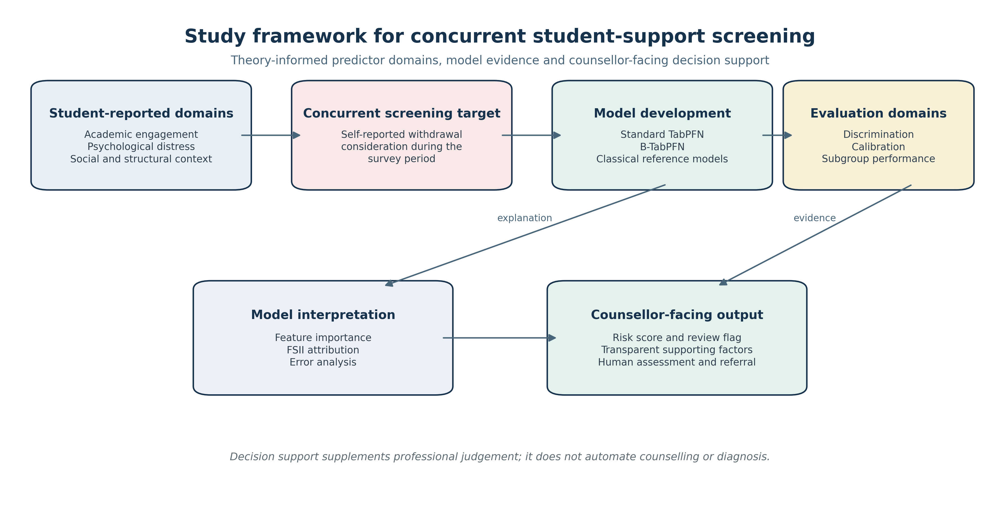

Figure 2: B-TabPFN development and evaluation workflow


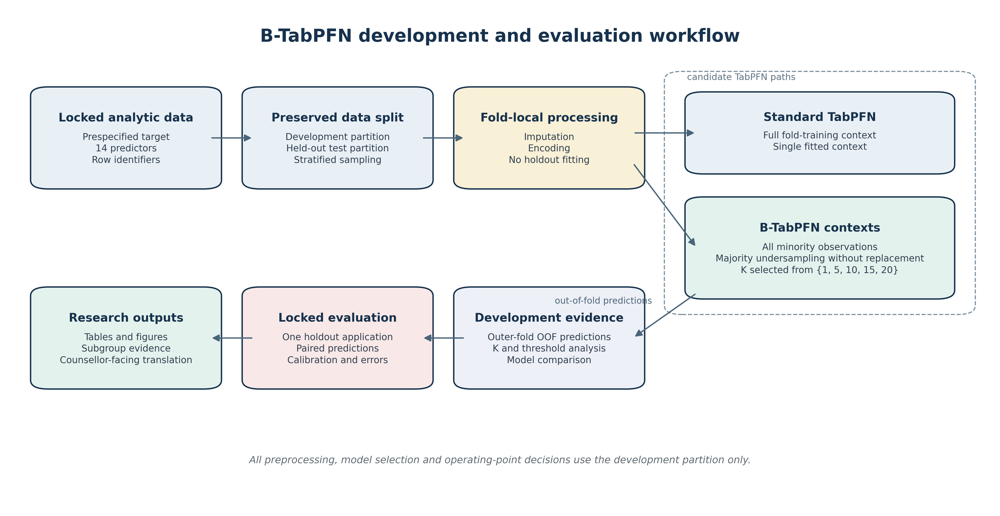

In [57]:
with analysis_component("publication_diagrams"):
    # Retain one current manifest record for each diagram generated here.
    FIGURE_RECORDS[:] = [
        record
        for record in FIGURE_RECORDS
        if record.get("figure_id") not in {"Figure 1", "Figure 2"}
    ]
    from matplotlib.patches import FancyArrowPatch, FancyBboxPatch

    def draw_box(ax, x, y, width, height, title, lines, facecolor, edgecolor="#17324D"):
        patch = FancyBboxPatch(
            (x, y), width, height,
            boxstyle="round,pad=0.012,rounding_size=0.018",
            linewidth=1.25, edgecolor=edgecolor, facecolor=facecolor,
        )
        ax.add_patch(patch)
        ax.text(x + width / 2, y + height * 0.72, title, ha="center", va="center",
                fontsize=10.5, fontweight="bold", color="#17324D")
        ax.text(x + width / 2, y + height * 0.38, "\n".join(lines), ha="center", va="center",
                fontsize=8.4, color="#2F3E4D", linespacing=1.35)
        return {"x": x, "y": y, "width": width, "height": height, "title": title, "lines": lines}

    def draw_arrow(ax, start, end, label=None):
        arrow = FancyArrowPatch(start, end, arrowstyle="-|>", mutation_scale=13,
                                linewidth=1.2, color="#496579", connectionstyle="arc3,rad=0")
        ax.add_patch(arrow)
        if label:
            ax.text((start[0] + end[0]) / 2, (start[1] + end[1]) / 2 + 0.025,
                    label, ha="center", va="bottom", fontsize=8, color="#496579")

    # Figure 1: study framework. The diagram is deliberately result-independent.
    fig, ax = plt.subplots(figsize=(15, 7.5))
    ax.set_xlim(0, 1); ax.set_ylim(0, 1); ax.axis("off")
    ax.text(0.5, 0.96, "Study framework for concurrent student-support screening",
            ha="center", va="top", fontsize=16, fontweight="bold", color="#17324D")
    ax.text(0.5, 0.905, "Theory-informed predictor domains, model evidence and counsellor-facing decision support",
            ha="center", va="top", fontsize=10, color="#496579")

    framework_boxes = []
    framework_boxes.append(draw_box(ax, .035, .64, .20, .20, "Student-reported domains",
                                    ["Academic engagement", "Psychological distress", "Social and structural context"], "#E9F0F5"))
    framework_boxes.append(draw_box(ax, .30, .64, .20, .20, "Concurrent screening target",
                                    ["Self-reported withdrawal", "consideration during the", "survey period"], "#F8E8E7"))
    framework_boxes.append(draw_box(ax, .565, .64, .20, .20, "Model development",
                                    ["Standard TabPFN", "B-TabPFN", "Classical reference models"], "#E4F2EE"))
    framework_boxes.append(draw_box(ax, .80, .64, .17, .20, "Evaluation domains",
                                    ["Discrimination", "Calibration", "Subgroup performance"], "#F8F0D7"))
    framework_boxes.append(draw_box(ax, .20, .22, .24, .21, "Model interpretation",
                                    ["Feature importance", "FSII attribution", "Error analysis"], "#EEF0F7"))
    framework_boxes.append(draw_box(ax, .56, .22, .24, .21, "Counsellor-facing output",
                                    ["Risk score and review flag", "Transparent supporting factors", "Human assessment and referral"], "#E4F2EE"))

    draw_arrow(ax, (.235, .74), (.30, .74))
    draw_arrow(ax, (.50, .74), (.565, .74))
    draw_arrow(ax, (.765, .74), (.80, .74))
    draw_arrow(ax, (.67, .64), (.38, .43), "explanation")
    draw_arrow(ax, (.92, .64), (.72, .43), "evidence")
    draw_arrow(ax, (.44, .325), (.56, .325))
    ax.text(.50, .075, "Decision support supplements professional judgement; it does not automate counselling or diagnosis.",
            ha="center", fontsize=9, color="#5F6B73", style="italic")
    framework_spec = {
        "figure": "Figure 01", "title": "Study framework for concurrent student-support screening",
        "boxes": framework_boxes,
        "principle": "Decision support supplements professional judgement and is not an automated clinical decision.",
    }
    atomic_json(framework_spec, ARTIFACT_DIR / "study_framework_spec.json")
    save_publication_figure(fig, "fig01_study_framework", "Study framework for concurrent student-support screening",
                            ["study_framework_spec.json", "analysis_config.json", "target_definition.json"], "Study design")

    # Figure 2: computational workflow, including the precise balanced-context mechanism.
    fig, ax = plt.subplots(figsize=(16, 8.2))
    ax.set_xlim(0, 1); ax.set_ylim(0, 1); ax.axis("off")
    ax.text(0.5, 0.96, "B-TabPFN development and evaluation workflow",
            ha="center", va="top", fontsize=16, fontweight="bold", color="#17324D")
    workflow_boxes = []
    workflow_boxes.append(draw_box(ax, .035, .65, .17, .18, "Locked analytic data",
                                   ["Prespecified target", "14 predictors", "Row identifiers"], "#E9F0F5"))
    workflow_boxes.append(draw_box(ax, .25, .65, .17, .18, "Preserved data split",
                                   ["Development partition", "Held-out test partition", "Stratified sampling"], "#E9F0F5"))
    workflow_boxes.append(draw_box(ax, .465, .65, .17, .18, "Fold-local processing",
                                   ["Imputation", "Encoding", "No holdout fitting"], "#F8F0D7"))
    workflow_boxes.append(draw_box(ax, .70, .68, .25, .14, "Standard TabPFN",
                                   ["Full fold-training context", "Single fitted context"], "#E9F0F5"))
    workflow_boxes.append(draw_box(ax, .70, .43, .25, .18, "B-TabPFN contexts",
                                   ["All minority observations", "Majority undersampling without replacement", "K selected from {1, 5, 10, 15, 20}"], "#E4F2EE"))
    workflow_boxes.append(draw_box(ax, .465, .25, .17, .18, "Development evidence",
                                   ["Outer-fold OOF predictions", "K and threshold analysis", "Model comparison"], "#EEF0F7"))
    workflow_boxes.append(draw_box(ax, .25, .25, .17, .18, "Locked evaluation",
                                   ["One holdout application", "Paired predictions", "Calibration and errors"], "#F8E8E7"))
    workflow_boxes.append(draw_box(ax, .035, .25, .17, .18, "Research outputs",
                                   ["Tables and figures", "Subgroup evidence", "Counsellor-facing translation"], "#E4F2EE"))

    model_group = FancyBboxPatch((.675, .395), .30, .47,
                                 boxstyle="round,pad=0.008,rounding_size=0.018",
                                 linewidth=1.0, linestyle="--", edgecolor="#7B8F9D",
                                 facecolor="none")
    ax.add_patch(model_group)
    ax.text(.69, .852, "candidate TabPFN paths", ha="left", va="bottom",
            fontsize=8.2, color="#5F7482")

    draw_arrow(ax, (.205, .74), (.25, .74))
    draw_arrow(ax, (.42, .74), (.465, .74))
    draw_arrow(ax, (.635, .75), (.70, .75))
    draw_arrow(ax, (.635, .69), (.70, .52))
    draw_arrow(ax, (.70, .43), (.635, .34))
    ax.text(.605, .405, "out-of-fold predictions", ha="center", va="bottom",
            fontsize=8, color="#496579")
    draw_arrow(ax, (.465, .34), (.42, .34))
    draw_arrow(ax, (.25, .34), (.205, .34))
    ax.text(.50, .09, "All preprocessing, model selection and operating-point decisions use the development partition only.",
            ha="center", fontsize=9, color="#5F6B73", style="italic")
    workflow_spec = {
        "figure": "Figure 02", "title": "B-TabPFN development and evaluation workflow",
        "boxes": workflow_boxes,
        "balance_mechanism": "All minority observations plus majority undersampling without replacement.",
        "candidate_k": [1, 5, 10, 15, 20],
        "selection_scope": "Development partition only",
    }
    atomic_json(workflow_spec, ARTIFACT_DIR / "model_workflow_spec.json")
    save_publication_figure(fig, "fig02_model_workflow", "B-TabPFN development and evaluation workflow",
                            ["model_workflow_spec.json", "model_specifications.json", "analysis_config.json"], "Model development")


Figure 3: Participant flow


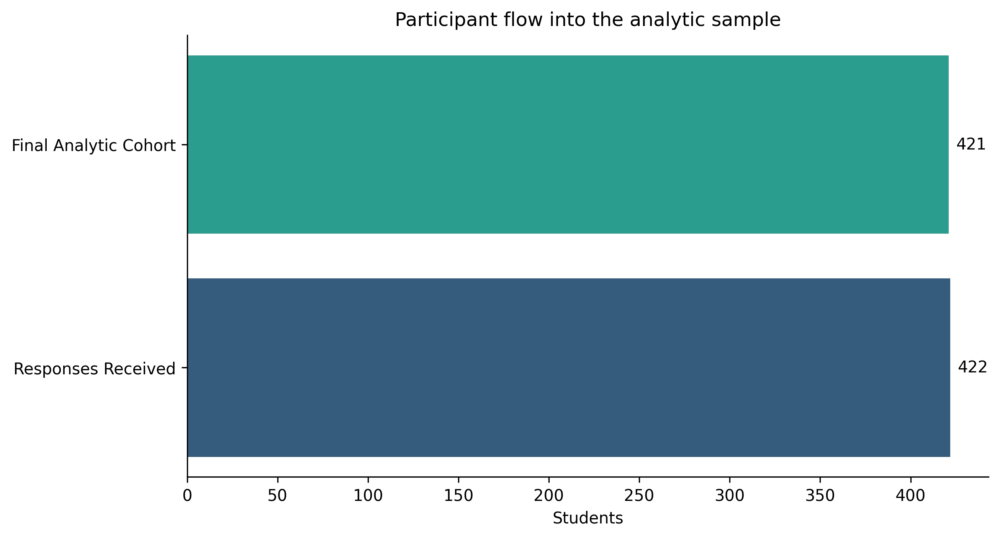

Figure 4: Sample demographic composition


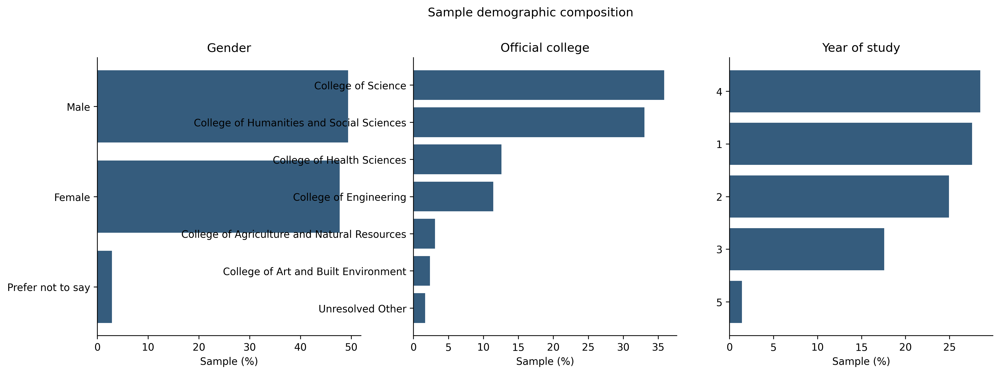

Figure 5: Target prevalence by demographic group


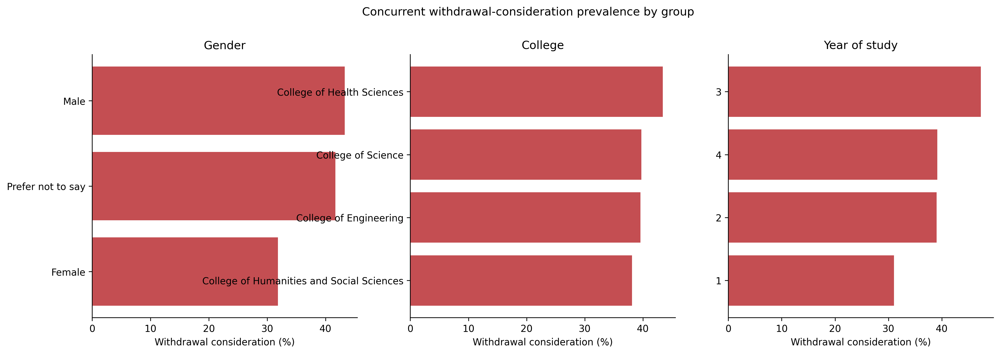

Figure 6: Predictor missingness


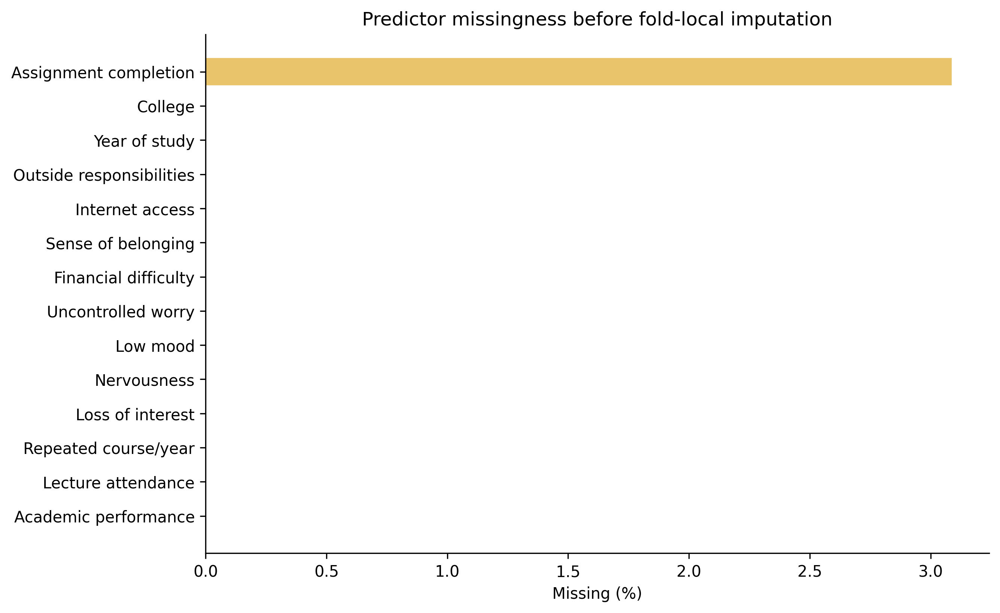

Figure 7: Predictor correlation


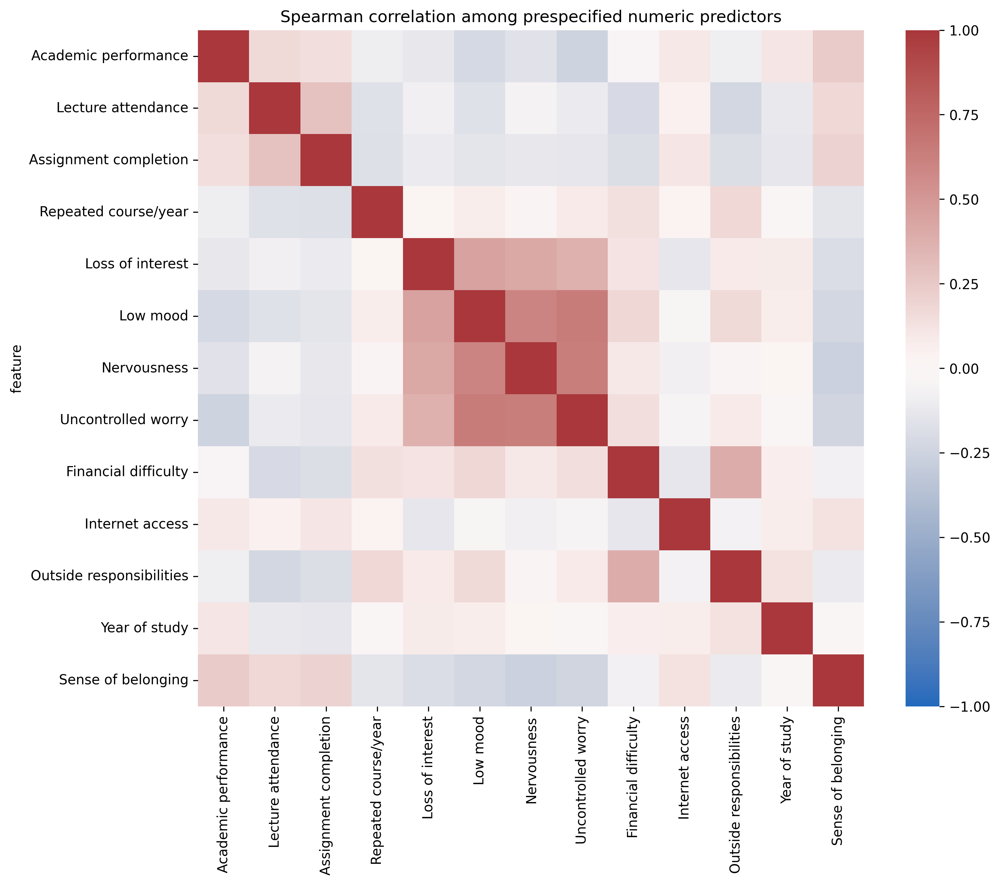

Figure 8: Development-only permutation diagnostic


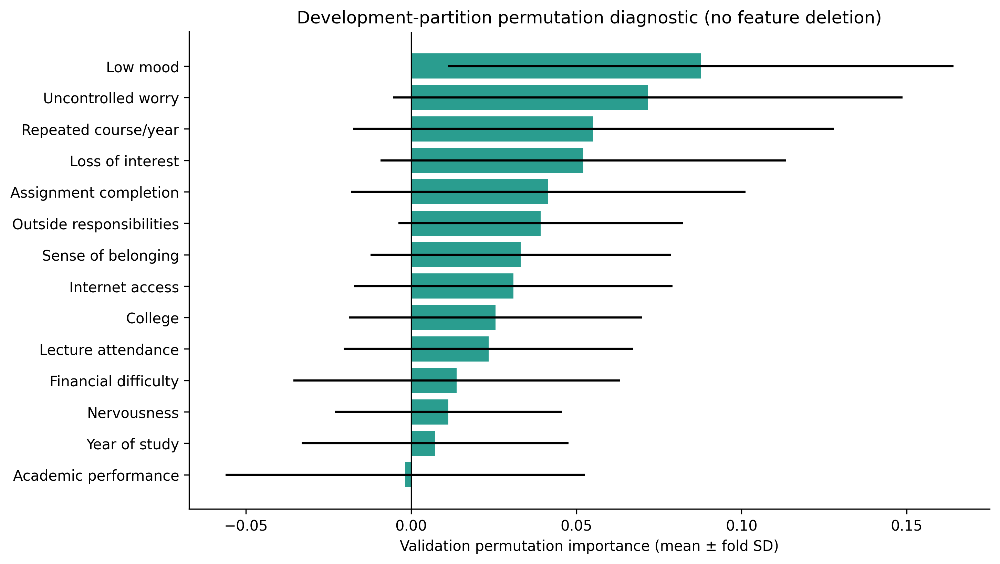

Figure 9: Development model comparison


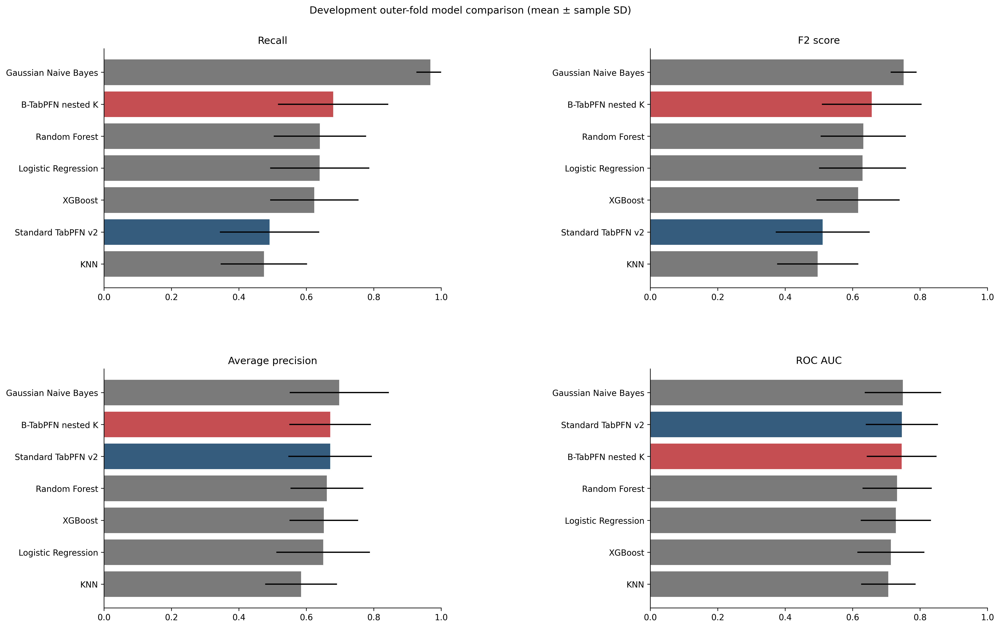

Figure 10: Development out-of-fold ROC and precision–recall comparison


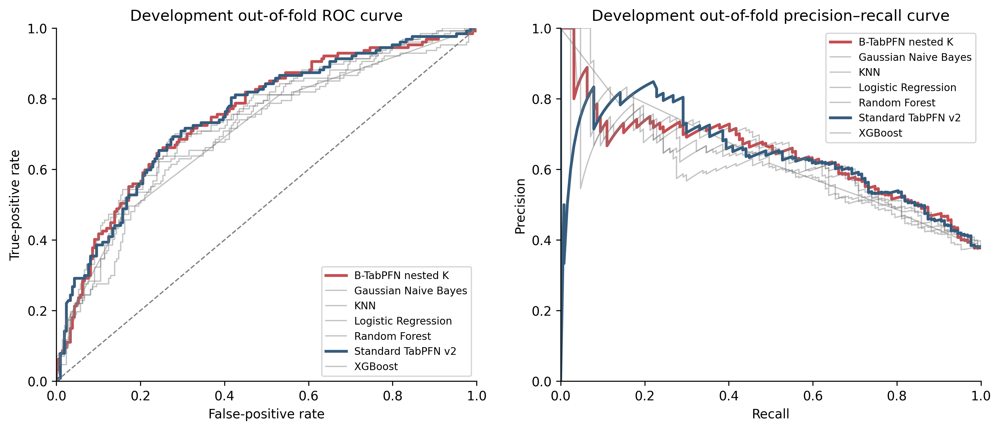

Figure 11: Outer-fold recall distribution


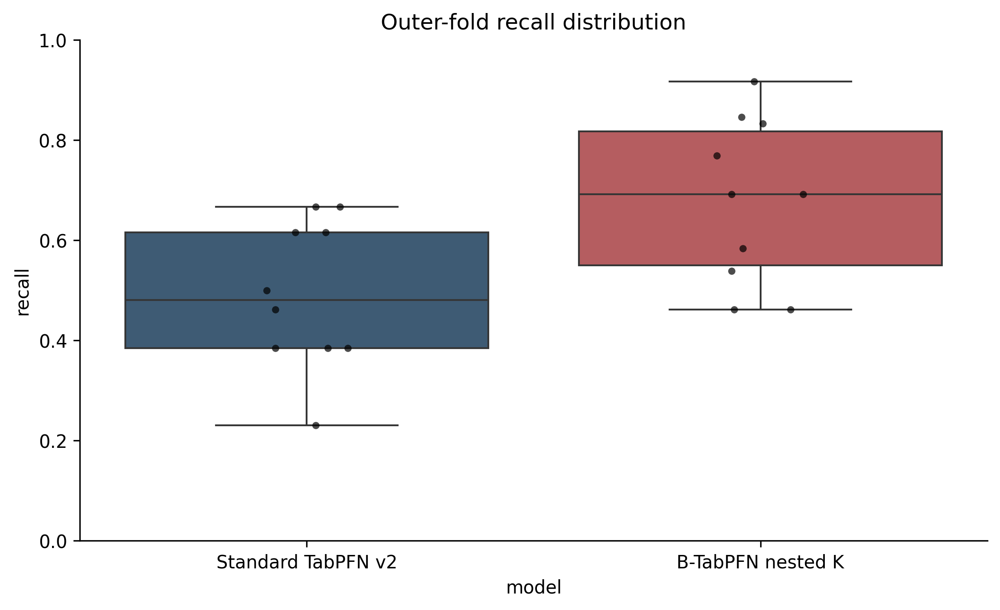

In [58]:
with analysis_component("publication_figures_part1"):
    # Retain one current manifest record for each figure generated by this section.
    FIGURE_RECORDS[:] = [
        record
        for record in FIGURE_RECORDS
        if not (
            re.match(r"Figure (\d+)", record.get("figure_id", ""))
            and int(re.match(r"Figure (\d+)", record["figure_id"]).group(1)) in range(3, 12)
        )
    ]
    # Figures 3–11: study flow, sample, construct, provenance and development results.
    flow_source = read_artifact("participant_flow_summary.csv")
    fig, ax = plt.subplots(figsize=(9, 5))
    plot_flow = flow_source[flow_source["stage"].isin(["responses_received", "final_analytic_cohort"])]
    ax.barh(plot_flow["stage"].str.replace("_", " ").str.title(), plot_flow["n"], color=[PUBLICATION_PALETTE["standard"], PUBLICATION_PALETTE["accent"]])
    for y, value in enumerate(plot_flow["n"]): ax.text(value + max(plot_flow["n"]) * .01, y, str(int(value)), va="center")
    ax.set_xlabel("Students"); ax.set_title("Participant flow into the analytic sample")
    save_publication_figure(fig, "fig03_participant_flow", "Participant flow", ["participant_flow_summary.csv"], "Methods/sample")

    demo = read_artifact("sample_demographics_extended.csv")
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    for ax, dimension in zip(axes, ["gender", "official_college", "year"]):
        part = demo[demo["dimension"].eq(dimension)].sort_values("sample_n")
        ax.barh(part["group"].astype(str), part["sample_percent"], color=PUBLICATION_PALETTE["standard"])
        ax.set_title({"gender": "Gender", "official_college": "Official college", "year": "Year of study"}[dimension]); ax.set_xlabel("Sample (%)")
    fig.suptitle("Sample demographic composition", y=1.02)
    save_publication_figure(fig, "fig04_sample_demographics", "Sample demographic composition", ["sample_demographics_extended.csv"], "Methods/sample")

    target_group = read_artifact("target_prevalence_by_group.csv")
    fig, axes = plt.subplots(1, 3, figsize=(17, 5))
    for ax, variable in zip(axes, ["Q15_Gender", "Q13_Faculty", "Q14_Year"]):
        part = target_group[target_group["group_variable"].eq(variable)].sort_values("prevalence")
        ax.barh(part["group"], 100 * part["prevalence"], color=PUBLICATION_PALETTE["balanced"])
        ax.set_title(GROUP_LABELS[variable]); ax.set_xlabel("Withdrawal consideration (%)")
    fig.suptitle("Concurrent withdrawal-consideration prevalence by group", y=1.02)
    save_publication_figure(fig, "fig05_target_prevalence_groups", "Target prevalence by demographic group", ["target_prevalence_by_group.csv"], "Descriptive results")

    missing = read_artifact("missingness_by_feature.csv").sort_values("missing_percent")
    fig, ax = plt.subplots(figsize=(9, 6)); ax.barh(missing["feature"].map(readable_feature), missing["missing_percent"], color=PUBLICATION_PALETTE["gold"])
    ax.set_xlabel("Missing (%)"); ax.set_title("Predictor missingness before fold-local imputation")
    save_publication_figure(fig, "fig06_missingness", "Predictor missingness", ["missingness_by_feature.csv"], "Methods/data quality")

    fig, ax = plt.subplots(figsize=(11, 9))
    correlation = read_artifact("predictor_spearman_correlation.csv").set_index("feature")
    correlation = correlation.rename(index=FEATURE_LABELS, columns=FEATURE_LABELS)
    sns.heatmap(correlation, cmap="vlag", center=0, vmin=-1, vmax=1, ax=ax)
    ax.set_title("Spearman correlation among prespecified numeric predictors")
    save_publication_figure(fig, "fig07_predictor_correlation", "Predictor correlation", ["predictor_spearman_correlation.csv"], "Descriptive results")

    importance = read_artifact("permutation_importance_foldwise.csv")
    importance_summary = importance.groupby("feature")["importance_mean"].agg(["mean", "std"]).reset_index().sort_values("mean")
    fig, ax = plt.subplots(figsize=(10, 6)); ax.barh(importance_summary["feature"].map(readable_feature), importance_summary["mean"], xerr=importance_summary["std"], color=PUBLICATION_PALETTE["accent"])
    ax.axvline(0, color="black", lw=.8); ax.set_xlabel("Validation permutation importance (mean ± fold SD)")
    ax.set_title("Development-partition permutation diagnostic (no feature deletion)")
    save_publication_figure(fig, "fig08_permutation_diagnostic", "Development-only permutation diagnostic", ["permutation_importance_foldwise.csv", "feature_retention_decision.csv"], "Methods/provenance")

    development = read_artifact("development_model_summary_mean_sd.csv")
    dev_plot = development[development["metric"].isin(["recall", "f2", "average_precision", "auc_roc"])].copy()
    fig, axes = plt.subplots(2, 2, figsize=(18, 11), sharey=False)
    for ax, metric in zip(axes.ravel(), ["recall", "f2", "average_precision", "auc_roc"]):
        part = dev_plot[dev_plot["metric"].eq(metric)].sort_values("mean")
        colors = [PUBLICATION_PALETTE["balanced"] if name.startswith("B-TabPFN") else PUBLICATION_PALETTE["standard"] if name.startswith("Standard") else PUBLICATION_PALETTE["baseline"] for name in part["model"]]
        ax.barh(part["model"], part["mean"], xerr=part["sd"], color=colors); ax.set_title(METRIC_LABELS[metric]); ax.set_xlim(0, 1)
    fig.suptitle("Development outer-fold model comparison (mean ± sample SD)", y=0.995)
    fig.subplots_adjust(left=0.16, right=0.98, bottom=0.08, top=0.93, wspace=0.62, hspace=0.34)
    save_publication_figure(fig, "fig09_development_model_comparison", "Development model comparison", ["development_model_summary_mean_sd.csv"], "Primary development results")

    curves = read_artifact("roc_pr_curve_points.csv")
    preferred_models = ["Standard TabPFN v2", OOF_B_NAME]
    fig, axes = plt.subplots(1, 2, figsize=(13, 5))
    for model_name in sorted(curves["model"].unique()):
        is_primary = model_name in preferred_models
        color = PUBLICATION_PALETTE["balanced"] if model_name.startswith("B-") else PUBLICATION_PALETTE["standard"] if model_name.startswith("Standard") else PUBLICATION_PALETTE["baseline"]
        for ax, curve_name in zip(axes, ["ROC", "PR"]):
            part = curves[(curves["model"].eq(model_name)) & (curves["curve"].eq(curve_name))]
            ax.plot(part["x"], part["y"], label=model_name, color=color, lw=2.2 if is_primary else 1, alpha=1 if is_primary else .45)
    axes[0].plot([0, 1], [0, 1], "--", color="grey", lw=1); axes[0].set(xlabel="False-positive rate", ylabel="True-positive rate", title="Development out-of-fold ROC curve")
    axes[1].set(xlabel="Recall", ylabel="Precision", title="Development out-of-fold precision–recall curve")
    for ax in axes: ax.legend(); ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    save_publication_figure(fig, "fig10_oof_roc_pr", "Development out-of-fold ROC and precision–recall comparison", ["roc_pr_curve_points.csv"], "Primary development results")

    folds = read_artifact("development_fold_metrics.csv")
    folds = folds[folds["model"].isin(preferred_models)]
    fig, ax = plt.subplots(figsize=(9, 5)); sns.boxplot(data=folds, x="model", y="recall", hue="model", palette=[PUBLICATION_PALETTE["standard"], PUBLICATION_PALETTE["balanced"]], legend=False, ax=ax)
    sns.stripplot(data=folds, x="model", y="recall", color="black", size=4, alpha=.7, ax=ax)
    ax.set_ylim(0, 1); ax.set_title("Outer-fold recall distribution")
    save_publication_figure(fig, "fig11_fold_recall_distribution", "Outer-fold recall distribution", ["development_fold_metrics.csv"], "Effect/stability evidence")


Figure 12a: Development performance across balanced-context ensemble sizes


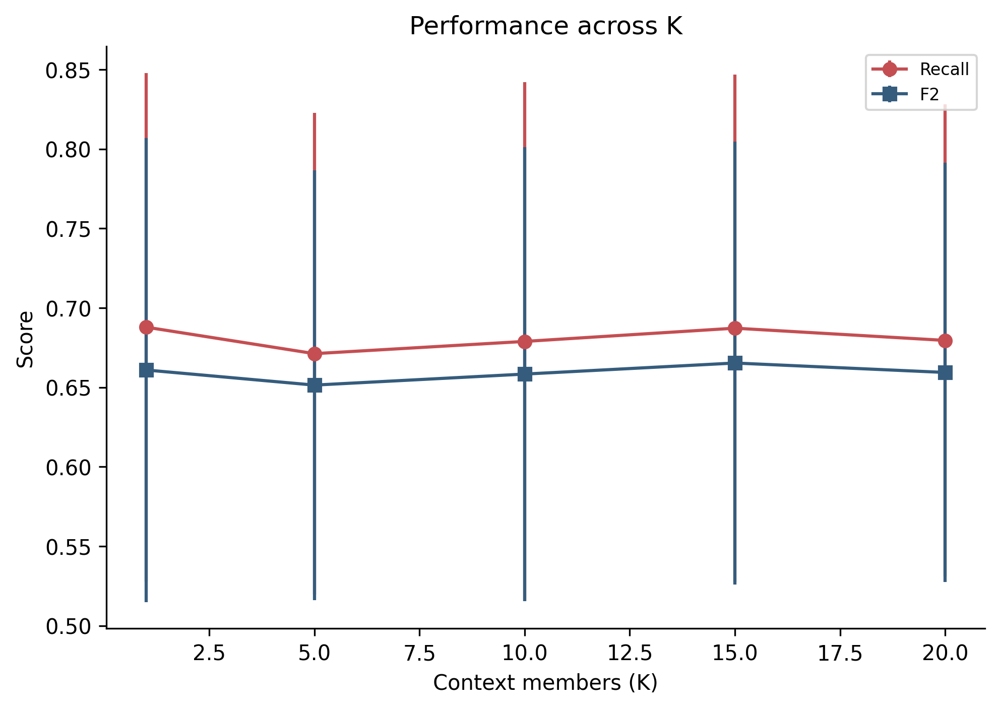

Figure 12b: Development calibration across balanced-context ensemble sizes


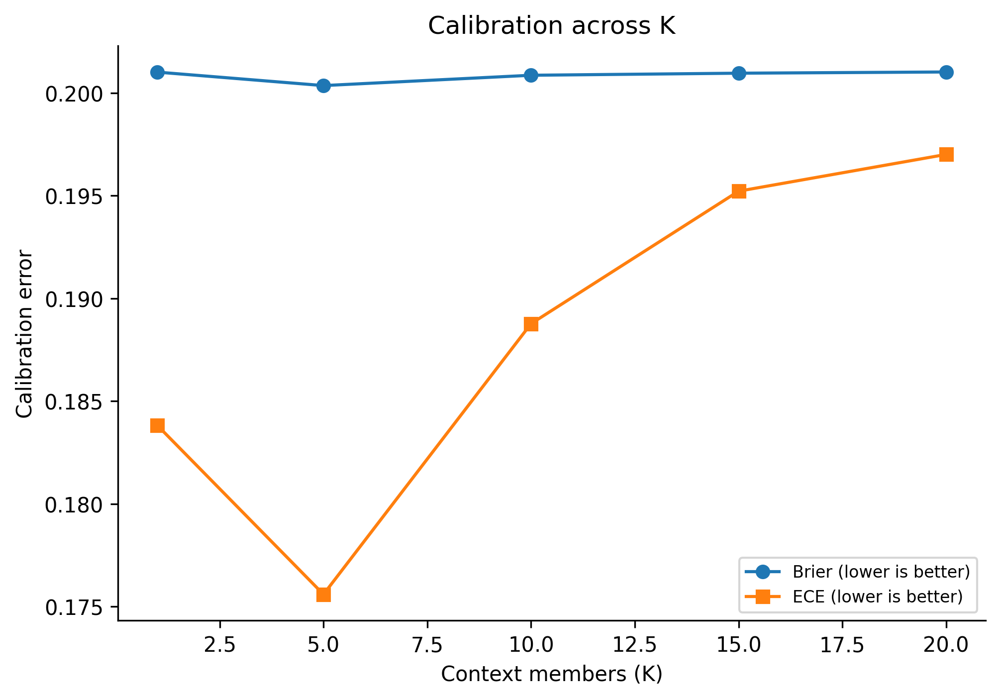

Figure 13: Development out-of-fold threshold sensitivity


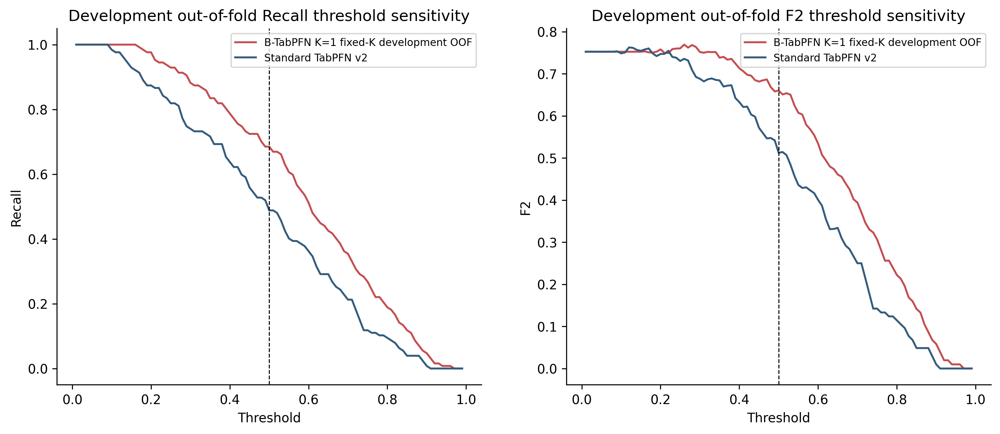

Figure 14: Held-out-test performance


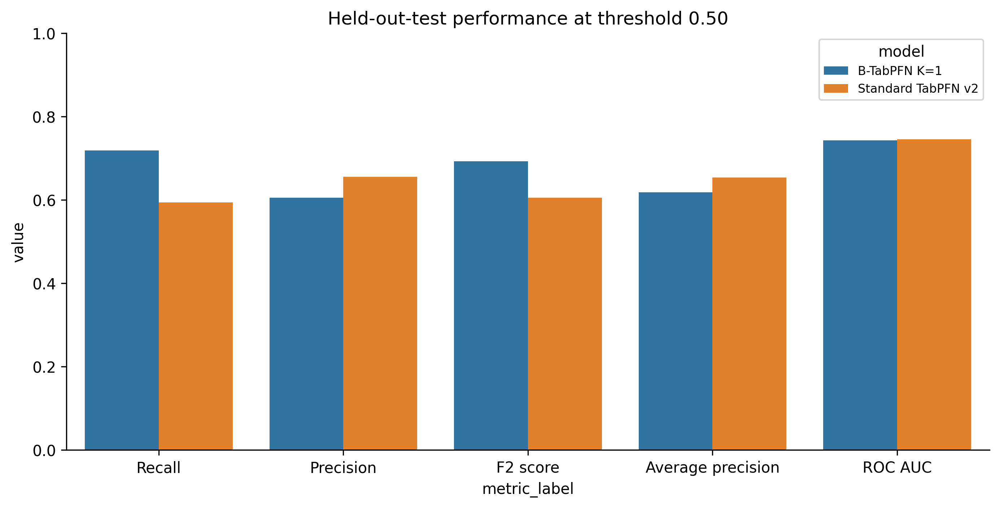

Figure 15: Held-out-test confusion matrices


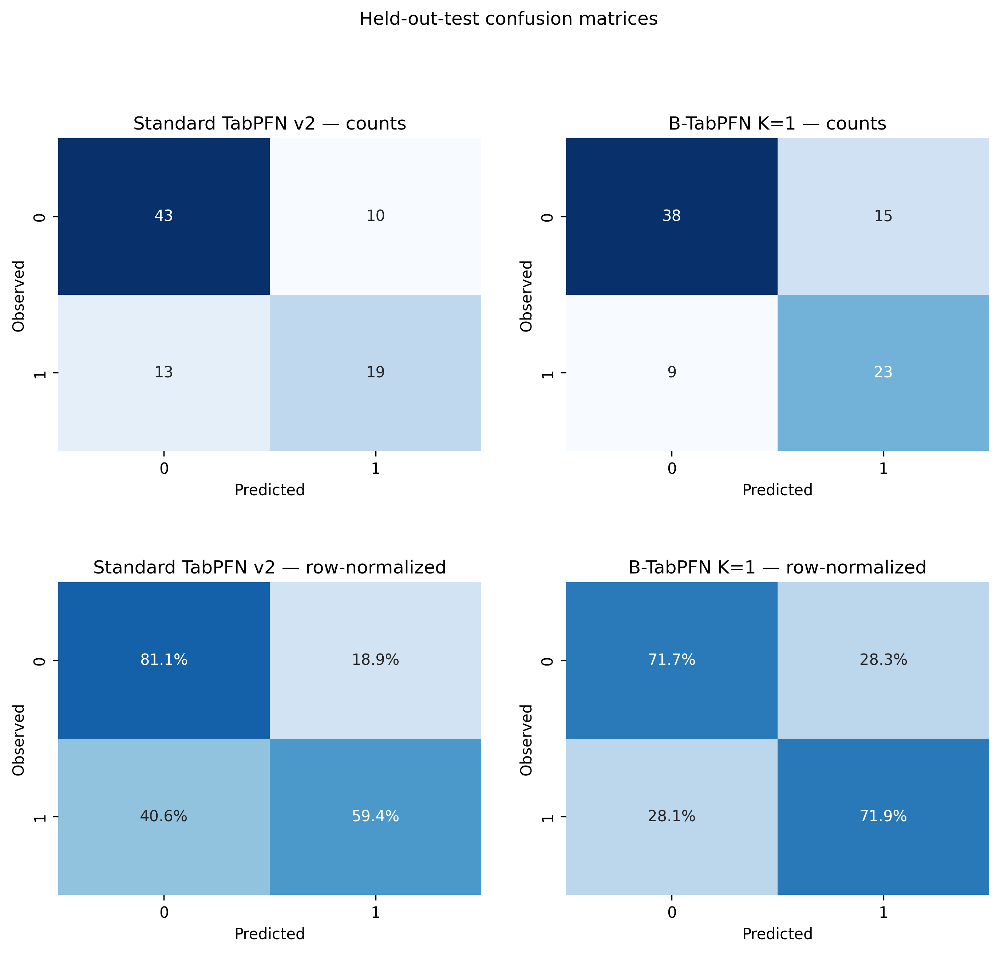

Figure 16: Calibration curves by partition


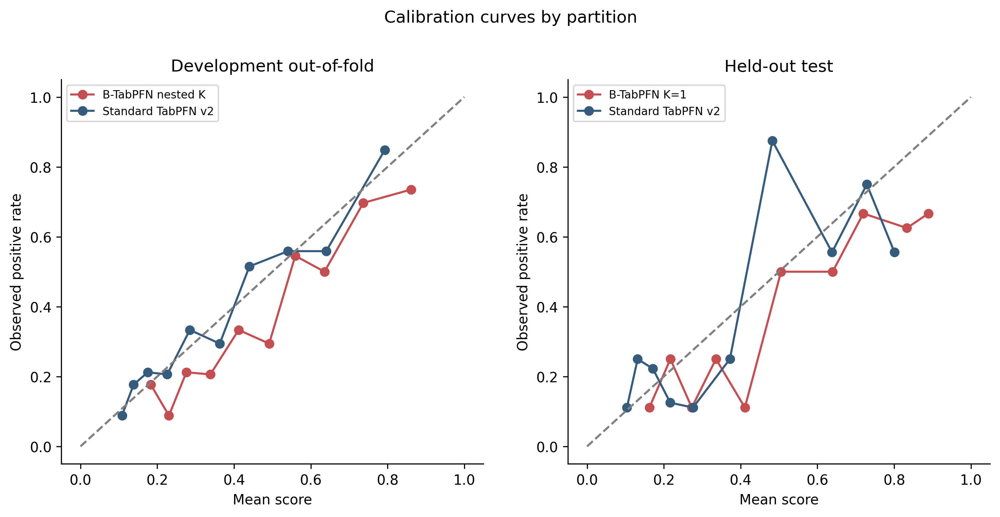

Figure 17: Recalibration performance trade-off


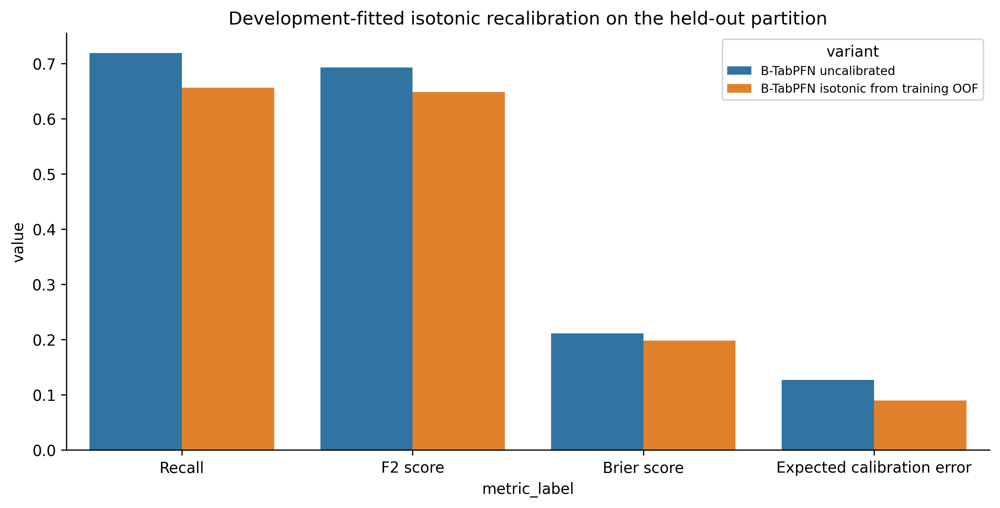

Figure 18a: Split-seed sensitivity: Recall


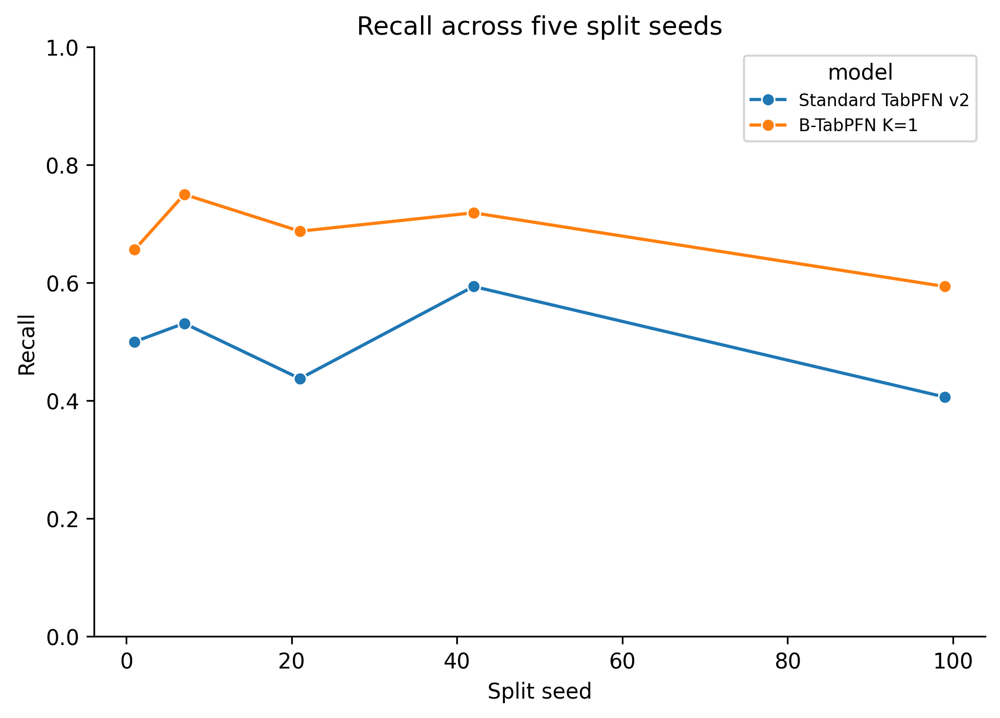

Figure 18b: Split-seed sensitivity: F2 score


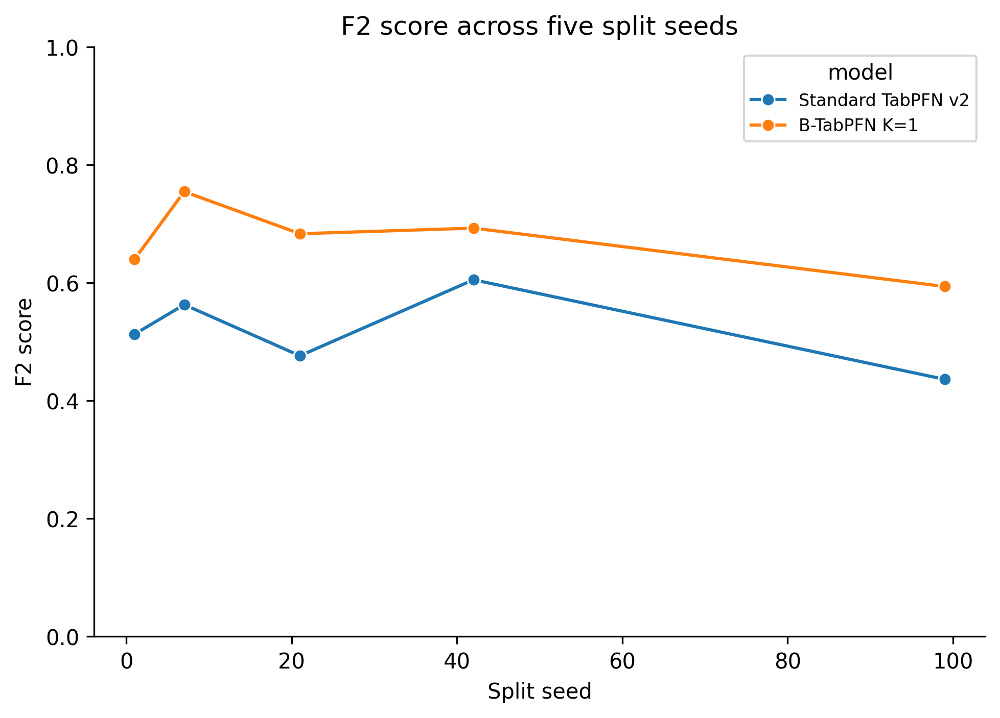

Figure 18c: Split-seed sensitivity: Average precision


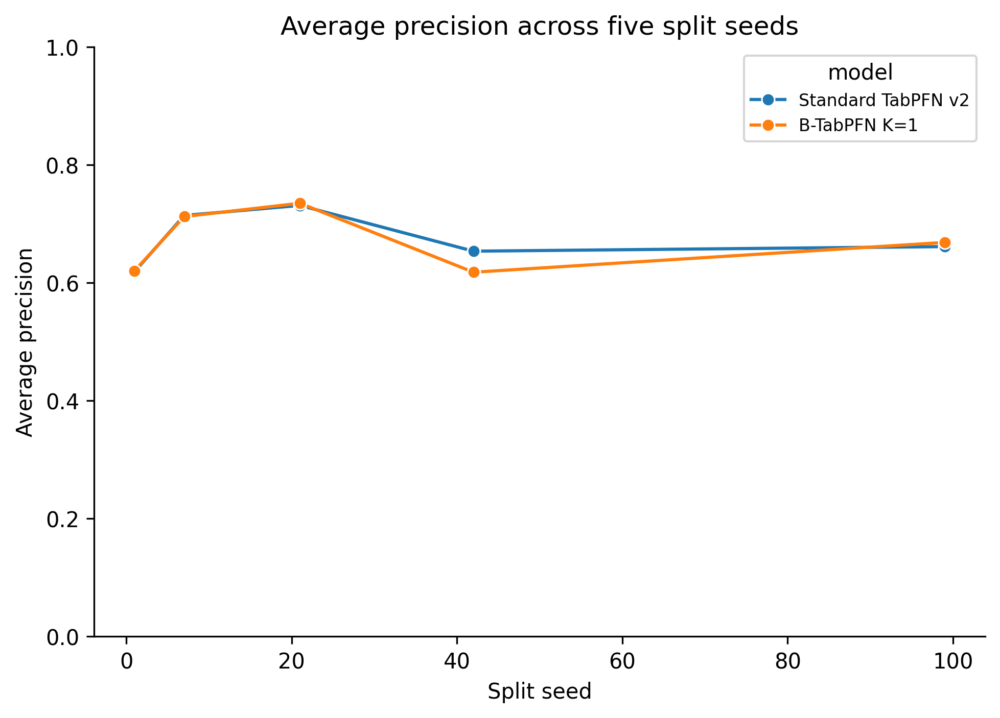

Figure 18d: Split-seed sensitivity: ROC AUC


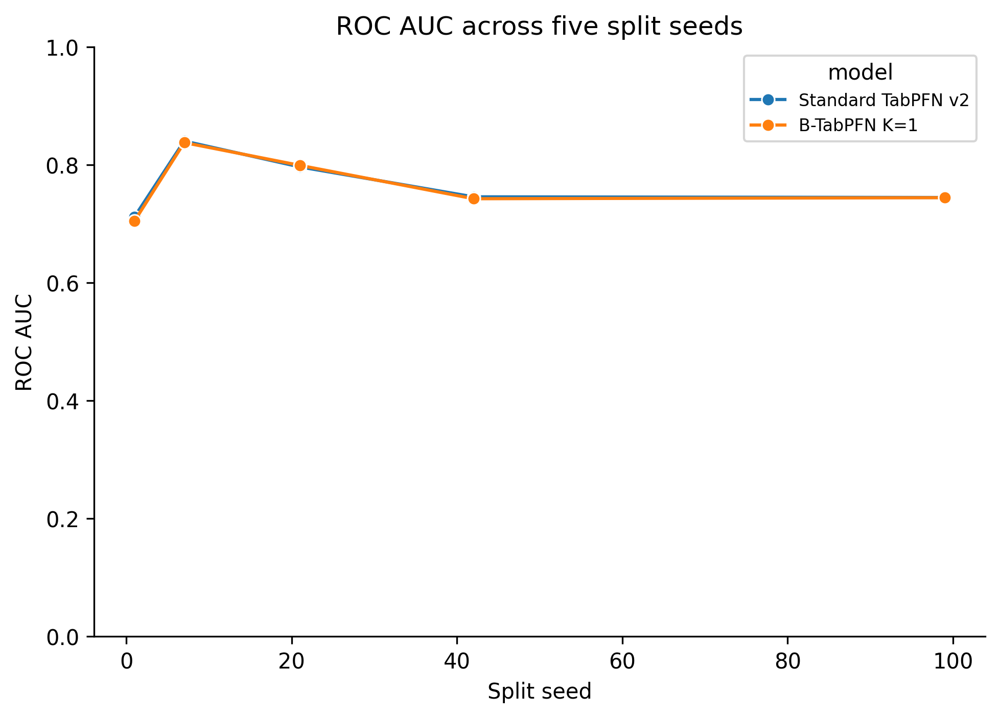

Figure 19a: Recall by context balance and ensemble size


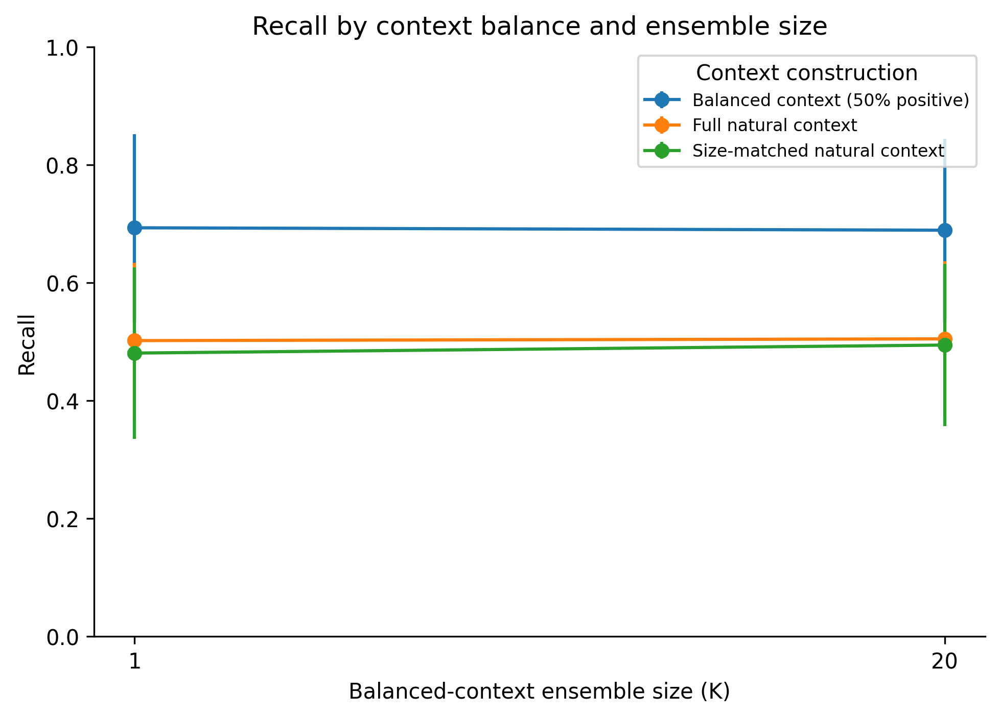

Figure 19b: Calibration by context balance and ensemble size


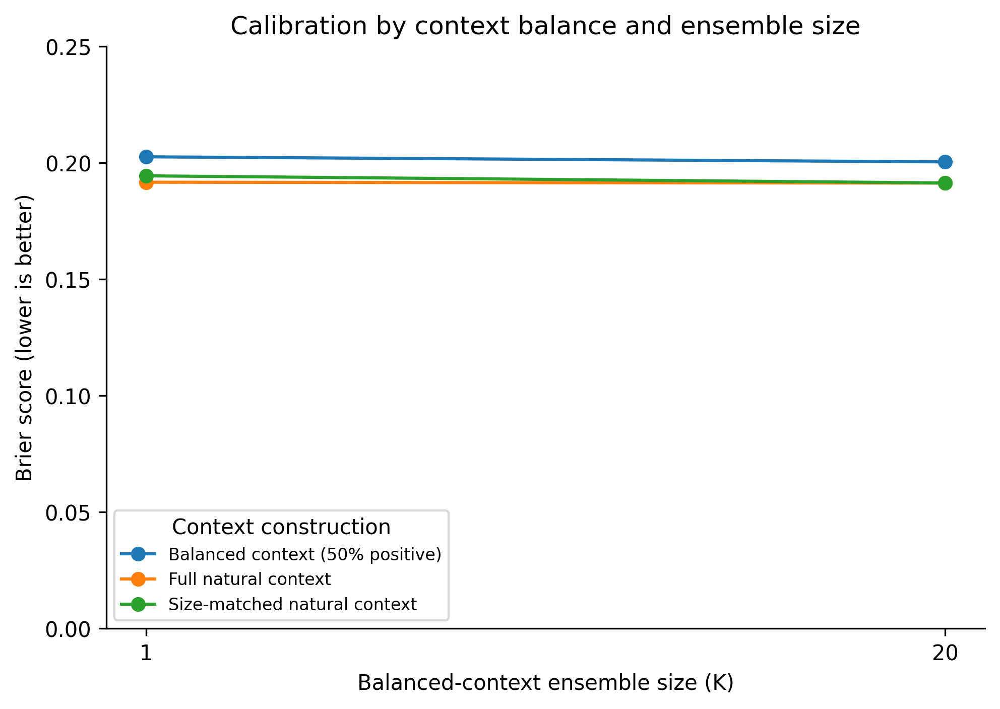

Figure 20a: Recall sensitivity to balanced-context composition


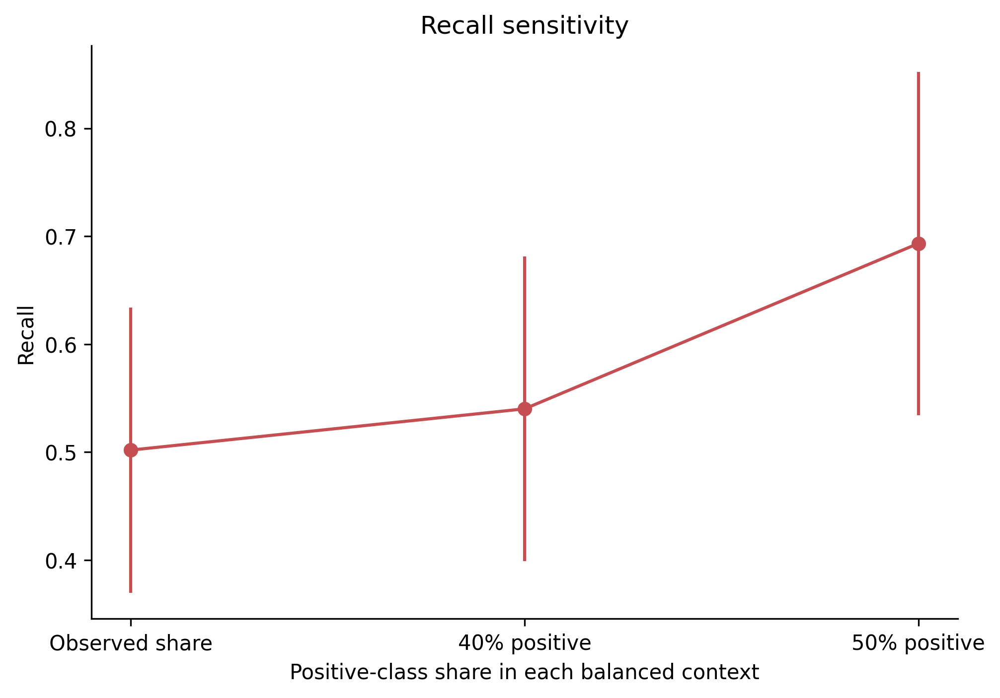

Figure 20b: Calibration sensitivity to balanced-context composition


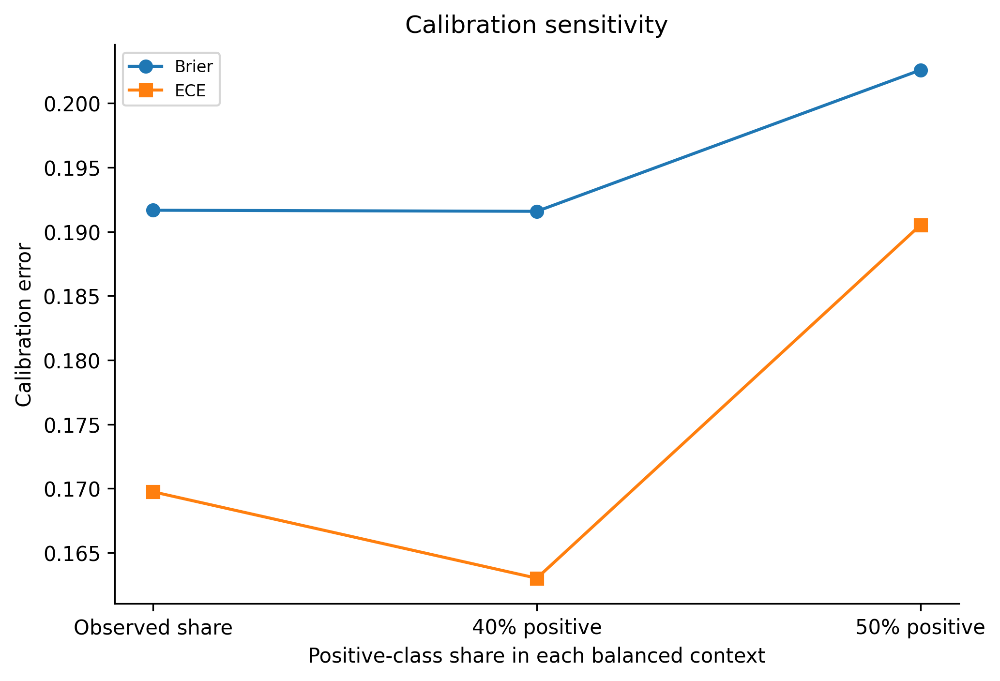

In [59]:
with analysis_component("publication_figures_part2"):
    # Retain one current manifest record for each figure generated by this section.
    FIGURE_RECORDS[:] = [
        record
        for record in FIGURE_RECORDS
        if not (
            re.match(r"Figure (\d+)", record.get("figure_id", ""))
            and int(re.match(r"Figure (\d+)", record["figure_id"]).group(1)) in range(12, 21)
        )
    ]

    # Figures 12–20: mechanism, threshold, held-out-test,
    # calibration and operational evidence.
    test_models = ["Standard TabPFN v2", FINAL_B_NAME]

    k_data = read_artifact("k_ablation.csv")
    fig, ax = plt.subplots(figsize=(7.5, 5))

    ax.errorbar(
        k_data["K"],
        k_data["recall_mean"],
        yerr=k_data["recall_sd"],
        marker="o",
        color=PUBLICATION_PALETTE["balanced"],
        label="Recall",
    )
    ax.errorbar(
        k_data["K"],
        k_data["f2_mean"],
        yerr=k_data["f2_sd"],
        marker="s",
        color=PUBLICATION_PALETTE["standard"],
        label="F2",
    )
    ax.set(
        xlabel="Context members (K)",
        ylabel="Score",
        title="Performance across K",
    )
    ax.legend()

    save_publication_figure(
        fig,
        "fig12a_k_predictive_performance",
        "Development performance across balanced-context ensemble sizes",
        ["k_ablation.csv"],
        "Context-size sensitivity",
    )

    fig, ax = plt.subplots(figsize=(7.5, 5))
    ax.plot(
        k_data["K"],
        k_data["brier_mean"],
        marker="o",
        label="Brier (lower is better)",
    )
    ax.plot(
        k_data["K"],
        k_data["ece_mean"],
        marker="s",
        label="ECE (lower is better)",
    )
    ax.set(
        xlabel="Context members (K)",
        ylabel="Calibration error",
        title="Calibration across K",
    )
    ax.legend()

    save_publication_figure(
        fig,
        "fig12b_k_calibration",
        "Development calibration across balanced-context ensemble sizes",
        ["k_ablation.csv"],
        "Context-size calibration sensitivity",
    )

    threshold = read_artifact("threshold_sensitivity_oof.csv")
    fig, axes = plt.subplots(1, 2, figsize=(13, 5))

    for model_name, part in threshold.groupby("model"):
        color = (
            PUBLICATION_PALETTE["balanced"]
            if model_name.startswith("B-")
            else PUBLICATION_PALETTE["standard"]
        )
        axes[0].plot(
            part["threshold"],
            part["recall"],
            label=model_name,
            color=color,
        )
        axes[1].plot(
            part["threshold"],
            part["f2"],
            label=model_name,
            color=color,
        )

    for ax, title in zip(axes, ["Recall", "F2"]):
        ax.axvline(0.5, linestyle="--", color="black", linewidth=0.8)
        ax.set(
            xlabel="Threshold",
            ylabel=title,
            title=f"Development out-of-fold {title} threshold sensitivity",
        )
        ax.legend()

    save_publication_figure(
        fig,
        "fig13_threshold_sensitivity",
        "Development out-of-fold threshold sensitivity",
        ["threshold_sensitivity_oof.csv", "selected_thresholds.json"],
        "Operating-point evidence",
    )

    heldout = read_artifact("heldout_test_summary.csv")
    heldout_plot = heldout[heldout["model"].isin(test_models)].copy()

    missing_test_models = sorted(
        set(test_models) - set(heldout_plot["model"])
    )
    if missing_test_models:
        raise RuntimeError(
            f"Held-out summary is missing models: {missing_test_models}"
        )

    heldout_long = heldout_plot.melt(
        id_vars="model",
        value_vars=[
            "recall",
            "precision",
            "f2",
            "average_precision",
            "auc_roc",
        ],
        var_name="metric",
        value_name="value",
    )
    heldout_long["metric_label"] = heldout_long["metric"].map(METRIC_LABELS)

    fig, ax = plt.subplots(figsize=(11, 5))
    sns.barplot(
        data=heldout_long,
        x="metric_label",
        y="value",
        hue="model",
        ax=ax,
    )
    ax.set_ylim(0, 1)
    ax.set_title("Held-out-test performance at threshold 0.50")

    save_publication_figure(
        fig,
        "fig14_heldout_test_performance",
        "Held-out-test performance",
        ["heldout_test_summary.csv"],
        "Secondary held-out-test results",
    )

    heldout_ordered = (
        heldout_plot
        .set_index("model")
        .loc[test_models]
        .reset_index()
    )

    fig, axes = plt.subplots(2, 2, figsize=(11, 9))

    for column, (_, row) in enumerate(heldout_ordered.iterrows()):
        confusion = np.array(
            [
                [row["tn"], row["fp"]],
                [row["fn"], row["tp"]],
            ],
            dtype=int,
        )

        sns.heatmap(
            confusion,
            annot=True,
            fmt="d",
            cmap="Blues",
            cbar=False,
            ax=axes[0, column],
        )
        axes[0, column].set(
            xlabel="Predicted",
            ylabel="Observed",
            title=f"{row['model']} — counts",
        )

        row_totals = confusion.sum(axis=1, keepdims=True)
        if np.any(row_totals == 0):
            raise RuntimeError(
                f"Cannot normalize confusion matrix for {row['model']}."
            )

        confusion_normalized = confusion / row_totals

        sns.heatmap(
            confusion_normalized,
            annot=True,
            fmt=".1%",
            cmap="Blues",
            vmin=0,
            vmax=1,
            cbar=False,
            ax=axes[1, column],
        )
        axes[1, column].set(
            xlabel="Predicted",
            ylabel="Observed",
            title=f"{row['model']} — row-normalized",
        )

    fig.suptitle("Held-out-test confusion matrices", y=1.01)
    fig.subplots_adjust(hspace=0.42)

    save_publication_figure(
        fig,
        "fig15_heldout_test_confusion",
        "Held-out-test confusion matrices",
        ["heldout_test_summary.csv"],
        "Secondary held-out-test results",
    )

    cal_points = read_artifact("calibration_curve_points.csv")
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    for ax, partition in zip(
        axes,
        ["training_oof", "held_out_test"],
    ):
        partition_data = cal_points[
            cal_points["partition"].eq(partition)
        ]

        if partition_data.empty:
            raise RuntimeError(
                f"No calibration-curve data for partition: {partition}"
            )

        for model_name, part in partition_data.groupby("model"):
            color = (
                PUBLICATION_PALETTE["balanced"]
                if model_name.startswith("B-")
                else PUBLICATION_PALETTE["standard"]
            )
            ax.plot(
                part["mean_score"],
                part["observed_rate"],
                marker="o",
                label=model_name,
                color=color,
            )

        ax.plot([0, 1], [0, 1], "--", color="grey")
        ax.set(
            xlabel="Mean score",
            ylabel="Observed positive rate",
            title=PARTITION_LABELS[partition],
        )
        ax.legend()

    fig.suptitle("Calibration curves by partition", y=1.02)

    save_publication_figure(
        fig,
        "fig16_calibration_curves",
        "Calibration curves by partition",
        [
            "calibration_curve_points.csv",
            "calibration_by_partition.csv",
        ],
        "Calibration evidence",
    )

    recalibration = read_artifact("recalibration_comparison.csv")
    recalibration_holdout = recalibration[
        recalibration["partition"].eq("held_out_test")
    ].copy()

    if recalibration_holdout.empty:
        raise RuntimeError(
            "The recalibration summary has no held-out-test rows."
        )

    recalibration_long = recalibration_holdout.melt(
        id_vars="variant",
        value_vars=["recall", "f2", "brier", "ece_10"],
        var_name="metric",
        value_name="value",
    )
    recalibration_long["metric_label"] = recalibration_long["metric"].map(METRIC_LABELS)

    fig, ax = plt.subplots(figsize=(11, 5))
    sns.barplot(
        data=recalibration_long,
        x="metric_label",
        y="value",
        hue="variant",
        ax=ax,
    )
    ax.set_title(
        "Development-fitted isotonic recalibration "
        "on the held-out partition"
    )

    save_publication_figure(
        fig,
        "fig17_recalibration_tradeoff",
        "Recalibration performance trade-off",
        ["recalibration_comparison.csv"],
        "Calibration/remediation evidence",
    )

    stability = (
        read_artifact("split_seed_metrics.csv")
        if CONFIG["run_stability"]
        else pd.DataFrame()
    )

    if not stability.empty:
        stability_long = (
            stability[stability["model"].isin(test_models)]
            .melt(
                id_vars=["seed", "model"],
                value_vars=[
                    "recall",
                    "f2",
                    "average_precision",
                    "auc_roc",
                ],
                var_name="metric",
                value_name="value",
            )
        )

        for panel, metric in zip(
            ["a", "b", "c", "d"],
            ["recall", "f2", "average_precision", "auc_roc"],
        ):
            part = stability_long[
                stability_long["metric"].eq(metric)
            ]
            fig, ax = plt.subplots(figsize=(7.5, 5))
            sns.lineplot(
                data=part,
                x="seed",
                y="value",
                hue="model",
                marker="o",
                ax=ax,
            )
            ax.set_ylim(0, 1)
            metric_label = METRIC_LABELS[metric]
            ax.set(
                xlabel="Split seed",
                ylabel=metric_label,
                title=f"{metric_label} across five split seeds",
            )

            save_publication_figure(
                fig,
                f"fig18{panel}_split_seed_{metric}",
                f"Split-seed sensitivity: {metric_label}",
                [
                    "split_seed_metrics.csv",
                    "effect_size_and_ci.csv",
                ],
                "Secondary stability evidence",
            )

    two_factor = read_artifact("two_factor_ablation_summary.csv")

    required_two_factor_columns = {
        "balance",
        "K",
        "recall_mean",
        "recall_sd",
        "brier_mean",
    }
    missing_two_factor_columns = sorted(
        required_two_factor_columns - set(two_factor.columns)
    )
    if missing_two_factor_columns:
        raise RuntimeError(
            "Two-factor ablation summary is missing columns: "
            f"{missing_two_factor_columns}"
        )

    fig, ax = plt.subplots(figsize=(7.5, 5))

    for balance, part in two_factor.groupby("balance"):
        part = part.sort_values("K")
        display_balance = BALANCE_LABELS.get(balance, str(balance))
        ax.errorbar(
            part["K"],
            part["recall_mean"],
            yerr=part["recall_sd"],
            marker="o",
            label=display_balance,
        )

    ax.set(
        xlabel="Balanced-context ensemble size (K)",
        ylabel="Recall",
        title="Recall by context balance and ensemble size",
    )
    ax.set_xticks(sorted(two_factor["K"].unique()))
    ax.set_ylim(0, 1)
    ax.legend(title="Context construction")

    save_publication_figure(
        fig,
        "fig19a_balance_by_k_recall",
        "Recall by context balance and ensemble size",
        [
            "two_factor_ablation_summary.csv",
            "two_factor_ablation.csv",
        ],
        "Mechanism evidence",
    )

    fig, ax = plt.subplots(figsize=(7.5, 5))
    for balance, part in two_factor.groupby("balance"):
        part = part.sort_values("K")
        display_balance = BALANCE_LABELS.get(balance, str(balance))
        ax.plot(
            part["K"],
            part["brier_mean"],
            marker="o",
            label=display_balance,
        )

    ax.set(
        xlabel="Balanced-context ensemble size (K)",
        ylabel="Brier score (lower is better)",
        title="Calibration by context balance and ensemble size",
    )
    ax.set_xticks(sorted(two_factor["K"].unique()))
    ax.set_ylim(0, 0.25)
    ax.legend(title="Context construction")

    save_publication_figure(
        fig,
        "fig19b_balance_by_k_calibration",
        "Calibration by context balance and ensemble size",
        [
            "two_factor_ablation_summary.csv",
            "two_factor_ablation.csv",
        ],
        "Mechanism and calibration evidence",
    )

    ratio = read_artifact(
        "balance_ratio_sensitivity_summary.csv"
    )

    required_ratio_columns = {
        "prevalence_condition",
        "recall_mean",
        "recall_sd",
        "brier_mean",
        "ece_mean",
    }
    missing_ratio_columns = sorted(
        required_ratio_columns - set(ratio.columns)
    )
    if missing_ratio_columns:
        raise RuntimeError(
            "Minority-prevalence summary schema is missing: "
            f"{missing_ratio_columns}"
        )

    ratio["prevalence_label"] = (
        ratio["prevalence_condition"]
        .astype(str)
        .replace({"0.4": "0.40", "0.5": "0.50"})
    )
    ratio["order"] = ratio["prevalence_label"].map(
        {"natural": 0, "0.40": 1, "0.50": 2}
    )

    if ratio["order"].isna().any():
        unexpected_conditions = sorted(
            ratio.loc[
                ratio["order"].isna(),
                "prevalence_condition",
            ]
            .astype(str)
            .unique()
        )
        raise RuntimeError(
            "Unexpected minority-prevalence conditions: "
            f"{unexpected_conditions}"
        )

    ratio = ratio.sort_values("order")
    ratio["display_label"] = ratio["prevalence_label"].map({
        "natural": "Observed share",
        "0.40": "40% positive",
        "0.50": "50% positive",
    })

    fig, ax = plt.subplots(figsize=(7.5, 5))

    ax.errorbar(
        ratio["display_label"],
        ratio["recall_mean"],
        yerr=ratio["recall_sd"],
        marker="o",
        color=PUBLICATION_PALETTE["balanced"],
    )
    ax.set(
        xlabel="Positive-class share in each balanced context",
        ylabel="Recall",
        title="Recall sensitivity",
    )

    save_publication_figure(
        fig,
        "fig20a_balance_ratio_recall",
        "Recall sensitivity to balanced-context composition",
        [
            "balance_ratio_sensitivity_summary.csv",
            "balance_ratio_sensitivity.csv",
        ],
        "Context-composition sensitivity",
    )

    fig, ax = plt.subplots(figsize=(7.5, 5))
    ax.plot(
        ratio["display_label"],
        ratio["brier_mean"],
        marker="o",
        label="Brier",
    )
    ax.plot(
        ratio["display_label"],
        ratio["ece_mean"],
        marker="s",
        label="ECE",
    )
    ax.set(
        xlabel="Positive-class share in each balanced context",
        ylabel="Calibration error",
        title="Calibration sensitivity",
    )
    ax.legend()

    save_publication_figure(
        fig,
        "fig20b_balance_ratio_calibration",
        "Calibration sensitivity to balanced-context composition",
        [
            "balance_ratio_sensitivity_summary.csv",
            "balance_ratio_sensitivity.csv",
        ],
        "Mechanism/remediation evidence",
    )


Figure 21a: Illustrative staff time for referral review


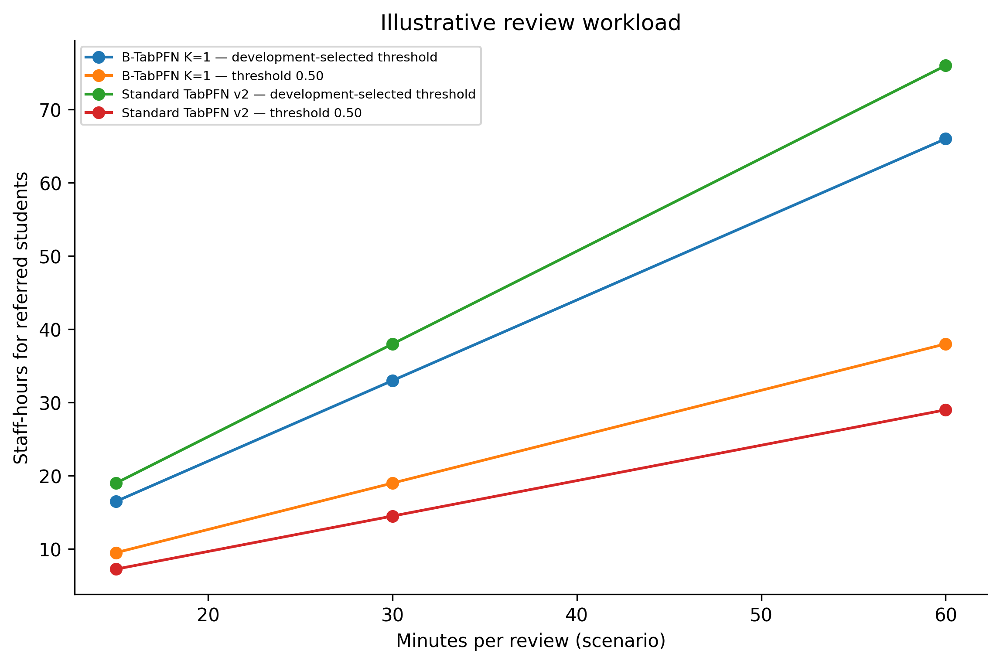

Figure 21b: Referral outcomes at the prespecified threshold


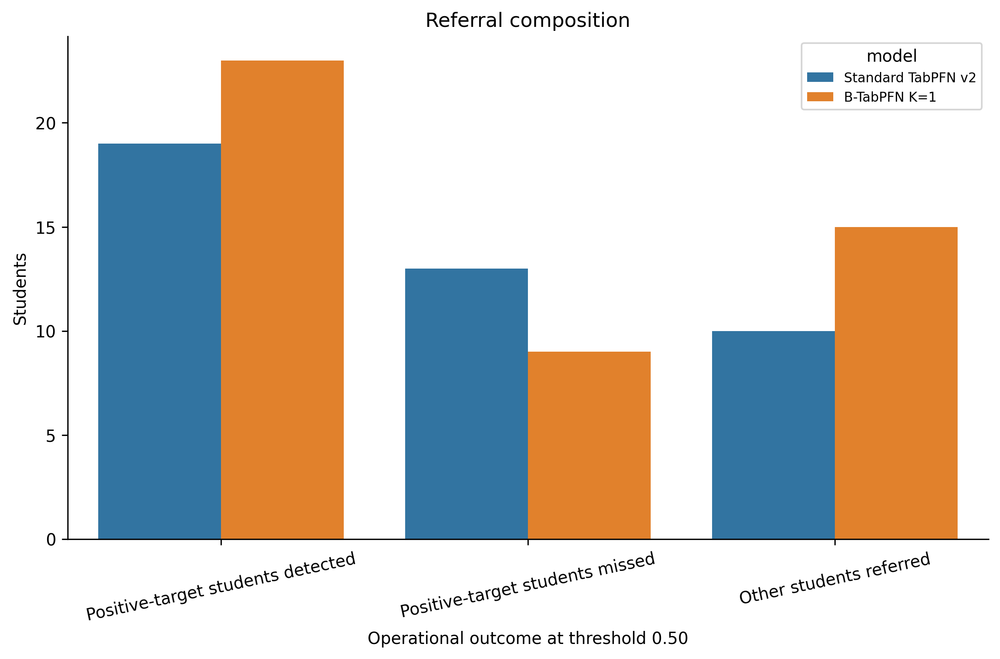

Figure 22a: Development out-of-fold equal-opportunity differences


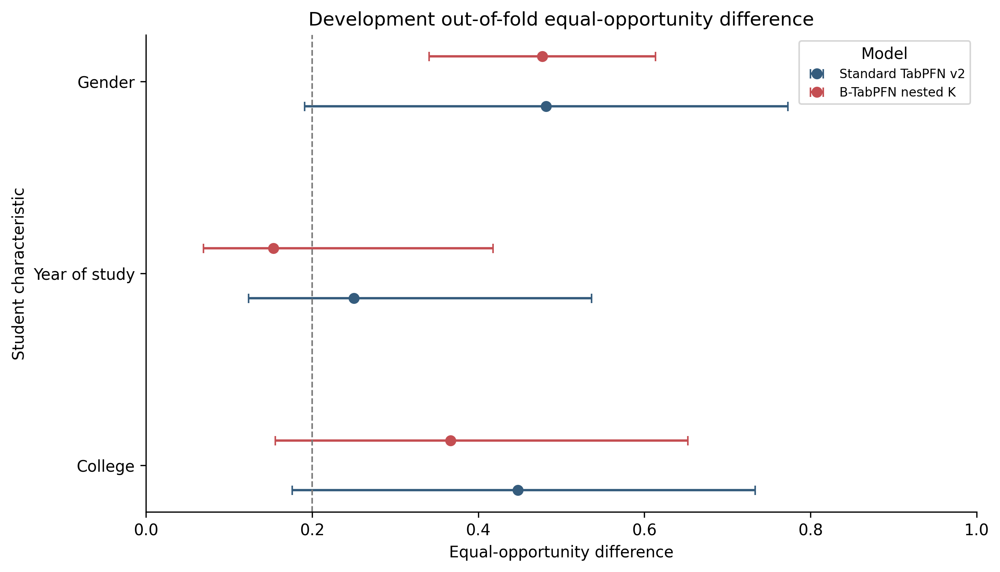

Figure 22b: Held-out test equal-opportunity differences


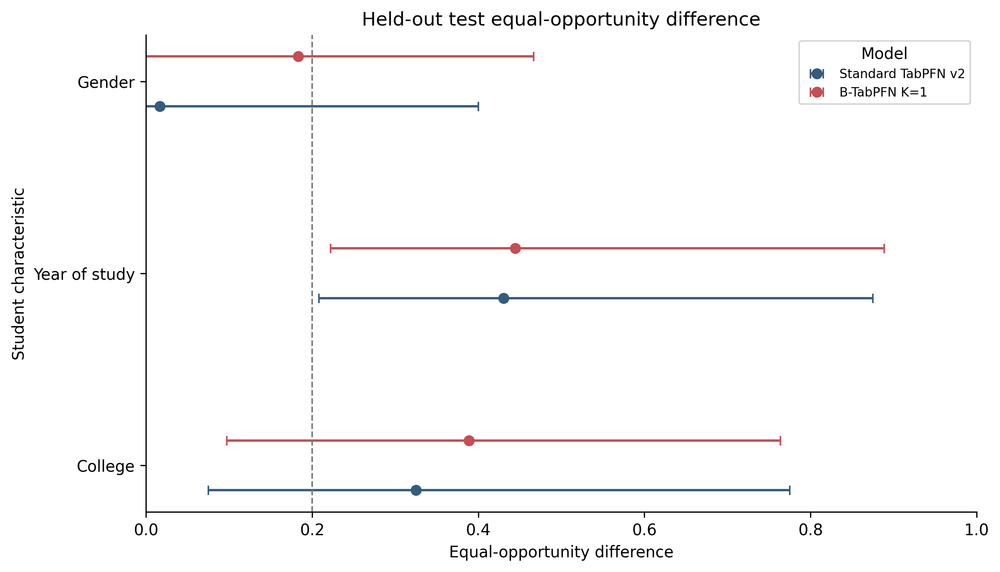

Figure 22c: B-TabPFN subgroup recall with uncertainty


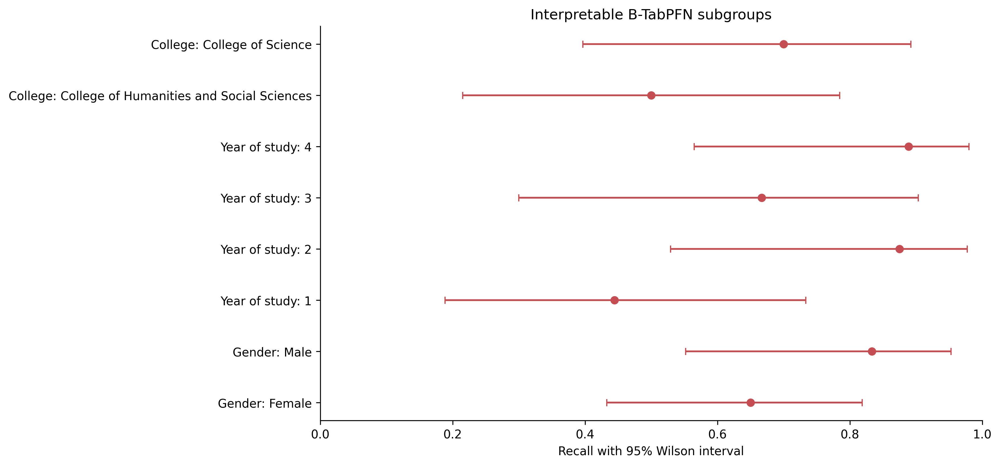

Figure 23a: Internet-access subgroup sensitivity: Recall


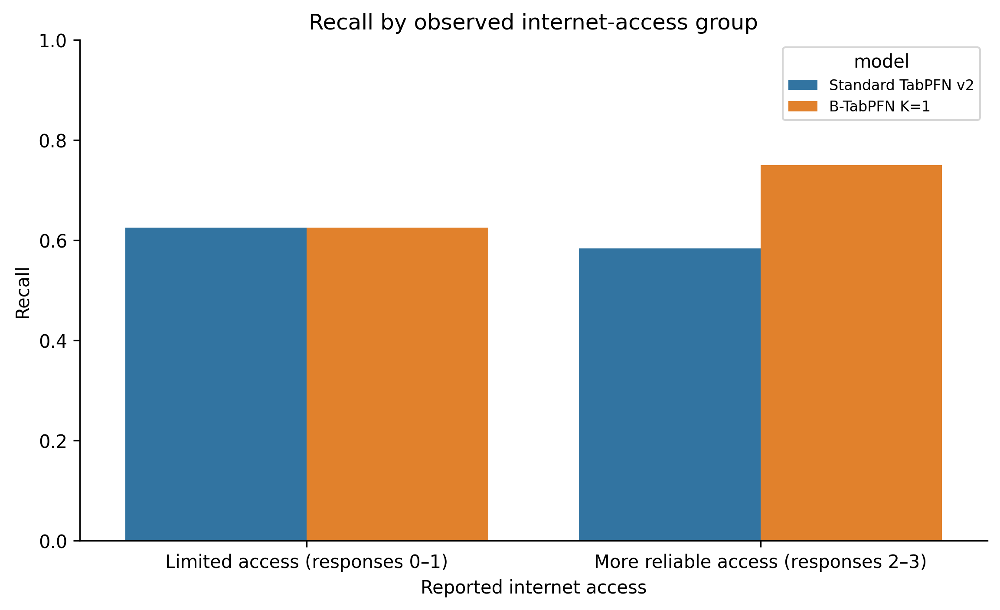

Figure 23b: Internet-access subgroup sensitivity: F2 score


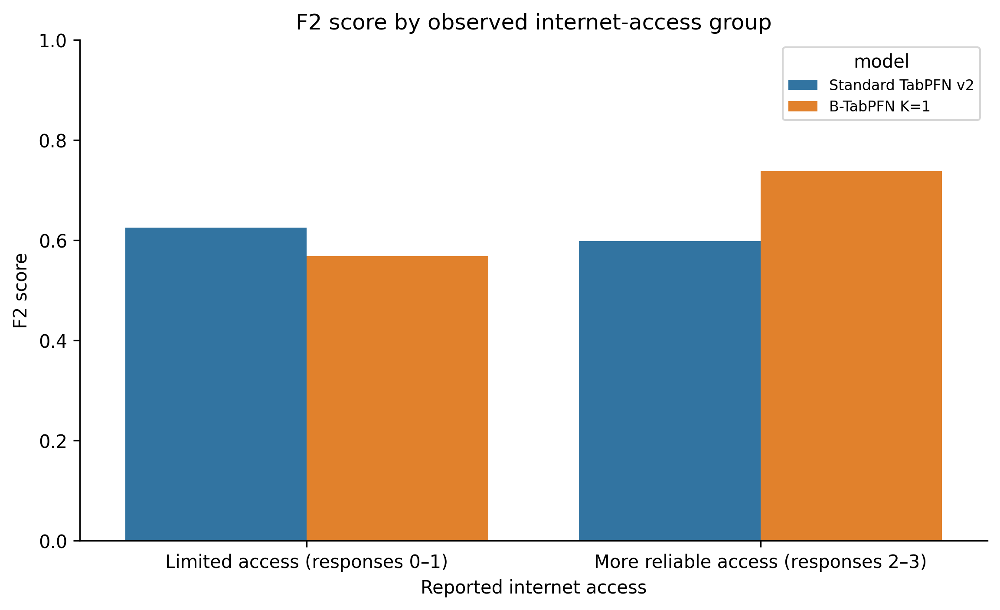

Figure 23c: Internet-access subgroup sensitivity: Average precision


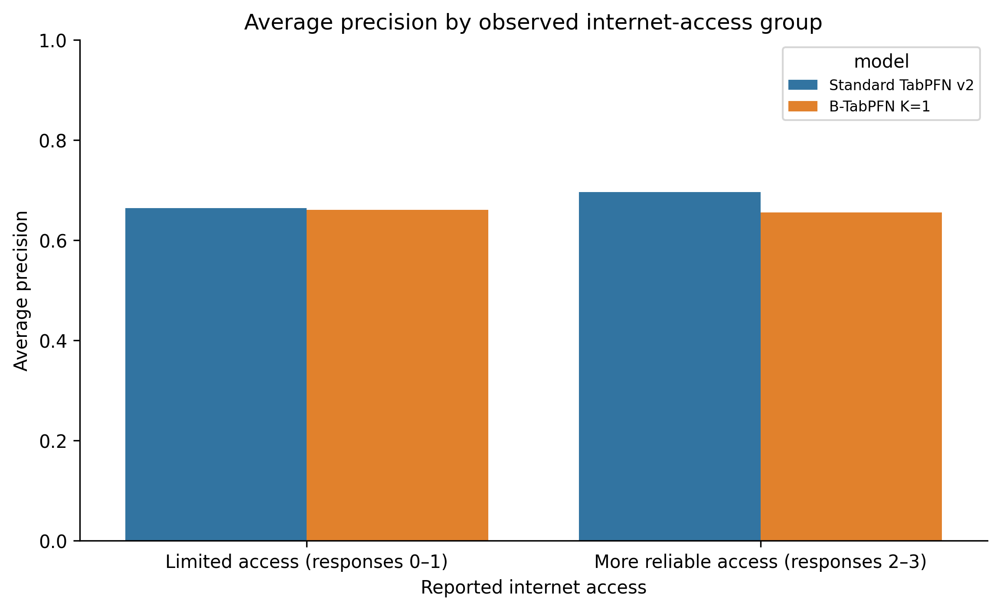

Figure 24: Aggregate FSII main effects


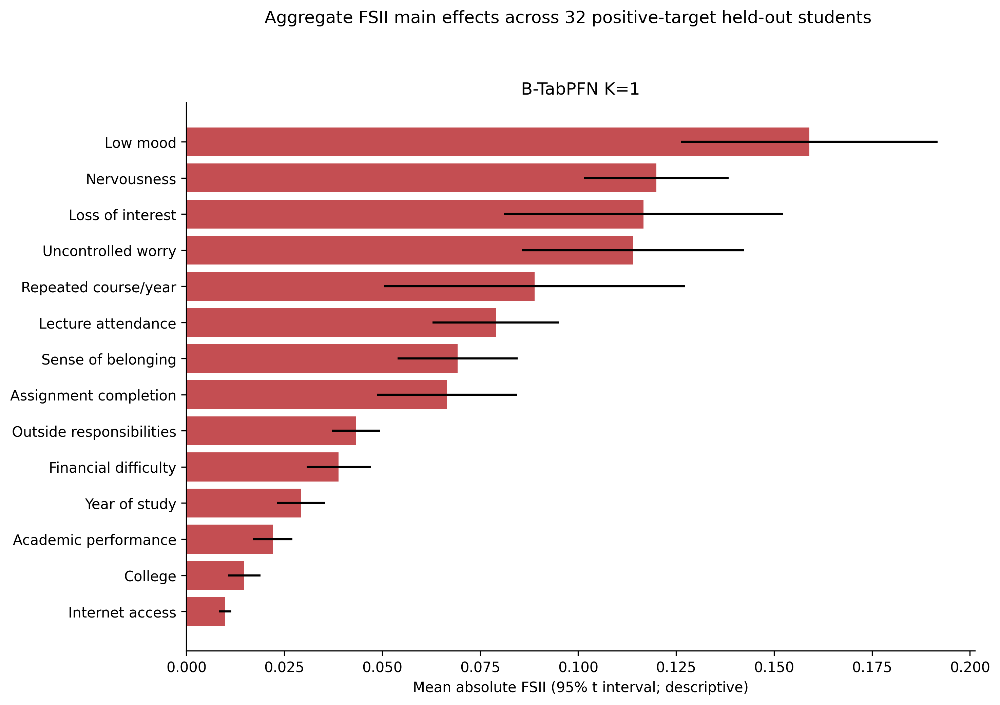

Figure 25: Aggregate signed pairwise FSII


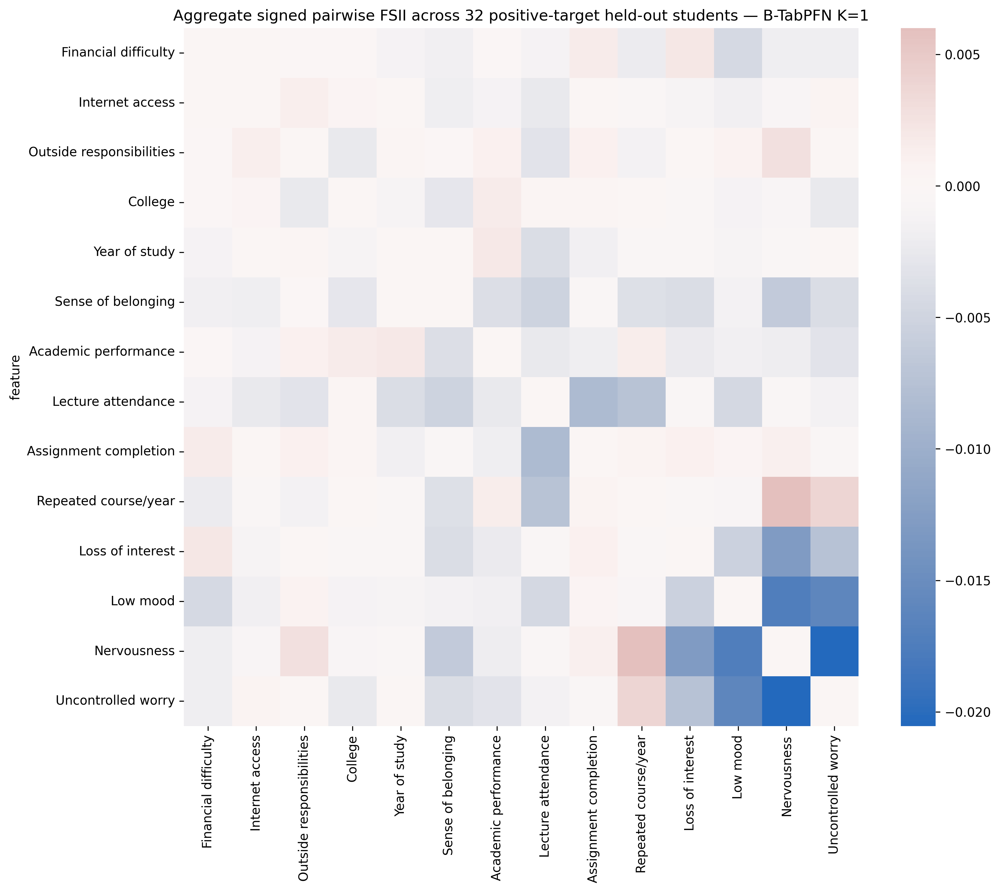

Figure 26: No-distress attribution-shift sensitivity


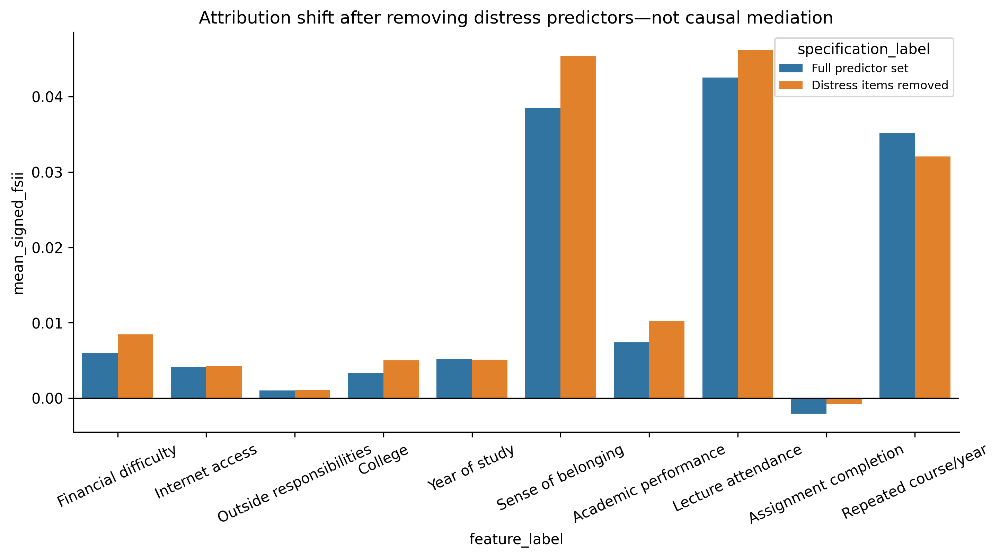

Figure 27: UCI robustness benchmark


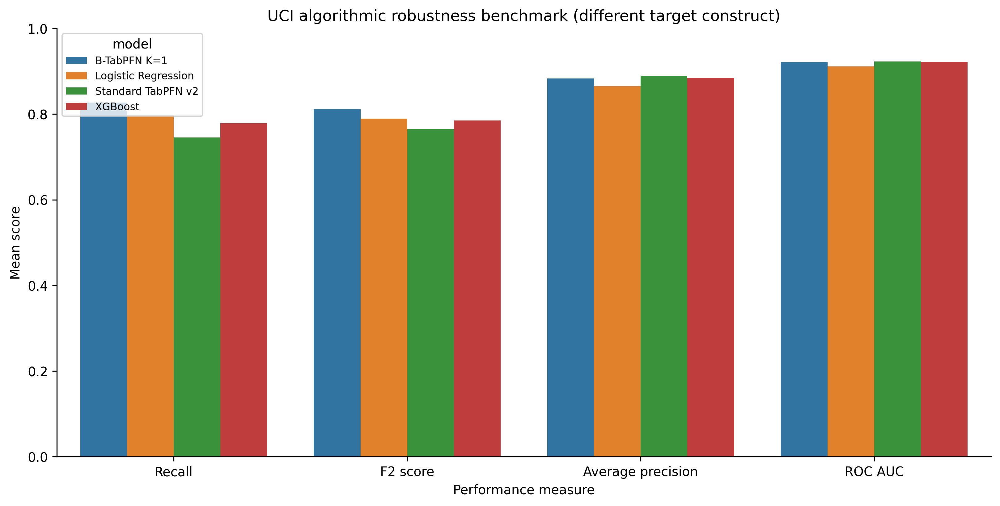

Figure 28: Inference latency


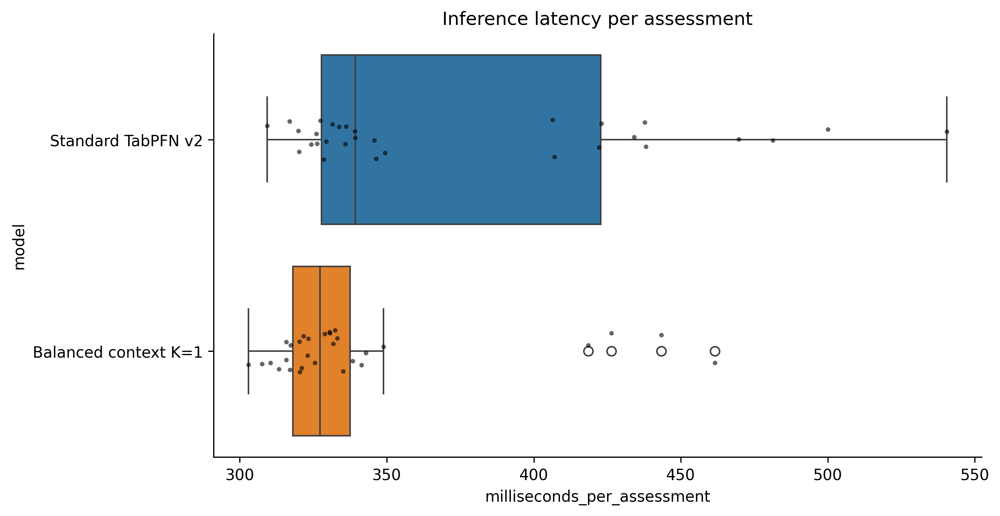

Figure 29: Aggregate false-negative profile


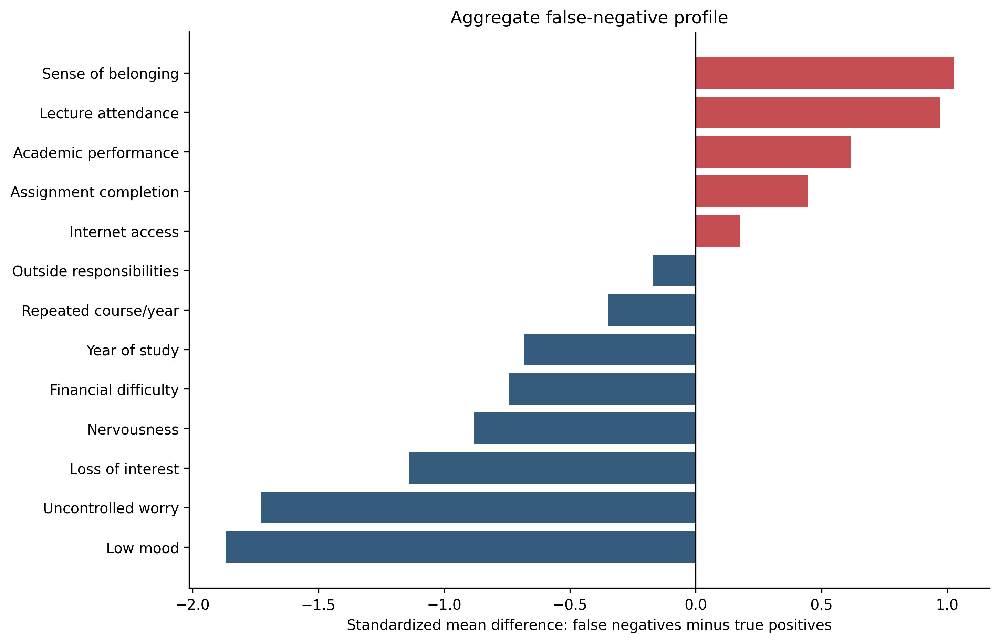

Figure 30: Predictor distributions


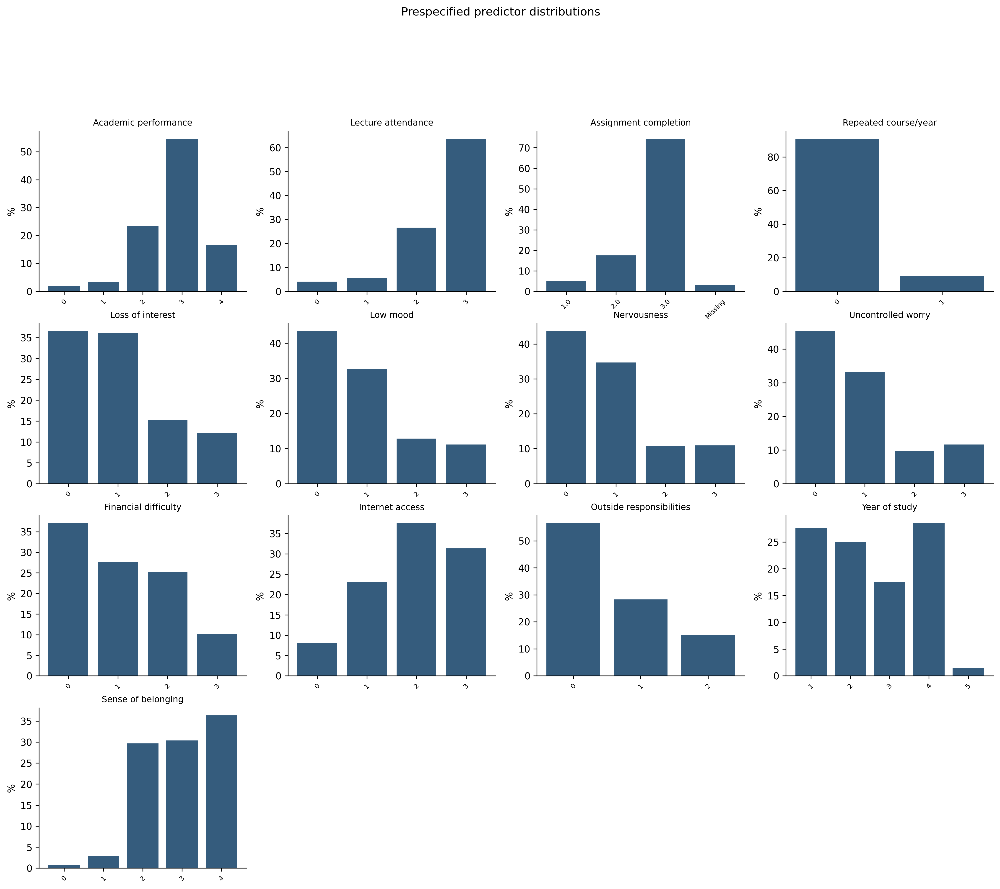

Figure 31: Outcome-definition counts


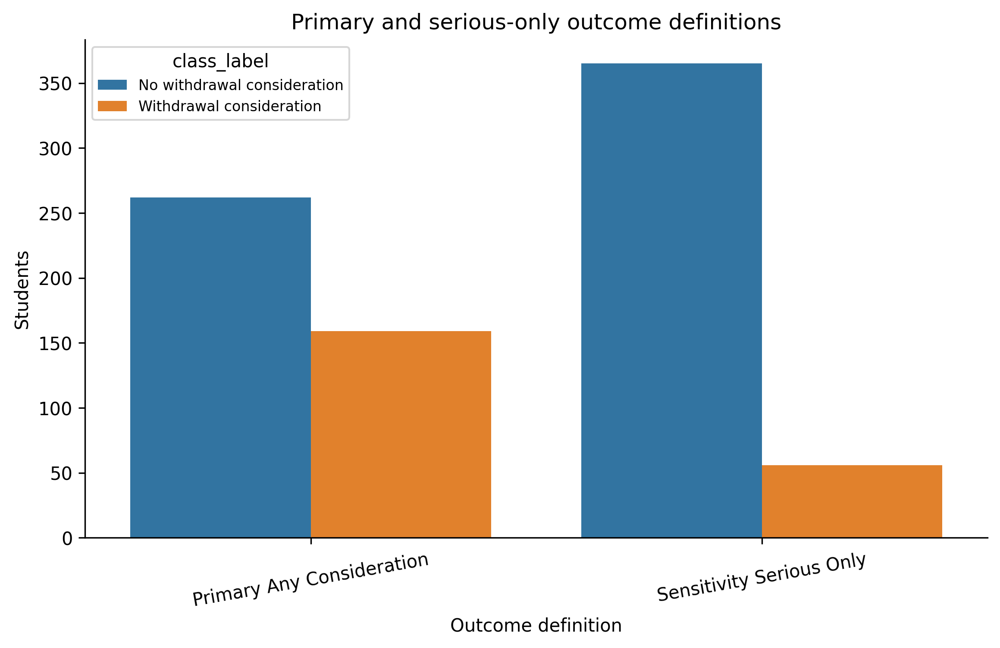

Figure 32: Held-out-test score distributions


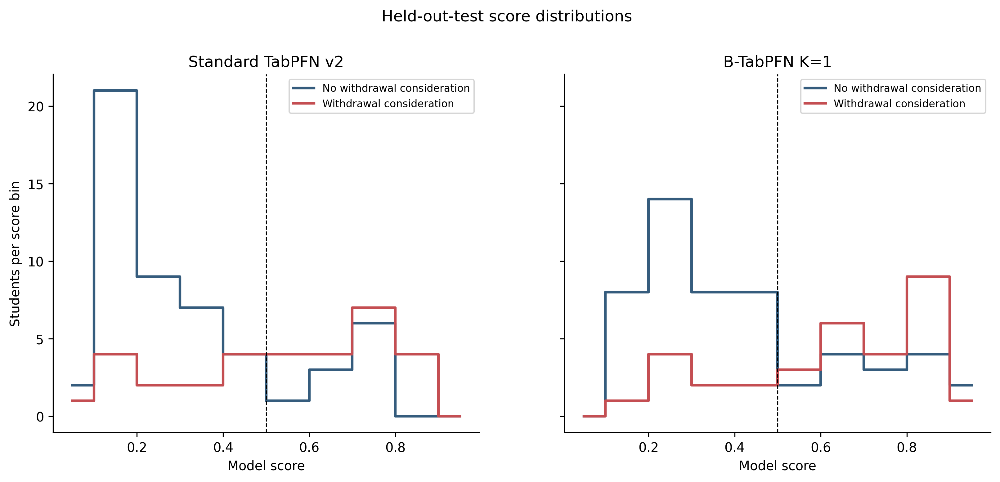

In [60]:
with analysis_component("publication_figures_part3"):
    # Retain one current manifest record for each figure generated by this section.
    FIGURE_RECORDS[:] = [
        record
        for record in FIGURE_RECORDS
        if not (
            re.match(r"Figure (\d+)", record.get("figure_id", ""))
            and int(re.match(r"Figure (\d+)", record["figure_id"]).group(1)) in range(21, 33)
        )
    ]

    # Figures 21–32: operational, fairness, sensitivity,
    # explainability, robustness and implementation evidence.
    test_models = ["Standard TabPFN v2", FINAL_B_NAME]

    # Figure 21: operational workload scenarios
    operations = read_artifact("operational_tradeoff.csv")

    required_operation_columns = {
        "model",
        "operating_point",
        "minutes_per_review_scenario",
        "staff_hours_scenario",
        "students_referred",
        "positive_target_students_detected",
        "positive_target_students_missed",
        "non_positive_students_referred",
    }
    missing_operation_columns = sorted(
        required_operation_columns - set(operations.columns)
    )
    if missing_operation_columns:
        raise RuntimeError(
            "Operational-trade-off schema is missing: "
            f"{missing_operation_columns}"
        )

    operations["operating_point_label"] = operations["operating_point"].map({
        "fixed_0.50": "threshold 0.50",
        "development_selected": "development-selected threshold",
    }).fillna(operations["operating_point"].astype(str))
    operations["series_label"] = (
        operations["model"].astype(str)
        + " — "
        + operations["operating_point_label"]
    )

    fig, ax = plt.subplots(figsize=(9, 5.5))

    for label, part in operations.groupby("series_label"):
        part = part.sort_values("minutes_per_review_scenario")
        ax.plot(
            part["minutes_per_review_scenario"],
            part["staff_hours_scenario"],
            marker="o",
            label=label,
        )

    ax.set(
        xlabel="Minutes per review (scenario)",
        ylabel="Staff-hours for referred students",
        title="Illustrative review workload",
    )
    ax.legend(fontsize=7)

    save_publication_figure(
        fig,
        "fig21a_review_workload",
        "Illustrative staff time for referral review",
        ["operational_tradeoff.csv"],
        "Administrator-facing workload scenarios",
    )

    fixed_operations = (
        operations[
            operations["operating_point"].eq("fixed_0.50")
        ]
        .drop_duplicates("model")
        .copy()
    )

    if set(fixed_operations["model"]) != set(test_models):
        raise RuntimeError(
            "Fixed-0.50 workload rows are incomplete "
            "for the two primary models."
        )

    fixed_long = fixed_operations.melt(
        id_vars="model",
        value_vars=[
            "positive_target_students_detected",
            "positive_target_students_missed",
            "non_positive_students_referred",
        ],
        var_name="outcome",
        value_name="students",
    )
    fixed_long["outcome_label"] = fixed_long["outcome"].map({
        "positive_target_students_detected": "Positive-target students detected",
        "positive_target_students_missed": "Positive-target students missed",
        "non_positive_students_referred": "Other students referred",
    })

    fig, ax = plt.subplots(figsize=(10, 5.5))
    sns.barplot(
        data=fixed_long,
        x="outcome_label",
        y="students",
        hue="model",
        ax=ax,
    )
    ax.set(
        xlabel="Operational outcome at threshold 0.50",
        ylabel="Students",
        title="Referral composition",
    )
    ax.tick_params(axis="x", rotation=12)

    save_publication_figure(
        fig,
        "fig21b_referral_composition",
        "Referral outcomes at the prespecified threshold",
        ["operational_tradeoff.csv"],
        "Administrator-facing referral consequences",
    )

    # Figure 22: subgroup and fairness evidence
    eod = read_artifact("fairness_equal_opportunity.csv")
    fair_groups = read_artifact("fairness_subgroups.csv")

    required_eod_columns = {
        "partition",
        "group_variable",
        "model",
        "equal_opportunity_difference",
        "eod_bootstrap_ci_low",
        "eod_bootstrap_ci_high",
    }
    missing_eod_columns = sorted(
        required_eod_columns - set(eod.columns)
    )
    if missing_eod_columns:
        raise RuntimeError(
            f"Equal-opportunity schema is missing: {missing_eod_columns}"
        )

    required_fairness_columns = {
        "partition",
        "model",
        "interpretation_status",
        "group_variable",
        "group",
        "recall",
        "recall_ci_low_wilson",
        "recall_ci_high_wilson",
    }
    missing_fairness_columns = sorted(
        required_fairness_columns - set(fair_groups.columns)
    )
    if missing_fairness_columns:
        raise RuntimeError(
            f"Fairness subgroup schema is missing: {missing_fairness_columns}"
        )

    fair_interpretable = fair_groups[
        fair_groups["partition"].eq("held_out_test")
        & fair_groups["model"].eq(FINAL_B_NAME)
        & fair_groups["interpretation_status"].eq(
            "interpretable_under_predeclared_event_rule"
        )
    ].copy()

    fair_interpretable["label"] = (
        fair_interpretable["group_variable"].map(GROUP_LABELS).fillna(
            fair_interpretable["group_variable"].astype(str)
        )
        + ": "
        + fair_interpretable["group"].astype(str)
    )

    eod = eod.copy()
    eod["group_label"] = eod["group_variable"].map(GROUP_LABELS).fillna(
        eod["group_variable"].astype(str)
    )
    for panel, partition, partition_label in [
        ("a", "nested_development_oof", "Development out-of-fold"),
        ("b", "held_out_test", "Held-out test"),
    ]:
        eod_partition = eod[eod["partition"].eq(partition)].copy()
        if eod_partition.empty:
            raise RuntimeError(
                f"No equal-opportunity estimates are available for {partition}."
            )
        group_order = list(dict.fromkeys(eod_partition["group_label"]))
        model_order = ["Standard TabPFN v2"] + [
            model_name
            for model_name in eod_partition["model"].drop_duplicates()
            if model_name != "Standard TabPFN v2"
        ]
        base_positions = np.arange(len(group_order), dtype=float)
        offsets = np.linspace(-0.13, 0.13, num=len(model_order))
        fig, ax = plt.subplots(figsize=(9.5, 5.5))
        for offset, model_name in zip(offsets, model_order):
            model_rows = (
                eod_partition[eod_partition["model"].eq(model_name)]
                .set_index("group_label")
                .reindex(group_order)
            )
            estimate = model_rows["equal_opportunity_difference"].to_numpy(dtype=float)
            ci_low = model_rows["eod_bootstrap_ci_low"].to_numpy(dtype=float)
            ci_high = model_rows["eod_bootstrap_ci_high"].to_numpy(dtype=float)
            color = (
                PUBLICATION_PALETTE["standard"]
                if model_name.startswith("Standard")
                else PUBLICATION_PALETTE["balanced"]
            )
            ax.errorbar(
                estimate,
                base_positions + offset,
                xerr=np.vstack([estimate - ci_low, ci_high - estimate]),
                fmt="o",
                color=color,
                capsize=3,
                label=model_name,
            )
        ax.set_yticks(base_positions, group_order)
        ax.set_xlim(0, 1)
        ax.legend(title="Model")
        ax.axvline(
            CONFIG["eod_review_threshold"],
            color="#7A7A7A",
            linestyle="--",
            linewidth=1,
        )
        ax.set(
            xlabel="Equal-opportunity difference",
            ylabel="Student characteristic",
            title=f"{partition_label} equal-opportunity difference",
        )

        save_publication_figure(
            fig,
            f"fig22{panel}_equal_opportunity_{partition}",
            f"{partition_label} equal-opportunity differences",
            ["fairness_equal_opportunity.csv"],
            "RQ3 fairness assessment",
        )

    positions = np.arange(len(fair_interpretable))
    lower_error = (
        fair_interpretable["recall"]
        - fair_interpretable["recall_ci_low_wilson"]
    )
    upper_error = (
        fair_interpretable["recall_ci_high_wilson"]
        - fair_interpretable["recall"]
    )

    fig, ax = plt.subplots(
        figsize=(10, max(6, 0.35 * len(fair_interpretable)))
    )
    ax.errorbar(
        fair_interpretable["recall"],
        positions,
        xerr=np.vstack([lower_error, upper_error]),
        fmt="o",
        color=PUBLICATION_PALETTE["balanced"],
        capsize=3,
    )
    ax.set_yticks(
        positions,
        fair_interpretable["label"],
    )
    ax.set_xlim(0, 1)
    ax.set(
        xlabel="Recall with 95% Wilson interval",
        title="Interpretable B-TabPFN subgroups",
    )

    save_publication_figure(
        fig,
        "fig22c_subgroup_recall",
        "B-TabPFN subgroup recall with uncertainty",
        ["fairness_subgroups.csv"],
        "RQ3 subgroup uncertainty",
    )

    # Figure 23: internet-access sensitivity
    internet = read_artifact(
        "internet_access_observed_subgroups.csv"
    )

    required_internet_columns = {
        "group",
        "model",
        "recall",
        "f2",
        "average_precision",
    }
    missing_internet_columns = sorted(
        required_internet_columns - set(internet.columns)
    )
    if missing_internet_columns:
        raise RuntimeError(
            f"Internet-sensitivity schema is missing: "
            f"{missing_internet_columns}"
        )

    internet_plot = (
        internet[internet["model"].isin(test_models)]
        .melt(
            id_vars=["group", "model"],
            value_vars=["recall", "f2", "average_precision"],
            var_name="metric",
            value_name="value",
        )
    )
    internet_plot["group_label"] = internet_plot["group"].map({
        "poor_q11_0_1": "Limited access (responses 0–1)",
        "reliable_q11_2_3": "More reliable access (responses 2–3)",
    }).fillna(internet_plot["group"].astype(str))

    if internet_plot.empty:
        raise RuntimeError(
            "No held-out primary-model rows were found "
            "for the internet-access figure."
        )

    for panel, metric in zip(
        ["a", "b", "c"],
        ["recall", "f2", "average_precision"],
    ):
        metric_data = internet_plot[internet_plot["metric"].eq(metric)]
        fig, ax = plt.subplots(figsize=(9, 5))
        sns.barplot(
            data=metric_data,
            x="group_label",
            y="value",
            hue="model",
            errorbar=None,
            ax=ax,
        )
        ax.set_ylim(0, 1)
        ax.set(
            xlabel="Reported internet access",
            ylabel=METRIC_LABELS[metric],
            title=f"{METRIC_LABELS[metric]} by observed internet-access group",
        )

        save_publication_figure(
            fig,
            f"fig23{panel}_internet_{metric}",
            f"Internet-access subgroup sensitivity: {METRIC_LABELS[metric]}",
            [
                "internet_access_observed_subgroups.csv",
                "internet_access_perturbation_summary.csv",
            ],
            "Contextual sensitivity evidence",
        )

    # Figures 24–25: population FSII
    if CONFIG["run_fsii"]:
        fsii = read_artifact("fsii_population_summary.csv")
        main = read_artifact(
            "fsii_main_effects_summary.csv"
        ).sort_values(
            "mean_abs_fsii",
            ascending=False,
        )

        main = (
            main[main["model"].eq(FINAL_B_NAME)]
            .sort_values("mean_abs_fsii")
        )

        if main.empty:
            raise RuntimeError(
                "Aggregate FSII summary is missing "
                "the final B-TabPFN main effects."
            )

        interval_margin = (
            student_t.ppf(.975, main["explained_students"] - 1)
            * main["sd_abs_fsii"]
            / np.sqrt(main["explained_students"])
        )
        interval_error = np.vstack([
            np.minimum(main["mean_abs_fsii"], interval_margin),
            interval_margin,
        ])
        fig, ax = plt.subplots(figsize=(10, 7))
        ax.barh(
            main["feature_i"].map(readable_feature),
            main["mean_abs_fsii"],
            xerr=interval_error,
            color=PUBLICATION_PALETTE["balanced"],
        )
        ax.set_title(FINAL_B_NAME)
        ax.set_xlabel("Mean absolute FSII (95% t interval; descriptive)")
        fig.suptitle(
            "Aggregate FSII main effects across 32 positive-target "
            "held-out students",
            y=1.01,
        )

        save_publication_figure(
            fig,
            "fig24_fsii_main_effects",
            "Aggregate FSII main effects",
            ["fsii_main_effects_summary.csv"],
            "RQ2 explainability",
        )

        selected_pair = fsii[
            fsii["order"].eq(2)
            & fsii["model"].eq(FINAL_B_NAME)
        ].copy()

        if selected_pair.empty:
            raise RuntimeError(
                "Aggregate FSII summary contains no pairwise "
                "interactions for the final B-TabPFN model."
            )

        features = sorted(
            set(selected_pair["feature_i"].dropna())
            .union(
                set(selected_pair["feature_j"].dropna())
            )
        )

        matrix = pd.DataFrame(
            0.0,
            index=features,
            columns=features,
        )

        for _, row in selected_pair.iterrows():
            matrix.loc[
                row["feature_i"],
                row["feature_j"],
            ] = row["mean_signed_fsii"]
            matrix.loc[
                row["feature_j"],
                row["feature_i"],
            ] = row["mean_signed_fsii"]

        matrix.index.name = "feature"
        atomic_csv(
            matrix.reset_index(),
            ARTIFACT_DIR / "fsii_btabpfn_interaction_matrix.csv",
        )

        display_matrix = matrix.rename(
            index=FEATURE_LABELS,
            columns=FEATURE_LABELS,
        )
        fig, ax = plt.subplots(figsize=(12, 10))
        sns.heatmap(
            display_matrix,
            cmap="vlag",
            center=0,
            ax=ax,
        )
        ax.set_title(
            f"Aggregate signed pairwise FSII across 32 positive-target "
            f"held-out students — B-TabPFN K={SELECTED_K}"
        )

        save_publication_figure(
            fig,
            "fig25_fsii_interactions",
            "Aggregate signed pairwise FSII",
            [
                "fsii_population_summary.csv",
                "fsii_btabpfn_interaction_matrix.csv",
            ],
            "RQ2 explainability",
        )

    # Figure 26: theory-redirection sensitivity
    if CONFIG["run_theory_attribution_sensitivity"]:
        theory = read_artifact(
            "theory_attribution_sensitivity.csv"
        )

        required_theory_columns = {
            "feature",
            "full_model_mean_signed_fsii",
            "no_distress_mean_signed_fsii",
        }
        missing_theory_columns = sorted(
            required_theory_columns - set(theory.columns)
        )
        if missing_theory_columns:
            raise RuntimeError(
                f"Theory-sensitivity schema is missing: "
                f"{missing_theory_columns}"
            )

        theory_long = theory.melt(
            id_vars="feature",
            value_vars=[
                "full_model_mean_signed_fsii",
                "no_distress_mean_signed_fsii",
            ],
            var_name="specification",
            value_name="mean_signed_fsii",
        )
        theory_long["feature_label"] = theory_long["feature"].map(readable_feature)
        theory_long["specification_label"] = theory_long["specification"].map({
            "full_model_mean_signed_fsii": "Full predictor set",
            "no_distress_mean_signed_fsii": "Distress items removed",
        })

        fig, ax = plt.subplots(figsize=(11, 5))
        sns.barplot(
            data=theory_long,
            x="feature_label",
            y="mean_signed_fsii",
            hue="specification_label",
            ax=ax,
        )
        ax.axhline(0, color="black", linewidth=0.8)
        ax.tick_params(axis="x", rotation=25)
        ax.set_title(
            "Attribution shift after removing distress "
            "predictors—not causal mediation"
        )

        save_publication_figure(
            fig,
            "fig26_theory_attribution_shift",
            "No-distress attribution-shift sensitivity",
            ["theory_attribution_sensitivity.csv"],
            "Theory-redirection evidence",
        )

    # Figure 27: UCI robustness benchmark
    if CONFIG["run_uci"]:
        uci = read_artifact("uci_summary.csv")

        required_uci_columns = {
            "model",
            "recall_mean",
            "f2_mean",
            "average_precision_mean",
            "auc_roc_mean",
        }
        missing_uci_columns = sorted(
            required_uci_columns - set(uci.columns)
        )
        if missing_uci_columns:
            raise RuntimeError(
                f"UCI-summary schema is missing: "
                f"{missing_uci_columns}"
            )

        uci_long = uci.melt(
            id_vars="model",
            value_vars=[
                "recall_mean",
                "f2_mean",
                "average_precision_mean",
                "auc_roc_mean",
            ],
            var_name="metric",
            value_name="value",
        )
        uci_long["metric_label"] = (
            uci_long["metric"].str.removesuffix("_mean").map(METRIC_LABELS)
        )
        if uci_long["metric_label"].isna().any():
            raise RuntimeError("UCI figure contains an unmapped performance metric.")

        fig, ax = plt.subplots(figsize=(13, 6))
        sns.barplot(
            data=uci_long,
            x="metric_label",
            y="value",
            hue="model",
            ax=ax,
        )
        ax.set_ylim(0, 1)
        ax.set(xlabel="Performance measure", ylabel="Mean score")
        ax.set_title(
            "UCI algorithmic robustness benchmark "
            "(different target construct)"
        )

        save_publication_figure(
            fig,
            "fig27_uci_robustness",
            "UCI robustness benchmark",
            [
                "uci_summary.csv",
                "uci_seed_metrics.csv",
                "uci_protocol.json",
            ],
            "External algorithmic robustness",
        )

    # Figure 28: inference latency
    latency = read_artifact("inference_latency.csv")

    required_latency_columns = {
        "model",
        "milliseconds_per_assessment",
    }
    missing_latency_columns = sorted(
        required_latency_columns - set(latency.columns)
    )
    if missing_latency_columns:
        raise RuntimeError(
            f"Inference-latency schema is missing: "
            f"{missing_latency_columns}"
        )

    fig, ax = plt.subplots(figsize=(9, 5))
    sns.boxplot(
        data=latency,
        y="model",
        x="milliseconds_per_assessment",
        hue="model",
        legend=False,
        ax=ax,
    )
    sns.stripplot(
        data=latency,
        y="model",
        x="milliseconds_per_assessment",
        color="black",
        size=3,
        alpha=0.6,
        ax=ax,
    )
    ax.set_title("Inference latency per assessment")

    save_publication_figure(
        fig,
        "fig28_inference_latency",
        "Inference latency",
        ["inference_latency.csv"],
        "Implementation/practicality",
    )

    # Figure 29: aggregate false-negative profile
    fn_profile = read_artifact(
        "false_negative_profile_summary.csv"
    )

    required_fn_columns = {
        "profile_type",
        "variable",
        "standardized_mean_difference_fn_minus_tp",
    }
    missing_fn_columns = sorted(
        required_fn_columns - set(fn_profile.columns)
    )
    if missing_fn_columns:
        raise RuntimeError(
            f"False-negative profile schema is missing: "
            f"{missing_fn_columns}"
        )

    fn_numeric = (
        fn_profile[
            fn_profile["profile_type"].eq("numeric_feature")
        ]
        .dropna(
            subset=[
                "standardized_mean_difference_fn_minus_tp"
            ]
        )
        .sort_values(
            "standardized_mean_difference_fn_minus_tp"
        )
    )

    fig, ax = plt.subplots(figsize=(10, 7))
    ax.barh(
        fn_numeric["variable"].map(readable_feature),
        fn_numeric[
            "standardized_mean_difference_fn_minus_tp"
        ],
        color=np.where(
            fn_numeric[
                "standardized_mean_difference_fn_minus_tp"
            ] >= 0,
            PUBLICATION_PALETTE["balanced"],
            PUBLICATION_PALETTE["standard"],
        ),
    )
    ax.axvline(0, color="black", linewidth=0.8)
    ax.set(
        xlabel=(
            "Standardized mean difference: "
            "false negatives minus true positives"
        ),
            title="Aggregate false-negative profile",
    )

    save_publication_figure(
        fig,
        "fig29_false_negative_profile",
        "Aggregate false-negative profile",
        ["false_negative_profile_summary.csv"],
        "Error analysis",
    )

    # Figure 30: predictor distributions
    feature_counts = read_artifact(
        "feature_distribution_counts.csv"
    )

    required_feature_count_columns = {
        "feature",
        "value",
        "percent",
    }
    missing_feature_count_columns = sorted(
        required_feature_count_columns
        - set(feature_counts.columns)
    )
    if missing_feature_count_columns:
        raise RuntimeError(
            f"Feature-distribution schema is missing: "
            f"{missing_feature_count_columns}"
        )

    fig, axes = plt.subplots(
        4,
        4,
        figsize=(18, 14),
    )
    axes = axes.ravel()

    for ax, feature in zip(axes, FEATURES_NUMERIC):
        part = feature_counts[
            feature_counts["feature"].eq(feature)
        ]
        ax.bar(
            part["value"],
            part["percent"],
            color=PUBLICATION_PALETTE["standard"],
        )
        ax.set_title(readable_feature(feature), fontsize=9)
        ax.tick_params(
            axis="x",
            rotation=45,
            labelsize=7,
        )
        ax.set_ylabel("%")

    for ax in axes[len(FEATURES_NUMERIC):]:
        ax.axis("off")

    fig.suptitle(
        "Prespecified predictor distributions",
        y=1.01,
    )

    save_publication_figure(
        fig,
        "fig30_feature_distributions",
        "Predictor distributions",
        [
            "feature_distribution_counts.csv",
            "descriptive_feature_statistics.csv",
        ],
        "Descriptive results",
    )

    # Figure 31: outcome-definition sensitivity
    outcome_counts = read_artifact(
        "outcome_definition_counts.csv"
    )

    required_outcome_columns = {
        "definition",
        "negative",
        "positive",
    }
    missing_outcome_columns = sorted(
        required_outcome_columns - set(outcome_counts.columns)
    )
    if missing_outcome_columns:
        raise RuntimeError(
            f"Outcome-count schema is missing: "
            f"{missing_outcome_columns}"
        )

    outcomes = outcome_counts.melt(
        id_vars="definition",
        value_vars=["negative", "positive"],
        var_name="class",
        value_name="n",
    )
    outcomes["definition_label"] = (
        outcomes["definition"].astype(str).str.replace("_", " ").str.title()
    )
    outcomes["class_label"] = outcomes["class"].map({
        "negative": "No withdrawal consideration",
        "positive": "Withdrawal consideration",
    })

    fig, ax = plt.subplots(figsize=(9, 5))
    sns.barplot(
        data=outcomes,
        x="definition_label",
        y="n",
        hue="class_label",
        ax=ax,
    )
    ax.set(
        xlabel="Outcome definition",
        ylabel="Students",
        title="Primary and serious-only outcome definitions",
    )
    ax.tick_params(axis="x", rotation=10)

    save_publication_figure(
        fig,
        "fig31_outcome_definitions",
        "Outcome-definition counts",
        [
            "outcome_definition_counts.csv",
            "serious_only_outcome_sensitivity.csv",
        ],
        "Construct sensitivity",
    )

    # Figure 32: held-out score distributions
    score_bins = read_artifact(
        "score_distribution_bins.csv"
    )

    required_score_columns = {
        "model",
        "target",
        "bin_midpoint",
        "count",
    }
    missing_score_columns = sorted(
        required_score_columns - set(score_bins.columns)
    )
    if missing_score_columns:
        raise RuntimeError(
            f"Score-distribution schema is missing: "
            f"{missing_score_columns}"
        )

    available_score_models = set(score_bins["model"])
    missing_score_models = sorted(
        set(test_models) - available_score_models
    )
    if missing_score_models:
        raise RuntimeError(
            f"Score distributions are missing models: "
            f"{missing_score_models}"
        )

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(13, 5),
        sharey=True,
    )

    for ax, model_name in zip(axes, test_models):
        part = score_bins[
            score_bins["model"].eq(model_name)
        ]

        for target_value, color in [
            (0, PUBLICATION_PALETTE["standard"]),
            (1, PUBLICATION_PALETTE["balanced"]),
        ]:
            target_part = part[
                part["target"].eq(target_value)
            ]
            ax.step(
                target_part["bin_midpoint"],
                target_part["count"],
                where="mid",
                label=(
                    "No withdrawal consideration"
                    if target_value == 0
                    else "Withdrawal consideration"
                ),
                color=color,
                linewidth=2,
            )

        ax.axvline(
            0.5,
            linestyle="--",
            color="black",
            linewidth=0.8,
        )
        ax.set(
            xlabel="Model score",
            title=model_name,
        )
        ax.legend()

    axes[0].set_ylabel("Students per score bin")
    fig.suptitle(
        "Held-out-test score distributions",
        y=1.02,
    )

    save_publication_figure(
        fig,
        "fig32_score_distributions",
        "Held-out-test score distributions",
        ["score_distribution_bins.csv"],
        "Calibration diagnosis",
    )


Figure 44: Gender composition of the survey sample and KNUST undergraduate population


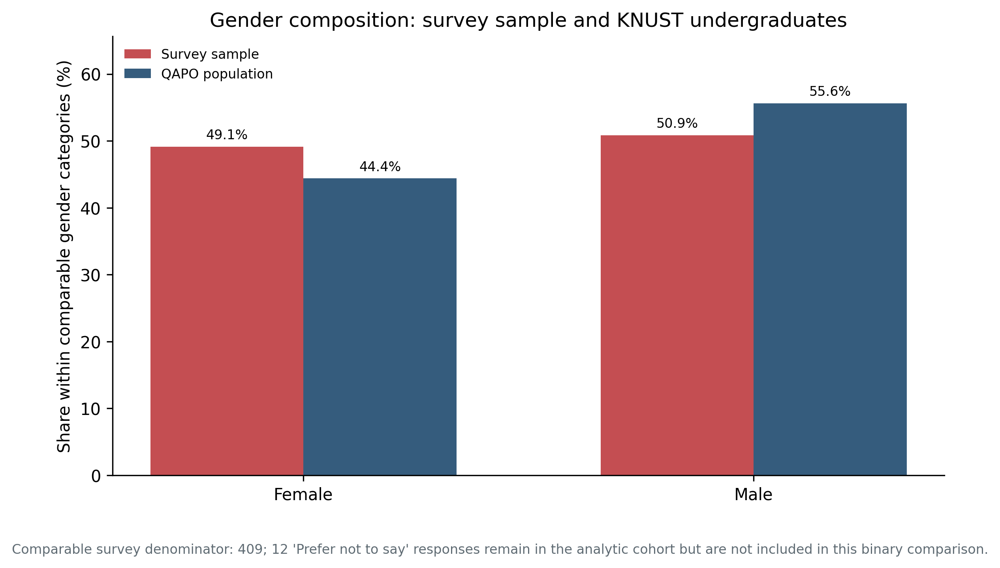

Figure 45: College composition of the survey sample and KNUST undergraduate population


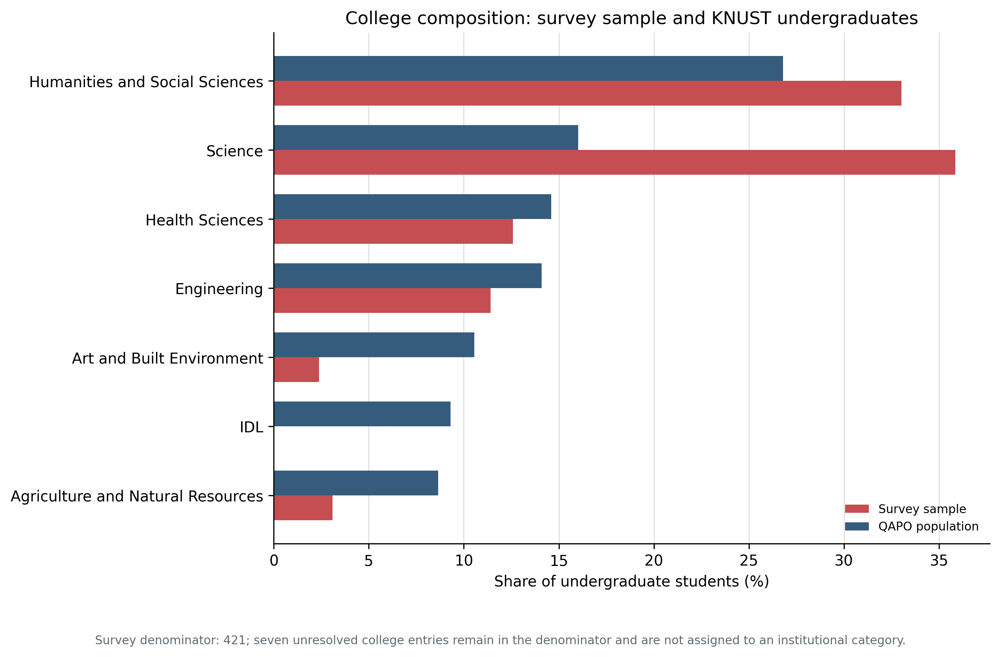

In [61]:
with analysis_component("population_comparison_figures"):
    gender_plot = read_artifact("population_gender_comparison.csv")
    fig, ax = plt.subplots(figsize=(7.8, 4.8))
    positions = np.arange(len(gender_plot))
    width = 0.34
    ax.bar(positions - width / 2, gender_plot["sample_percent"], width, label="Survey sample", color=PUBLICATION_PALETTE["balanced"])
    ax.bar(positions + width / 2, gender_plot["population_percent"], width, label="QAPO population", color=PUBLICATION_PALETTE["standard"])
    ax.set_xticks(positions, gender_plot["gender"])
    ax.set_ylabel("Share within comparable gender categories (%)")
    ax.set_title("Gender composition: survey sample and KNUST undergraduates")
    ax.legend(frameon=False)
    ax.set_ylim(0, max(gender_plot[["sample_percent", "population_percent"]].to_numpy().max() * 1.18, 60))
    for container in ax.containers:
        ax.bar_label(container, fmt="%.1f%%", padding=3, fontsize=8)
    fig.text(
        0.5, 0.015,
        "Comparable survey denominator: 409; 12 'Prefer not to say' responses remain in the analytic cohort but are not included in this binary comparison.",
        ha="center", fontsize=8, color="#5F6B73",
    )
    fig.tight_layout(rect=[0, 0.07, 1, 1])
    save_publication_figure(
        fig,
        "fig44_population_gender_comparison",
        "Gender composition of the survey sample and KNUST undergraduate population",
        ["population_gender_comparison.csv", "qapo_population_source_metadata.json"],
        "Sampling and generalisability",
    )

    college_plot = read_artifact("population_college_comparison.csv").copy()
    short_college = {
        "College of Agriculture and Natural Resources": "Agriculture and Natural Resources",
        "College of Art and Built Environment": "Art and Built Environment",
        "College of Engineering": "Engineering",
        "College of Health Sciences": "Health Sciences",
        "College of Humanities and Social Sciences": "Humanities and Social Sciences",
        "College of Science": "Science",
        "IDL": "IDL",
    }
    college_plot["label"] = college_plot["college"].map(short_college)
    college_plot = college_plot.sort_values("population_percent", ascending=True)
    positions = np.arange(len(college_plot))
    fig, ax = plt.subplots(figsize=(9.5, 6.2))
    ax.barh(positions - 0.18, college_plot["sample_percent"], 0.36, label="Survey sample", color=PUBLICATION_PALETTE["balanced"])
    ax.barh(positions + 0.18, college_plot["population_percent"], 0.36, label="QAPO population", color=PUBLICATION_PALETTE["standard"])
    ax.set_yticks(positions, college_plot["label"])
    ax.set_xlabel("Share of undergraduate students (%)")
    ax.set_title("College composition: survey sample and KNUST undergraduates")
    ax.legend(frameon=False, loc="lower right")
    ax.xaxis.grid(True, color="#D9D9D9", linewidth=0.6)
    ax.set_axisbelow(True)
    fig.text(
        0.5, 0.015,
        "Survey denominator: 421; seven unresolved college entries remain in the denominator and are not assigned to an institutional category.",
        ha="center", fontsize=8, color="#5F6B73",
    )
    fig.tight_layout(rect=[0, 0.07, 1, 1])
    save_publication_figure(
        fig,
        "fig45_population_college_comparison",
        "College composition of the survey sample and KNUST undergraduate population",
        ["population_college_comparison.csv", "population_comparison_unmatched_categories.csv", "qapo_population_source_metadata.json"],
        "Sampling and generalisability",
    )


In [62]:
with analysis_component("publication_package"):
    # Canonical table registry. No duplicate CSV copies are created.
    traceability.loc[traceability["objective"].eq("RQ2 explainability/interactions"), "answer_status"] = "generated_from_complete_aggregate_fsii_analysis"
    atomic_csv(traceability, ARTIFACT_DIR / "objective_traceability_matrix.csv")
    feature_codebook = instrument_inventory.rename(columns={"standard_name": "feature"}).copy()
    descriptive_lookup = desc.copy()
    feature_codebook = feature_codebook.merge(descriptive_lookup, on="feature", how="left")
    atomic_csv(feature_codebook, ARTIFACT_DIR / "feature_codebook_and_descriptives.csv")

    main_table_specs = [
        ("1", "feature_codebook_and_descriptives.csv", "Feature codebook, constructs and descriptive statistics", "Methods/Results"),
        ("2", "sample_demographics_extended.csv", "Participant characteristics", "Methods/Results"),
        ("3", "development_model_summary_mean_sd.csv", "Nested development comparison", "Results"),
        ("4", "heldout_test_model_comparison.csv", "Secondary held-out-test comparison", "Results"),
        ("5", "two_factor_ablation_summary.csv", "Balance and context-size mechanism ablation", "Results"),
        ("6", "recalibration_comparison.csv", "Calibration and recalibration", "Results"),
        ("7", "fairness_subgroups.csv", "Subgroup performance and uncertainty", "Results"),
        ("8", "fsii_main_effects_summary.csv", "FSII main effects across observed-positive held-out students", "Results"),
        ("9", "fsii_top_interactions_summary.csv", "Ten largest pairwise FSII interactions", "Results"),
    ]
    supplement_specs = [
        ("S1", "participant_flow_summary.csv", "Participant flow", "Methods"),
        ("S2", "reliability.csv", "Measurement reliability", "Methods/Results"),
        ("S3", "nested_k_inner_metrics.csv", "Nested K-selection evidence", "Results"),
        ("S4", "k_ablation.csv", "K sensitivity grid", "Results"),
        ("S5", "threshold_sensitivity_oof.csv", "Threshold sensitivity", "Results"),
        ("S6", "effect_size_and_ci.csv", "Corrected effect inference", "Results"),
        ("S7", "operational_tradeoff.csv", "Referral-workload scenarios", "Discussion"),
        ("S8", "fairness_equal_opportunity.csv", "Equal-opportunity differences", "Results"),
        ("S9", "theory_attribution_sensitivity.csv", "No-distress attribution shift", "Sensitivity"),
        ("S10", "uci_summary.csv", "UCI algorithmic robustness", "Robustness"),
        ("S11", "serious_only_outcome_sensitivity.csv", "Serious-only outcome sensitivity", "Sensitivity"),
        ("S12", "false_negative_profile_summary.csv", "Aggregate false-negative profile", "Error analysis"),
        ("S13", "nested_feature_selection_frequency.csv", "Nested training-only feature-selection sensitivity", "Provenance sensitivity"),
        ("S14", "balance_ratio_fixed_size_summary.csv", "Fixed-size minority-prevalence sensitivity", "Mechanism sensitivity"),
        ("S15", "performance_mechanism_diagnostic.csv", "Development-based performance-mechanism diagnostics", "Error analysis"),
        ("S16", "mcnemar_b050_vs_standard_oof_threshold.csv", "Threshold-tuned paired comparison", "Results"),
        ("S17", "computational_cost.csv", "Cold setup and warm batch computational cost", "Implementation"),
        ("S18", "heldout_feature_selection_sensitivity.csv", "Held-out training-only feature-selection sensitivity", "Sensitivity"),
        ("S19", "computational_run_accounting.csv", "Checkpoint-stage execution and recovery accounting", "Reproducibility"),
        ("S20", "fsii_population_summary.csv", "Complete FSII main-effect and 91-pair interaction summary", "Explainability supplement"),
        ("S21", "uci_descriptive_comparisons.csv", "Descriptive UCI overlapping-split comparisons", "Robustness"),
        ("S22", "construct_feature_metric_map.csv", "Construct-feature-metric traceability", "Methods"),
        ("S23", "college_crosswalk_audit.csv", "Collected faculty-to-official-college crosswalk", "Methods/data quality"),
        ("S24", "fsii_checkpoint_validation_summary.csv", "Validated FSII checkpoint provenance", "Reproducibility"),
        ("S25", "population_gender_comparison.csv", "Survey and institutional gender composition", "Sampling and generalisability"),
        ("S26", "population_college_comparison.csv", "Survey and institutional college composition", "Sampling and generalisability"),
        ("S27", "population_comparison_unmatched_categories.csv", "Survey categories outside the institutional comparison", "Sampling and generalisability"),
        ("S28", "qapo_undergraduate_enrolment_2025_2026.csv", "Official QAPO undergraduate enrolment counts", "Sampling and generalisability"),
    ]
    all_table_specs = [
        (*spec, "main") for spec in main_table_specs
    ] + [
        (*spec, "supplement") for spec in supplement_specs
    ]
    locked_tables = {}
    for table_id, artifact, title, role, tier in all_table_specs:
        frame = pd.read_csv(ARTIFACT_DIR / artifact)
        split_payload = json.loads(frame.to_json(orient="split", index=False))
        locked_tables[artifact] = {
            "table_id": str(table_id), "title": title, "role": role, "tier": tier,
            "columns": split_payload["columns"], "data": split_payload["data"],
        }
    locked_results = {
        "notebook_version": CONFIG["notebook_version"],
        "submission_revision": SUBMISSION_REVISION,
        "protocol_hash": PROTOCOL_HASH,
        "modelling_fingerprint": MODELLING_FINGERPRINT,
        "raw_data_sha256": RAW_SHA256,
        "generated_utc": utc_now(),
        "table_count": len(locked_tables),
        "tables": locked_tables,
        "contract": "Every registered manuscript table is regenerated from this locked object.",
    }
    atomic_json(locked_results, ARTIFACT_DIR / "results.json")
    LOCKED_RESULTS_SHA256 = sha256_file(ARTIFACT_DIR / "results.json")

    # Regenerate canonical table CSVs from the locked object and verify exact tabular equality.
    for artifact, payload in locked_results["tables"].items():
        regenerated = pd.DataFrame(payload["data"], columns=payload["columns"])
        atomic_csv(regenerated, ARTIFACT_DIR / artifact)
        verification = pd.read_csv(ARTIFACT_DIR / artifact)
        if list(verification.columns) != payload["columns"] or len(verification) != len(payload["data"]):
            raise RuntimeError(f"Locked-results table regeneration failed for {artifact}")
        register_table(payload["table_id"], artifact, payload["title"], payload["role"], payload["tier"])

    figure_manifest = pd.DataFrame(FIGURE_RECORDS)
    atomic_csv(figure_manifest, ARTIFACT_DIR / "figure_manifest.csv")
    manuscript_table_index = pd.DataFrame(TABLE_RECORDS)
    atomic_csv(manuscript_table_index, ARTIFACT_DIR / "manuscript_table_index.csv")

    registered_figure_paths = set()
    for record in FIGURE_RECORDS:
        registered_figure_paths.update(record["formats"].split("; "))
    all_figure_paths = {str(path.relative_to(ARTIFACT_DIR)) for path in FIGURE_DIR.glob("*") if path.is_file()}
    qc_figure_rows = [{"relative_path": path, "tier": "quality_control",
                       "manuscript_use": "not for direct manuscript numbering"}
                      for path in sorted(all_figure_paths - registered_figure_paths)]
    qc_figure_manifest = pd.DataFrame(qc_figure_rows, columns=["relative_path", "tier", "manuscript_use"])
    atomic_csv(qc_figure_manifest, ARTIFACT_DIR / "quality_control_figure_manifest.csv")

    std_test = heldout_summary[heldout_summary["model"].eq("Standard TabPFN v2")].iloc[0]
    b_test = heldout_summary[heldout_summary["model"].eq(FINAL_B_NAME)].iloc[0]
    numeric_summary = pd.DataFrame([
        {"result": "analytic_sample_n", "value": len(df_analysis), "partition": "full analytic sample", "source": "target_and_partition_counts.json"},
        {"result": "positive_target_n", "value": int(y_all.sum()), "partition": "full analytic sample", "source": "target_and_partition_counts.json"},
        {"result": "final_selected_k", "value": SELECTED_K, "partition": "development CV", "source": "k_ablation.csv"},
        {"result": "standard_nested_oof_recall", "value": metric_record(y_train, std_oof)["recall"], "partition": "nested development OOF", "source": "oof_summary.csv"},
        {"result": "btabpfn_nested_oof_recall", "value": metric_record(y_train, b_oof)["recall"], "partition": "nested development OOF", "source": "oof_summary.csv"},
        {"result": "standard_test_recall", "value": std_test["recall"], "partition": "held-out test", "source": "heldout_test_summary.csv"},
        {"result": "btabpfn_test_recall", "value": b_test["recall"], "partition": "held-out test", "source": "heldout_test_summary.csv"},
    ])
    atomic_csv(numeric_summary, ARTIFACT_DIR / "manuscript_numeric_summary.csv")

    claims_evidence_source = pd.DataFrame([
        {"claim_id": "C1", "claim": "The analysis identifies concurrent self-reported withdrawal consideration", "decision": "keep_bounded", "evidence": "target_definition.json; primary_outcome_summary.csv", "allowed_wording": "concurrent screening or identification", "prohibited_wording": "future dropout prediction"},
        {"claim_id": "C2", "claim": "B-TabPFN changes positive-target coverage", "decision": "keep_with_corrected_uncertainty", "evidence": "oof_summary.csv; effect_size_and_ci.csv", "allowed_wording": "report nested OOF difference with corrected uncertainty and student counts", "prohibited_wording": "universal superiority"},
        {"claim_id": "C3", "claim": "Balanced context construction and repeated averaging are separable", "decision": "report_full_grid", "evidence": "two_factor_ablation_summary.csv; k_ablation.csv; computational_cost.csv", "allowed_wording": "state the observed contribution and cost of each component", "prohibited_wording": "claim K>1 helps when unsupported"},
        {"claim_id": "C4", "claim": "First-year performance is caused by sparse institutional records", "decision": "delete", "evidence": "no institutional-record predictors exist", "allowed_wording": "report the subgroup estimate as bounded or undiagnosed", "prohibited_wording": "sparse institutional records"},
        {"claim_id": "C5", "claim": "Scores have a calibration trade-off", "decision": "keep_as_diagnosed_negative_result", "evidence": "calibration_by_partition.csv; recalibration_comparison.csv", "allowed_wording": "risk-score language unless calibration evidence supports probability language", "prohibited_wording": "literal probability without support"},
        {"claim_id": "C6", "claim": "FSII describes aggregate attribution patterns across the explained held-out cases", "decision": "keep_noncausal", "evidence": "fsii_main_effects_summary.csv; fsii_top_interactions_summary.csv; fsii_population_summary.csv; fsii_budget_convergence.csv", "allowed_wording": "aggregate signed and absolute attribution with uncertainty", "prohibited_wording": "causal mechanism or mediation"},
        {"claim_id": "C7", "claim": "Structural barriers mediate withdrawal consideration", "decision": "delete_causal_claim", "evidence": "theory_attribution_sensitivity.csv", "allowed_wording": "descriptive attribution shift after distress-item removal", "prohibited_wording": "mediation established"},
        {"claim_id": "C8", "claim": "Fairness evidence is event-count bounded", "decision": "keep_bounded", "evidence": "fairness_subgroups.csv; fairness_equal_opportunity.csv", "allowed_wording": "report EOD, uncertainty and sparse-group suppression", "prohibited_wording": "universal fairness"},
        {"claim_id": "C9", "claim": "UCI supports algorithmic robustness", "decision": "keep_as_separate_benchmark", "evidence": "uci_protocol.json; uci_summary.csv", "allowed_wording": "separately trained different-construct robustness benchmark", "prohibited_wording": "external Ghana validation or data fusion"},
        {"claim_id": "C10", "claim": "KNUST counselling capacity is resource constrained", "decision": "soften_to_unmeasured_assumption", "evidence": "operational_tradeoff.csv", "allowed_wording": "label 15/30/60-minute workload values as scenarios", "prohibited_wording": "claim measured capacity or caseload"},
        {"claim_id": "C11", "claim": "The achieved sample represents the KNUST undergraduate population", "decision": "do_not_claim_representativeness", "evidence": "population_gender_comparison.csv; population_college_comparison.csv; population_comparison_unmatched_categories.csv", "allowed_wording": "report descriptive percentage-point differences and limits to generalisability", "prohibited_wording": "random sample, representative sample or institution-wide prevalence"},
    ])
    atomic_csv(claims_evidence_source, ARTIFACT_DIR / "claims_evidence_source.csv")

    main_figures = figure_manifest[figure_manifest["tier"].eq("main")]
    show_table(main_figures[["figure_id", "title", "source_artifacts"]], "Selected main figures", max_rows=15)
    show_table(manuscript_table_index[manuscript_table_index["tier"].eq("main")], "Selected main tables", max_rows=10)


Selected main figures (showing 15 of 15 rows)


,figure_id,title,source_artifacts
0,Figure 1,Study framework for concurrent student-support...,study_framework_spec.json; analysis_config.jso...
1,Figure 2,B-TabPFN development and evaluation workflow,model_workflow_spec.json; model_specifications...
8,Figure 9,Development model comparison,development_model_summary_mean_sd.csv
13,Figure 13,Development out-of-fold threshold sensitivity,threshold_sensitivity_oof.csv; selected_thresh...
16,Figure 16,Calibration curves by partition,calibration_curve_points.csv; calibration_by_p...
22,Figure 19a,Recall by context balance and ensemble size,two_factor_ablation_summary.csv; two_factor_ab...
23,Figure 19b,Calibration by context balance and ensemble size,two_factor_ablation_summary.csv; two_factor_ab...
26,Figure 21a,Illustrative staff time for referral review,operational_tradeoff.csv
27,Figure 21b,Referral outcomes at the prespecified threshold,operational_tradeoff.csv
28,Figure 22a,Development out-of-fold equal-opportunity diff...,fairness_equal_opportunity.csv


Selected main tables (showing 9 of 9 rows)


,table_id,title,source_artifact,role,tier
0,1,"Feature codebook, constructs and descriptive s...",feature_codebook_and_descriptives.csv,Methods/Results,main
1,2,Participant characteristics,sample_demographics_extended.csv,Methods/Results,main
2,3,Nested development comparison,development_model_summary_mean_sd.csv,Results,main
3,4,Secondary held-out-test comparison,heldout_test_model_comparison.csv,Results,main
4,5,Balance and context-size mechanism ablation,two_factor_ablation_summary.csv,Results,main
5,6,Calibration and recalibration,recalibration_comparison.csv,Results,main
6,7,Subgroup performance and uncertainty,fairness_subgroups.csv,Results,main
7,8,FSII main effects across observed-positive hel...,fsii_main_effects_summary.csv,Results,main
8,9,Ten largest pairwise FSII interactions,fsii_top_interactions_summary.csv,Results,main


## 13.1 Model-to-tool implementation specification

The exported specification records the preprocessing, model, operating thresholds and safety constraints required for later counsellor-tool integration. Dashboard integration is evaluated separately from the research performance analysis, and restricted training records are not included in the public specification.


In [63]:
with analysis_component("deployment_handoff"):
    numeric_imputer = final_preprocessor.named_transformers_["numeric"].named_steps["imputer"]
    faculty_pipeline = final_preprocessor.named_transformers_["faculty"]
    faculty_imputer = faculty_pipeline.named_steps["imputer"]
    faculty_encoder = faculty_pipeline.named_steps["ordinal"]
    deployment_public_contract = {
        "notebook_version": CONFIG["notebook_version"], "protocol_hash": PROTOCOL_HASH,
        "raw_data_sha256": RAW_SHA256, "outcome": "concurrent self-reported withdrawal consideration",
        "not_claimed": ["future dropout probability", "clinical diagnosis", "automated counselling decision"],
        "feature_order": FEATURES, "numeric_features": FEATURES_NUMERIC, "nominal_features": FEATURES_NOMINAL,
        "numeric_training_medians": {feature: float(value) for feature, value in zip(FEATURES_NUMERIC, numeric_imputer.statistics_)},
        "faculty_imputation_value": str(faculty_imputer.statistics_[0]),
        "faculty_categories": [str(value) for value in faculty_encoder.categories_[0]],
        "unknown_faculty_code": -1, "model_family": "B-TabPFN",
        "selected_k": int(SELECTED_K), "context_sampling": "without replacement",
        "target_minority_prevalence": 0.50, "primary_threshold": CONFIG["primary_threshold"],
        "calibrated_secondary_threshold": CALIBRATED_OOF_THRESHOLD,
        "calibration_analysis_role": CONFIG["calibration_role"],
        "calibration_development_status": CALIBRATION_DEVELOPMENT_STATUS,
        "calibration_automatic_adoption": False,
        "score_language": "risk score; calibrated values remain a secondary diagnostic unless separately approved",
        "required_human_action": "counsellor reviews the score and supporting factors before outreach or referral",
        "fail_closed_rules": ["no placeholder score", "no hard-coded interaction narrative",
                              "no sensitive-response logging", "no credential in client code"],
        "dashboard_status": "integration_not_evaluated_in_this_notebook",
    }
    atomic_json(deployment_public_contract, ARTIFACT_DIR / "deployment_public_contract.json")
    deployment_restricted_contract = {
        **deployment_public_contract,
        "development_context_row_ids_by_member": {
            f"member_{member}": row_train[context].astype(int).tolist()
            for member, context in enumerate(final_btabpfn.context_indices_[:SELECTED_K], start=1)},
        "isotonic_x_thresholds": final_calibrator.X_thresholds_.astype(float).tolist(),
        "isotonic_y_thresholds": final_calibrator.y_thresholds_.astype(float).tolist(),
        "deployment_note": "A production refit on the full 421-row undergraduate analytic cohort may be created only after the evaluation protocol is frozen; it receives no manuscript performance estimate.",
    }
    atomic_json(deployment_restricted_contract, RESTRICTED_DIR / "deployment_restricted_contract.json")

show_table(pd.DataFrame([{
    "model_family": deployment_public_contract["model_family"],
    "selected_k": deployment_public_contract["selected_k"],
    "primary_threshold": deployment_public_contract["primary_threshold"],
    "score_language": deployment_public_contract["score_language"],
    "required_human_action": deployment_public_contract["required_human_action"],
}]), "Counsellor-tool implementation handoff", max_rows=1)


Counsellor-tool implementation handoff (showing 1 of 1 rows)


,model_family,selected_k,primary_threshold,score_language,required_human_action
0,B-TabPFN,1,0.5,risk score; calibrated values remain a seconda...,counsellor reviews the score and supporting fa...


## 14. Reproducibility, integrity and privacy checks

These checks confirm analysis completion, partition accounting, model specifications, artifact availability, figure registration and public-release privacy. Execution stops when an analysis result is absent or internally inconsistent.


In [64]:
# Load restricted FSII tables for final integrity verification.
primary_fsii_path = (
    RESTRICTED_DIR / "fsii_values_long.parquet"
)
theory_fsii_path = (
    RESTRICTED_DIR / "fsii_no_distress_long.parquet"
)

missing_fsii_files = [
    str(path)
    for path in [primary_fsii_path, theory_fsii_path]
    if not path.exists()
]
if missing_fsii_files:
    raise FileNotFoundError(
        "Required restricted FSII artifacts are missing: "
        f"{missing_fsii_files}"
    )

fsii_long = pd.read_parquet(primary_fsii_path)
theory_long = pd.read_parquet(theory_fsii_path)

required_fsii_columns = {
    "student_local_index",
    "explanation_scale",
    "value",
}

for analysis_name, frame in {
    "primary": fsii_long,
    "theory": theory_long,
}.items():
    missing_columns = sorted(
        required_fsii_columns - set(frame.columns)
    )
    if missing_columns:
        raise RuntimeError(
            f"{analysis_name} FSII artifact is missing "
            f"required columns: {missing_columns}"
        )

    explained_students = int(
        frame["student_local_index"].nunique()
    )
    if explained_students != 32:
        raise RuntimeError(
            f"{analysis_name} FSII contains "
            f"{explained_students} students; expected 32."
        )

    if not frame["explanation_scale"].eq(
        "positive_class_probability"
    ).all():
        raise RuntimeError(
            f"{analysis_name} FSII contains an "
            "unexpected explanation scale."
        )

print(
    "FSII integrity inputs restored successfully:",
    {
        "primary_students": int(
            fsii_long["student_local_index"].nunique()
        ),
        "theory_students": int(
            theory_long["student_local_index"].nunique()
        ),
        "primary_rows": int(len(fsii_long)),
        "theory_rows": int(len(theory_long)),
    },
)


FSII integrity inputs restored successfully: {'primary_students': 32, 'theory_students': 32, 'primary_rows': 3360, 'theory_rows': 1760}


In [65]:
def json_safe(value):
    if isinstance(value, np.integer):
        return int(value)
    if isinstance(value, np.floating):
        return None if np.isnan(value) else float(value)
    if isinstance(value, np.ndarray):
        return value.tolist()
    return value

run_events = pd.DataFrame(RUN_EVENTS)
latest_components = (run_events.reset_index(names="event_order").sort_values("event_order").drop_duplicates("component", keep="last"))
required_component_names = [
    "environment_verification", "environment_integration_probe", "persistent_checkpoint_preflight",
    "raw_data_provenance", "duplicate_and_sampling_audit", "schema_mapping", "descriptive_measurement",
    "instrument_inventory", "missingness_attrition", "missingness_attrition_outputs", "common_method_diagnostic", "population_comparison",
    "heldout_partition", "permutation_diagnostic", "nested_model_evaluation", "k_selection_inference",
    "oof_evidence", "nested_feature_selection_sensitivity", "threshold_analysis", "heldout_test_evaluation",
    "heldout_feature_selection_sensitivity", "computational_latency", "complete_case_sensitivity",
    "calibration_diagnosis", "recalibration_operational", "paired_test", "threshold_tuned_paired_test",
    "stability_inference", "mechanism_ablation", "false_negative_profile", "performance_mechanism_diagnostic",
    "fairness_analysis", "traceability_source", "traceability_translation", "internet_sensitivity", "uci_robustness",
    "fsii_protocol_setup", "fsii_pilot_checkpoint_validation", "fsii_convergence_pilot", "fsii_primary_checkpoint_validation", "population_fsii", "fsii_theory_checkpoint_validation", "theory_attribution_sensitivity",
    "secondary_outcome", "decision_provenance", "closeout_stability_certificate", "closeout_reporting_evidence", "publication_sources", "publication_diagrams",
    "publication_figures_part1", "publication_figures_part2", "publication_figures_part3", "population_comparison_figures",
    "publication_package", "deployment_handoff",
]
run_status_dashboard = pd.DataFrame({"component": required_component_names}).merge(
    latest_components[["component", "status", "duration_seconds"]], on="component", how="left"
)
run_status_dashboard["status"] = run_status_dashboard["status"].fillna("not_run")
atomic_csv(run_status_dashboard, ARTIFACT_DIR / "run_status_dashboard.csv")
show_table(run_status_dashboard, "Required analysis-stage status", max_rows=len(run_status_dashboard))
failed_required = run_status_dashboard[~run_status_dashboard["status"].eq("completed")]
assert failed_required.empty, f"Required stages incomplete: {failed_required.to_dict('records')}"

warning_ledger = pd.DataFrame(WARNING_EVENTS)
if warning_ledger.empty:
    warning_ledger = pd.DataFrame(columns=["component", "category", "message", "filename", "lineno", "severity", "count"])
atomic_csv(warning_ledger, WARNING_PATH)
critical_warning_count = int(warning_ledger.loc[warning_ledger["severity"].astype(str).str.startswith("critical_"), "count"].sum()) if not warning_ledger.empty else 0
recorded_noncritical_warning_count = int(warning_ledger.loc[~warning_ledger["severity"].astype(str).str.startswith("critical_"), "count"].sum()) if not warning_ledger.empty else 0
assert critical_warning_count == 0, "Critical numerical or convergence warnings require review."
warning_summary = (
    warning_ledger.groupby(["category", "severity"], dropna=False)["count"]
    .sum()
    .reset_index(name="events")
    .sort_values("events", ascending=False)
)
atomic_csv(warning_summary, ARTIFACT_DIR / "warning_summary.csv")

assert len(df_raw) == 422
assert len(df_analysis) == 421
assert missingness_denominator_n == 421
assert missingness_by_feature["denominator_n"].eq(421).all()
assert np.isclose(float(missingness_by_feature.loc[missingness_by_feature["feature"].eq("Q3_Assignments"), "missing_percent"].iloc[0]), 100 * 13 / 421)
assert df_analysis["study_level"].eq("Undergraduate").all()
assert (len(y_train), int((y_train == 0).sum()), int((y_train == 1).sum())) == (336, 209, 127)
assert (len(y_test), int((y_test == 0).sum()), int((y_test == 1).sum())) == (85, 53, 32)
assert set(row_train).isdisjoint(set(row_test))
assert PROTOCOL_HASH == json.loads((ARTIFACT_DIR / "modelling_fingerprint.json").read_text(encoding="utf-8"))["protocol_hash"]

nested_checkpoint_files = sorted(CHECKPOINT_DIR.glob("nested_outer_fold_*.json"))
assert len(nested_checkpoint_files) == CONFIG["cv_splits"]
for path in nested_checkpoint_files:
    checkpoint = json.loads(path.read_text(encoding="utf-8"))
    assert checkpoint["protocol_hash"] == PROTOCOL_HASH
    assert checkpoint["modelling_fingerprint"] == MODELLING_FINGERPRINT
    assert checkpoint["raw_data_sha256"] == RAW_SHA256
    assert checkpoint["feature_schema"] == FEATURES

assert SELECTED_K == int(k_summary.loc[k_summary["within_one_se_of_best_f2"], "K"].min())
assert int(CONFIG["selected_k"]) == int(SELECTED_K)
assert BEST_MEAN_F2_K == int(k_summary.sort_values(["f2_mean", "recall_mean", "K"], ascending=[False, False, True]).iloc[0]["K"])
assert int(k_summary["primary_selected"].sum()) == 1
assert len(final_baseline_selection_audit) == len(baseline_candidate_specs())
assert not decision_provenance["heldout_outcomes_used_for_predictive_selection"].any()
assert decision_provenance["decision_id"].is_unique

required_metrics = {"precision", "recall", "specificity", "balanced_accuracy", "npv", "f1", "f2", "average_precision", "auc_roc"}
assert required_metrics.issubset(table4_model_comparison.columns)
assert len(table4_model_comparison) == 4
assert table4_model_comparison[["tn", "fp", "fn", "tp"]].sum(axis=1).eq(len(y_test)).all()
assert len(operating_point_comparison) == 4
assert set(operating_point_comparison["operating_point"]) == {"fixed_0.50", "development_selected"}
assert set(calibration_df["partition"]) == {"training_oof", "held_out_test"}
assert CONFIG["calibration_role"].startswith("secondary diagnostic")

assert set(two_factor_ablation["design"]) == {"full_natural", "size_matched_natural", "balanced_50"}
assert set(two_factor_ablation["K"].astype(int)) == set(CONFIG["ablation_k_values"])
assert set(remediation_metrics["analysis"]) == {"context_size_balance_by_k", "operational_prevalence_sweep", "fixed_size_prevalence_sweep"}
assert feature_retention["retained"].sum() == len(FEATURES) == 14

assert CONFIG["eod_review_threshold"] == .20
assert fairness_equal_opportunity["operational_review_trigger"].dropna().eq(.20).all()
assert (ARTIFACT_DIR / "rq3_fairness_verdict.json").exists()
assert fairness_full.loc[~fairness_full["auc_eligible"], "auc_roc"].isna().all()
assert (RESTRICTED_DIR / "fairness_subgroups_full.parquet").exists()
assert (RESTRICTED_DIR / "false_negative_categorical_exact_tests.parquet").exists()
assert json.loads((ARTIFACT_DIR / "false_negative_remediation_decision.json").read_text(encoding="utf-8"))["decision_status"] in {
    "aggregate_difference_detected_targeted_review_required_before_model_reengineering",
    "current_evidence_does_not_justify_model_reengineering",
}

assert SELECTED_FSII_BUDGET in {512, 1024}
assert fsii_long["student_local_index"].nunique() == 32
assert fsii_long["explanation_scale"].eq("positive_class_probability").all()
assert fsii_population["explained_students"].min() == 32
assert pd.DataFrame(ledger_rows)["student_local_index"].nunique() == 32
assert theory_long["student_local_index"].nunique() == 32
assert theory_long["explanation_scale"].eq("positive_class_probability").all()
assert (ARTIFACT_DIR / "theory_attribution_shift.csv").exists()
assert len(checkpoint_validation_manifest) == 70
assert checkpoint_validation_manifest["validation_status"].eq("validated").all()
assert int(checkpoint_validation_summary["validated_jobs"].sum()) == 70

population_context = json.loads((ARTIFACT_DIR / "population_context.json").read_text(encoding="utf-8"))
q2_complete = bool(population_context.get("q2_institutional_comparison_complete", False))
assert q2_complete, "The QAPO undergraduate composition comparison must be complete."
for required_population_artifact in [
    "population_comparison.csv",
    "population_gender_comparison.csv",
    "population_college_comparison.csv",
    "population_comparison_unmatched_categories.csv",
    "qapo_undergraduate_enrolment_2025_2026.csv",
    "qapo_population_source_metadata.json",
]:
    assert (ARTIFACT_DIR / required_population_artifact).exists(), required_population_artifact
assert (qapo_female, qapo_male, qapo_total) == (31184, 39084, 70268)
assert int(population_gender_comparison["sample_comparable_denominator"].iloc[0]) == 409
assert int(population_college_comparison["sample_n"].sum()) == 414
assert int(population_unmatched["sample_n"].sum()) == 7

assert (ARTIFACT_DIR / "results.json").exists()
assert sha256_file(ARTIFACT_DIR / "results.json") == LOCKED_RESULTS_SHA256
assert locked_results["protocol_hash"] == PROTOCOL_HASH
assert locked_results["table_count"] == len(manuscript_table_index)
assert len(figure_manifest) == 45 and figure_manifest["stem"].is_unique
assert int(figure_manifest["tier"].eq("main").sum()) == 15
assert int(manuscript_table_index["tier"].eq("main").sum()) == 9
assert len(manuscript_table_index) == 37
for formats in figure_manifest["formats"]:
    for relative_path in formats.split("; "):
        assert (ARTIFACT_DIR / relative_path).exists(), f"Missing figure: {relative_path}"
for source_name in manuscript_table_index["source_artifact"]:
    assert (ARTIFACT_DIR / source_name).exists(), f"Missing table source: {source_name}"

banned_public_columns = {"row_id", "student_local_index", "development_position", "validation_position", "checkpoint"}
for public_csv in ARTIFACT_DIR.glob("*.csv"):
    leaked = set(pd.read_csv(public_csv, nrows=0).columns) & banned_public_columns
    assert not leaked, f"Restricted columns {leaked} found in public artifact {public_csv.name}"


assert set(sample_demographics_extended["dimension"]) == {"gender", "official_college", "year"}
assert not sample_demographics_extended.isna().any().any()
assert len(fsii_main_effects_summary) == 14
assert len(fsii_all_interactions) == 91
assert len(fsii_top_interactions_summary) == 10
assert len(instrument_inventory) == 16 and (instrument_inventory["role"] == "predictor").sum() == 14
assert SCORE_MAPS_RAW["Q3_Assignments"] == {"all 5": 3, "3 or 4": 2, "1 or 2": 1, "none": 0}
assert set(df_analysis["Q13_Faculty"].unique()).issubset(set(OFFICIAL_KNUST_COLLEGES + ["Unresolved Other"]))

atomic_json(CONFIG, ARTIFACT_DIR / "analysis_config.json")

results_manifest = {
    "notebook_version": CONFIG["notebook_version"],
    "submission_revision": SUBMISSION_REVISION,
    "protocol_hash": PROTOCOL_HASH,
    "modelling_fingerprint": MODELLING_FINGERPRINT,
    "raw_data_sha256": RAW_SHA256,
    "included_n": int(len(df_analysis)),
    "development_n": int(len(y_train)),
    "held_out_test_n": int(len(y_test)),
    "selected_k_development_cv": int(SELECTED_K),
    "best_mean_f2_k_sensitivity": int(BEST_MEAN_F2_K),
    "selected_fsii_budget": int(SELECTED_FSII_BUDGET),
    "primary_fsii_students": int(fsii_long["student_local_index"].nunique()),
    "theory_fsii_students": int(theory_long["student_local_index"].nunique()),
    "validated_fsii_checkpoint_jobs": int(checkpoint_validation_summary["validated_jobs"].sum()),
    "q2_institutional_comparison_complete": q2_complete,
    "critical_warning_count": critical_warning_count,
    "recorded_noncritical_warning_count": recorded_noncritical_warning_count,
    "locked_results_sha256": LOCKED_RESULTS_SHA256,
    "locked_results_table_count": int(locked_results["table_count"]),
    "computational_status": "clean_run_complete",
    "closeout_c1_status": "pass" if closeout_c1_pass else "does_not_pass",
    "closeout_certificate_conditions_closed": int(sum([closeout_c1_pass, closeout_c2_pass, closeout_c3_pass, closeout_c4_pass, closeout_c5_pass, closeout_c6_pass])),
    "inference_scope": "surveyed KNUST undergraduate cohort; no institution-wide prevalence claim",
}
atomic_json(results_manifest, ARTIFACT_DIR / "results_manifest.json")

# Final closeout verdict combines computed evidence with run accounting. A failed
# empirical condition remains visible; no outcome is forced to pass.
closeout_run_integrity = pd.DataFrame([{
    "required_components_completed": int(run_status_dashboard["status"].eq("completed").sum()),
    "required_components_total": int(len(run_status_dashboard)),
    "components_not_completed": int((~run_status_dashboard["status"].eq("completed")).sum()),
    "failed_component_events": int(pd.DataFrame(RUN_EVENTS)["status"].eq("failed").sum()),
    "interrupted_component_events": int(pd.DataFrame(RUN_EVENTS)["status"].eq("interrupted").sum()),
    "invalidated_fsii_checkpoints": int(sum(1 for path in INVALID_FSII_DIR.glob("*.parquet") if path.is_file())),
    "critical_warning_count": critical_warning_count,
    "recorded_noncritical_warning_count": recorded_noncritical_warning_count,
}])
atomic_csv(closeout_run_integrity, ARTIFACT_DIR / "closeout_run_integrity.csv")

closeout_verdict = pd.DataFrame([
    {"item": "C1", "check": "ten-seed sign stability", "status": "CLOSED" if closeout_c1_pass else "DOES_NOT_PASS", "evidence": f"10 seeds; {closeout_sign_flips} sign flips; SD={closeout_sd_delta:.6f}"},
    {"item": "C2", "check": "leave-one-fold-out direction", "status": "CLOSED" if closeout_c2_pass else "DOES_NOT_PASS", "evidence": f"{int(closeout_leave_one_fold_out['sign_holds'].sum())}/{len(closeout_leave_one_fold_out)} hold"},
    {"item": "C3", "check": "paired MDE below observed development difference", "status": "CLOSED" if closeout_c3_pass else "DOES_NOT_PASS", "evidence": f"MDE={closeout_paired_mde:.6f}; observed={abs(closeout_observed_delta):.6f}"},
    {"item": "C4", "check": "matched tuning budget across tuned arms", "status": "CLOSED" if closeout_c4_pass else "DOES_NOT_PASS", "evidence": "Standard TabPFN is frozen and has no free hyperparameter"},
    {"item": "C5", "check": "base rate and complete comparator grid", "status": "CLOSED" if closeout_c5_pass else "DOES_NOT_PASS", "evidence": f"held-out base rate={int(y_test.sum())}/{len(y_test)}={float(y_test.mean()):.6f}"},
    {"item": "C6", "check": "no predictive fit on evaluation data", "status": "CLOSED" if closeout_c6_pass else "DOES_NOT_PASS", "evidence": "7/7 static-scan sites reviewed and classified"},
    {"item": "Q16", "check": "fairness resolution", "status": "INCONCLUSIVE_BY_DESIGN", "evidence": f"available={closeout_event_min}-{closeout_event_max} positives/group; required={closeout_required_positive_per_group} positives or {closeout_required_students_per_group} students/group"},
    {"item": "Q17a", "check": "subgroup counts, suppression and Wilson intervals", "status": "CLOSED", "evidence": f"{len(closeout_subgroups)} rows; suppressed rows retained visibly"},
    {"item": "Q17b", "check": "FSII SD, interval and direction status", "status": "CLOSED", "evidence": f"5 rows; {closeout_fsii_crossing_zero} intervals cross zero"},
    {"item": "REPO-2", "check": "missingness denominator", "status": "CLOSED", "evidence": f"analytic denominator={missingness_denominator_n}"},
    {"item": "REPO-3", "check": "0.40 balance condition surfaced", "status": "CLOSED", "evidence": "complete three-condition grid retained"},
    {"item": "REPO-4", "check": "run integrity figures", "status": "CLOSED" if failed_required.empty and critical_warning_count == 0 else "DOES_NOT_PASS", "evidence": f"{len(run_status_dashboard)}/{len(run_status_dashboard)} required components completed; critical warnings={critical_warning_count}; compatibility notices={recorded_noncritical_warning_count}"},
])
atomic_csv(closeout_verdict, ARTIFACT_DIR / "closeout_verdict.csv")
show_table(closeout_run_integrity, "Computational closeout accounting", max_rows=1)
show_table(closeout_verdict, "Technical closeout verdict", max_rows=len(closeout_verdict))

manifest_rows = []
for path in sorted(ARTIFACT_DIR.rglob("*")):
    if path.is_file() and path.name != "artifact_manifest.csv":
        manifest_rows.append({
            "relative_path": str(path.relative_to(ARTIFACT_DIR)),
            "sha256": sha256_file(path),
            "bytes": path.stat().st_size,
            "release_class": "restricted" if RESTRICTED_DIR in path.parents else "public",
        })
artifact_manifest = pd.DataFrame(manifest_rows)
atomic_csv(artifact_manifest, ARTIFACT_DIR / "artifact_manifest.csv")
print(json.dumps(results_manifest, indent=2))
print("Analysis integrity, warning, privacy and artifact checks completed successfully.")


Required analysis-stage status (showing 55 of 55 rows)


,component,status,duration_seconds
0,environment_verification,completed,6.259095
1,environment_integration_probe,completed,14.115520
2,persistent_checkpoint_preflight,completed,1.417991
3,raw_data_provenance,completed,0.007156
4,duplicate_and_sampling_audit,completed,0.009510
...,...,...,...
50,publication_figures_part2,completed,10.349631
51,publication_figures_part3,completed,12.079655
52,population_comparison_figures,completed,1.695741
53,publication_package,completed,0.431185


Computational closeout accounting (showing 1 of 1 rows)


,required_components_completed,required_components_total,components_not_completed,failed_component_events,interrupted_component_events,invalidated_fsii_checkpoints,critical_warning_count,recorded_noncritical_warning_count
0,55,55,0,0,0,0,0,286


Technical closeout verdict (showing 12 of 12 rows)


,item,check,status,evidence
0,C1,ten-seed sign stability,CLOSED,10 seeds; 0 sign flips; SD=0.062152
1,C2,leave-one-fold-out direction,CLOSED,10/10 hold
2,C3,paired MDE below observed development difference,CLOSED,MDE=0.089951; observed=0.188462
3,C4,matched tuning budget across tuned arms,CLOSED,Standard TabPFN is frozen and has no free hype...
4,C5,base rate and complete comparator grid,CLOSED,held-out base rate=32/85=0.376471
5,C6,no predictive fit on evaluation data,CLOSED,7/7 static-scan sites reviewed and classified
6,Q16,fairness resolution,INCONCLUSIVE_BY_DESIGN,available=6-20 positives/group; required=76 po...
7,Q17a,"subgroup counts, suppression and Wilson intervals",CLOSED,58 rows; suppressed rows retained visibly
8,Q17b,"FSII SD, interval and direction status",CLOSED,5 rows; 3 intervals cross zero
9,REPO-2,missingness denominator,CLOSED,analytic denominator=421


{
  "notebook_version": "6.13.0",
  "submission_revision": "6.14.0-closeout",
  "protocol_hash": "29313c3ae78b30ae423f74d7730651224e950488d1aa84799770ad23a6b841ff",
  "modelling_fingerprint": "a8466486d0bfbeeb78bf2191e1df4047d77b528755f5497db77404e3d542a1e0",
  "raw_data_sha256": "923ba210fb834b9bf064d174ad4e0e8d07e576e78b48b8a78b3116037363e313",
  "included_n": 421,
  "development_n": 336,
  "held_out_test_n": 85,
  "selected_k_development_cv": 1,
  "best_mean_f2_k_sensitivity": 15,
  "selected_fsii_budget": 1024,
  "primary_fsii_students": 32,
  "theory_fsii_students": 32,
  "validated_fsii_checkpoint_jobs": 70,
  "q2_institutional_comparison_complete": true,
  "critical_warning_count": 0,
  "recorded_noncritical_warning_count": 286,
  "locked_results_sha256": "b42044a51c23f4f9c7f9b9d8fcb46a83bf959135dbf31445b5fb5e47c80ca756",
  "locked_results_table_count": 37,
  "computational_status": "clean_run_complete",
  "closeout_c1_status": "pass",
  "closeout_certificate_conditions_closed":

## 15. Public evidence package

The public archive contains aggregate results, specifications, manifests, tables and figures. Row-level predictions, context membership, false-negative case records and individual attribution values remain in the restricted directory and are excluded from the archive.


In [66]:
# Create a self-consistent public evidence pack that excludes row-level restricted artifacts.
import zipfile

public_archive = Path("btabpfn_v6_14_closeout_public_evidence_pack.zip")
temporary_archive = public_archive.with_suffix(public_archive.suffix + ".tmp")
public_manifest = (
    artifact_manifest[artifact_manifest["release_class"].eq("public")]
    .sort_values("relative_path")
    .reset_index(drop=True)
)
expected_public_names = set(public_manifest["relative_path"])

for _, record in public_manifest.iterrows():
    artifact_path = ARTIFACT_DIR / record["relative_path"]
    if not artifact_path.is_file():
        raise RuntimeError(f"Public artifact is missing before packaging: {artifact_path}")
    if sha256_file(artifact_path) != record["sha256"]:
        raise RuntimeError(f"Public artifact hash changed before packaging: {artifact_path}")

with zipfile.ZipFile(temporary_archive, "w", compression=zipfile.ZIP_DEFLATED) as zf:
    for path in sorted(ARTIFACT_DIR.rglob("*")):
        if (
            path.is_file()
            and RESTRICTED_DIR not in path.parents
            and path.name != "artifact_manifest.csv"
        ):
            zf.write(path, arcname=str(path.relative_to(ARTIFACT_DIR)))
    zf.writestr(
        "artifact_manifest.csv",
        public_manifest.to_csv(index=False, lineterminator="\n"),
    )

os.replace(temporary_archive, public_archive)
with zipfile.ZipFile(public_archive) as check_zip:
    archived_names = set(check_zip.namelist())
    if any(name.startswith("restricted/") for name in archived_names):
        raise RuntimeError("Restricted content was found in the public archive.")
    if archived_names != expected_public_names | {"artifact_manifest.csv"}:
        missing = sorted(expected_public_names - archived_names)
        unexpected = sorted(archived_names - expected_public_names - {"artifact_manifest.csv"})
        raise RuntimeError(
            f"Public archive contents do not match its manifest; missing={missing}, unexpected={unexpected}"
        )
    for _, record in public_manifest.iterrows():
        archived_hash = hashlib.sha256(
            check_zip.read(record["relative_path"])
        ).hexdigest()
        if archived_hash != record["sha256"]:
            raise RuntimeError(
                f"Archived public artifact failed hash verification: {record['relative_path']}"
            )

print("Created and integrity-checked public pack:", public_archive)
print("Public artifacts listed in release manifest:", len(public_manifest))
print("Restricted evidence remains in:", RESTRICTED_DIR, "and is not included or disclosed in the public manifest.")
try:
    from google.colab import files
    files.download(str(public_archive))
except ImportError:
    print("Colab download helper unavailable; archive remains at", public_archive)
except RuntimeError as exc:
    print("Automatic browser download did not start:", exc, "Archive remains at", public_archive)


Created and integrity-checked public pack: btabpfn_v6_14_closeout_public_evidence_pack.zip
Public artifacts listed in release manifest: 262
Restricted evidence remains in: artifacts_v6_14_closeout/restricted and is not included or disclosed in the public manifest.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 16. Interpretation and reporting principles

- The outcome is concurrent **self-reported withdrawal consideration**, not observed dropout, future withdrawal, or diagnosis.
- Harman's single-factor diagnostic does not establish the absence of common-method bias.
- The feature-removal FSII analysis assesses attribution sensitivity and does not test causal mediation.
- B-TabPFN constructs balanced contexts through majority undersampling without replacement. The two-factor ablation separates the effects of balancing and repeated-context averaging.
- Model and operating-point selection use development-partition out-of-fold predictions; the held-out test partition provides a single secondary evaluation.
- Uncalibrated model outputs are interpreted as risk scores. Probability language is reserved for scores supported by training-derived calibration evidence.
- Equal-opportunity differences are interpreted with subgroup event counts and uncertainty; they do not establish universal fairness.
- The UCI experiment is an algorithmic robustness benchmark with a different outcome construct, not external validation in Ghana.
- Workload scenarios illustrate the implications of alternative review thresholds and are not estimates of measured KNUST counselling capacity.
- The QAPO comparison describes sample composition against the 2025/2026 undergraduate population; it does not convert voluntary recruitment into probability sampling or establish representativeness.
- Restricted artifacts contain sensitive row-level information and are not included in the public evidence package.
- Previously computed FSII explanations enter the reported summaries only after protocol, case identity, current-model probability, explanation completeness, reconstruction and file-hash verification.
- The additional ten-seed analysis is an overlapping-split closeout sensitivity and is not independent replication or a replacement for the primary nested analysis.
- The held-out fairness analysis is inconclusive at its present subgroup-event resolution; the computed future-study requirement must accompany any fairness interpretation.
- Interaction intervals crossing zero are reported as uncertain descriptive attributions, not established effects.
- Manuscript values, repository artifacts and counsellor-tool displays should be synchronized with the final executed results manifest.
